In [1]:
# Import files
import pandas as pd
from datetime import datetime, timedelta
import multiprocessing as mp
from functools import partial
import csv
import numpy as np
import matplotlib.pyplot as plt
from io import StringIO
import time
import multiprocessing as mp
from functools import partial
import copy
from decimal import Decimal
import matplotlib
import seaborn as sns
import matplotlib.pyplot as plt
import datetime
from datetime import timedelta, datetime
import timeit
from functools import partial, reduce
from sklearn import preprocessing # normalize the data
import math
from math import ceil

# Machine learning package
from sklearn.cluster import DBSCAN 
from sklearn.preprocessing import StandardScaler 
from sklearn.preprocessing import normalize 
from sklearn.decomposition import PCA
from sklearn.datasets import load_iris
from sklearn.preprocessing import MinMaxScaler
from sklearn import preprocessing


from sklearn.cluster import KMeans
from mpl_toolkits.mplot3d import Axes3D
from mpl_toolkits.mplot3d import axes3d
from operator import itemgetter
from itertools import *

In [11]:
# Initial setting
path_drive = 'E:/AFC-2016/January/'
path_save = 'E:/Anomaly detection data/20161/'
# path_drive = 'C:/Users/Tenyu/Desktop/March/'
start_time_sys = 5
end_time_sys = 23
ratio = 12


# Passenger accumulation
day_set_result = []

# Generate days for a month
# Select month and day
month, year = 1, 2016
day = timedelta(days=1)
date1 = datetime(year, month, 1)
d = date1
day_set = []
while d.month == month:
    day_set.append(d.strftime('%Y-%m-%d'))
    d += day

In [12]:
# Organize the incident log for analysis (New: June 2020)
path_inc = 'E:/Anomaly detection data/'

# Oorganize the incident log 
inc_log = pd.read_csv(path_inc + 'Inciden_log_12_18' + '.csv')
inc_log['Event Date Time'] = pd.to_datetime(inc_log['Event Date Time'])
a = pd.to_datetime(inc_log['Event Date Time'], format='%d/%m/%Y %H:%M:%S').dt.hour
b = pd.to_datetime(inc_log['Event Date Time'], format='%d/%m/%Y %H:%M:%S').dt.minute/60
inc_log['Time'] = a + b



# Select line, date and Delay duration
start_time_sys = 6
end_time_sys = 22
# select_line = 'EAL'
exclude_line = ['LRL', 'AEL', 'DRL'] # Exclude light line, airport line and disney line
min_delay = 10

# inc_log = inc_log[inc_log['All Lines'] == select_line]
inc_log = inc_log[~inc_log['All Lines'].isin(exclude_line)]
inc_log['Operating Day'] = pd.to_datetime(inc_log['Operating Day'])
inc_log = inc_log[(inc_log['Operating Day'].dt.year == year) & (inc_log['Operating Day'].dt.month == month)]

inc_log = inc_log[inc_log['Accumulate Delay'] >= min_delay]

# inc_log['date'] = pd.to_datetime(inc_log['date'], errors='coerce')
inc_log['date'] = pd.to_datetime(inc_log['Operating Day'])
# inc_log['date']= inc_log['date'].apply(lambda x: x.strftime('%Y-%m-%d')) # This can change datetime to srting
# inc_log = inc_log[inc_log['date'] == day_set[0][6:]]
# inc_log = inc_log[inc_log['date'] == '2016-08-10']
inc_log['End_time'] = inc_log['Time'] + inc_log['Accumulate Delay']/60

# Start time interval
inc_log['a'] = (inc_log['Time']-inc_log['Time'].astype(int))[0:]

def label_race (row):
       if 0 <= row['a'] < 1/12:
          return 0
       if 1/12 <= row['a'] < 2/12 :
          return 1/12
       if 2/12 <= row['a'] < 3/12: 
          return 2/12
       if 3/12 <= row['a'] < 4/12:
          return 3/12
       if 4/12 <= row['a'] < 5/12:
          return 4/12
       if 5/12 <= row['a'] < 6/12:
          return 5/12
       if 6/12 <= row['a'] < 7/12:
          return 6/12
       if 7/12 <= row['a'] < 8/12:
          return 7/12
       if 8/12 <= row['a'] < 9/12:
          return 8/12
       if 9/12 <= row['a'] < 10/12:
          return 9/12
       if 10/12 <= row['a'] < 11/12:
          return 10/12
       if 11/12 <= row['a'] < 12/12:
          return 11/12
       return 0


inc_log['c'] = inc_log.apply(lambda row: label_race(row), axis=1)
inc_log['b'] = inc_log['Time'].astype(int)[0:]
inc_log['Time'] = inc_log['b'] + inc_log['c']
inc_log['Time'] = inc_log['Time'].round(decimals=3)

# End time interval
inc_log['a'] = (inc_log['End_time']-inc_log['End_time'].astype(int))[0:]
inc_log['c'] = inc_log.apply(lambda row: label_race(row), axis=1)
inc_log['b'] = inc_log['End_time'].astype(int)[0:]
inc_log['End_time'] = inc_log['b'] + inc_log['c']
inc_log['End_time'] = inc_log['End_time'].round(decimals=3)


# Time and Line constraint
inc_log = inc_log[(inc_log['Time'] >= start_time_sys) & (inc_log['Time'] <= end_time_sys)]
# inc_log = inc_log[inc_log['All Lines'] == 'EAL']


# Select weekday or weekend
week_of_day = [0,1,2,3,4] # weekday
weekend_day = [5,6]
inc_log['week_of_day'] = inc_log['date'].dt.weekday

inc_log_week = inc_log[inc_log['week_of_day'].isin(week_of_day)]
inc_log_weekend = inc_log[inc_log['week_of_day'].isin(weekend_day)]
print(len(inc_log))
inc_log



17


,Year Month,Event Date Time,Operating Day,All Lines,Location From,Location To,Track,Brief Desc,Initial Delay,Accumulate Delay,Allocation Desc,Time,date,End_time,a,c,b,week_of_day
8716,201601.0,2016-02-01 17:15:00,2016-01-02,WRL,HUH,NAC,UT,Train TUM023 was withdrawn because the Overhea...,4.0,48.0,Rolling Stock,17.250,2016-01-02,18.000,0.050000,0.000000,18,5
8727,201601.0,2016-04-01 11:11:00,2016-01-04,EAL,MKK,NaN,DT,Train M194 was withdrawn because a woman jumpe...,3.0,29.0,Public,11.167,2016-01-04,11.583,0.666667,0.583333,11,0
8733,201601.0,2016-05-01 09:20:00,2016-01-05,EAL,KOT,NaN,UT,Train M143 was delayed because Platform Emerge...,8.0,13.0,Public,9.333,2016-01-05,9.500,0.550000,0.500000,9,1
8785,201601.0,2016-01-13 16:32:00,2016-01-13,TWL,LCK,NaN,UT,Train 44 was delayed and subsequently withdraw...,9.0,12.0,Public,16.500,2016-01-13,16.667,0.733333,0.666667,16,2
8796,201601.0,2016-01-15 17:54:00,2016-01-15,TWL,JOR,NaN,UT,Train 63 was delayed because station staff mis...,3.0,13.0,Train Staff,17.833,2016-01-15,18.083,0.116667,0.083333,18,4
8801,201601.0,2016-01-16 15:54:00,2016-01-16,KTL,TIK,TIK,UT,Trains were delayed because Points TIK 7196 wa...,22.0,49.0,Signalling & Telecommunication,15.833,2016-01-16,16.667,0.716667,0.666667,16,5
8813,201601.0,2016-01-18 13:34:00,2016-01-18,TCL,HOK,NaN,DT,Train L480 was delayed because Track Circuit V...,8.0,11.0,Permanent Way,13.500,2016-01-18,13.750,0.750000,0.750000,13,0
8823,201601.0,2016-01-19 19:41:00,2016-01-19,TWL,MEF,NaN,UT,Train 67 was delayed because Track Circuit MEF...,1.0,11.0,Signalling & Telecommunication,19.667,2016-01-19,19.833,0.866667,0.833333,19,1
8849,201601.0,2016-01-24 06:13:00,2016-01-24,TCL,LAK,NaN,UT,Train L703 was delayed because Direct Current ...,4.0,23.0,Power Distribution,6.167,2016-01-24,6.583,0.600000,0.583333,6,6
8856,201601.0,2016-01-24 16:27:00,2016-01-24,ISL,CEN,NaN,DT,Train 20 was delayed because SICP was blacked ...,2.0,23.0,Other External Factors,16.417,2016-01-24,16.750,0.833333,0.750000,16,6


In [27]:
# Anomaly detction: Ratio of abnormal OD pairs
EAL = [78,76,75,74,73,72,71,69,68,8,67,65,64]                 
KTL = [49,48,38,15,14,13,12,11,10,9,8,7,16,6,5,84,85]
MOL = [103,102,101,100,99,98,97,96, 67]                       
TKL = [57,52,51,50,49,48]
WRL = [120,119,118,117,116,115,114,20,53,41,111,80, 64]       
TWL = [25,24,23,22,21,20,19,18,17,16,6,5,4,3,2,1]             
TCL = [43,54,42,21,53,41,40,39]                               
ISL = [83,82,81,26,1,2,27,28,29,30,31,32,33,34,35,36,37]      
SIL = [86,87,88,89]                                           
DRL = [54,55]
min_demand_5 = 10

a = [date_obj.strftime('%Y-%m-%d') for date_obj in list(inc_log_week['date'])]
b = [date_obj.strftime('%Y-%m-%d') for date_obj in list(inc_log_weekend['date'])]




for i, line_sel, inc_day, i_a in zip(inc_log['week_of_day'], inc_log['All Lines'], inc_log['date'], list(range(0, len(inc_log)))):
    # incident day
    inc_day = inc_day.strftime('%Y-%m-%d')
    df_od_inc = pd.read_csv(path_save + 'OD_TT_' + inc_day + '.csv')
    df_TT_OC_inc = df_od_inc.groupby([pd.cut(df_od_inc['txn_dt_x'], np.arange(start_time_sys,\
                   end_time_sys, 1/ratio)), 'txn_loc_x', 'txn_loc_y']).median().drop('txn_dt_x',axis=1).reset_index()

    df_TT_count_inc = df_od_inc.groupby([pd.cut(df_od_inc['txn_dt_x'], np.arange(start_time_sys,\
                   end_time_sys, 1/ratio)), 'txn_loc_x', 'txn_loc_y']).count().drop('txn_dt_x',axis=1).reset_index()

    df_od_inc = pd.merge(df_TT_OC_inc, df_TT_count_inc, on = ['txn_dt_x', 'txn_loc_x', 'txn_loc_y'], how='left')
    df_od_inc = df_od_inc[['txn_dt_x', 'txn_loc_x' ,'txn_loc_y', 'duration_x', 'csc_phy_id_y']]
    df_od_inc = df_od_inc[df_od_inc['csc_phy_id_y'] >= min_demand_5]
    df_od_inc = df_od_inc[df_od_inc['txn_loc_x'] != df_od_inc['txn_loc_y']]
    df_od_inc['Time'] = [a.left for a in df_od_inc['txn_dt_x']]
    df_od_inc['Time'] = df_od_inc['Time'].round(decimals=2)
    df_od_inc = df_od_inc[['Time', 'txn_loc_x', 'txn_loc_y', 'duration_x', 'csc_phy_id_y']]
        
    if i in [5,6]:
        # normal_day
        inc_weekend_2 = set(b)
        nor_weekend_3 = list(set(day_set) - inc_weekend_2)

        test = pd.DataFrame({'date': nor_weekend_3})
        test['date'] = pd.to_datetime(test['date'],format='%Y-%m-%d')
        test['date'] = pd.to_datetime(test['date'], errors='coerce')
        test['index'] = test['date'].dt.weekday
        test = test[test['index'].isin(weekend_day)]
        nor_list_2 = list(test['date'])
        nor_weekend = [date_obj.strftime('%Y-%m-%d') for date_obj in nor_list_2]
        nor_weekend_od = nor_weekend[1:]
        od_file = list(map(lambda x : 'OD_TT_' + x, nor_weekend_od))
        
        df_od_nor = []
        for df_od in od_file:
            df_od = pd.read_csv(path_save + df_od + '.csv')
            if line_sel == 'EAL':
                df_od = df_od[(df_od['txn_loc_x'].isin(EAL)) & (df_od['txn_loc_y'].isin(EAL))]
            elif line_sel =='KTL':
                df_od = df_od[(df_od['txn_loc_x'].isin(KTL)) & (df_od['txn_loc_y'].isin(KTL))]
            elif line_sel =='MOL':
                df_od = df_od[(df_od['txn_loc_x'].isin(MOL)) & (df_od['txn_loc_y'].isin(MOL))]
            elif line_sel =='TKL':
                df_od = df_od[(df_od['txn_loc_x'].isin(TKL)) & (df_od['txn_loc_y'].isin(TKL))]
            elif line_sel =='WRL':
                df_od = df_od[(df_od['txn_loc_x'].isin(WRL)) & (df_od['txn_loc_y'].isin(WRL))]
            elif line_sel =='TWL':
                df_od = df_od[(df_od['txn_loc_x'].isin(TWL)) & (df_od['txn_loc_y'].isin(TWL))]
            elif line_sel =='TCL':
                df_od = df_od[(df_od['txn_loc_x'].isin(TCL)) & (df_od['txn_loc_y'].isin(TCL))]
            elif line_sel =='ISL':
                df_od = df_od[(df_od['txn_loc_x'].isin(ISL)) & (df_od['txn_loc_y'].isin(ISL))]
            elif line_sel =='SIL':
                df_od = df_od[(df_od['txn_loc_x'].isin(SIL)) & (df_od['txn_loc_y'].isin(SIL))]
            else:
                df_od = df_od[(df_od['txn_loc_x'].isin(DRL)) & (df_od['txn_loc_y'].isin(DRL))]

            df_od_nor.append(df_od)
        df_od_all = reduce(lambda  left,right: pd.concat([left,right], axis=0), df_od_nor)
        
        df_TT_OC = df_od_all.groupby([pd.cut(df_od_all['txn_dt_x'], np.arange(start_time_sys,\
                       end_time_sys, 1/ratio)), 'txn_loc_x', 'txn_loc_y']).median().drop('txn_dt_x',axis=1).reset_index()

        df_TT_count = df_od_all.groupby([pd.cut(df_od_all['txn_dt_x'], np.arange(start_time_sys,\
                       end_time_sys, 1/ratio)), 'txn_loc_x', 'txn_loc_y']).count().drop('txn_dt_x',axis=1).reset_index()

        df_od_nor_all = pd.merge(df_TT_OC, df_TT_count, on = ['txn_dt_x', 'txn_loc_x', 'txn_loc_y'], how='left')
        df_od_nor_all = df_od_nor_all[['txn_dt_x', 'txn_loc_x' ,'txn_loc_y', 'duration_x', 'csc_phy_id_y']]
        df_od_nor_all = df_od_nor_all[df_od_nor_all['csc_phy_id_y'] >= min_demand_5]
        df_od_nor_all = df_od_nor_all[df_od_nor_all['txn_loc_x'] != df_od_nor_all['txn_loc_y']]
        df_od_nor_all['Time'] = [a.left for a in df_od_nor_all['txn_dt_x']]
        df_od_nor_all['Time'] = df_od_nor_all['Time'].round(decimals=2)
        df_od_nor_all = df_od_nor_all[['Time', 'txn_loc_x', 'txn_loc_y', 'duration_x', 'csc_phy_id_y']]
    
        
    else:

        # normal_day
        inc_week_2 = set(a)
        nor_week_3 = list(set(day_set) - inc_week_2)

        test = pd.DataFrame({'date': nor_week_3})
        test['date'] = pd.to_datetime(test['date'],format='%Y-%m-%d')
        test['date'] = pd.to_datetime(test['date'], errors='coerce')
        test['index'] = test['date'].dt.weekday
        test = test[test['index'].isin(week_of_day)]
        nor_list_1 = list(test['date'])
        nor_week = [date_obj.strftime('%Y-%m-%d') for date_obj in nor_list_1]
        nor_week_od = nor_week[1:]
        od_file = list(map(lambda x : 'OD_TT_' + x, nor_week_od))

        df_od_nor = []
        for df_od in od_file:
            df_od = pd.read_csv(path_save + df_od + '.csv')
            if line_sel == 'EAL':
                df_od = df_od[(df_od['txn_loc_x'].isin(EAL)) & (df_od['txn_loc_y'].isin(EAL))]
            elif line_sel =='KTL':
                df_od = df_od[(df_od['txn_loc_x'].isin(KTL)) & (df_od['txn_loc_y'].isin(KTL))]
            elif line_sel =='MOL':
                df_od = df_od[(df_od['txn_loc_x'].isin(MOL)) & (df_od['txn_loc_y'].isin(MOL))]
            elif line_sel =='TKL':
                df_od = df_od[(df_od['txn_loc_x'].isin(TKL)) & (df_od['txn_loc_y'].isin(TKL))]
            elif line_sel =='WRL':
                df_od = df_od[(df_od['txn_loc_x'].isin(WRL)) & (df_od['txn_loc_y'].isin(WRL))]
            elif line_sel =='TWL':
                df_od = df_od[(df_od['txn_loc_x'].isin(TWL)) & (df_od['txn_loc_y'].isin(TWL))]
            elif line_sel =='TCL':
                df_od = df_od[(df_od['txn_loc_x'].isin(TCL)) & (df_od['txn_loc_y'].isin(TCL))]
            elif line_sel =='ISL':
                df_od = df_od[(df_od['txn_loc_x'].isin(ISL)) & (df_od['txn_loc_y'].isin(ISL))]
            elif line_sel =='SIL':
                df_od = df_od[(df_od['txn_loc_x'].isin(SIL)) & (df_od['txn_loc_y'].isin(SIL))]
            else:
                df_od = df_od[(df_od['txn_loc_x'].isin(DRL)) & (df_od['txn_loc_y'].isin(DRL))]

            df_od_nor.append(df_od)
        df_od_all = reduce(lambda  left,right: pd.concat([left,right], axis=0), df_od_nor)
        
        df_TT_OC = df_od_all.groupby([pd.cut(df_od_all['txn_dt_x'], np.arange(start_time_sys,\
                       end_time_sys, 1/ratio)), 'txn_loc_x', 'txn_loc_y']).median().drop('txn_dt_x',axis=1).reset_index()

        df_TT_count = df_od_all.groupby([pd.cut(df_od_all['txn_dt_x'], np.arange(start_time_sys,\
                       end_time_sys, 1/ratio)), 'txn_loc_x', 'txn_loc_y']).count().drop('txn_dt_x',axis=1).reset_index()

        df_od_nor_all = pd.merge(df_TT_OC, df_TT_count, on = ['txn_dt_x', 'txn_loc_x', 'txn_loc_y'], how='left')
        df_od_nor_all = df_od_nor_all[['txn_dt_x', 'txn_loc_x' ,'txn_loc_y', 'duration_x', 'csc_phy_id_y']]
        df_od_nor_all = df_od_nor_all[df_od_nor_all['csc_phy_id_y'] >= min_demand_5]
        df_od_nor_all = df_od_nor_all[df_od_nor_all['txn_loc_x'] != df_od_nor_all['txn_loc_y']]
        df_od_nor_all['Time'] = [a.left for a in df_od_nor_all['txn_dt_x']]
        df_od_nor_all['Time'] = df_od_nor_all['Time'].round(decimals=2)
        df_od_nor_all = df_od_nor_all[['Time', 'txn_loc_x', 'txn_loc_y', 'duration_x', 'csc_phy_id_y']]
        
    df_result = pd.merge(df_od_nor_all, df_od_inc, on=['Time','txn_loc_x','txn_loc_y'], how='left')
    df_result.dropna(subset=['duration_x_y'], inplace=True)
    
    
    df_result['ratio'] = df_result['duration_x_y']/df_result['duration_x_x']
    # judge (0: normal, 1:abnormal)
    def label_race (row):
       if 0.8 < row['ratio'] < 1.2:
          return 0
       else:
          return 1

    df_result['judge'] = df_result.apply(lambda row: label_race(row), axis=1)
    df_result = df_result.groupby(['Time', 'judge']).size().reset_index()
    df1 = df_result.assign(cid = df_result.groupby(['Time']).cumcount()).set_index(['Time', 'cid']).unstack(-1).sort_index(1,1)
    df1.columns = [f'{x}{y}' for x,y in df1.columns]
    df1 = df1.reset_index()
    df1 = df1.fillna(0)


    df1.columns = ['Time', 'normal', 'normal_c', 'abnormal', 'abnormal_c']
    df1['nor_ratio'] = df1['normal_c']/(df1['normal_c'] + df1['abnormal_c'])

    # Draw chart
    plt.rcParams["figure.figsize"] = (16,8)
    df1.plot.scatter('Time', 'nor_ratio', s=20)
    x_1 = inc_log['Time'].tolist()[i_a]
    x_2 = inc_log['End_time'].tolist()[i_a]
    plt.axvline(x_1, color='red')
    plt.axvline(x_2, color='red')
    plt.ylim((-0.1, 1.1))
    plt.show()

KeyboardInterrupt: 

In [56]:
a_1

'2016-03-31'

In [13]:
a = [date_obj.strftime('%Y-%m-%d') for date_obj in list(inc_log_week['date'])]
b = [date_obj.strftime('%Y-%m-%d') for date_obj in list(inc_log_weekend['date'])]

df_line = []
pca_data_table = []
pca_order = []

for i, line_sel, inc_day in zip(inc_log['week_of_day'], inc_log['All Lines'], inc_log['date']):
    if i in [5,6]:
        b_1 = inc_day.strftime('%Y-%m-%d')
        # (1)
        # incident day
        df_acc = pd.read_csv(path_save + 'acc_num_' + str(year) + str(month) + '.csv')
        day_set_col = ['Time'] + day_set
        df_acc.columns = day_set_col
        df_acc_inc = df_acc[['Time', b_1]]

        # normal_day
        inc_weekend_2 = set(b)
        nor_weekend_3 = list(set(day_set) - inc_weekend_2)

        test = pd.DataFrame({'date': nor_weekend_3})
        test['date'] = pd.to_datetime(test['date'],format='%Y-%m-%d')
        test['date'] = pd.to_datetime(test['date'], errors='coerce')
        test['index'] = test['date'].dt.weekday
        test = test[test['index'].isin(weekend_day)]
        nor_list_2 = list(test['date'])
        nor_weekend = [date_obj.strftime('%Y-%m-%d') for date_obj in nor_list_2]


        nor_weekend = ['Time'] + nor_weekend
        df_acc_nor = df_acc.loc[:, nor_weekend]
        df_acc_nor['ave_acc_pax'] = df_acc_nor.iloc[:, 1:].median(axis=1)
        df_acc_nor = df_acc_nor[['Time', 'ave_acc_pax']]

        df_acc_all = pd.merge(df_acc_inc, df_acc_nor, on='Time', how='left')
        df_acc_all.columns = ['Time', 'inc_acc_sys', 'nor_acc_sys']
        df_acc_all['Time'] = df_acc_all['Time'].round(decimals=2)

        
        
        # (2)
        df_ave_tt = pd.read_csv(path_save + line_sel + '_' + str(year) + str(month) + '.csv')
        df_ave_tt.columns =  day_set_col

        # normal day
        df_ave_tt_nor = df_ave_tt.loc[:, nor_weekend]
        df_ave_tt_nor['ave_tt'] = df_ave_tt_nor.iloc[:, 1:].median(axis=1)
        df_ave_tt_nor = df_ave_tt_nor[['Time', 'ave_tt']]

        # incident day
        df_ave_tt_inc = df_ave_tt[['Time', b_1]]   

        # merge
        df_ave_tt_all = pd.merge(df_ave_tt_inc, df_ave_tt_nor, on='Time', how='left')
        df_ave_tt_all.columns = ['Time', 'inc_ave_tt', 'nor_ave_tt']
        df_ave_tt_all['Time'] = df_ave_tt_all['Time'].round(decimals=2)



        # (3)
        df_line_acc = pd.read_csv(path_save + 'line_' + line_sel + '.csv')
        df_line_acc.columns =  day_set_col

        # normal day
        df_line_acc_nor = df_line_acc.loc[:, nor_weekend]
        df_line_acc_nor['line_acc'] = df_line_acc_nor.iloc[:, 1:].median(axis=1)
        df_line_acc_nor = df_line_acc_nor[['Time', 'line_acc']]

        # incident day
        df_line_acc_inc = df_line_acc[['Time', b_1]]

        # merge
        df_line_acc_all = pd.merge(df_line_acc_inc, df_line_acc_nor, on='Time', how='left')
        df_line_acc_all.columns = ['Time', 'inc_acc_line', 'nor_acc_line']
        df_line_acc_all['Time'] = df_line_acc_all['Time'].round(decimals=2)



        # (4)
        df_line_exit = pd.read_csv(path_save + line_sel + '_exit' + '.csv')
        df_line_exit.columns =  day_set_col

        # normal day
        df_line_exit_nor = df_line_exit.loc[:, nor_weekend]
        df_line_exit_nor['line_exit'] = df_line_exit_nor.iloc[:, 1:].median(axis=1)
        df_line_exit_nor = df_line_exit_nor[['Time', 'line_exit']]

        # incident day
        df_line_exit_inc = df_line_exit[['Time', b_1]]

        # merge
        df_line_exit_all = pd.merge(df_line_exit_inc, df_line_exit_nor, on='Time', how='left')
        df_line_exit_all.columns = ['Time', 'inc_line_exit', 'nor_line_exit']
        df_line_exit_all['Time'] = df_line_exit_all['Time'].round(decimals=2)


        data_frames = [df_acc_all, df_ave_tt_all, df_line_acc_all, df_line_exit_all]
        df_all = reduce(lambda  left,right: pd.merge(left,right,on=['Time'], how='left'), data_frames)
        


        # ABSOLUTE number in the difference
        df_all['ACC_DIFF'] = abs(df_all['inc_acc_sys'] - df_all['nor_acc_sys'])
        df_all['TT_DIFF'] = abs(df_all['inc_ave_tt'] - df_all['nor_ave_tt'])
        df_all['LINE_DIFF'] = abs(df_all['inc_acc_line'] - df_all['nor_acc_line'])
        df_all['EXIT_DIFF'] = abs(df_all['inc_line_exit'] - df_all['nor_line_exit'])        
        
        
    else:
        a_1 = inc_day.strftime('%Y-%m-%d')
        
        # (1)
        # incident day
        df_acc = pd.read_csv(path_save + 'acc_num_' + str(year) + str(month) + '.csv')
        day_set_col = ['Time'] + day_set
        df_acc.columns = day_set_col
        df_acc_inc = df_acc[['Time', a_1]]

        # normal_day
        inc_week_2 = set(a)
        nor_week_3 = list(set(day_set) - inc_week_2)

        test = pd.DataFrame({'date': nor_week_3})
        test['date'] = pd.to_datetime(test['date'],format='%Y-%m-%d')
        test['date'] = pd.to_datetime(test['date'], errors='coerce')
        test['index'] = test['date'].dt.weekday
        test = test[test['index'].isin(week_of_day)]
        nor_list_1 = list(test['date'])
        nor_week = [date_obj.strftime('%Y-%m-%d') for date_obj in nor_list_1]


        nor_week = ['Time'] + nor_week
        df_acc_nor = df_acc.loc[:, nor_week]
        df_acc_nor['ave_acc_pax'] = df_acc_nor.iloc[:, 1:].median(axis=1)
        df_acc_nor = df_acc_nor[['Time', 'ave_acc_pax']]

        df_acc_all = pd.merge(df_acc_inc, df_acc_nor, on='Time', how='left')
        df_acc_all.columns = ['Time', 'inc_acc_sys', 'nor_acc_sys']
        df_acc_all['Time'] = df_acc_all['Time'].round(decimals=2)
        
        
        # (2)
        df_ave_tt = pd.read_csv(path_save + line_sel + '_' + str(year) + str(month) + '.csv')
        df_ave_tt.columns =  day_set_col

        # normal day
        df_ave_tt_nor = df_ave_tt.loc[:, nor_week]
        df_ave_tt_nor['ave_tt'] = df_ave_tt_nor.iloc[:, 1:].median(axis=1)
        df_ave_tt_nor = df_ave_tt_nor[['Time', 'ave_tt']]

        # incident day
        df_ave_tt_inc = df_ave_tt[['Time', a_1]]   

        # merge
        df_ave_tt_all = pd.merge(df_ave_tt_inc, df_ave_tt_nor, on='Time', how='left')
        df_ave_tt_all.columns = ['Time', 'inc_ave_tt', 'nor_ave_tt']
        df_ave_tt_all['Time'] = df_ave_tt_all['Time'].round(decimals=2)



        # (3)
        df_line_acc = pd.read_csv(path_save + 'line_' + line_sel + '.csv')
        df_line_acc.columns =  day_set_col

        # normal day
        df_line_acc_nor = df_line_acc.loc[:, nor_week]
        df_line_acc_nor['line_acc'] = df_line_acc_nor.iloc[:, 1:].median(axis=1)
        df_line_acc_nor = df_line_acc_nor[['Time', 'line_acc']]

        # incident day
        df_line_acc_inc = df_line_acc[['Time', a_1]]

        # merge
        df_line_acc_all = pd.merge(df_line_acc_inc, df_line_acc_nor, on='Time', how='left')
        df_line_acc_all.columns = ['Time', 'inc_acc_line', 'nor_acc_line']
        df_line_acc_all['Time'] = df_line_acc_all['Time'].round(decimals=2)



        # (4)
        df_line_exit = pd.read_csv(path_save + line_sel + '_exit' + '.csv')
        df_line_exit.columns =  day_set_col

        # normal day
        df_line_exit_nor = df_line_exit.loc[:, nor_week]
        df_line_exit_nor['line_exit'] = df_line_exit_nor.iloc[:, 1:].median(axis=1)
        df_line_exit_nor = df_line_exit_nor[['Time', 'line_exit']]

        # incident day
        df_line_exit_inc = df_line_exit[['Time', a_1]]

        # merge
        df_line_exit_all = pd.merge(df_line_exit_inc, df_line_exit_nor, on='Time', how='left')
        df_line_exit_all.columns = ['Time', 'inc_line_exit', 'nor_line_exit']
        df_line_exit_all['Time'] = df_line_exit_all['Time'].round(decimals=2)
        

        data_frames = [df_acc_all, df_ave_tt_all, df_line_acc_all, df_line_exit_all]
        df_all = reduce(lambda  left,right: pd.merge(left,right,on=['Time'], how='left'), data_frames)

        # ABSOLUTE number in the difference
        df_all['ACC_DIFF'] = abs(df_all['inc_acc_sys'] - df_all['nor_acc_sys'])
        df_all['TT_DIFF'] = abs(df_all['inc_ave_tt'] - df_all['nor_ave_tt'])
        df_all['LINE_DIFF'] = abs(df_all['inc_acc_line'] - df_all['nor_acc_line'])
        df_all['EXIT_DIFF'] = abs(df_all['inc_line_exit'] - df_all['nor_line_exit'])


    # start time and end time selection
    df_all = df_all[(df_all['Time'] >= start_time_sys) & (df_all['Time'] <= end_time_sys)]
    
    # Time columns
    time_col = np.arange(start_time_sys, end_time_sys, 1/ratio).tolist()
    time_columns = pd.DataFrame(time_col, columns=['Time_new'])
    time_columns['Time'] = time_columns['Time_new'].round(decimals=2)
    time_columns['Time_1'] = time_columns['Time_new'].round(decimals=3)
    
    
    df_all = pd.merge(time_columns, df_all, on='Time', how='left')
    del df_all['Time']
    del df_all['Time_new']
    df_all = df_all.rename(columns={'Time_1': 'Time'})
    # fill in wtih median value
    df_all = df_all.fillna(df_all.median())
    
        # PCA
#         import pandas as pd
#         import pylab as pl
#         from sklearn import datasets
#         from sklearn.decomposition import PCA
#         df = df_all[['TT_DIFF', 'ACC_DIFF', 'LINE_DIFF', 'EXIT_DIFF']]

#         # normalize data
#         from sklearn import preprocessing
#         data_scaled = pd.DataFrame(preprocessing.scale(df),columns = df.columns) 

#         # PCA
#         pca = PCA(n_components=4)
#         pca.fit_transform(data_scaled)

#         pca_data = pd.DataFrame(pca.components_,columns=data_scaled.columns,index = ['PC-1','PC-2', 'PC-3', 'PC-4'])

#         covar_matrix.fit(data_scaled)
#         variance = covar_matrix.explained_variance_ratio_ #calculate variance ratios

#         var_data = np.cumsum(np.round(covar_matrix.explained_variance_ratio_, decimals=3)*100)
#         var_data #cumulative sum of variance explained with [n] features
    
    df_line.append(df_all)
    # pca_data_table.append(pca_data)
    # pca_order.append(var_data)

df_line[0]

,Time,inc_acc_sys,nor_acc_sys,inc_ave_tt,nor_ave_tt,inc_acc_line,nor_acc_line,inc_line_exit,nor_line_exit,ACC_DIFF,TT_DIFF,LINE_DIFF,EXIT_DIFF
0,6.000,16288,12512.0,25.116538,24.526649,3498.932,2502.6950,103,85.0,3776.0,0.589889,996.2370,18.0
1,6.083,20415,15508.5,22.852487,22.839577,4057.345,2942.9410,282,250.5,4906.5,0.012910,1114.4040,31.5
2,6.167,24097,18196.5,23.508344,22.768755,4735.459,3239.1885,381,327.5,5900.5,0.739589,1496.2705,53.5
3,6.250,26660,20150.5,22.137842,22.261398,4883.498,3285.1570,844,772.0,6509.5,0.123556,1598.3410,72.0
4,6.333,28158,21016.5,23.129338,22.548658,4885.770,3071.4990,1171,842.0,7141.5,0.580680,1814.2710,329.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
187,21.583,80878,59777.5,17.911133,20.654156,9574.748,8695.4900,2502,2107.0,21100.5,2.743023,879.2580,395.0
188,21.667,80522,60392.5,22.460150,20.513706,9611.646,9010.6440,2080,2067.5,20129.5,1.946444,601.0020,12.5
189,21.750,81335,60392.5,22.443693,20.631755,9751.887,9020.6435,1999,2137.0,20942.5,1.811938,731.2435,138.0
190,21.833,81575,59992.0,22.378100,19.975592,9466.418,9032.3240,2253,2187.5,21583.0,2.402508,434.0940,65.5


In [30]:
df_pca = df_line[3]
df_pca = df_pca[['ACC_DIFF', 'TT_DIFF', 'LINE_DIFF', 'EXIT_DIFF']]
X = df_pca.values
min_max_scaler = preprocessing.MinMaxScaler()
train_features = min_max_scaler.fit_transform(X)

model = PCA(n_components=4).fit(train_features)
X_pc = model.transform(train_features)

# number of components
n_pcs= model.components_.shape[0]

# get the index of the most important feature on EACH component
# LIST COMPREHENSION HERE
most_important = [np.abs(model.components_[i]).argmax() for i in range(n_pcs)]

initial_feature_names = ['ACC_DIFF', 'TT_DIFF', 'LINE_DIFF', 'EXIT_DIFF']
# get the names
most_important_names = [initial_feature_names[most_important[i]] for i in range(n_pcs)]

# LIST COMPREHENSION HERE AGAIN
dic = {'PC{}'.format(i): most_important_names[i] for i in range(n_pcs)}

# build the dataframe
df = pd.DataFrame(dic.items())
df

,0,1
0,PC0,LINE_DIFF
1,PC1,EXIT_DIFF
2,PC2,TT_DIFF
3,PC3,ACC_DIFF


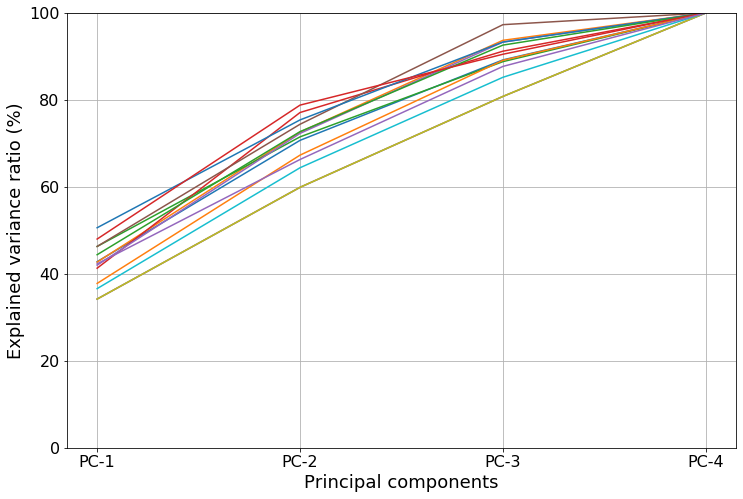

In [107]:
pc_chart = pd.DataFrame(data = pca_order, columns = ['PC-1','PC-2', 'PC-3', 'PC-4'])
pc_1 = pc_chart.T
fig, ax = plt.subplots(figsize=(12, 8))

plt.plot(pc_1)
ax.xaxis.grid(True, which='major')
ax.yaxis.grid(True, which='major')
plt.ylabel('Explained variance ratio (%)', size=18)
plt.xlabel('Principal components', size=18)
plt.tick_params(labelsize=16)
plt.ylim(0,100)
# plt.savefig('C:/Users/Tenyu/Desktop/Recovery time identification and detection/' + 'pca_20169.png')
plt.show()

[[ 0.08886622 -0.00486049  0.04868513 -0.00553269]
 [-0.00486049  0.087374   -0.02183528  0.01695593]
 [ 0.04868513 -0.02183528  0.07437993  0.0148901 ]
 [-0.00553269  0.01695593  0.0148901   0.06571696]]
[0.13749111 0.02082209 0.06522209 0.09280182]
[[ 6.80652501e-01 -5.11198494e-01 -4.59751857e-01  2.53014827e-01]
 [-3.47287636e-01  2.95012425e-01 -4.06314374e-01  7.92002270e-01]
 [ 6.45060460e-01  6.97800201e-01  2.67160711e-01  1.59990741e-01]
 [-6.88379840e-04 -4.05855452e-01  7.43076049e-01  5.32089150e-01]]
[0.43463478 0.06582247 0.20617905 0.29336369]


<BarContainer object of 4 artists>

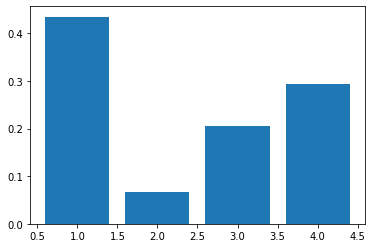

In [72]:
# (1) Noamalization
# (2) PCA
# (3) Feature selection

from numpy import array
from numpy import mean
from numpy import cov
from numpy.linalg import eig

df_pca = df_line[3]
df_pca = df_pca[['ACC_DIFF', 'TT_DIFF', 'LINE_DIFF', 'EXIT_DIFF']]
X = df_pca.values
min_max_scaler = preprocessing.MinMaxScaler()
A = min_max_scaler.fit_transform(X)
M = mean(A.T, axis=1)
C = A - M
V = cov(C.T)
print(V)
eigenvals, eigenvecs = eig(V)
print(eigenvals)
print(eigenvecs)

exp_var =eigenvals/sum(eigenvals)
print(exp_var)
plt.bar(range(1,5),exp_var)

In [36]:
import pandas as pd
import pylab as pl
from sklearn import datasets
from sklearn.decomposition import PCA

df_pca = df_line[8]
df = df_pca[['TT_DIFF', 'ACC_DIFF', 'LINE_DIFF', 'EXIT_DIFF']]

# normalize data
from sklearn import preprocessing
data_scaled = pd.DataFrame(preprocessing.scale(df),columns = df.columns) 

# PCA
pca = PCA(n_components=4)
pca.fit_transform(data_scaled)

pca_data = pd.DataFrame(pca.components_,columns=data_scaled.columns,index = ['PC-1','PC-2', 'PC-3', 'PC-4'])

covar_matrix.fit(data_scaled)
variance = covar_matrix.explained_variance_ratio_ #calculate variance ratios

var_data = np.cumsum(np.round(covar_matrix.explained_variance_ratio_, decimals=3)*100)
var_data #cumulative sum of variance explained with [n] features




NameError: name 'covar_matrix' is not defined

In [39]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from sklearn import decomposition
from sklearn.preprocessing import scale
from sklearn.decomposition import PCA
import seaborn as sb

df_pca = df_line[8]
df_pca = df_pca[['TT_DIFF', 'ACC_DIFF', 'LINE_DIFF', 'EXIT_DIFF']]
X = df_pca.values
X = scale(X)
covar_matrix = PCA(n_components =4)
covar_matrix.fit(X)
variance = covar_matrix.explained_variance_ratio_ #calculate variance ratios

var=np.cumsum(np.round(covar_matrix.explained_variance_ratio_, decimals=3)*100)
var #cumulative sum of variance explained with [n] features

array([56.3, 80.5, 95.8, 99.9])

In [ ]:
# Calculate PCA for each train delay 
PCA_sum = []
for i, date in zip(list(range(0, len(df_line))), date_list): 
    df = df_line[i]
    obs_start = 6
    obs_end = 22
    df = df[(df['Time'] >= obs_start) & (df['Time'] <= obs_end)]

    df.plot(x='Time', y='TT_DIFF', figsize=(12,6))
    a = inc_log['Time'].tolist()[i]
    b = inc_log['End_time'].tolist()[i]
    plt.axvline(a, color='red')
    plt.axvline(b, color='red')
    plt.show()


    # PCA: TO comapre the weight for each feature (variable)
    from sklearn.preprocessing import StandardScaler
    data = df[['TT_DIFF', 'ACC_DIFF', 'EXIT_DIFF']]
    X = data.values
    X_std = StandardScaler().fit_transform(X)
    mean_vec = np.mean(X_std, axis=0)
    cov_mat = np.cov(X_std.T)
    eig_vals, eig_vecs = np.linalg.eig(cov_mat)
    eig_pairs = [(np.abs(eig_vals[i]),eig_vecs[:,i]) for i in range(len(eig_vals))]
    eig_pairs.sort(key = lambda x: x[0], reverse= True)
    tot = sum(eig_vals)
    # var_exp = [(i/tot)*100 for i in sorted(eig_vals, reverse=True)] # Individual explained variance
    var_exp = [(i/tot)*100 for i in eig_vals]
    cum_var_exp = np.cumsum(var_exp) # Cumulative explained variance

    plt.figure(figsize=(10, 5))
    plt.bar(range(len(var_exp)), var_exp, alpha=0.3, align='center', label='individual explained variance', color = 'g')
    plt.step(range(len(cum_var_exp)), cum_var_exp, where='mid', label='cumulative explained variance')
    plt.ylabel('Explained variance ratio')
    plt.xlabel('Principal components')

    my_xticks = list(data.columns)
    plt.xticks(range(len(var_exp)), my_xticks)
    plt.legend()
    plt.show()

    pca = pd.DataFrame({'variable':['TT_DIFF', 'ACC_DIFF', 'EXIT_DIFF'], date : list(var_exp)})
    PCA_sum.append(pca)


merge = partial(pd.merge, on=['variable'], how='left')
pca_all = reduce(merge, PCA_sum)
inc_cols = pca_all.columns.tolist()
inc_cols.remove('variable')
inc_cols.insert(0, 'variable')
pca_all = pca_all[inc_cols]
pca_all['ave_pca'] = pca_all.iloc[:, 1:].median(axis=1)


# Write fil
# pca_all.to_csv('C:/Users/Tenyu/Desktop/Jan 5th, 2020/' + 'pca_delay_10_over' + '.csv')

In [42]:
%matplotlib inline
%load_ext autoreload
%autoreload 2

partition = gd.generate_xuan_motivating_example(200,500)

import numpy as np
changes = np.cumsum(partition)

fig, ax = plt.subplots(figsize=[16, 4])
for p in changes:
  ax.plot([p,p],[np.min(data),np.max(data)],'r')
for d in range(2):
  ax.plot(data[:,d])

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


ValueError: operands could not be broadcast together with shapes (3,) (1033,2) 

In [98]:
abnormal_col.quantile(0.9)[0]

0.4696869828166572

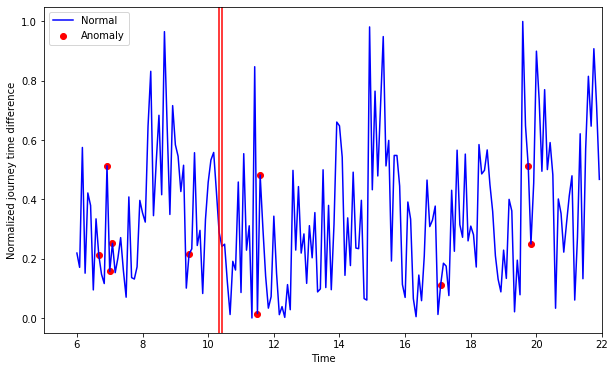

[]
[]
[6.667, 6.917, 7.0, 7.083, 9.417, 11.5, 11.583, 17.083, 19.75, 19.833]
0


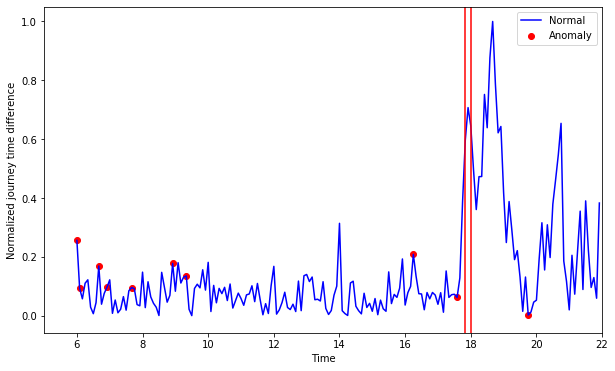

[]
[]
[6.0, 6.083, 6.667, 6.917, 7.667, 8.917, 9.333, 16.25, 17.583, 19.75]
0


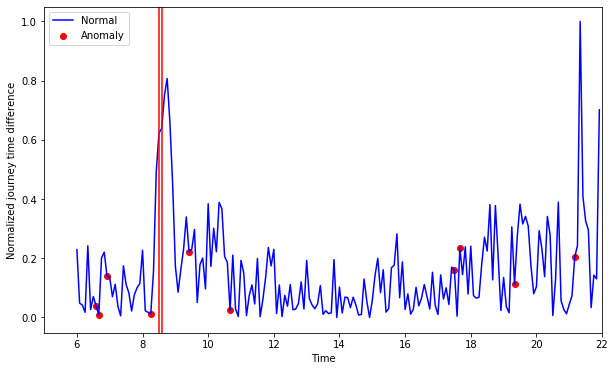

[]
[]
[6.583, 6.667, 6.917, 8.25, 9.417, 10.667, 17.5, 17.667, 19.333, 21.167]
0


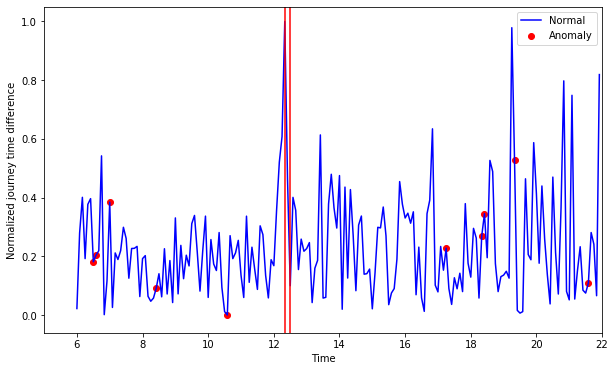

[]
[]
[6.5, 6.583, 7.0, 8.417, 10.583, 17.25, 18.333, 18.417, 19.333, 21.583]
0


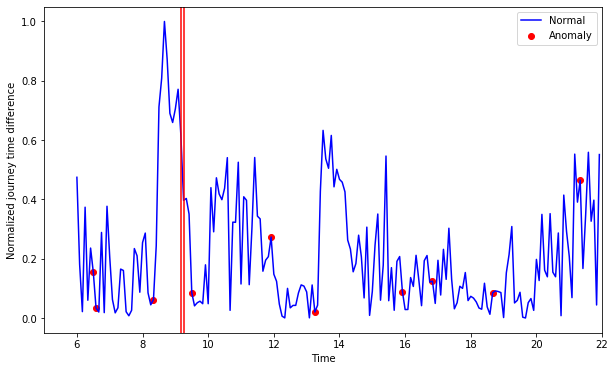

[]
[]
[6.5, 6.583, 8.333, 9.5, 11.917, 13.25, 15.917, 16.833, 18.667, 21.333]
0


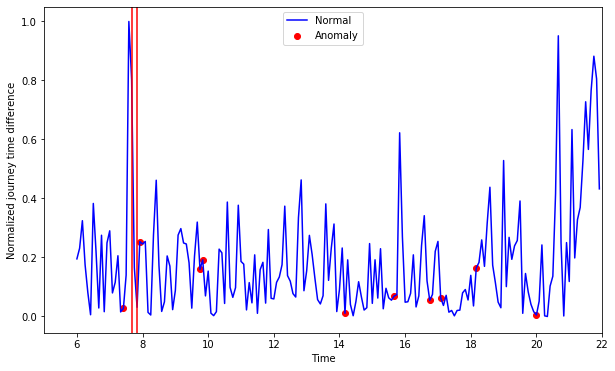

[]
[]
[7.417, 7.917, 9.75, 9.833, 14.167, 15.667, 16.75, 17.083, 18.167, 20.0]
0


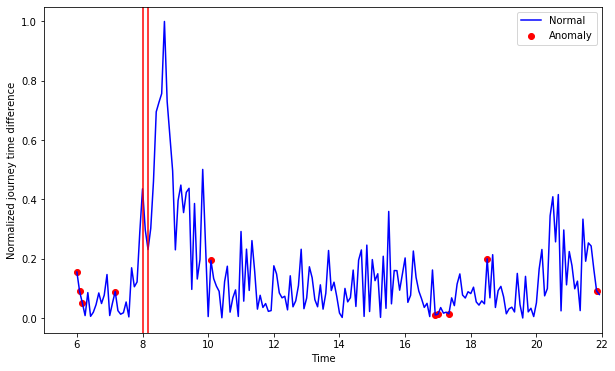

[]
[]
[6.0, 6.083, 6.167, 7.167, 10.083, 16.917, 17.0, 17.333, 18.5, 21.833]
0


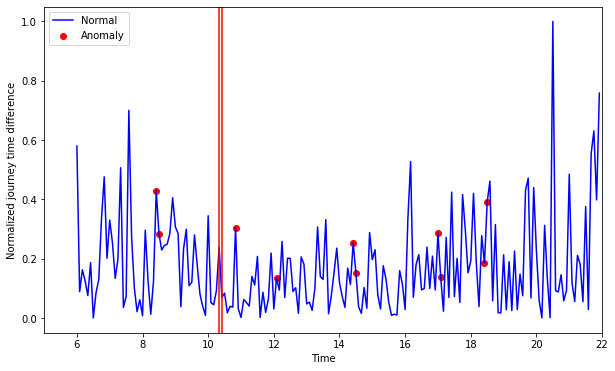

[]
[]
[8.417, 8.5, 10.833, 12.083, 14.417, 14.5, 17.0, 17.083, 18.417, 18.5]
0


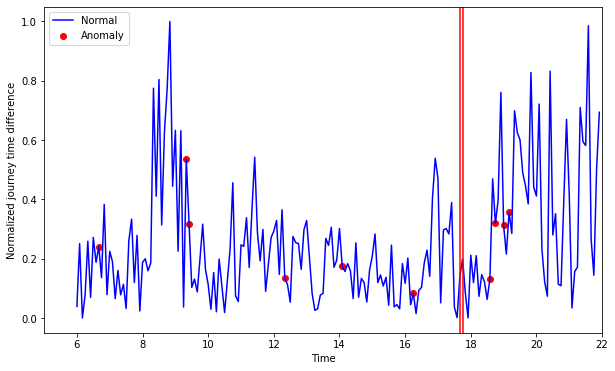

[]
[]
[6.667, 9.333, 9.417, 12.333, 14.083, 16.25, 18.583, 18.75, 19.0, 19.167]
0


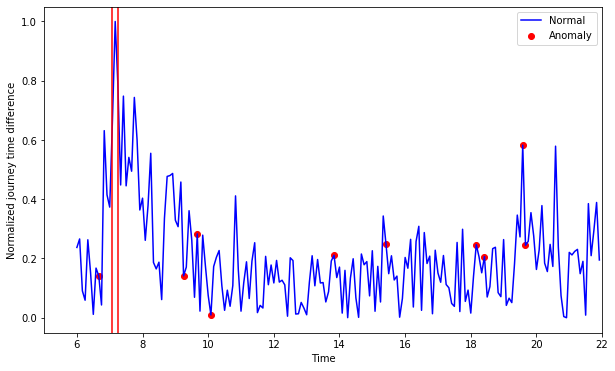

[]
[]
[6.667, 9.25, 9.667, 10.083, 13.833, 15.417, 18.167, 18.417, 19.583, 19.667]
0


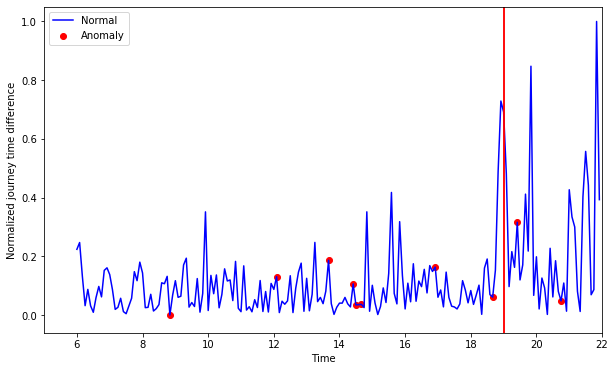

[]
[]
[8.833, 12.083, 13.667, 14.417, 14.5, 14.667, 16.917, 18.667, 19.417, 20.75]
0


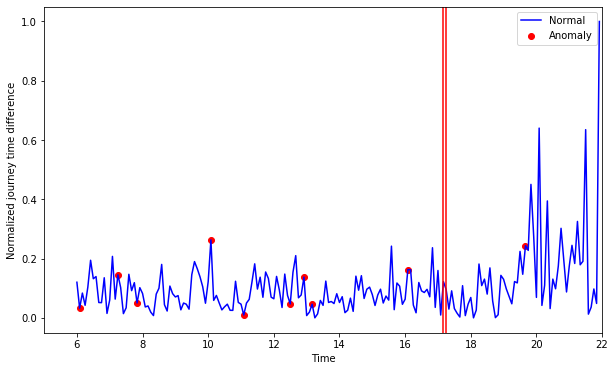

[]
[]
[6.083, 7.25, 7.833, 10.083, 11.083, 12.5, 12.917, 13.167, 16.083, 19.667]
0


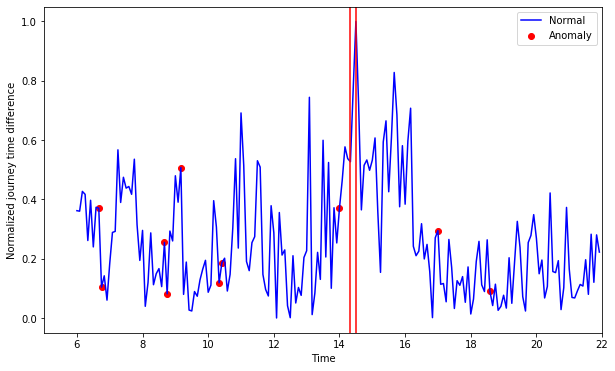

[]
[]
[6.667, 6.75, 8.667, 8.75, 9.167, 10.333, 10.417, 14.0, 17.0, 18.583]
0


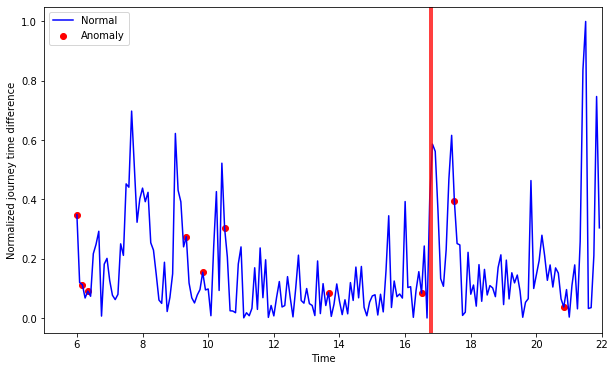

[]
[]
[6.0, 6.167, 6.333, 9.333, 9.833, 10.5, 13.667, 16.5, 17.5, 20.833]
0


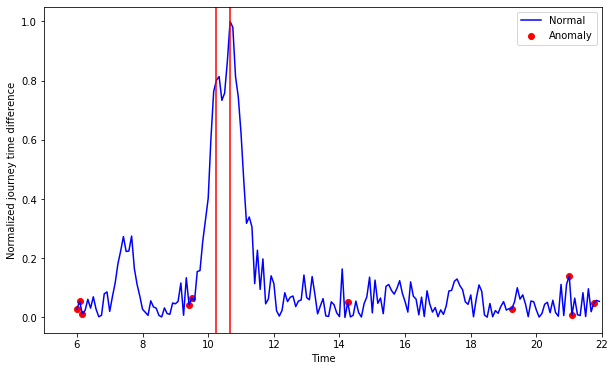

[]
[]
[6.0, 6.083, 6.167, 9.417, 9.5, 14.25, 19.25, 21.0, 21.083, 21.75]
0
Counter({'False': 15})
0
0
0.0


In [99]:
from __future__ import division
import matplotlib.pyplot as plt
import bayesian_changepoint_detection.generate_data as gd
import cProfile
import seaborn
import bayesian_changepoint_detection.offline_changepoint_detection as offcd
from functools import partial

ACC_result = []
BAY_result = []

for i in list(range(0, len(df_line))):
    df = df_line[i][(df_line[i]['Time'] >= start_time_sys) & (df_line[i]['Time'] <= end_time_sys)]

    time = df[['Time']]
    time = time.reset_index()
    del time['index']

    data = df[['ACC_DIFF', 'TT_DIFF', 'LINE_DIFF', 'EXIT_DIFF']]
    min_max_scaler = preprocessing.MinMaxScaler()
    x_scaled = min_max_scaler.fit_transform(data)
    data_1 = pd.DataFrame(x_scaled)
    data = data_1.values

    Q_full, P_full, Pcp_full = offcd.offline_changepoint_detection(data,partial(offcd.const_prior, l=(len(data)+1)),offcd.fullcov_obs_log_likelihood, truncate=-20)
    abnormal_col = pd.DataFrame(data=np.exp(Pcp_full).sum(0))
    df = pd.concat([time, data_1, abnormal_col], axis=1)
    df.columns =  ['Time', 'ACC_DIFF', 'TT_DIFF', 'LINE_DIFF', 'EXIT_DIFF', 'anomaly_1']

    # threshold is based on 90% quantile
    threshold = abnormal_col.quantile(0.90)[0]
    def judge_threshold(row):
        if row['anomaly_1'] > threshold:
            val = 1
        else:
            val = 0
        return val

    df['anomaly'] = df.apply(judge_threshold, axis=1)


    # visualisation of anomaly with cluster view
    fig, ax = plt.subplots(figsize=(10,6))
    a = df.loc[df['anomaly'] == 1, ['Time', 'TT_DIFF']] #anomaly

    ax.plot(df['Time'], df['TT_DIFF'], color='blue', label='Normal')
    ax.scatter(a['Time'],a['TT_DIFF'], color='red', label='Anomaly')
    plt.xlabel('Time')
    plt.ylabel('Normalized journey time difference')

    x1 = inc_log['Time'].tolist()[i]
    x2 = inc_log['End_time'].tolist()[i]
    plt.axvline(x1, color='red')
    plt.axvline(x2, color='red')
    plt.legend()
    plt.xlim(start_time_sys-1, end_time_sys)
    # plt.savefig('C:/Users/Tenyu/Desktop/Jan 5th, 2020/ABNORMAL/' + 'LOF_10_min' + '.png')
    plt.show()



        # The following loop is used to include uncaptured anomaly points
    time_list = list(a['Time'])

    if time_list == []:
        correct_num == 0
    else:
        # The following split list by a certain interval
#         print(time_list)
        l = time_list
        split_list = []
        templist = [l.pop(0)]
        while len(l)>0:
            x = l.pop(0)
            if x - templist[-1] > 0.085:
                split_list.append(templist)
                templist = [x]
            else: 
                templist.append(x)
        split_list.append(templist)
    
 
        matching_1 = [s for s in split_list if x1 in s]
        matching_2 = [s for s in split_list if x2 in s]
        time_list = list(a['Time'])
        
        if (matching_1 == []) and (matching_2 == []):
            correct_num = 0
        elif (matching_1 == []) and (matching_2 != []):
            correct_num = len(matching_2[0])/len(time_list)
        elif (matching_2 == []) and (matching_1 != []):
            correct_num = len(matching_1[0])/len(time_list)
        elif matching_1 == matching_2:
            correct_num = len(matching_1[0])/len(time_list)
        elif (matching_1 != [] and matching_2 != [] and matching_1 != matching_2):
            correct_num = (len(matching_1[0])+len(matching_2[0]))/len(time_list)

            
        #  count how many single value is within a range
        def count(list1, l, r): 
            return len(list(x for x in list1 if l <= x <= r)) 
        count_num_sin = count(time_list, x1, x2)
    
        if (correct_num == 0) and (count_num_sin != 0):
            correct_num = count_num_sin/len(time_list)
        else:
            correct_num
            
    print(matching_1)
    print(matching_2)
    print(time_list)
    accuracy = round(correct_num, 2)
    print(accuracy)
    ACC_result.append(accuracy)    
            
        
    # Judge if the seleced time window contains the abnomal value
    judge = a[(a['Time'] >= x1) & (a['Time'] <= x2)]
    if judge.empty:
        result = 'False'
    else:
        result = 'True'
    BAY_result.append(result)

from collections import Counter
counter = Counter(BAY_result)


# Print out all results
print(counter)
print(min(ACC_result))
print(max(ACC_result))
print(sum(ACC_result)/len(ACC_result))

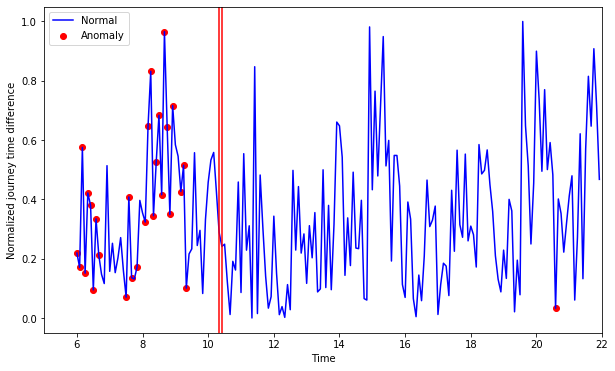

[]
[]
[6.0, 6.083, 6.167, 6.25, 6.333, 6.417, 6.5, 6.583, 6.667, 7.5, 7.583, 7.667, 7.833, 8.083, 8.167, 8.25, 8.333, 8.417, 8.5, 8.583, 8.667, 8.75, 8.833, 8.917, 9.167, 9.25, 9.333, 20.583]
0


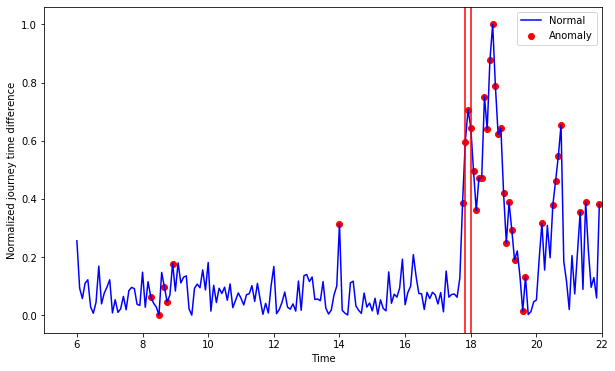

[[17.75, 17.833, 17.917, 18.0, 18.083, 18.167, 18.25, 18.333, 18.417, 18.5, 18.583, 18.667, 18.75, 18.833, 18.917, 19.0, 19.083, 19.167, 19.25, 19.333]]
[[17.75, 17.833, 17.917, 18.0, 18.083, 18.167, 18.25, 18.333, 18.417, 18.5, 18.583, 18.667, 18.75, 18.833, 18.917, 19.0, 19.083, 19.167, 19.25, 19.333]]
[8.25, 8.5, 8.667, 8.75, 8.917, 14.0, 17.75, 17.833, 17.917, 18.0, 18.083, 18.167, 18.25, 18.333, 18.417, 18.5, 18.583, 18.667, 18.75, 18.833, 18.917, 19.0, 19.083, 19.167, 19.25, 19.333, 19.583, 19.667, 20.167, 20.5, 20.583, 20.667, 20.75, 21.333, 21.5, 21.917]
0.56


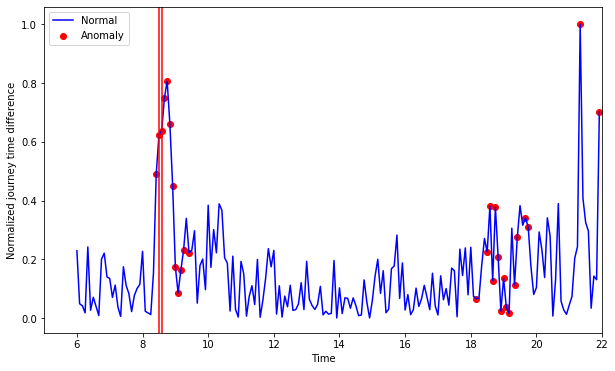

[[8.417, 8.5, 8.583, 8.667, 8.75, 8.833, 8.917, 9.0, 9.083, 9.167, 9.25]]
[[8.417, 8.5, 8.583, 8.667, 8.75, 8.833, 8.917, 9.0, 9.083, 9.167, 9.25]]
[8.417, 8.5, 8.583, 8.667, 8.75, 8.833, 8.917, 9.0, 9.083, 9.167, 9.25, 9.417, 18.167, 18.5, 18.583, 18.667, 18.75, 18.833, 18.917, 19.0, 19.083, 19.167, 19.333, 19.417, 19.667, 19.75, 21.333, 21.917]
0.39


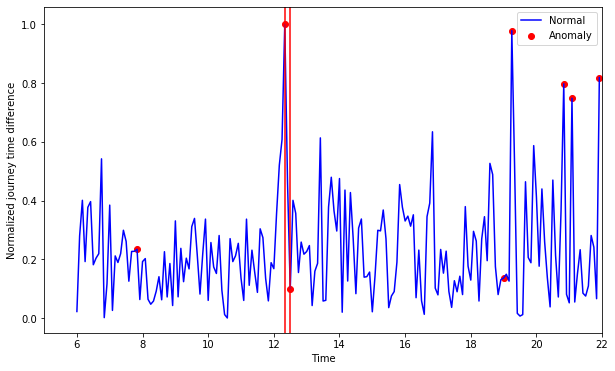

[[12.333]]
[[12.5]]
[7.833, 12.333, 12.5, 19.0, 19.25, 20.833, 21.083, 21.917]
0.25


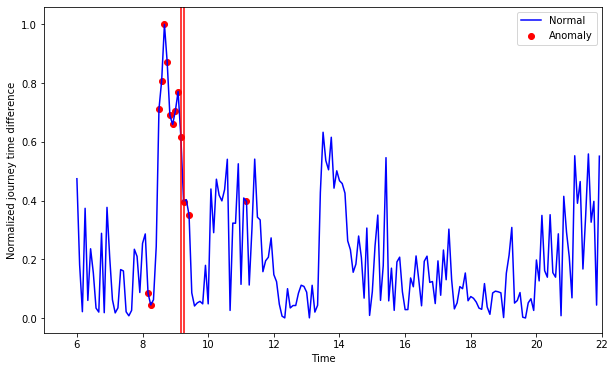

[[8.5, 8.583, 8.667, 8.75, 8.833, 8.917, 9.0, 9.083, 9.167, 9.25]]
[[8.5, 8.583, 8.667, 8.75, 8.833, 8.917, 9.0, 9.083, 9.167, 9.25]]
[8.167, 8.25, 8.5, 8.583, 8.667, 8.75, 8.833, 8.917, 9.0, 9.083, 9.167, 9.25, 9.417, 11.167]
0.71


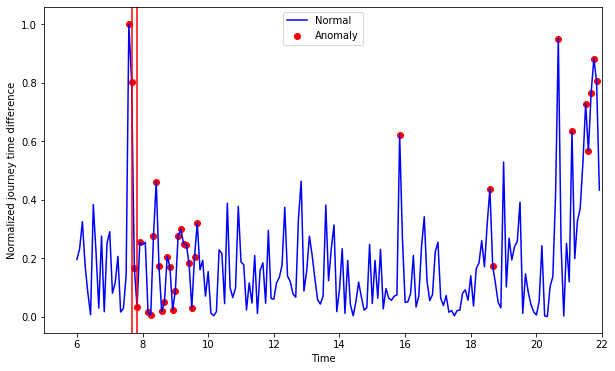

[[7.583, 7.667, 7.75, 7.833, 7.917]]
[[7.583, 7.667, 7.75, 7.833, 7.917]]
[7.583, 7.667, 7.75, 7.833, 7.917, 8.167, 8.25, 8.333, 8.417, 8.5, 8.583, 8.667, 8.75, 8.833, 8.917, 9.0, 9.083, 9.167, 9.25, 9.333, 9.417, 9.5, 9.583, 9.667, 15.833, 18.583, 18.667, 20.667, 21.083, 21.5, 21.583, 21.667, 21.75, 21.833]
0.15


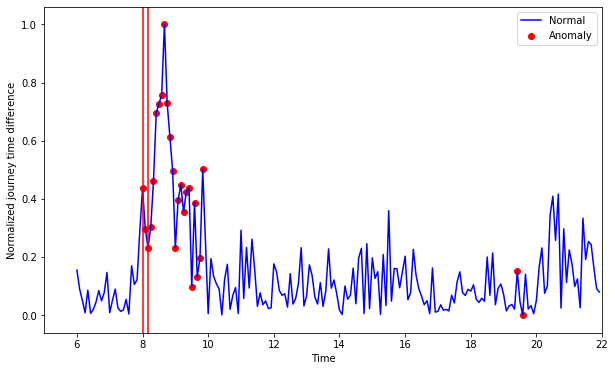

[[8.0, 8.083, 8.167, 8.25, 8.333, 8.417, 8.5, 8.583, 8.667, 8.75, 8.833, 8.917, 9.0, 9.083, 9.167, 9.25, 9.333, 9.417, 9.5, 9.583, 9.667, 9.75, 9.833]]
[[8.0, 8.083, 8.167, 8.25, 8.333, 8.417, 8.5, 8.583, 8.667, 8.75, 8.833, 8.917, 9.0, 9.083, 9.167, 9.25, 9.333, 9.417, 9.5, 9.583, 9.667, 9.75, 9.833]]
[8.0, 8.083, 8.167, 8.25, 8.333, 8.417, 8.5, 8.583, 8.667, 8.75, 8.833, 8.917, 9.0, 9.083, 9.167, 9.25, 9.333, 9.417, 9.5, 9.583, 9.667, 9.75, 9.833, 19.417, 19.583]
0.92


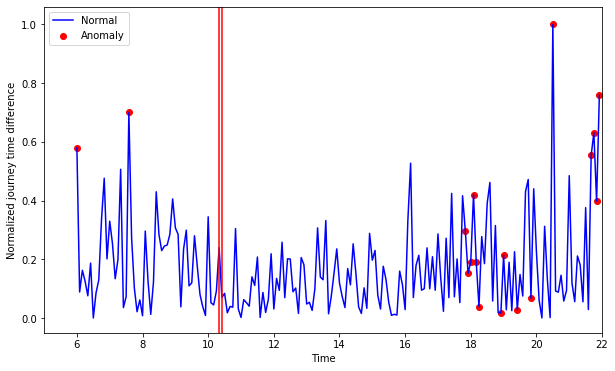

[]
[]
[6.0, 7.583, 17.833, 17.917, 18.0, 18.083, 18.167, 18.25, 18.917, 19.0, 19.417, 19.833, 20.5, 21.667, 21.75, 21.833, 21.917]
0


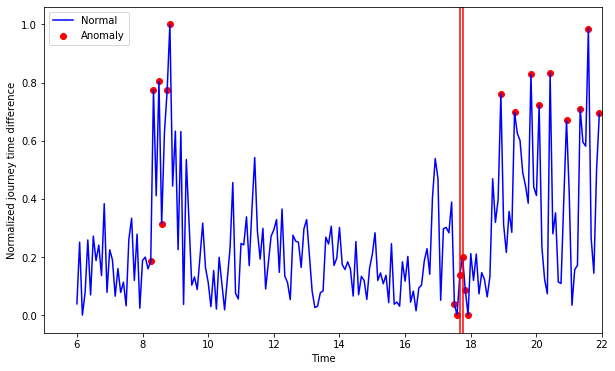

[[17.5, 17.583, 17.667, 17.75, 17.833, 17.917]]
[[17.5, 17.583, 17.667, 17.75, 17.833, 17.917]]
[8.25, 8.333, 8.5, 8.583, 8.75, 8.833, 17.5, 17.583, 17.667, 17.75, 17.833, 17.917, 18.917, 19.333, 19.833, 20.083, 20.417, 20.917, 21.333, 21.583, 21.917]
0.29


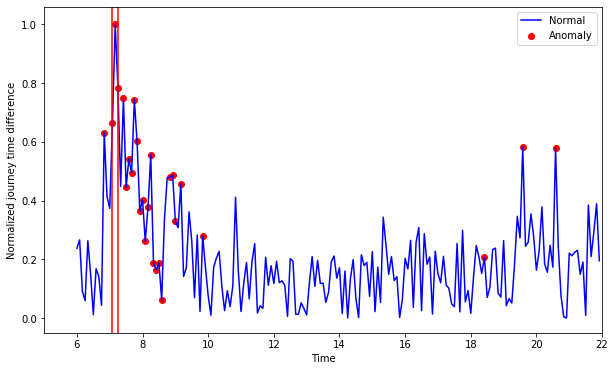

[[7.083, 7.167, 7.25]]
[[7.083, 7.167, 7.25]]
[6.833, 7.083, 7.167, 7.25, 7.417, 7.5, 7.583, 7.667, 7.75, 7.833, 7.917, 8.0, 8.083, 8.167, 8.25, 8.333, 8.417, 8.5, 8.583, 8.833, 8.917, 9.0, 9.167, 9.833, 18.417, 19.583, 20.583]
0.11


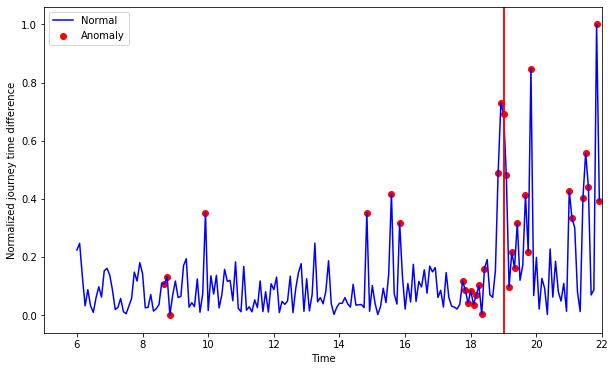

[[18.833, 18.917, 19.0, 19.083, 19.167, 19.25, 19.333, 19.417]]
[[18.833, 18.917, 19.0, 19.083, 19.167, 19.25, 19.333, 19.417]]
[8.667, 8.75, 8.833, 9.917, 14.833, 15.583, 15.833, 17.75, 17.833, 17.917, 18.0, 18.083, 18.167, 18.25, 18.333, 18.417, 18.833, 18.917, 19.0, 19.083, 19.167, 19.25, 19.333, 19.417, 19.667, 19.75, 19.833, 21.0, 21.083, 21.417, 21.5, 21.583, 21.833, 21.917]
0.24


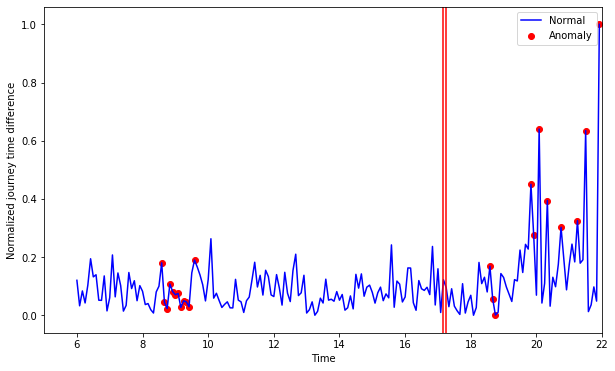

[]
[]
[8.583, 8.667, 8.75, 8.833, 8.917, 9.0, 9.083, 9.167, 9.25, 9.333, 9.417, 9.583, 18.583, 18.667, 18.75, 19.833, 19.917, 20.083, 20.333, 20.75, 21.25, 21.5, 21.917]
0


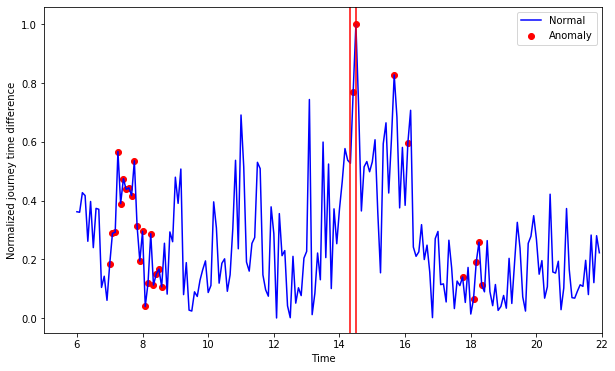

[]
[[14.417, 14.5]]
[7.0, 7.083, 7.167, 7.25, 7.333, 7.417, 7.5, 7.583, 7.667, 7.75, 7.833, 7.917, 8.0, 8.083, 8.167, 8.25, 8.333, 8.417, 8.5, 8.583, 14.417, 14.5, 15.667, 16.083, 17.75, 18.083, 18.167, 18.25, 18.333]
0.07


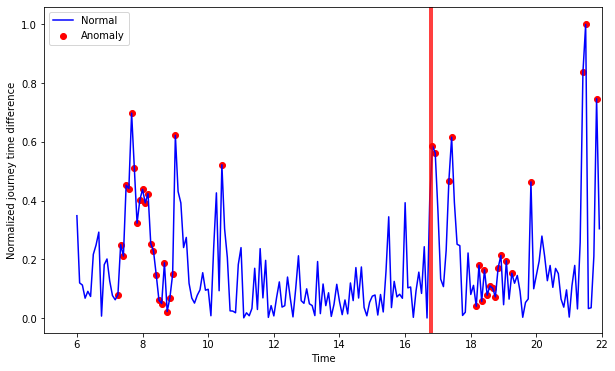

[]
[[16.833, 16.917]]
[7.25, 7.333, 7.417, 7.5, 7.583, 7.667, 7.75, 7.833, 7.917, 8.0, 8.083, 8.167, 8.25, 8.333, 8.417, 8.5, 8.583, 8.667, 8.75, 8.833, 8.917, 9.0, 10.417, 16.833, 16.917, 17.333, 17.417, 18.167, 18.25, 18.333, 18.417, 18.5, 18.583, 18.667, 18.75, 18.833, 18.917, 19.083, 19.25, 19.833, 21.417, 21.5, 21.833]
0.05


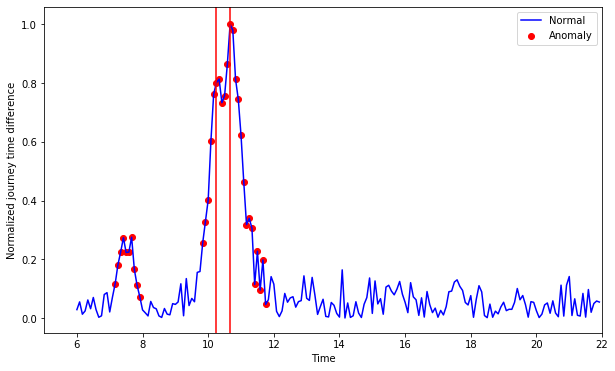

[[9.833, 9.917, 10.0, 10.083, 10.167, 10.25, 10.333, 10.417, 10.5, 10.583, 10.667, 10.75, 10.833, 10.917, 11.0, 11.083, 11.167, 11.25, 11.333, 11.417, 11.5, 11.583, 11.667, 11.75]]
[[9.833, 9.917, 10.0, 10.083, 10.167, 10.25, 10.333, 10.417, 10.5, 10.583, 10.667, 10.75, 10.833, 10.917, 11.0, 11.083, 11.167, 11.25, 11.333, 11.417, 11.5, 11.583, 11.667, 11.75]]
[7.167, 7.25, 7.333, 7.417, 7.5, 7.583, 7.667, 7.75, 7.833, 7.917, 9.833, 9.917, 10.0, 10.083, 10.167, 10.25, 10.333, 10.417, 10.5, 10.583, 10.667, 10.75, 10.833, 10.917, 11.0, 11.083, 11.167, 11.25, 11.333, 11.417, 11.5, 11.583, 11.667, 11.75]
0.71
Counter({True: 12, False: 3})
0
0.92
0.29666666666666663


In [96]:
# Anomal detection in time series: boxplot
ACC_result = []
BOX_result = []

for i in list(range(0, len(df_line))):

    df = df_line[i][(df_line[i]['Time'] >= start_time_sys) & (df_line[i]['Time'] <= end_time_sys)]
    time = df[['Time']]
    time = time.reset_index()
    del time['index']
    X = df[['ACC_DIFF', 'TT_DIFF', 'LINE_DIFF', 'EXIT_DIFF']]

    # Normalize the dataset
    min_max_scaler = preprocessing.MinMaxScaler()
    x_scaled = min_max_scaler.fit_transform(X)
    data_1 = pd.DataFrame(x_scaled)
    data_1.columns = ['ACC_DIFF', 'TT_DIFF', 'LINE_DIFF', 'EXIT_DIFF']
    result_box = pd.concat([time, data_1], axis=1)


    # boxplot 
        # define IQR (Interquartile range)
    acc_Q1 = result_box['ACC_DIFF'].quantile(0.25)
    acc_Q3 = result_box['ACC_DIFF'].quantile(0.75)
    acc_IQR = acc_Q3 - acc_Q1

    line_Q1 = result_box['LINE_DIFF'].quantile(0.25)
    line_Q3 = result_box['LINE_DIFF'].quantile(0.75)
    line_IQR = line_Q3 - line_Q1

    tt_Q1 = result_box['TT_DIFF'].quantile(0.25)
    tt_Q3 = result_box['TT_DIFF'].quantile(0.75)
    tt_IQR = tt_Q3 - tt_Q1

    exit_Q1 = result_box['EXIT_DIFF'].quantile(0.25)
    exit_Q3 = result_box['EXIT_DIFF'].quantile(0.75)
    exit_IQR = exit_Q3 - exit_Q1

    def judge_threshold(row):
        if (tt_Q1 - 1.5*tt_IQR > row['TT_DIFF']) or (row['TT_DIFF'] > tt_Q3 + 1.5*tt_IQR ):
            val = 1
        elif (exit_Q1 - 1.5*exit_IQR > row['EXIT_DIFF']) or (row['EXIT_DIFF'] > exit_Q3 + 1.5*exit_IQR ):
            val = 1
        elif (acc_Q1 - 1.5*acc_IQR > row['ACC_DIFF']) or (row['ACC_DIFF'] > acc_Q3 + 1.5*acc_IQR ):
            val = 1
        elif (line_Q1 - 1.5*line_IQR > row['LINE_DIFF']) or (row['LINE_DIFF'] > line_Q3 + 1.5*line_IQR ):
            val =1
        else:
            val = 0
        return val

    result_box['anomaly'] = result_box.apply(judge_threshold, axis=1)

    # visualisation of anomaly with cluster view
    fig, ax = plt.subplots(figsize=(10,6))
    a = result_box.loc[result_box['anomaly'] == 1, ['Time', 'TT_DIFF']] #anomaly

    ax.plot(result_box['Time'], result_box['TT_DIFF'], color='blue', label='Normal')
    ax.scatter(a['Time'],a['TT_DIFF'], color='red', label='Anomaly')
    plt.xlabel('Time')
    plt.ylabel('Normalized journey time difference')

    x1 = inc_log['Time'].tolist()[i]
    x2 = inc_log['End_time'].tolist()[i]
    plt.axvline(x1, color='red')
    plt.axvline(x2, color='red')
    plt.legend()
    plt.xlim(start_time_sys-1, end_time_sys)
    # plt.savefig('C:/Users/Tenyu/Desktop/Jan 5th, 2020/ABNORMAL/' + 'LOF_10_min' + '.png')
    plt.show()

    
        # The following loop is used to include uncaptured anomaly points
    time_list = list(a['Time'])

    if time_list == []:
        correct_num == 0
    else:
        # The following split list by a certain interval
#         print(time_list)
        l = time_list
        split_list = []
        templist = [l.pop(0)]
        while len(l)>0:
            x = l.pop(0)
            if x - templist[-1] > 0.085:
                split_list.append(templist)
                templist = [x]
            else: 
                templist.append(x)
        split_list.append(templist)
    
 
        matching_1 = [s for s in split_list if x1 in s]
        matching_2 = [s for s in split_list if x2 in s]
        time_list = list(a['Time'])
        
        if (matching_1 == []) and (matching_2 == []):
            correct_num = 0
        elif (matching_1 == []) and (matching_2 != []):
            correct_num = len(matching_2[0])/len(time_list)
        elif (matching_2 == []) and (matching_1 != []):
            correct_num = len(matching_1[0])/len(time_list)
        elif matching_1 == matching_2:
            correct_num = len(matching_1[0])/len(time_list)
        elif (matching_1 != [] and matching_2 != [] and matching_1 != matching_2):
            correct_num = (len(matching_1[0])+len(matching_2[0]))/len(time_list)

            
        #  count how many single value is within a range
        def count(list1, l, r): 
            return len(list(x for x in list1 if l <= x <= r)) 
        count_num_sin = count(time_list, x1, x2)
    
        if (correct_num == 0) and (count_num_sin != 0):
            correct_num = count_num_sin/len(time_list)
        else:
            correct_num
            
    print(matching_1)
    print(matching_2)
    print(time_list)
    accuracy = round(correct_num, 2)
    print(accuracy)
    ACC_result.append(accuracy)    
            
        
    judge = result_box[(result_box['Time'] >= x1) & (result_box['Time'] <= x2)]
    result = (judge['anomaly'] == 1).any()
    BOX_result.append(result)

    
from collections import Counter
counter = Counter(BOX_result)

# Print out all results
print(counter)
print(min(ACC_result))
print(max(ACC_result))
print(sum(ACC_result)/len(ACC_result))

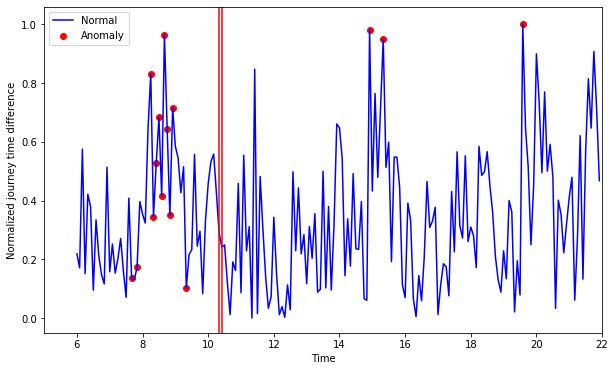

[]
[]
[7.667, 7.833, 8.25, 8.333, 8.417, 8.5, 8.583, 8.667, 8.75, 8.833, 8.917, 9.333, 14.917, 15.333, 19.583]
0


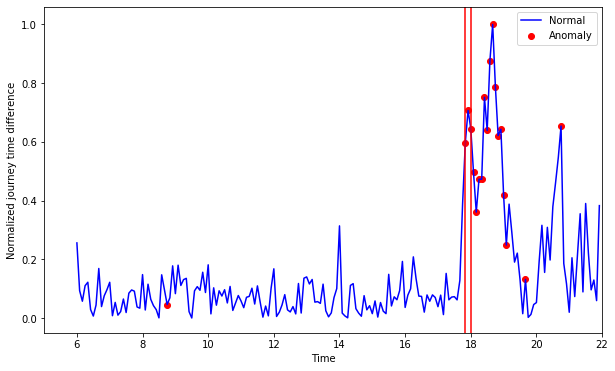

[[17.833, 17.917, 18.0, 18.083, 18.167, 18.25, 18.333, 18.417, 18.5, 18.583, 18.667, 18.75, 18.833, 18.917, 19.0, 19.083]]
[[17.833, 17.917, 18.0, 18.083, 18.167, 18.25, 18.333, 18.417, 18.5, 18.583, 18.667, 18.75, 18.833, 18.917, 19.0, 19.083]]
[8.75, 17.833, 17.917, 18.0, 18.083, 18.167, 18.25, 18.333, 18.417, 18.5, 18.583, 18.667, 18.75, 18.833, 18.917, 19.0, 19.083, 19.667, 20.75]
0.84


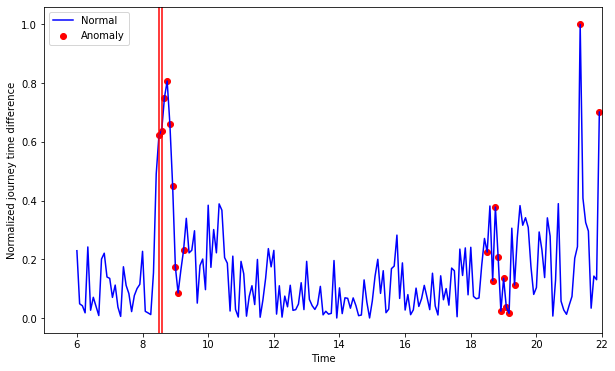

[[8.5, 8.583, 8.667, 8.75, 8.833, 8.917, 9.0, 9.083]]
[[8.5, 8.583, 8.667, 8.75, 8.833, 8.917, 9.0, 9.083]]
[8.5, 8.583, 8.667, 8.75, 8.833, 8.917, 9.0, 9.083, 9.25, 18.5, 18.667, 18.75, 18.833, 18.917, 19.0, 19.083, 19.167, 19.333, 21.333, 21.917]
0.4


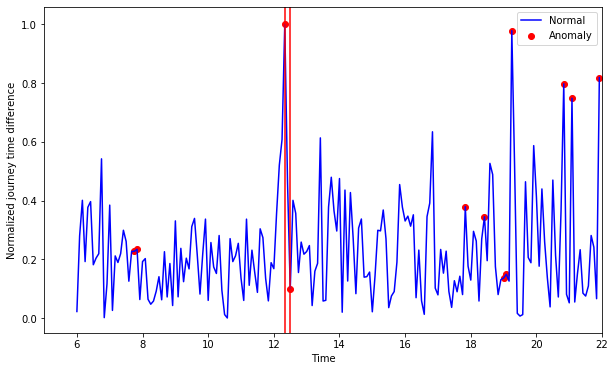

[[12.333]]
[[12.5]]
[7.75, 7.833, 12.333, 12.5, 17.833, 18.417, 19.0, 19.083, 19.25, 20.833, 21.083, 21.917]
0.17


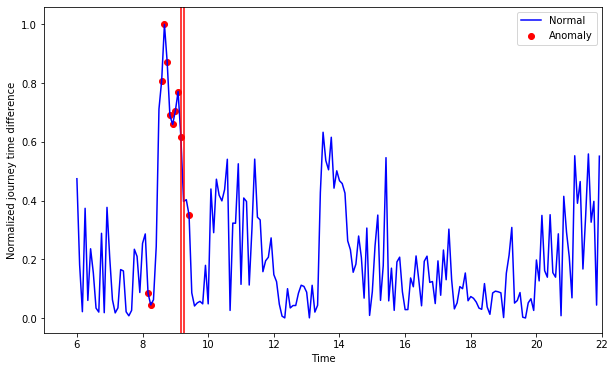

[[8.583, 8.667, 8.75, 8.833, 8.917, 9.0, 9.083, 9.167]]
[]
[8.167, 8.25, 8.583, 8.667, 8.75, 8.833, 8.917, 9.0, 9.083, 9.167, 9.417]
0.73


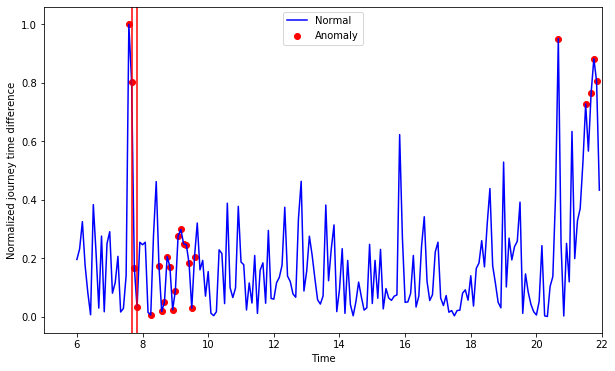

[[7.583, 7.667, 7.75, 7.833]]
[[7.583, 7.667, 7.75, 7.833]]
[7.583, 7.667, 7.75, 7.833, 8.25, 8.5, 8.583, 8.667, 8.75, 8.833, 8.917, 9.0, 9.083, 9.167, 9.25, 9.333, 9.417, 9.5, 9.583, 20.667, 21.5, 21.667, 21.75, 21.833]
0.17


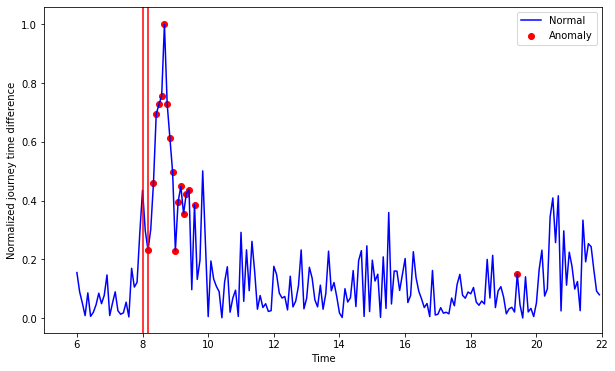

[]
[[8.167]]
[8.167, 8.333, 8.417, 8.5, 8.583, 8.667, 8.75, 8.833, 8.917, 9.0, 9.083, 9.167, 9.25, 9.333, 9.417, 9.583, 19.417]
0.06


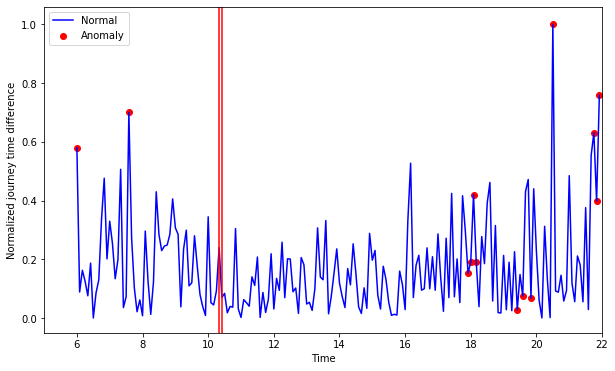

[]
[]
[6.0, 7.583, 17.917, 18.0, 18.083, 18.167, 19.417, 19.583, 19.833, 20.5, 21.75, 21.833, 21.917]
0


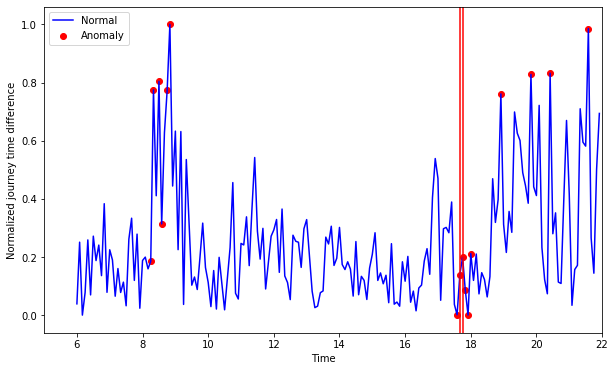

[[17.583, 17.667, 17.75, 17.833, 17.917, 18.0]]
[[17.583, 17.667, 17.75, 17.833, 17.917, 18.0]]
[8.25, 8.333, 8.5, 8.583, 8.75, 8.833, 17.583, 17.667, 17.75, 17.833, 17.917, 18.0, 18.917, 19.833, 20.417, 21.583]
0.38


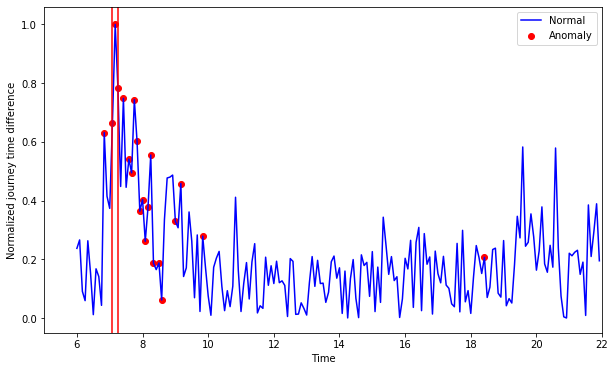

[[7.083, 7.167, 7.25]]
[[7.083, 7.167, 7.25]]
[6.833, 7.083, 7.167, 7.25, 7.417, 7.583, 7.667, 7.75, 7.833, 7.917, 8.0, 8.083, 8.167, 8.25, 8.333, 8.5, 8.583, 9.0, 9.167, 9.833, 18.417]
0.14


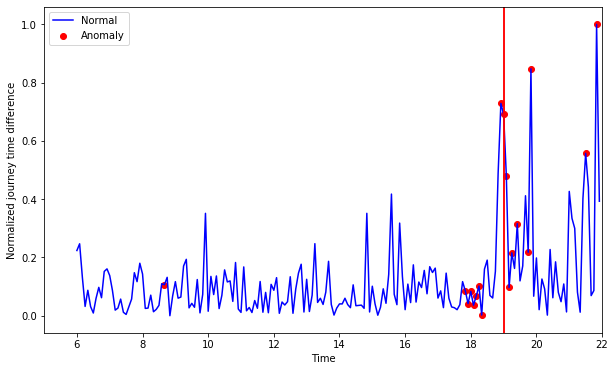

[[18.917, 19.0, 19.083, 19.167, 19.25]]
[[18.917, 19.0, 19.083, 19.167, 19.25]]
[8.667, 17.833, 17.917, 18.0, 18.083, 18.167, 18.25, 18.333, 18.917, 19.0, 19.083, 19.167, 19.25, 19.417, 19.75, 19.833, 21.5, 21.833]
0.28


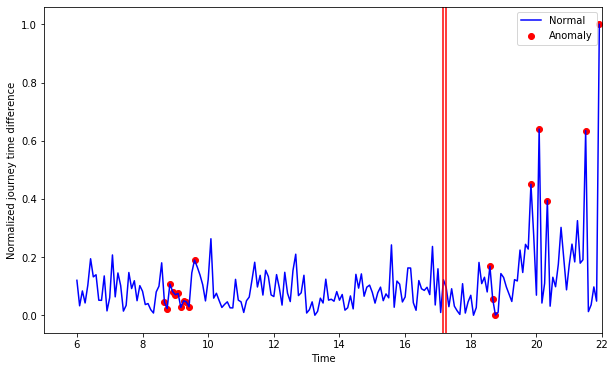

[]
[]
[8.667, 8.75, 8.833, 8.917, 9.0, 9.083, 9.167, 9.25, 9.333, 9.417, 9.583, 18.583, 18.667, 18.75, 19.833, 20.083, 20.333, 21.5, 21.917]
0


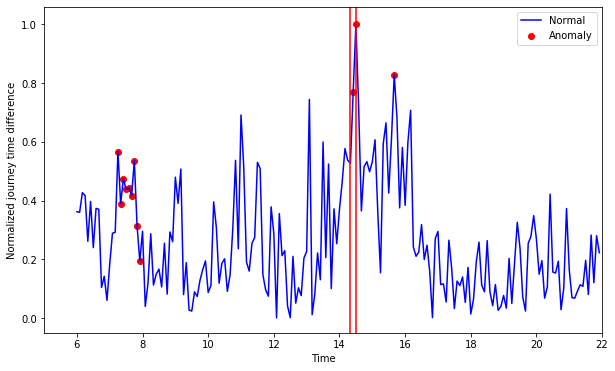

[]
[[14.417, 14.5]]
[7.25, 7.333, 7.417, 7.5, 7.583, 7.667, 7.75, 7.833, 7.917, 14.417, 14.5, 15.667]
0.17


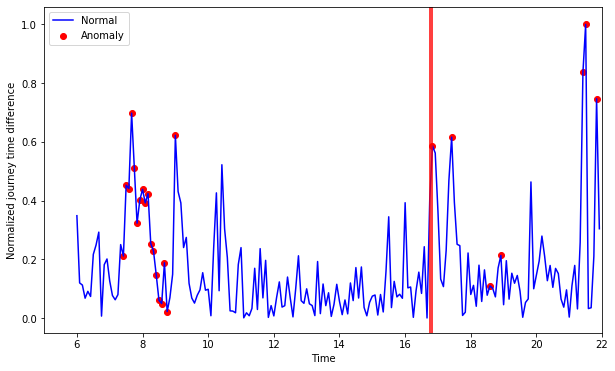

[]
[[16.833]]
[7.417, 7.5, 7.583, 7.667, 7.75, 7.833, 7.917, 8.0, 8.083, 8.167, 8.25, 8.333, 8.417, 8.5, 8.583, 8.667, 8.75, 9.0, 16.833, 17.417, 18.583, 18.917, 21.417, 21.5, 21.833]
0.04


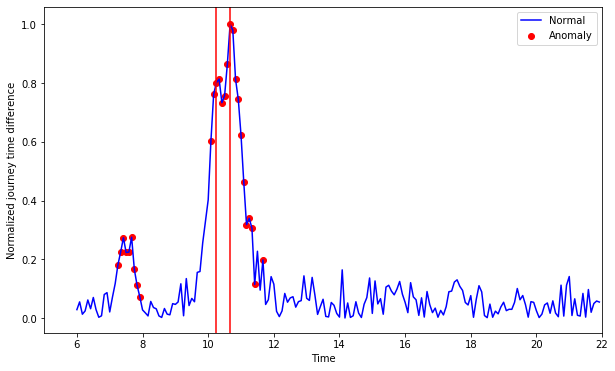

[[10.083, 10.167, 10.25, 10.333, 10.417, 10.5, 10.583, 10.667, 10.75, 10.833, 10.917, 11.0, 11.083, 11.167, 11.25, 11.333, 11.417]]
[[10.083, 10.167, 10.25, 10.333, 10.417, 10.5, 10.583, 10.667, 10.75, 10.833, 10.917, 11.0, 11.083, 11.167, 11.25, 11.333, 11.417]]
[7.25, 7.333, 7.417, 7.5, 7.583, 7.667, 7.75, 7.833, 7.917, 10.083, 10.167, 10.25, 10.333, 10.417, 10.5, 10.583, 10.667, 10.75, 10.833, 10.917, 11.0, 11.083, 11.167, 11.25, 11.333, 11.417, 11.667]
0.63
Counter({True: 12, False: 3})
0
0.84
0.2673333333333333


In [97]:
# Anomal detection in time series: Z-score
ACC_result = []
Z_result = []
for i in list(range(0, len(df_line))):
    df = df_line[i][(df_line[i]['Time'] >= start_time_sys) & (df_line[i]['Time'] <= end_time_sys)]
    time = df[['Time']]
    time = time.reset_index()
    del time['index']
    X = df[['TT_DIFF', 'EXIT_DIFF', 'ACC_DIFF', 'LINE_DIFF']]

    # Normalize the dataset
    min_max_scaler = preprocessing.MinMaxScaler()
    x_scaled = min_max_scaler.fit_transform(X)
    data_1 = pd.DataFrame(x_scaled)
    data_1.columns = ['TT_DIFF', 'EXIT_DIFF', 'ACC_DIFF', 'LINE_DIFF']
    result_z = pd.concat([time, data_1], axis=1)

    # z-score
    result_z['z_tt'] = (result_z['TT_DIFF'] - data_1['TT_DIFF'].mean())/data_1['TT_DIFF'].std()
    result_z['z_exit'] = (result_z['EXIT_DIFF'] - data_1['EXIT_DIFF'].mean())/data_1['EXIT_DIFF'].std()
    result_z['z_acc'] = (result_z['ACC_DIFF'] - data_1['ACC_DIFF'].mean())/data_1['ACC_DIFF'].std()
    result_z['z_line'] = (result_z['LINE_DIFF'] - data_1['LINE_DIFF'].mean())/data_1['LINE_DIFF'].std()
    
    
    threshold = 2.5
    def judge_threshold(row):
        if (-threshold > row['z_tt']) or (row['z_tt'] > threshold):
            val = 1
        elif (-threshold > row['z_exit']) or (row['z_exit'] > threshold):
            val = 1
        elif (-threshold > row['z_acc']) or (row['z_acc'] > threshold):
            val = 1
        elif (-threshold > row['z_line']) or (row['z_line'] > threshold):
            val = 1
        else:
            val = 0
        return val

    result_z['anomaly'] = result_z.apply(judge_threshold, axis=1)


    # visualisation of anomaly with cluster view
    fig, ax = plt.subplots(figsize=(10,6))
    a = result_z.loc[result_z['anomaly'] == 1, ['Time', 'TT_DIFF']] #anomaly

    ax.plot(result_z['Time'], result_z['TT_DIFF'], color='blue', label='Normal')
    ax.scatter(a['Time'],a['TT_DIFF'], color='red', label='Anomaly')
    plt.xlabel('Time')
    plt.ylabel('Normalized journey time difference')

    x1 = inc_log['Time'].tolist()[i]
    x2 = inc_log['End_time'].tolist()[i]
    plt.axvline(x1, color='red')
    plt.axvline(x2, color='red')
    plt.legend()
    plt.xlim(start_time_sys-1, end_time_sys)
    # plt.savefig('C:/Users/Tenyu/Desktop/Jan 5th, 2020/ABNORMAL/' + 'LOF_10_min' + '.png')
    plt.show()


        # The following loop is used to include uncaptured anomaly points
    time_list = list(a['Time'])

    if time_list == []:
        correct_num == 0
    else:
        # The following split list by a certain interval
#         print(time_list)
        l = time_list
        split_list = []
        templist = [l.pop(0)]
        while len(l)>0:
            x = l.pop(0)
            if x - templist[-1] > 0.085:
                split_list.append(templist)
                templist = [x]
            else: 
                templist.append(x)
        split_list.append(templist)
    
 
        matching_1 = [s for s in split_list if x1 in s]
        matching_2 = [s for s in split_list if x2 in s]
        time_list = list(a['Time'])
        
        if (matching_1 == []) and (matching_2 == []):
            correct_num = 0
        elif (matching_1 == []) and (matching_2 != []):
            correct_num = len(matching_2[0])/len(time_list)
        elif (matching_2 == []) and (matching_1 != []):
            correct_num = len(matching_1[0])/len(time_list)
        elif matching_1 == matching_2:
            correct_num = len(matching_1[0])/len(time_list)
        elif (matching_1 != [] and matching_2 != [] and matching_1 != matching_2):
            correct_num = (len(matching_1[0])+len(matching_2[0]))/len(time_list)

            
        #  count how many single value is within a range
        def count(list1, l, r): 
            return len(list(x for x in list1 if l <= x <= r)) 
        count_num_sin = count(time_list, x1, x2)
    
        if (correct_num == 0) and (count_num_sin != 0):
            correct_num = count_num_sin/len(time_list)
        else:
            correct_num
            
    print(matching_1)
    print(matching_2)
    print(time_list)
    accuracy = round(correct_num, 2)
    print(accuracy)
    ACC_result.append(accuracy)    
            
        
    judge = result_z[(result_z['Time'] >= x1) & (result_z['Time'] <= x2)]
    result = (judge['anomaly'] == 1).any()
    Z_result.append(result)

    
from collections import Counter
counter = Counter(Z_result)

# Print out all results
print(counter)
print(min(ACC_result))
print(max(ACC_result))
print(sum(ACC_result)/len(ACC_result))

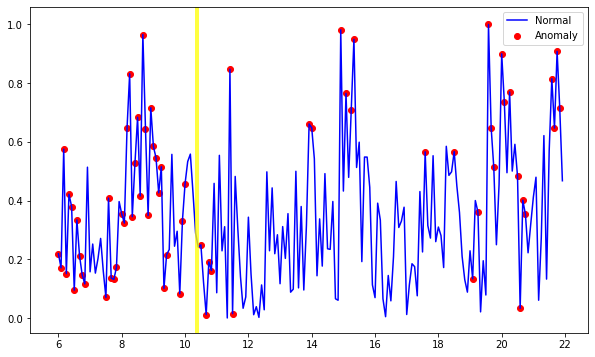

[]
[]
[6.0, 6.083, 6.167, 6.25, 6.333, 6.417, 6.5, 6.583, 6.667, 6.75, 6.833, 7.5, 7.583, 7.667, 7.75, 7.833, 8.0, 8.083, 8.167, 8.25, 8.333, 8.417, 8.5, 8.583, 8.667, 8.75, 8.833, 8.917, 9.0, 9.083, 9.167, 9.25, 9.333, 9.417, 9.833, 9.917, 10.0, 10.5, 10.667, 10.75, 10.833, 11.417, 11.5, 13.917, 14.0, 14.917, 15.083, 15.25, 15.333, 17.583, 18.5, 19.083, 19.25, 19.583, 19.667, 19.75, 20.0, 20.083, 20.25, 20.5, 20.583, 20.667, 20.75, 21.583, 21.667, 21.75, 21.833]
0


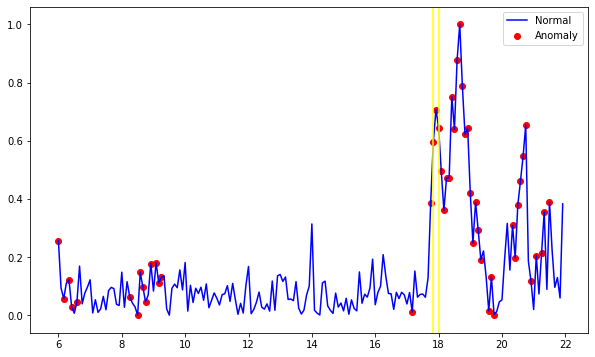

[[17.75, 17.833, 17.917, 18.0, 18.083, 18.167, 18.25, 18.333, 18.417, 18.5, 18.583, 18.667, 18.75, 18.833, 18.917, 19.0, 19.083, 19.167, 19.25, 19.333]]
[[17.75, 17.833, 17.917, 18.0, 18.083, 18.167, 18.25, 18.333, 18.417, 18.5, 18.583, 18.667, 18.75, 18.833, 18.917, 19.0, 19.083, 19.167, 19.25, 19.333]]
[6.0, 6.167, 6.333, 6.417, 6.583, 8.25, 8.5, 8.583, 8.667, 8.75, 8.917, 9.083, 9.167, 9.25, 17.167, 17.75, 17.833, 17.917, 18.0, 18.083, 18.167, 18.25, 18.333, 18.417, 18.5, 18.583, 18.667, 18.75, 18.833, 18.917, 19.0, 19.083, 19.167, 19.25, 19.333, 19.583, 19.667, 19.75, 20.333, 20.417, 20.5, 20.583, 20.667, 20.75, 20.917, 21.083, 21.25, 21.333, 21.5]
0.41


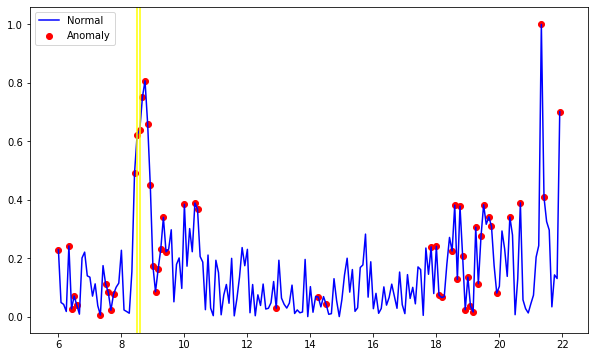

[[8.417, 8.5, 8.583, 8.667, 8.75, 8.833, 8.917, 9.0, 9.083, 9.167, 9.25, 9.333, 9.417]]
[[8.417, 8.5, 8.583, 8.667, 8.75, 8.833, 8.917, 9.0, 9.083, 9.167, 9.25, 9.333, 9.417]]
[6.0, 6.333, 6.417, 6.5, 6.583, 7.333, 7.5, 7.583, 7.667, 7.75, 8.417, 8.5, 8.583, 8.667, 8.75, 8.833, 8.917, 9.0, 9.083, 9.167, 9.25, 9.333, 9.417, 10.0, 10.333, 10.417, 12.917, 14.25, 14.5, 17.833, 18.0, 18.083, 18.167, 18.5, 18.583, 18.667, 18.75, 18.833, 18.917, 19.0, 19.083, 19.167, 19.25, 19.333, 19.417, 19.5, 19.667, 19.75, 19.917, 20.333, 20.667, 21.333, 21.417, 21.917]
0.24


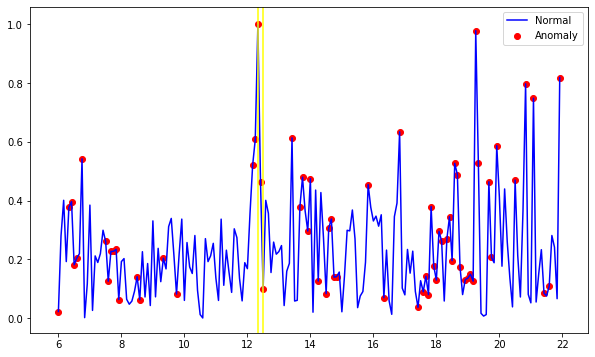

[[12.167, 12.25, 12.333, 12.417, 12.5]]
[[12.167, 12.25, 12.333, 12.417, 12.5]]
[6.0, 6.333, 6.417, 6.5, 6.583, 6.75, 7.5, 7.583, 7.667, 7.75, 7.833, 7.917, 8.5, 8.583, 9.333, 9.75, 12.167, 12.25, 12.333, 12.417, 12.5, 13.417, 13.667, 13.75, 13.917, 14.0, 14.25, 14.5, 14.583, 14.667, 14.75, 14.833, 15.833, 16.333, 16.833, 17.417, 17.583, 17.667, 17.75, 17.833, 17.917, 18.0, 18.083, 18.167, 18.333, 18.417, 18.5, 18.583, 18.667, 18.75, 18.917, 19.0, 19.083, 19.167, 19.25, 19.333, 19.667, 19.75, 19.917, 20.5, 20.833, 21.083, 21.417, 21.583, 21.917]
0.08


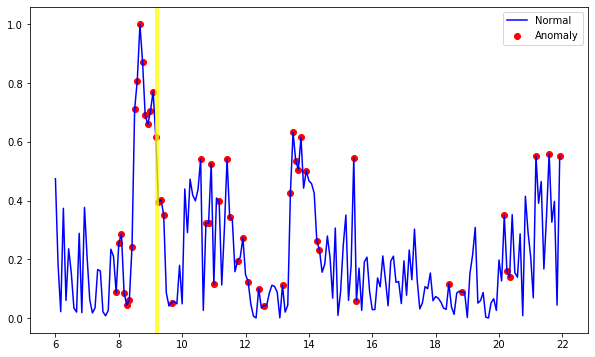

[[7.917, 8.0, 8.083, 8.167, 8.25, 8.333, 8.417, 8.5, 8.583, 8.667, 8.75, 8.833, 8.917, 9.0, 9.083, 9.167, 9.25, 9.333, 9.417]]
[[7.917, 8.0, 8.083, 8.167, 8.25, 8.333, 8.417, 8.5, 8.583, 8.667, 8.75, 8.833, 8.917, 9.0, 9.083, 9.167, 9.25, 9.333, 9.417]]
[7.917, 8.0, 8.083, 8.167, 8.25, 8.333, 8.417, 8.5, 8.583, 8.667, 8.75, 8.833, 8.917, 9.0, 9.083, 9.167, 9.25, 9.333, 9.417, 9.667, 10.583, 10.75, 10.833, 10.917, 11.0, 11.167, 11.417, 11.5, 11.75, 11.917, 12.083, 12.417, 12.583, 13.167, 13.417, 13.5, 13.583, 13.667, 13.75, 13.917, 14.25, 14.333, 15.417, 15.5, 18.417, 18.833, 20.167, 20.25, 20.333, 21.167, 21.583, 21.917]
0.37


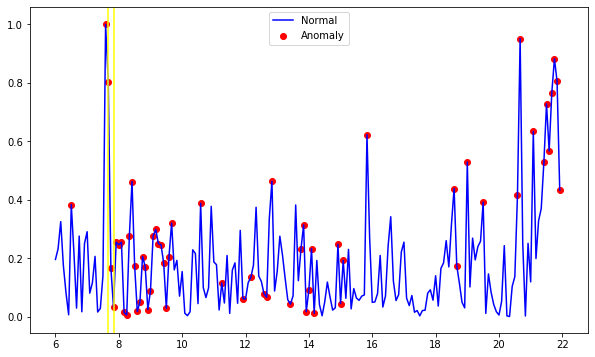

[[7.583, 7.667, 7.75, 7.833, 7.917, 8.0, 8.083, 8.167, 8.25, 8.333, 8.417, 8.5, 8.583, 8.667, 8.75, 8.833, 8.917, 9.0, 9.083, 9.167, 9.25, 9.333, 9.417, 9.5, 9.583, 9.667]]
[[7.583, 7.667, 7.75, 7.833, 7.917, 8.0, 8.083, 8.167, 8.25, 8.333, 8.417, 8.5, 8.583, 8.667, 8.75, 8.833, 8.917, 9.0, 9.083, 9.167, 9.25, 9.333, 9.417, 9.5, 9.583, 9.667]]
[6.5, 7.583, 7.667, 7.75, 7.833, 7.917, 8.0, 8.083, 8.167, 8.25, 8.333, 8.417, 8.5, 8.583, 8.667, 8.75, 8.833, 8.917, 9.0, 9.083, 9.167, 9.25, 9.333, 9.417, 9.5, 9.583, 9.667, 10.583, 11.25, 11.917, 12.167, 12.583, 12.667, 12.833, 13.417, 13.75, 13.833, 13.917, 14.0, 14.083, 14.167, 14.917, 15.0, 15.083, 15.833, 18.583, 18.667, 19.0, 19.5, 20.583, 20.667, 21.083, 21.417, 21.5, 21.583, 21.667, 21.75, 21.833, 21.917]
0.44


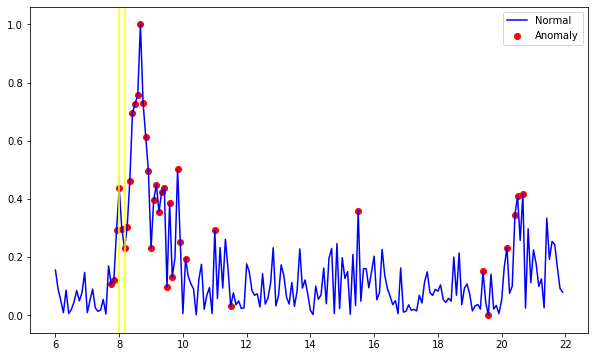

[[7.75, 7.833, 7.917, 8.0, 8.083, 8.167, 8.25, 8.333, 8.417, 8.5, 8.583, 8.667, 8.75, 8.833, 8.917, 9.0, 9.083, 9.167, 9.25, 9.333, 9.417, 9.5, 9.583, 9.667]]
[[7.75, 7.833, 7.917, 8.0, 8.083, 8.167, 8.25, 8.333, 8.417, 8.5, 8.583, 8.667, 8.75, 8.833, 8.917, 9.0, 9.083, 9.167, 9.25, 9.333, 9.417, 9.5, 9.583, 9.667]]
[7.75, 7.833, 7.917, 8.0, 8.083, 8.167, 8.25, 8.333, 8.417, 8.5, 8.583, 8.667, 8.75, 8.833, 8.917, 9.0, 9.083, 9.167, 9.25, 9.333, 9.417, 9.5, 9.583, 9.667, 9.833, 9.917, 10.083, 11.0, 11.5, 15.5, 19.417, 19.583, 20.167, 20.417, 20.5, 20.667]
0.67


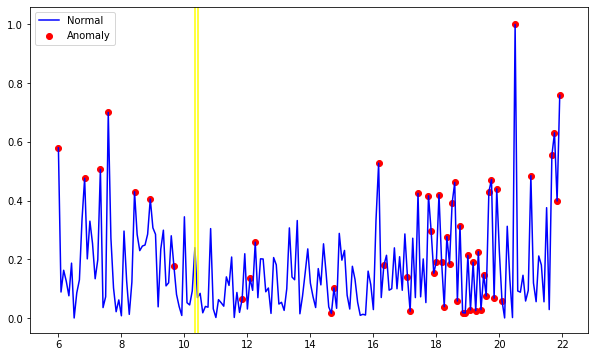

[]
[]
[6.0, 6.833, 7.333, 7.583, 8.417, 8.917, 9.667, 11.833, 12.083, 12.25, 14.667, 14.75, 16.167, 16.333, 17.083, 17.167, 17.417, 17.75, 17.833, 17.917, 18.0, 18.083, 18.167, 18.25, 18.333, 18.417, 18.5, 18.583, 18.667, 18.75, 18.833, 18.917, 19.0, 19.083, 19.167, 19.25, 19.333, 19.417, 19.5, 19.583, 19.667, 19.75, 19.833, 19.917, 20.083, 20.5, 21.0, 21.667, 21.75, 21.833, 21.917]
0


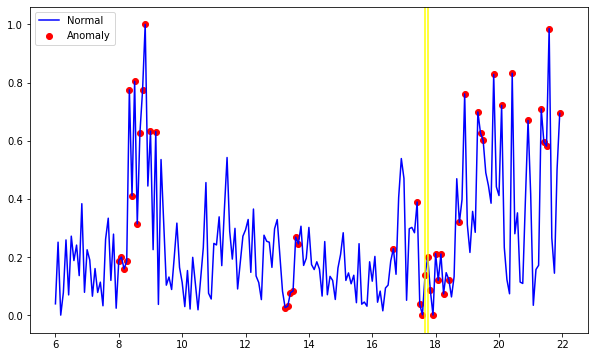

[[17.417, 17.5, 17.583, 17.667, 17.75, 17.833, 17.917, 18.0, 18.083, 18.167, 18.25]]
[[17.417, 17.5, 17.583, 17.667, 17.75, 17.833, 17.917, 18.0, 18.083, 18.167, 18.25]]
[8.0, 8.083, 8.167, 8.25, 8.333, 8.417, 8.5, 8.583, 8.667, 8.75, 8.833, 9.0, 9.167, 13.25, 13.333, 13.417, 13.5, 13.583, 13.667, 16.667, 17.417, 17.5, 17.583, 17.667, 17.75, 17.833, 17.917, 18.0, 18.083, 18.167, 18.25, 18.417, 18.75, 18.917, 19.333, 19.417, 19.5, 19.833, 20.083, 20.417, 20.917, 21.333, 21.417, 21.5, 21.583, 21.917]
0.24


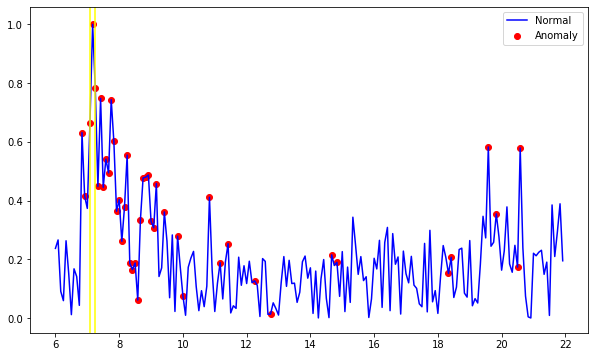

[[7.083, 7.167, 7.25, 7.333, 7.417, 7.5, 7.583, 7.667, 7.75, 7.833, 7.917, 8.0, 8.083, 8.167, 8.25, 8.333, 8.417, 8.5, 8.583, 8.667, 8.75, 8.833, 8.917, 9.0, 9.083, 9.167]]
[[7.083, 7.167, 7.25, 7.333, 7.417, 7.5, 7.583, 7.667, 7.75, 7.833, 7.917, 8.0, 8.083, 8.167, 8.25, 8.333, 8.417, 8.5, 8.583, 8.667, 8.75, 8.833, 8.917, 9.0, 9.083, 9.167]]
[6.833, 6.917, 7.083, 7.167, 7.25, 7.333, 7.417, 7.5, 7.583, 7.667, 7.75, 7.833, 7.917, 8.0, 8.083, 8.167, 8.25, 8.333, 8.417, 8.5, 8.583, 8.667, 8.75, 8.833, 8.917, 9.0, 9.083, 9.167, 9.417, 9.833, 10.0, 10.833, 11.167, 11.417, 12.25, 12.75, 14.667, 14.833, 18.333, 18.417, 19.583, 19.833, 20.5, 20.583]
0.59


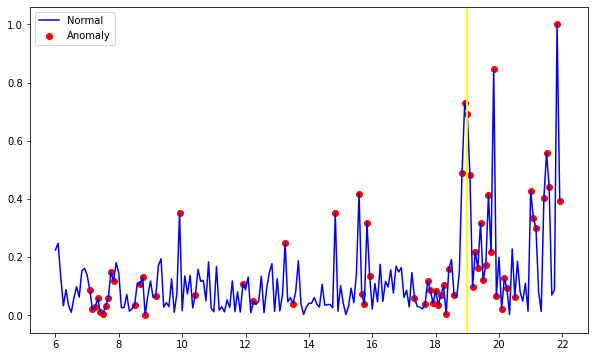

[[18.833, 18.917, 19.0, 19.083, 19.167, 19.25, 19.333, 19.417, 19.5, 19.583, 19.667, 19.75, 19.833, 19.917]]
[[18.833, 18.917, 19.0, 19.083, 19.167, 19.25, 19.333, 19.417, 19.5, 19.583, 19.667, 19.75, 19.833, 19.917]]
[7.083, 7.167, 7.25, 7.333, 7.417, 7.5, 7.583, 7.667, 7.75, 7.833, 8.5, 8.667, 8.75, 8.833, 9.167, 9.917, 10.417, 11.917, 12.25, 13.25, 13.5, 14.833, 15.583, 15.667, 15.75, 15.833, 15.917, 17.333, 17.667, 17.75, 17.833, 17.917, 18.0, 18.083, 18.167, 18.25, 18.333, 18.417, 18.583, 18.833, 18.917, 19.0, 19.083, 19.167, 19.25, 19.333, 19.417, 19.5, 19.583, 19.667, 19.75, 19.833, 19.917, 20.083, 20.167, 20.25, 20.5, 21.0, 21.083, 21.167, 21.417, 21.5, 21.583, 21.833, 21.917]
0.22


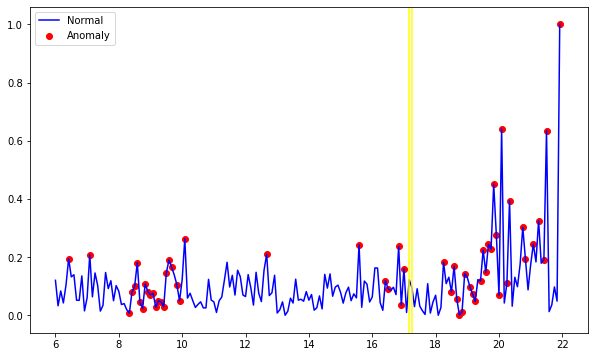

[]
[]
[6.417, 7.083, 8.333, 8.417, 8.5, 8.583, 8.667, 8.75, 8.833, 8.917, 9.0, 9.083, 9.167, 9.25, 9.333, 9.417, 9.5, 9.583, 9.667, 9.833, 9.917, 10.083, 12.667, 15.583, 16.417, 16.5, 16.833, 16.917, 17.0, 18.25, 18.5, 18.583, 18.667, 18.75, 18.833, 18.917, 19.083, 19.167, 19.25, 19.417, 19.5, 19.583, 19.667, 19.75, 19.833, 19.917, 20.0, 20.083, 20.25, 20.333, 20.75, 20.833, 21.083, 21.25, 21.417, 21.5, 21.917]
0


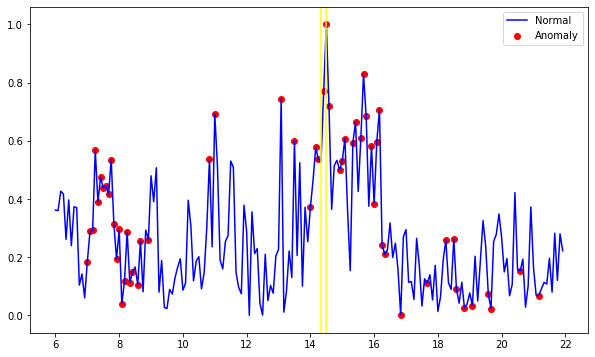

[]
[[14.417, 14.5, 14.583]]
[7.0, 7.083, 7.167, 7.25, 7.333, 7.417, 7.5, 7.583, 7.667, 7.75, 7.833, 7.917, 8.0, 8.083, 8.167, 8.25, 8.333, 8.417, 8.583, 8.667, 8.917, 10.833, 11.0, 13.083, 13.5, 14.0, 14.167, 14.25, 14.417, 14.5, 14.583, 14.917, 15.0, 15.083, 15.333, 15.417, 15.583, 15.667, 15.75, 15.917, 16.0, 16.083, 16.167, 16.25, 16.333, 16.833, 17.667, 18.25, 18.5, 18.583, 18.833, 19.083, 19.583, 19.667, 20.583, 21.167]
0.05


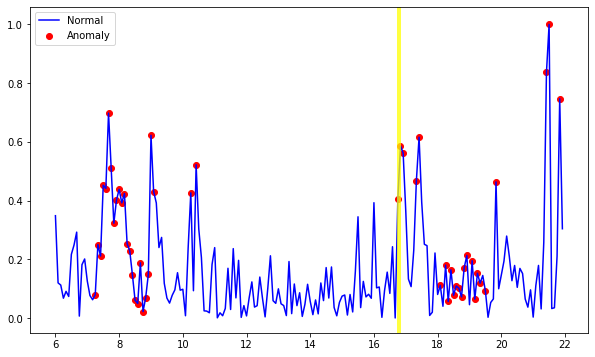

[[16.75, 16.833, 16.917]]
[[16.75, 16.833, 16.917]]
[7.25, 7.333, 7.417, 7.5, 7.583, 7.667, 7.75, 7.833, 7.917, 8.0, 8.083, 8.167, 8.25, 8.333, 8.417, 8.5, 8.583, 8.667, 8.75, 8.833, 8.917, 9.0, 9.083, 10.25, 10.417, 16.75, 16.833, 16.917, 17.333, 17.417, 18.083, 18.25, 18.333, 18.417, 18.5, 18.583, 18.667, 18.75, 18.833, 18.917, 19.083, 19.167, 19.25, 19.333, 19.5, 19.833, 21.417, 21.5, 21.833]
0.06


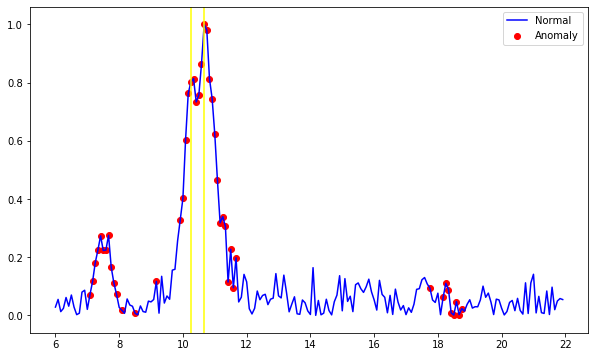

[[9.917, 10.0, 10.083, 10.167, 10.25, 10.333, 10.417, 10.5, 10.583, 10.667, 10.75, 10.833, 10.917, 11.0, 11.083, 11.167, 11.25, 11.333, 11.417, 11.5, 11.583, 11.667]]
[[9.917, 10.0, 10.083, 10.167, 10.25, 10.333, 10.417, 10.5, 10.583, 10.667, 10.75, 10.833, 10.917, 11.0, 11.083, 11.167, 11.25, 11.333, 11.417, 11.5, 11.583, 11.667]]
[7.083, 7.167, 7.25, 7.333, 7.417, 7.5, 7.583, 7.667, 7.75, 7.833, 7.917, 8.083, 8.5, 9.167, 9.917, 10.0, 10.083, 10.167, 10.25, 10.333, 10.417, 10.5, 10.583, 10.667, 10.75, 10.833, 10.917, 11.0, 11.083, 11.167, 11.25, 11.333, 11.417, 11.5, 11.583, 11.667, 17.75, 18.167, 18.25, 18.333, 18.417, 18.5, 18.583, 18.667, 18.75]
0.49
Counter({'True': 12, 'False': 3})
0
0.67
0.25733333333333336


In [105]:
# Anomal detection in time series (Gaussian distribution)
from sklearn.covariance import EllipticEnvelope

ACC_result = []
GAU_result = []
for i in list(range(0, len(df_line))):
    df = df_line[i][df_line[i]['Time'] >= start_time_sys]
    X = df[['ACC_DIFF', 'TT_DIFF', 'LINE_DIFF', 'EXIT_DIFF']]
    
    min_max_scaler = preprocessing.MinMaxScaler()
    x_scaled = min_max_scaler.fit_transform(X)
    data_1 = pd.DataFrame(x_scaled)
    data_1.columns = ['ACC_DIFF', 'TT_DIFF', 'LINE_DIFF', 'EXIT_DIFF']
    
    index_col = df[['Time']]
    index_col = index_col['Time'].reset_index()
    del index_col['index']
    
    
    df = pd.concat([index_col, data_1], axis=1)

    df_class0 = df['TT_DIFF']
    df_class1 = df['EXIT_DIFF']
    df_class2 = df['ACC_DIFF']
    df_class3 = df['LINE_DIFF']
    
    outliers_fraction = 0.1
    
    envelope =  EllipticEnvelope(contamination = outliers_fraction) 
    X_train_0 = df_class0.values.reshape(-1,1)
    envelope.fit(X_train_0)
    df_class0 = pd.DataFrame(df_class0)
    df_class0['deviation'] = envelope.decision_function(X_train_0)
    df_class0['anomaly_1'] = envelope.predict(X_train_0)


    X_train_1 = df_class1.values.reshape(-1,1)
    envelope.fit(X_train_1)
    df_class1 = pd.DataFrame(df_class1)
    df_class1['deviation'] = envelope.decision_function(X_train_1)
    df_class1['anomaly_2'] = envelope.predict(X_train_1)


    X_train_2 = df_class2.values.reshape(-1,1)
    envelope.fit(X_train_2)
    df_class2 = pd.DataFrame(df_class2)
    df_class2['deviation'] = envelope.decision_function(X_train_2)
    df_class2['anomaly_3'] = envelope.predict(X_train_2)
    

    X_train_3 = df_class3.values.reshape(-1,1)
    envelope.fit(X_train_3)
    df_class3 = pd.DataFrame(df_class3)
    df_class3['deviation'] = envelope.decision_function(X_train_3)
    df_class3['anomaly_4'] = envelope.predict(X_train_3)
    
    
    df_class = pd.concat([df_class0, df_class1, df_class2, df_class3], axis=1)
    df['anomaly_1'] = df_class['anomaly_1']
    df['anomaly_2'] = df_class['anomaly_2']
    df['anomaly_3'] = df_class['anomaly_3']
    df['anomaly_4'] = df_class['anomaly_4']
    fig, ax = plt.subplots(figsize=(10, 6))

    a = df[(df['anomaly_1'] == -1) | (df['anomaly_2'] == -1) | (df['anomaly_3'] == -1) | (df['anomaly_4'] == -1) ] #anomaly
    a = a[['Time', 'TT_DIFF']]
    ax.plot(df['Time'], df['TT_DIFF'], color='blue', label = 'Normal')
    ax.scatter(a['Time'],a['TT_DIFF'], color='red', label = 'Anomaly')
    x1 = inc_log['Time'].tolist()[i]
    x2 = inc_log['End_time'].tolist()[i]
    plt.axvline(x1, color='yellow')
    plt.axvline(x2, color='yellow')
    plt.legend()
    # plt.savefig('C:/Users/Tenyu/Desktop/Jan 5th, 2020/ABNORMAL/' + 'GAUSSIAN_10_min' + '.png')
    plt.show()

    
        # The following loop is used to include uncaptured anomaly points
    time_list = list(a['Time'])

    if time_list == []:
        correct_num == 0
    else:
        # The following split list by a certain interval
#         print(time_list)
        l = time_list
        split_list = []
        templist = [l.pop(0)]
        while len(l)>0:
            x = l.pop(0)
            if x - templist[-1] > 0.085:
                split_list.append(templist)
                templist = [x]
            else: 
                templist.append(x)
        split_list.append(templist)
    
 
        matching_1 = [s for s in split_list if x1 in s]
        matching_2 = [s for s in split_list if x2 in s]
        time_list = list(a['Time'])
        
        if (matching_1 == []) and (matching_2 == []):
            correct_num = 0
        elif (matching_1 == []) and (matching_2 != []):
            correct_num = len(matching_2[0])/len(time_list)
        elif (matching_2 == []) and (matching_1 != []):
            correct_num = len(matching_1[0])/len(time_list)
        elif matching_1 == matching_2:
            correct_num = len(matching_1[0])/len(time_list)
        elif (matching_1 != [] and matching_2 != [] and matching_1 != matching_2):
            correct_num = (len(matching_1[0])+len(matching_2[0]))/len(time_list)

            
        #  count how many single value is within a range
        def count(list1, l, r): 
            return len(list(x for x in list1 if l <= x <= r)) 
        count_num_sin = count(time_list, x1, x2)
    
        if (correct_num == 0) and (count_num_sin != 0):
            correct_num = count_num_sin/len(time_list)
        else:
            correct_num
            
    print(matching_1)
    print(matching_2)
    print(time_list)
    accuracy = round(correct_num, 2)
    print(accuracy)
    ACC_result.append(accuracy)    

    
    # Judge if the seleced time window contains the abnomal value
    judge = a[(a['Time'] >= x1) & (a['Time'] <= x2)]
    if judge.empty:
        result = 'False'
    else:
        result = 'True'
    GAU_result.append(result)

    
from collections import Counter
counter = Counter(GAU_result)

# Print out all results
print(counter)
print(min(ACC_result))
print(max(ACC_result))
print(sum(ACC_result)/len(ACC_result))

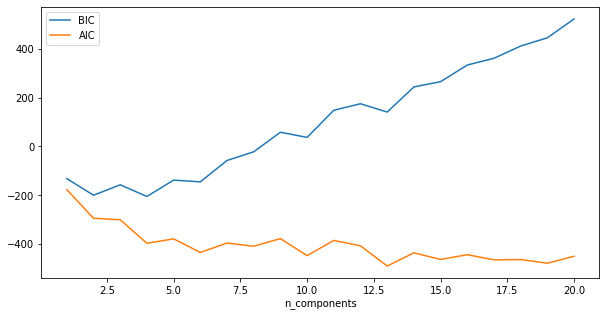

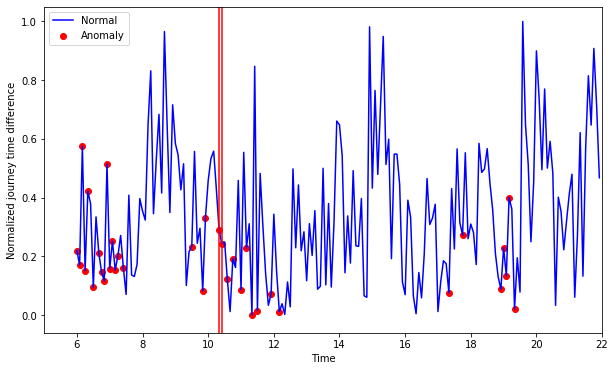

[[10.333, 10.417]]
[[10.333, 10.417]]
[6.0, 6.083, 6.167, 6.25, 6.333, 6.5, 6.667, 6.75, 6.833, 6.917, 7.0, 7.083, 7.167, 7.25, 7.417, 9.5, 9.833, 9.917, 10.333, 10.417, 10.583, 10.75, 11.0, 11.167, 11.333, 11.5, 11.917, 12.167, 17.333, 17.75, 18.917, 19.0, 19.083, 19.167, 19.333]
0.06


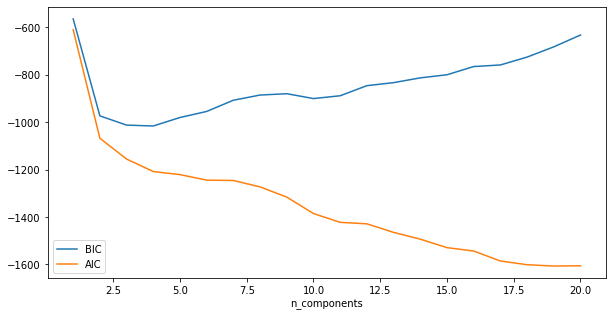

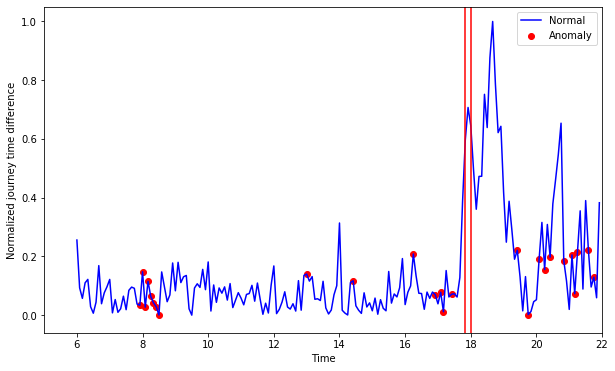

[]
[]
[7.917, 8.0, 8.083, 8.167, 8.25, 8.333, 8.417, 8.5, 13.0, 14.417, 16.25, 16.917, 17.083, 17.167, 17.417, 19.417, 19.75, 20.083, 20.25, 20.417, 20.833, 21.083, 21.167, 21.25, 21.583, 21.75]
0


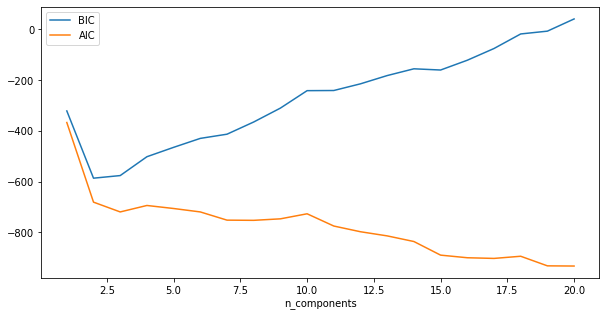

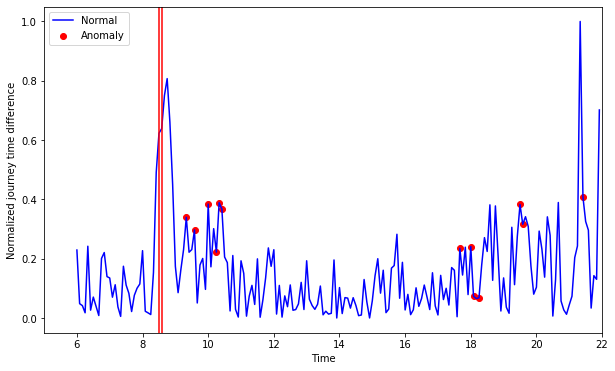

[]
[]
[9.333, 9.583, 10.0, 10.25, 10.333, 10.417, 17.667, 18.0, 18.083, 18.25, 19.5, 19.583, 21.417]
0


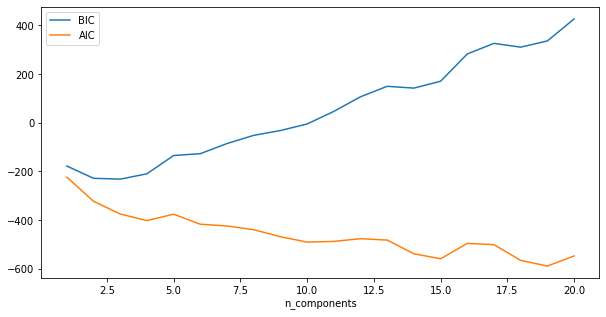

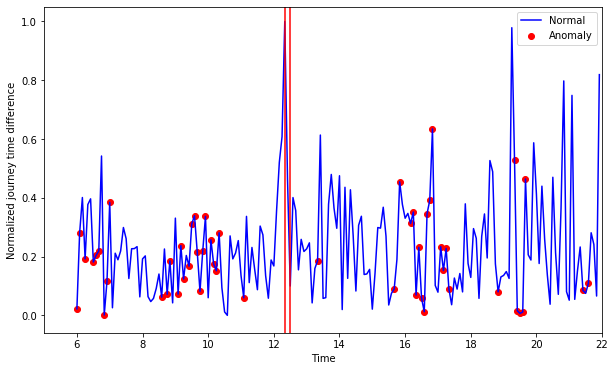

[]
[]
[6.0, 6.083, 6.25, 6.5, 6.583, 6.667, 6.833, 6.917, 7.0, 8.583, 8.75, 8.833, 9.083, 9.167, 9.25, 9.417, 9.5, 9.583, 9.667, 9.75, 9.833, 9.917, 10.083, 10.167, 10.25, 10.333, 11.083, 13.333, 15.667, 15.833, 16.167, 16.25, 16.333, 16.417, 16.5, 16.583, 16.667, 16.75, 16.833, 17.083, 17.167, 17.25, 17.333, 18.833, 19.333, 19.417, 19.5, 19.583, 19.667, 21.417, 21.583]
0


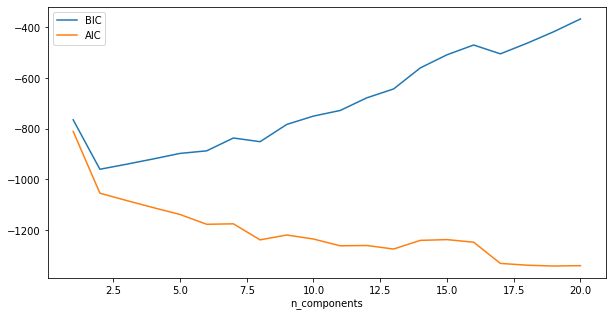

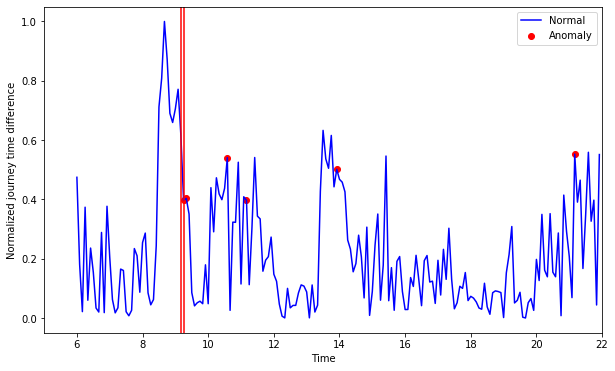

[]
[[9.25, 9.333]]
[9.25, 9.333, 10.583, 11.167, 13.917, 21.167]
0.33


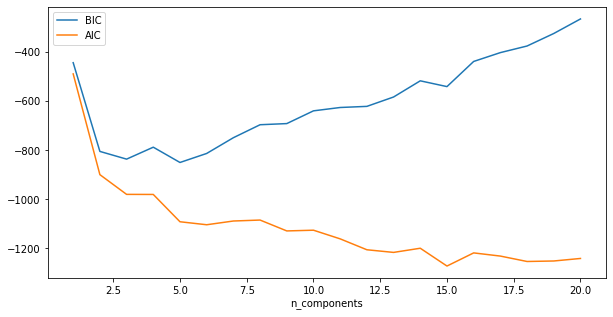

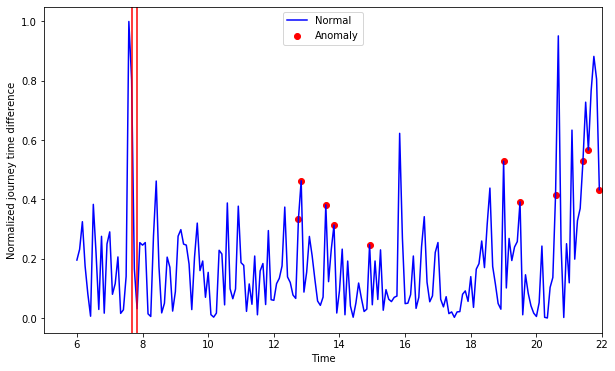

[]
[]
[12.75, 12.833, 13.583, 13.833, 14.917, 19.0, 19.5, 20.583, 21.417, 21.583, 21.917]
0


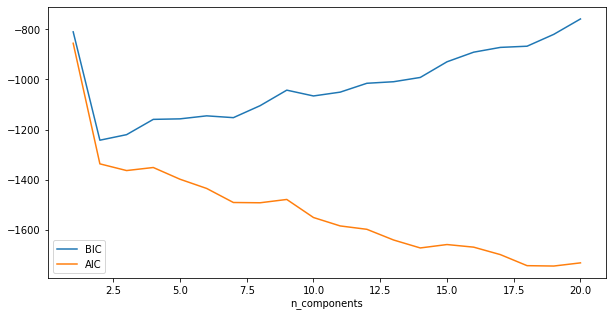

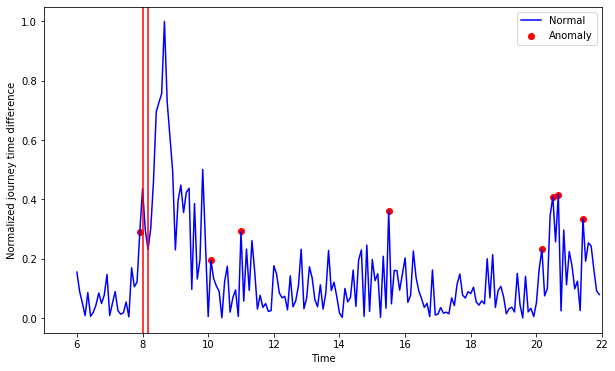

[]
[]
[7.917, 10.083, 11.0, 15.5, 20.167, 20.5, 20.667, 21.417]
0


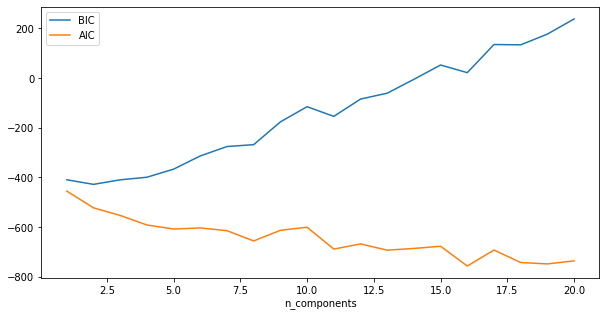

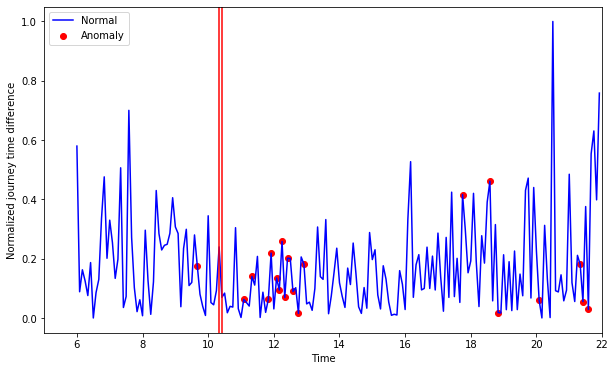

[]
[]
[9.667, 11.083, 11.333, 11.833, 11.917, 12.083, 12.167, 12.25, 12.333, 12.417, 12.583, 12.75, 12.917, 17.75, 18.583, 18.833, 20.083, 21.333, 21.417, 21.583]
0


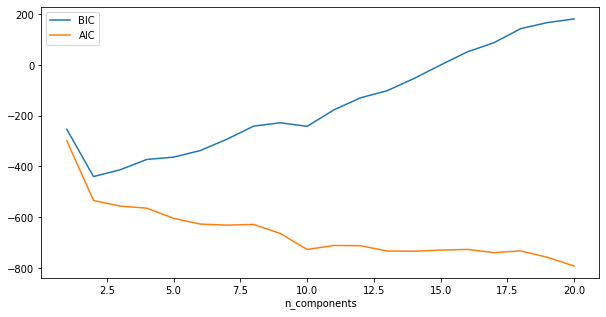

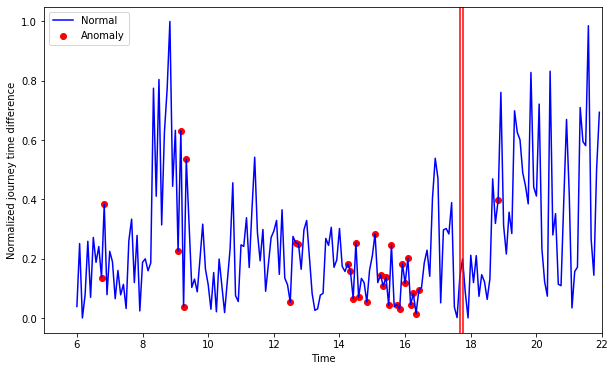

[]
[]
[6.75, 6.833, 9.083, 9.167, 9.25, 9.333, 12.5, 12.667, 12.75, 14.25, 14.333, 14.417, 14.5, 14.583, 14.833, 15.083, 15.25, 15.333, 15.417, 15.5, 15.583, 15.75, 15.833, 15.917, 16.0, 16.083, 16.167, 16.25, 16.333, 16.417, 18.833]
0


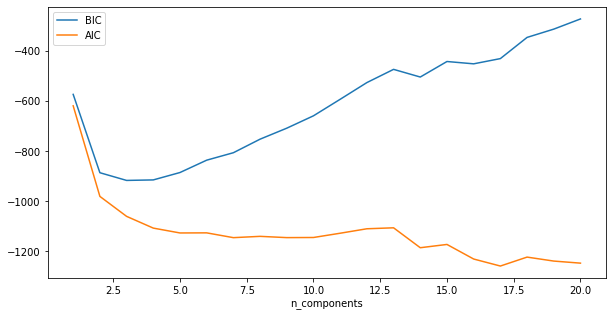

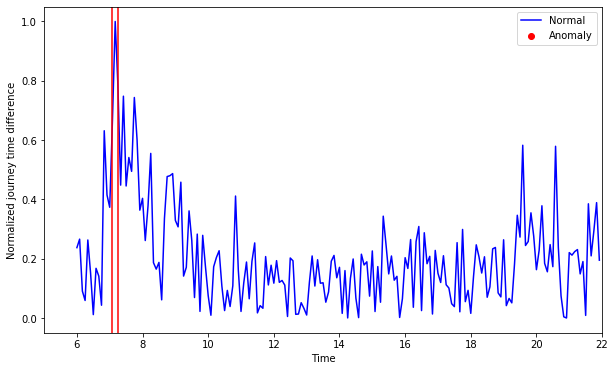

[]
[]
[]
0


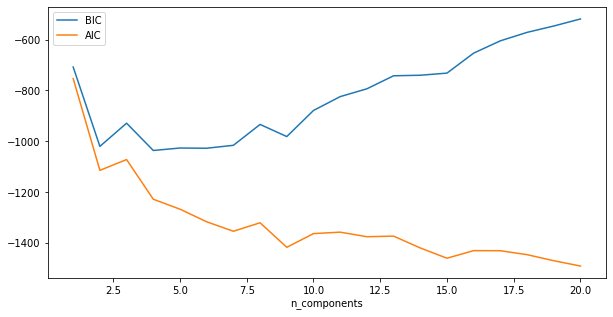

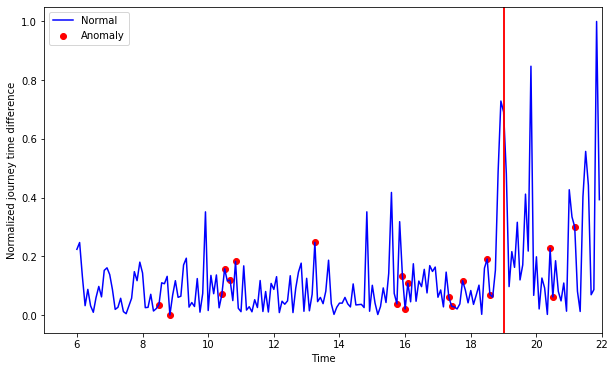

[]
[]
[8.5, 8.833, 10.417, 10.5, 10.667, 10.833, 13.25, 15.75, 15.917, 16.0, 16.083, 17.333, 17.417, 17.75, 18.5, 18.583, 20.417, 20.5, 21.167]
0


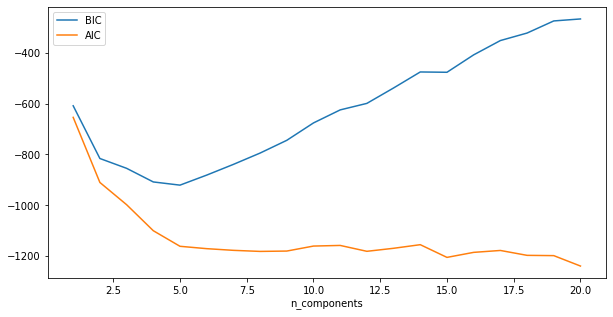

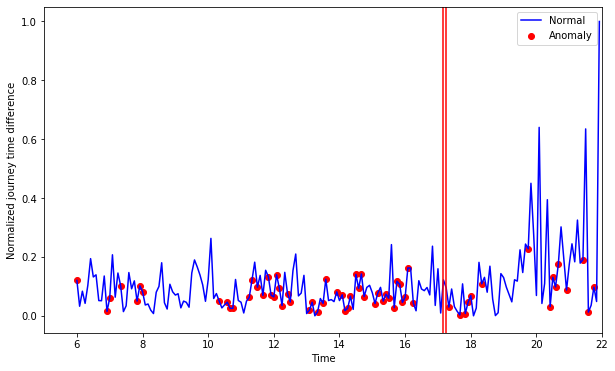

[]
[]
[6.0, 6.917, 7.0, 7.333, 7.833, 7.917, 8.0, 10.333, 10.583, 10.667, 10.75, 11.25, 11.333, 11.5, 11.667, 11.833, 11.917, 12.0, 12.083, 12.167, 12.25, 12.417, 12.5, 13.083, 13.167, 13.333, 13.5, 13.583, 13.917, 14.083, 14.167, 14.25, 14.333, 14.5, 14.583, 14.667, 14.75, 15.083, 15.167, 15.333, 15.417, 15.5, 15.667, 15.75, 15.833, 15.917, 16.0, 16.083, 16.25, 17.333, 17.667, 17.833, 17.917, 18.0, 18.333, 19.75, 20.417, 20.5, 20.583, 20.667, 20.917, 21.417, 21.583, 21.75]
0


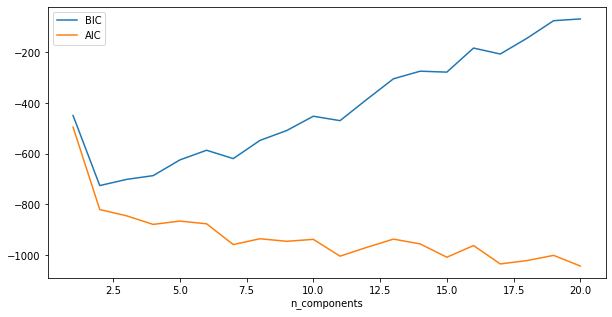

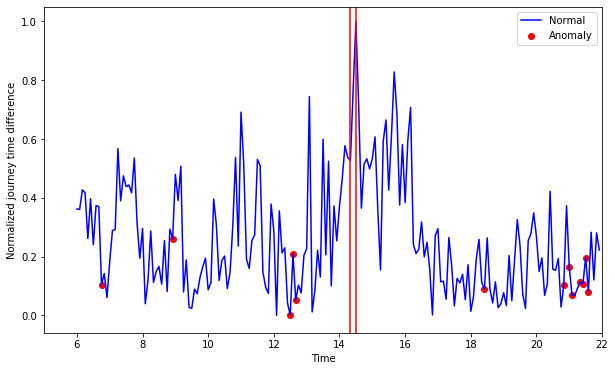

[]
[]
[6.75, 8.917, 12.5, 12.583, 12.667, 18.417, 20.833, 21.0, 21.083, 21.333, 21.417, 21.5, 21.583]
0


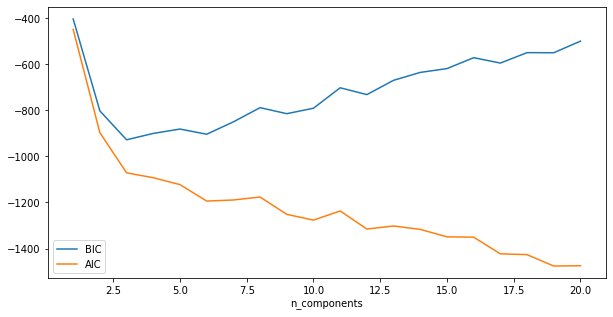

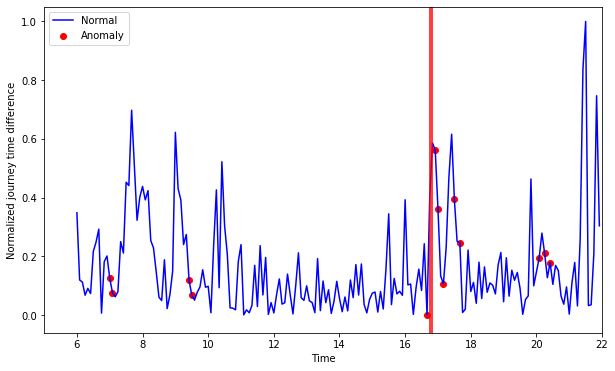

[]
[]
[7.0, 7.083, 9.417, 9.5, 16.667, 16.917, 17.0, 17.167, 17.5, 17.667, 20.083, 20.25, 20.417]
0


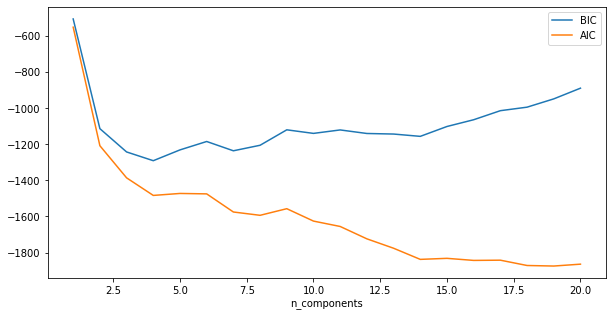

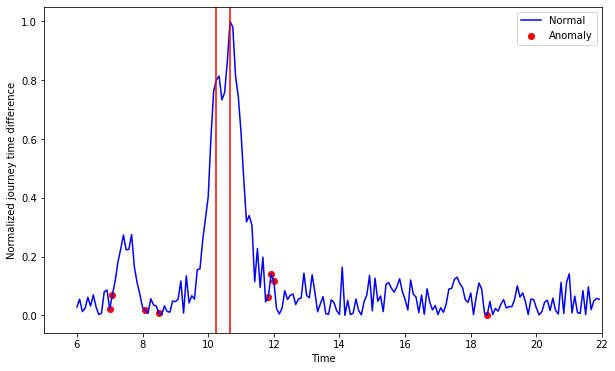

[]
[]
[7.0, 7.083, 8.083, 8.5, 11.833, 11.917, 12.0, 18.5]
0
Counter({'False': 13, 'True': 2})
0
0.33
0.026000000000000002


In [106]:
# Gaussian mixure (clustering based on probability) 
# But because GMM contains a probabilistic model under the hood, 
# it is also possible to find probabilistic cluster assignments—in 
# Scikit-Learn this is done using the predict_proba method. 
# This returns a matrix of size [n_samples, n_clusters] which 
# measures the probability that any point belongs to the given cluster:

from sklearn import mixture
from sklearn.mixture import GaussianMixture

# fix random number
from numpy.random import seed
seed(1)

ACC_result = []
GAX_result = []
for i in list(range(0, len(df_line))):
    df = df_line[i][(df_line[i]['Time'] >= start_time_sys) & (df_line[i]['Time'] <= end_time_sys)]
    time = df[['Time']]
    time = time.reset_index()
    del time['index']

    X = df[['ACC_DIFF','TT_DIFF','LINE_DIFF','EXIT_DIFF']]
    min_max_scaler = preprocessing.MinMaxScaler()
    X = min_max_scaler.fit_transform(X)
    data_1 = pd.DataFrame(X)
    data_1.columns = ['ACC_DIFF','TT_DIFF','LINE_DIFF','EXIT_DIFF']


    com_number = 2
    clf = GaussianMixture(n_components=com_number).fit(X)
    labels = clf.predict(X)
    probs = clf.predict_proba(X)
    prob_result = probs.round(3)

    test = []
    for j in range(0, len(prob_result)):
        if (prob_result[j][0] > 0.95) or (prob_result[j][1] > 0.95):
            a = 0
        else:
            a = 1
        test.append(a)
    test

    result_col = pd.DataFrame(test, columns=['anomaly'])

    result_g = pd.concat([time, data_1, result_col], axis=1)
    
    # # This tells us how many components by using
    # Akaike information criterion (AIC) or the Bayesian information criterion (BIC).
    n_components = np.arange(1, 21)
    models = [GaussianMixture(n, covariance_type='full', random_state=0).fit(X)
              for n in n_components]

    plt.plot(n_components, [m.bic(X) for m in models], label='BIC')
    plt.plot(n_components, [m.aic(X) for m in models], label='AIC')
    plt.legend(loc='best')
    plt.xlabel('n_components')

 # visualisation of anomaly with cluster view
    fig, ax = plt.subplots(figsize=(10,6))
    a = result_g.loc[result_g['anomaly'] == 1, ['Time', 'TT_DIFF']] #anomaly

    ax.plot(result_g['Time'], result_g['TT_DIFF'], color='blue', label='Normal')
    ax.scatter(a['Time'],a['TT_DIFF'], color='red', label='Anomaly')
    plt.xlabel('Time')
    plt.ylabel('Normalized journey time difference')

    x1 = inc_log['Time'].tolist()[i]
    x2 = inc_log['End_time'].tolist()[i]
    plt.axvline(x1, color='red')
    plt.axvline(x2, color='red')
    plt.legend()
    plt.xlim(start_time_sys-1, end_time_sys)
    # plt.savefig('C:/Users/Tenyu/Desktop/Jan 5th, 2020/ABNORMAL/' + 'LOF_10_min' + '.png')
    plt.show()


        # The following loop is used to include uncaptured anomaly points
    time_list = list(a['Time'])

    if time_list == []:
        correct_num == 0
    else:
        # The following split list by a certain interval
#         print(time_list)
        l = time_list
        split_list = []
        templist = [l.pop(0)]
        while len(l)>0:
            x = l.pop(0)
            if x - templist[-1] > 0.085:
                split_list.append(templist)
                templist = [x]
            else: 
                templist.append(x)
        split_list.append(templist)
    
 
        matching_1 = [s for s in split_list if x1 in s]
        matching_2 = [s for s in split_list if x2 in s]
        time_list = list(a['Time'])
        
        if (matching_1 == []) and (matching_2 == []):
            correct_num = 0
        elif (matching_1 == []) and (matching_2 != []):
            correct_num = len(matching_2[0])/len(time_list)
        elif (matching_2 == []) and (matching_1 != []):
            correct_num = len(matching_1[0])/len(time_list)
        elif matching_1 == matching_2:
            correct_num = len(matching_1[0])/len(time_list)
        elif (matching_1 != [] and matching_2 != [] and matching_1 != matching_2):
            correct_num = (len(matching_1[0])+len(matching_2[0]))/len(time_list)

            
        #  count how many single value is within a range
        def count(list1, l, r): 
            return len(list(x for x in list1 if l <= x <= r)) 
        count_num_sin = count(time_list, x1, x2)
    
        if (correct_num == 0) and (count_num_sin != 0):
            correct_num = count_num_sin/len(time_list)
        else:
            correct_num
            
    print(matching_1)
    print(matching_2)
    print(time_list)
    accuracy = round(correct_num, 2)
    print(accuracy)
    ACC_result.append(accuracy)    
            
        
    # Judge if the seleced time window contains the abnomal value
    judge = a[(a['Time'] >= x1) & (a['Time'] <= x2)]
    if judge.empty:
        result = 'False'
    else:
        result = 'True'
    GAX_result.append(result)

    
from collections import Counter
counter = Counter(GAX_result)

# Print out all results
print(counter)
print(min(ACC_result))
print(max(ACC_result))
print(sum(ACC_result)/len(ACC_result))



# # This tells us how many components by using
# # Akaike information criterion (AIC) or the Bayesian information criterion (BIC).
# n_components = np.arange(1, 21)
# models = [GaussianMixture(n, covariance_type='full', random_state=0).fit(X)
#           for n in n_components]

# plt.plot(n_components, [m.bic(X) for m in models], label='BIC')
# plt.plot(n_components, [m.aic(X) for m in models], label='AIC')
# plt.legend(loc='best')
# plt.xlabel('n_components')

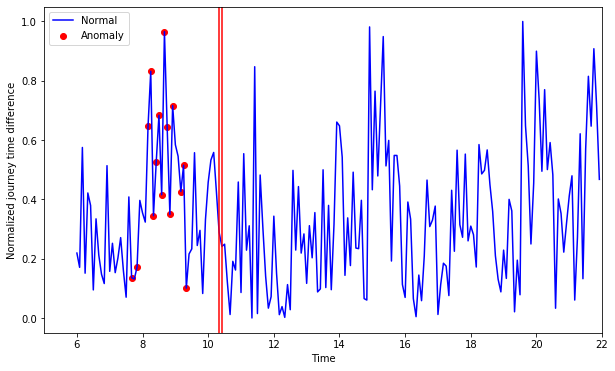

[]
[]
[7.667, 7.833, 8.167, 8.25, 8.333, 8.417, 8.5, 8.583, 8.667, 8.75, 8.833, 8.917, 9.167, 9.25, 9.333]
0


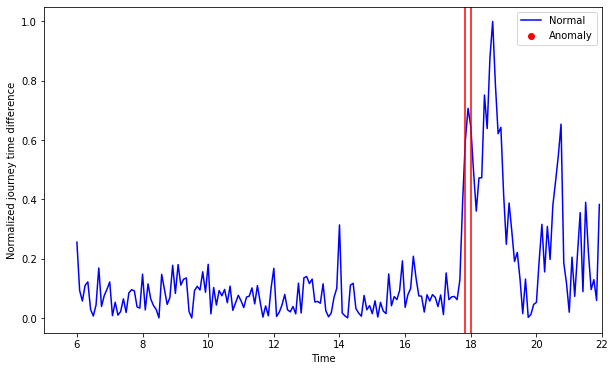

[]
[]
[]
0


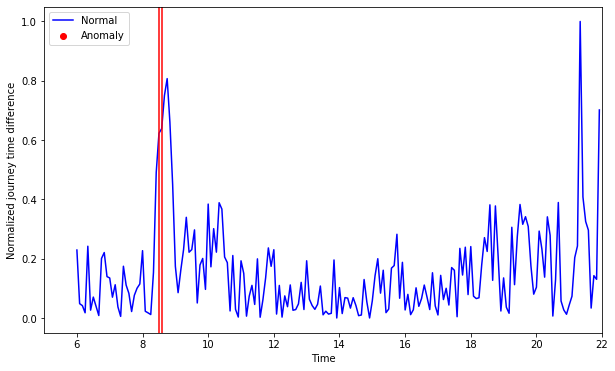

[]
[]
[]
0


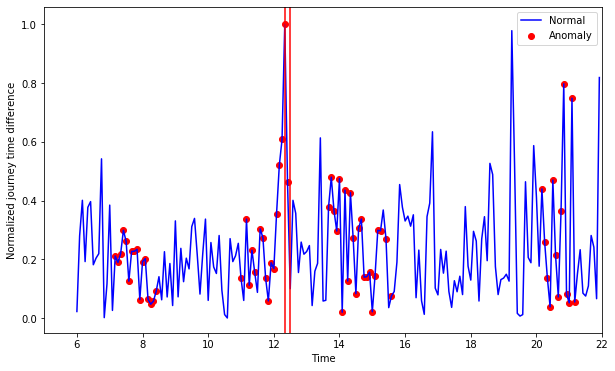

[[11.583, 11.667, 11.75, 11.833, 11.917, 12.0, 12.083, 12.167, 12.25, 12.333, 12.417]]
[]
[7.167, 7.25, 7.333, 7.417, 7.5, 7.583, 7.667, 7.75, 7.833, 7.917, 8.0, 8.083, 8.167, 8.25, 8.333, 8.417, 11.0, 11.167, 11.25, 11.333, 11.417, 11.583, 11.667, 11.75, 11.833, 11.917, 12.0, 12.083, 12.167, 12.25, 12.333, 12.417, 13.667, 13.75, 13.833, 13.917, 14.0, 14.083, 14.167, 14.25, 14.333, 14.417, 14.5, 14.583, 14.667, 14.75, 14.833, 14.917, 15.0, 15.083, 15.167, 15.25, 15.417, 15.583, 20.167, 20.25, 20.333, 20.417, 20.5, 20.583, 20.667, 20.75, 20.833, 20.917, 21.0, 21.083, 21.167]
0.16


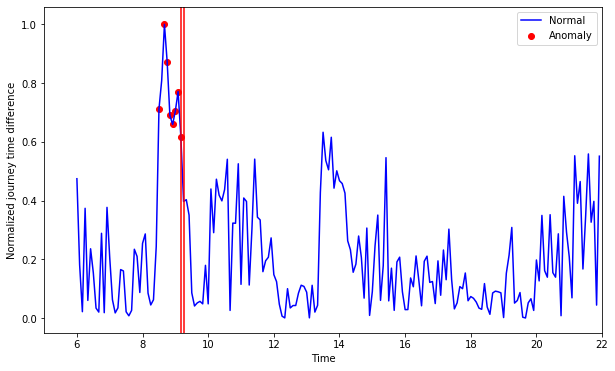

[[8.667, 8.75, 8.833, 8.917, 9.0, 9.083, 9.167]]
[]
[8.5, 8.667, 8.75, 8.833, 8.917, 9.0, 9.083, 9.167]
0.88


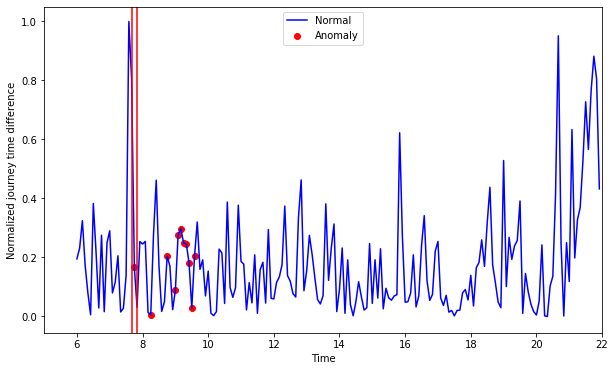

[]
[]
[7.75, 8.25, 8.75, 9.0, 9.083, 9.167, 9.25, 9.333, 9.417, 9.5, 9.583]
0.09


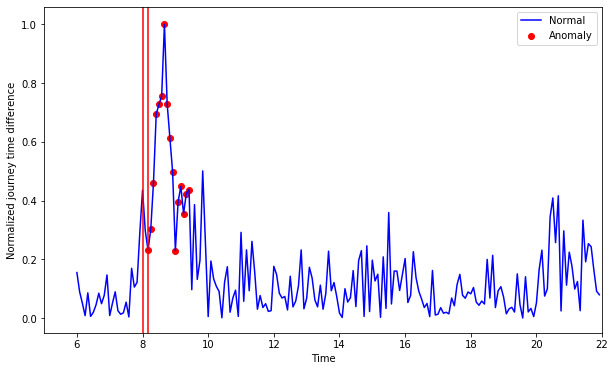

[]
[[8.167, 8.25, 8.333, 8.417, 8.5, 8.583, 8.667, 8.75, 8.833, 8.917, 9.0, 9.083, 9.167, 9.25, 9.333, 9.417]]
[8.167, 8.25, 8.333, 8.417, 8.5, 8.583, 8.667, 8.75, 8.833, 8.917, 9.0, 9.083, 9.167, 9.25, 9.333, 9.417]
1.0


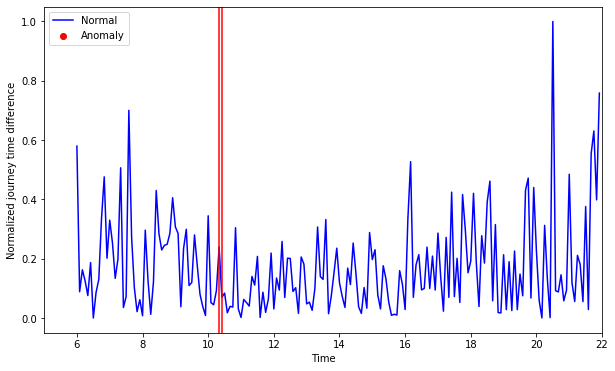

[]
[[8.167, 8.25, 8.333, 8.417, 8.5, 8.583, 8.667, 8.75, 8.833, 8.917, 9.0, 9.083, 9.167, 9.25, 9.333, 9.417]]
[]
1.0


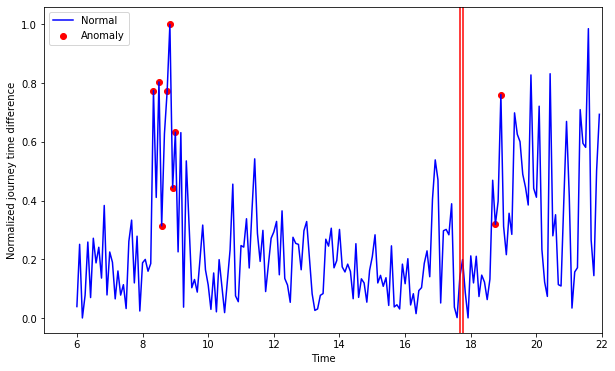

[]
[]
[8.333, 8.5, 8.583, 8.75, 8.833, 8.917, 9.0, 18.75, 18.917]
0


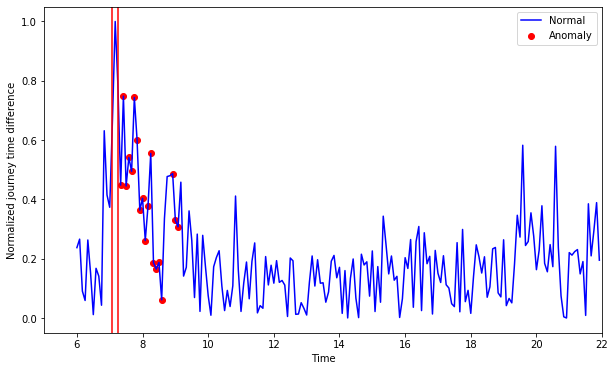

[]
[]
[7.333, 7.417, 7.5, 7.583, 7.667, 7.75, 7.833, 7.917, 8.0, 8.083, 8.167, 8.25, 8.333, 8.417, 8.5, 8.583, 8.917, 9.0, 9.083]
0


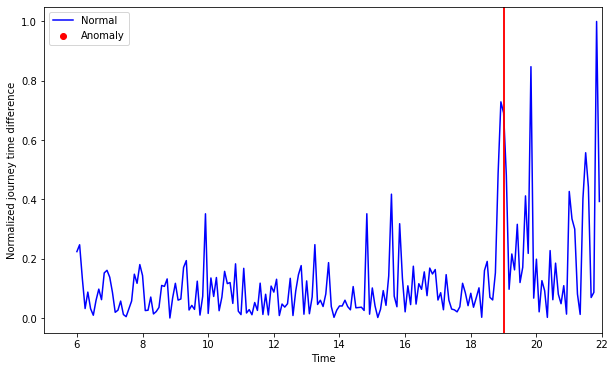

[]
[]
[]
0


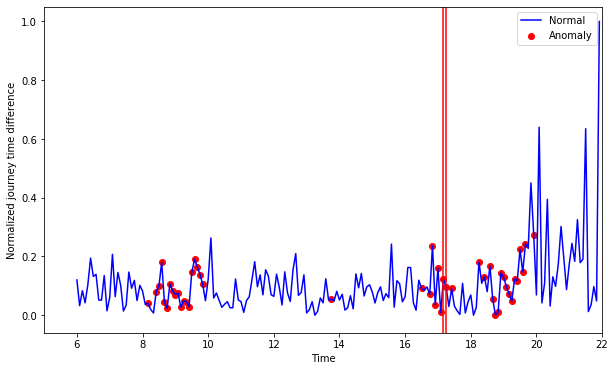

[[16.75, 16.833, 16.917, 17.0, 17.083, 17.167, 17.25]]
[[16.75, 16.833, 16.917, 17.0, 17.083, 17.167, 17.25]]
[8.167, 8.417, 8.5, 8.583, 8.667, 8.75, 8.833, 8.917, 9.0, 9.083, 9.167, 9.25, 9.333, 9.417, 9.5, 9.583, 9.667, 9.75, 9.833, 13.75, 16.5, 16.75, 16.833, 16.917, 17.0, 17.083, 17.167, 17.25, 17.417, 18.25, 18.417, 18.583, 18.667, 18.75, 18.833, 18.917, 19.0, 19.083, 19.167, 19.25, 19.333, 19.417, 19.5, 19.583, 19.667, 19.917]
0.15


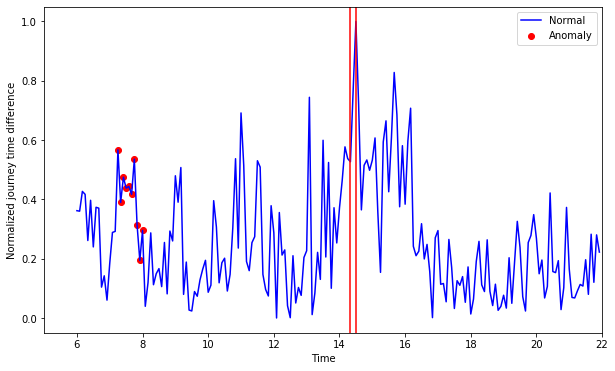

[]
[]
[7.25, 7.333, 7.417, 7.5, 7.583, 7.667, 7.75, 7.833, 7.917, 8.0]
0


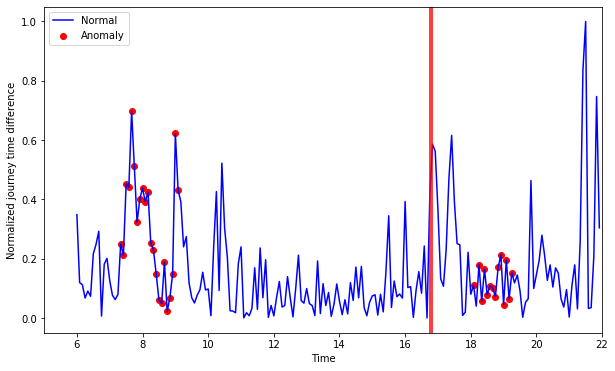

[]
[]
[7.333, 7.417, 7.5, 7.583, 7.667, 7.75, 7.833, 7.917, 8.0, 8.083, 8.167, 8.25, 8.333, 8.417, 8.5, 8.583, 8.667, 8.75, 8.833, 8.917, 9.0, 9.083, 18.083, 18.25, 18.333, 18.417, 18.5, 18.583, 18.667, 18.75, 18.833, 18.917, 19.0, 19.083, 19.167, 19.25]
0


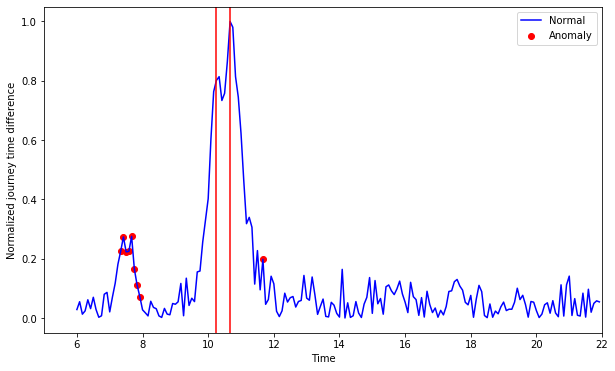

[]
[]
[7.333, 7.417, 7.5, 7.583, 7.667, 7.75, 7.833, 7.917, 11.667]
0
Counter({'False': 10, 'True': 5})
0
1.0
0.21866666666666665


In [107]:
# Anomal detection in time series: Birch (clustering)
from sklearn.cluster import Birch
ACC_result = []
BIR_result = []
for i in list(range(0, len(df_line))):
    df = df_line[i][(df_line[i]['Time'] >= start_time_sys) & (df_line[i]['Time'] <= end_time_sys)]
    time = df[['Time']]
    time = time.reset_index()
    del time['index']
    
    X = df[['TT_DIFF', 'EXIT_DIFF', 'ACC_DIFF', 'LINE_DIFF']]
    X = X.reset_index()
    del X['index']
    
    # Normalize the dataset
    min_max_scaler = preprocessing.MinMaxScaler()
    x_scaled = min_max_scaler.fit_transform(X)
    data_1 = pd.DataFrame(x_scaled)
    data_1.columns = ['TT_DIFF', 'EXIT_DIFF', 'ACC_DIFF', 'LINE_DIFF']
    
    X_1 = np.array(data_1)
    brc = Birch(threshold=0.5, branching_factor=150, n_clusters=None)
    brc.fit(X_1)
    cluster = brc.predict(X_1)
    d = {'anomaly': cluster}
    anomaly = pd.DataFrame(d)
    
    result_birch = pd.concat([time, data_1, anomaly], axis=1)
    
    def conditions(s):
        if s['anomaly'] == 1:
            return 1
        else:
            return 0 
    
    result_birch['anomaly'] = result_birch.apply(lambda row: conditions(row), axis=1)
    
    # visualisation of anomaly with cluster view
    fig, ax = plt.subplots(figsize=(10,6))
    a = result_birch.loc[result_birch['anomaly'] == 1, ['Time', 'TT_DIFF']] #anomaly

    ax.plot(result_birch['Time'], result_birch['TT_DIFF'], color='blue', label='Normal')
    ax.scatter(a['Time'],a['TT_DIFF'], color='red', label='Anomaly')
    plt.xlabel('Time')
    plt.ylabel('Normalized journey time difference')

    x1 = inc_log['Time'].tolist()[i]
    x2 = inc_log['End_time'].tolist()[i]
    plt.axvline(x1, color='red')
    plt.axvline(x2, color='red')
    plt.legend()
    plt.xlim(start_time_sys-1, end_time_sys)
    # plt.savefig('C:/Users/Tenyu/Desktop/Jan 5th, 2020/ABNORMAL/' + 'LOF_10_min' + '.png')
    plt.show()
    
    
    # The following loop is used to include uncaptured anomaly points
    time_list = list(a['Time'])

    if time_list == []:
        correct_num == 0
    else:
        # The following split list by a certain interval
#         print(time_list)
        l = time_list
        split_list = []
        templist = [l.pop(0)]
        while len(l)>0:
            x = l.pop(0)
            if x - templist[-1] > 0.085:
                split_list.append(templist)
                templist = [x]
            else: 
                templist.append(x)
        split_list.append(templist)
    
 
        matching_1 = [s for s in split_list if x1 in s]
        matching_2 = [s for s in split_list if x2 in s]
        time_list = list(a['Time']) 

        
        if (matching_1 == []) and (matching_2 == []):
            correct_num = 0
        elif (matching_1 == []) and (matching_2 != []):
            correct_num = len(matching_2[0])/len(time_list)
        elif (matching_2 == []) and (matching_1 != []):
            correct_num = len(matching_1[0])/len(time_list)
        elif matching_1 == matching_2:
            correct_num = len(matching_1[0])/len(time_list)
        elif (matching_1 != 0 and matching_2 != 0 and matching_1 != matching_2):
            correct_num = (len(matching_1[0])+len(matching_2[0]))/len(time_list)

            
        #  count how many single value is within a range
        def count(list1, l, r): 
            return len(list(x for x in list1 if l <= x <= r)) 
        count_num_sin = count(time_list, x1, x2)
    
        if (correct_num == 0) and (count_num_sin != 0):
            correct_num = count_num_sin/len(time_list)
        else:
            correct_num
            
    print(matching_1)
    print(matching_2)
    print(time_list)
    accuracy = round(correct_num, 2)
    print(accuracy)
    ACC_result.append(accuracy)    
            
        
    # Judge if the seleced time window contains the abnomal value
    judge = a[(a['Time'] >= x1) & (a['Time'] <= x2)]
    if judge.empty:
        result = 'False'
    else:
        result = 'True'
    BIR_result.append(result)
    
from collections import Counter
counter = Counter(BIR_result)

# Print out all results
print(counter)
print(min(ACC_result))
print(max(ACC_result))
print(sum(ACC_result)/len(ACC_result))

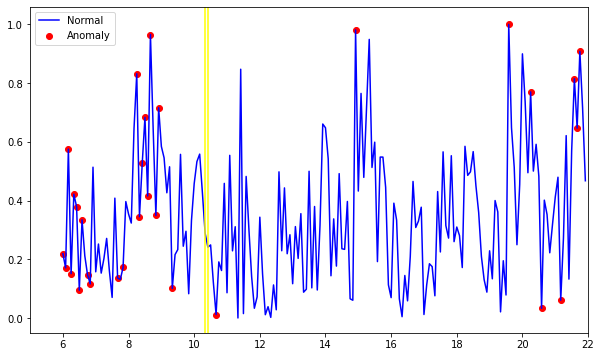

[]
[]
[6.0, 6.083, 6.167, 6.25, 6.333, 6.417, 6.5, 6.583, 6.75, 6.833, 7.667, 7.833, 8.25, 8.333, 8.417, 8.5, 8.583, 8.667, 8.833, 8.917, 9.333, 10.667, 14.917, 19.583, 20.25, 20.583, 21.167, 21.583, 21.667, 21.75]
0


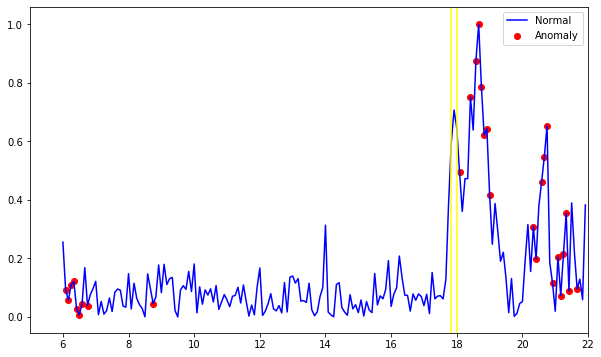

[]
[]
[6.083, 6.167, 6.25, 6.333, 6.417, 6.5, 6.583, 6.75, 8.75, 18.083, 18.417, 18.583, 18.667, 18.75, 18.833, 18.917, 19.0, 20.333, 20.417, 20.583, 20.667, 20.75, 20.917, 21.083, 21.167, 21.25, 21.333, 21.417, 21.667]
0


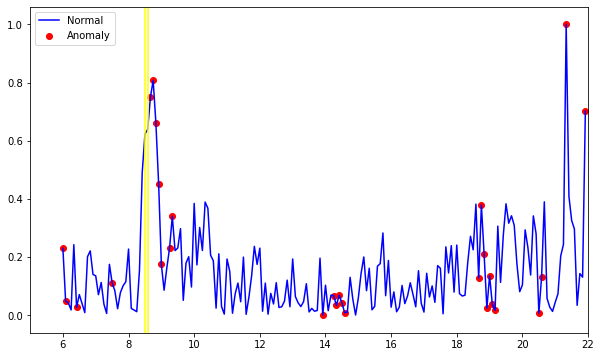

[]
[]
[6.0, 6.083, 6.417, 7.5, 8.667, 8.75, 8.833, 8.917, 9.0, 9.25, 9.333, 13.917, 14.25, 14.333, 14.417, 14.5, 14.583, 18.667, 18.75, 18.833, 18.917, 19.0, 19.083, 19.167, 20.5, 20.583, 21.333, 21.917]
0


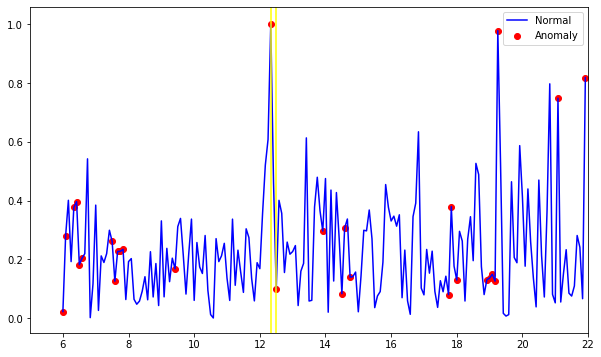

[[12.333]]
[[12.5]]
[6.0, 6.083, 6.333, 6.417, 6.5, 6.583, 7.5, 7.583, 7.667, 7.75, 7.833, 9.417, 12.333, 12.5, 13.917, 14.5, 14.583, 14.75, 17.75, 17.833, 18.0, 18.917, 19.0, 19.083, 19.167, 19.25, 21.083, 21.917]
0.07


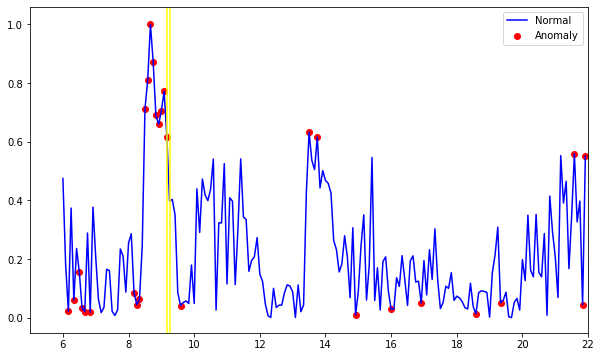

[[8.5, 8.583, 8.667, 8.75, 8.833, 8.917, 9.0, 9.083, 9.167]]
[]
[6.167, 6.333, 6.5, 6.583, 6.667, 6.833, 8.167, 8.25, 8.333, 8.5, 8.583, 8.667, 8.75, 8.833, 8.917, 9.0, 9.083, 9.167, 9.583, 13.5, 13.75, 14.917, 16.0, 16.917, 18.583, 19.333, 21.583, 21.833, 21.917]
0.31


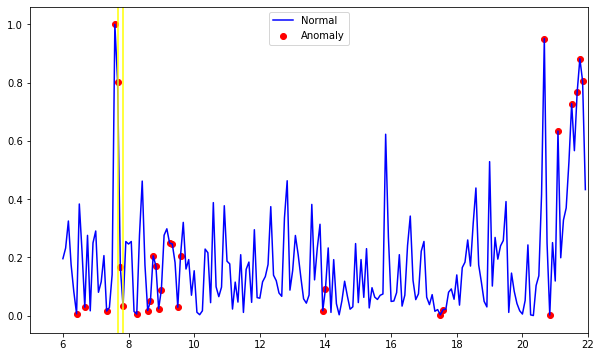

[[7.583, 7.667, 7.75, 7.833]]
[[7.583, 7.667, 7.75, 7.833]]
[6.417, 6.667, 7.333, 7.583, 7.667, 7.75, 7.833, 8.25, 8.583, 8.667, 8.75, 8.833, 8.917, 9.0, 9.25, 9.333, 9.5, 9.583, 13.917, 14.0, 17.5, 17.583, 20.667, 20.833, 21.083, 21.5, 21.667, 21.75, 21.833]
0.14


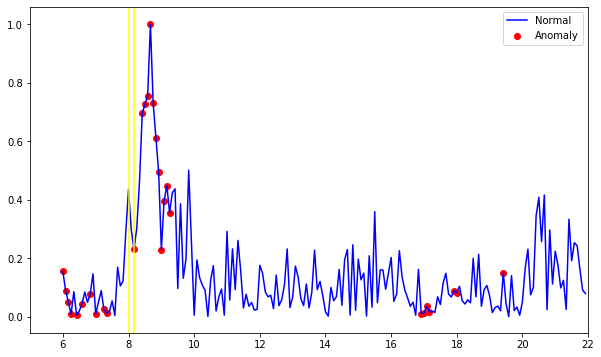

[]
[[8.167]]
[6.0, 6.083, 6.167, 6.25, 6.417, 6.583, 6.833, 7.0, 7.25, 7.333, 8.167, 8.417, 8.5, 8.583, 8.667, 8.75, 8.833, 8.917, 9.0, 9.083, 9.167, 9.25, 16.917, 17.0, 17.083, 17.167, 17.917, 18.0, 19.417]
0.03


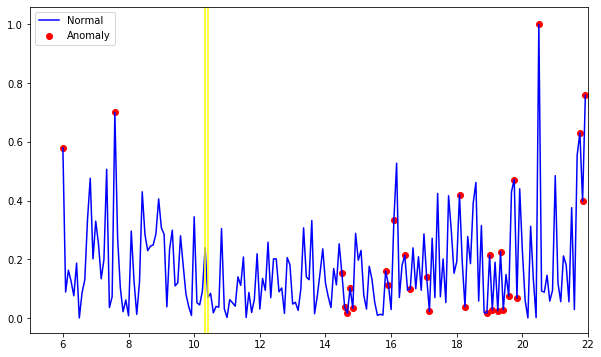

[]
[]
[6.0, 7.583, 14.5, 14.583, 14.667, 14.75, 14.833, 15.833, 15.917, 16.083, 16.417, 16.583, 17.083, 17.167, 18.083, 18.25, 18.917, 19.0, 19.083, 19.25, 19.333, 19.417, 19.583, 19.75, 19.833, 20.5, 21.75, 21.833, 21.917]
0


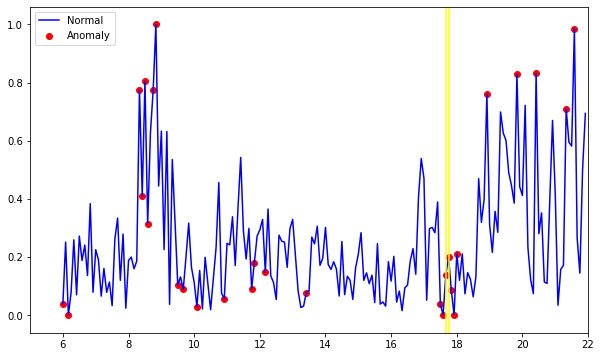

[[17.5, 17.583, 17.667, 17.75, 17.833, 17.917, 18.0]]
[[17.5, 17.583, 17.667, 17.75, 17.833, 17.917, 18.0]]
[6.0, 6.167, 8.333, 8.417, 8.5, 8.583, 8.75, 8.833, 9.5, 9.667, 10.083, 10.917, 11.75, 11.833, 12.167, 13.417, 17.5, 17.583, 17.667, 17.75, 17.833, 17.917, 18.0, 18.917, 19.833, 20.417, 21.333, 21.583]
0.25


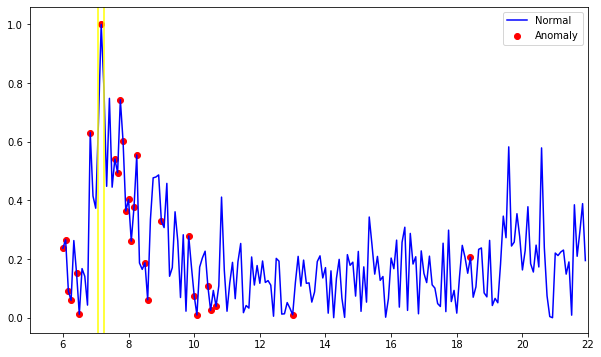

[]
[]
[6.0, 6.083, 6.167, 6.25, 6.417, 6.5, 6.833, 7.167, 7.583, 7.667, 7.75, 7.833, 7.917, 8.0, 8.083, 8.167, 8.25, 8.5, 8.583, 9.0, 9.833, 10.0, 10.083, 10.417, 10.5, 10.667, 13.0, 18.417]
0.04


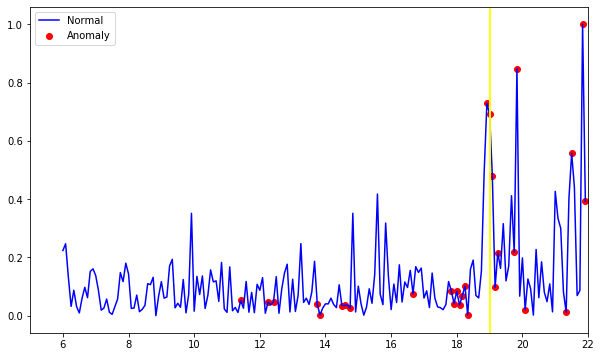

[[18.917, 19.0, 19.083, 19.167, 19.25]]
[[18.917, 19.0, 19.083, 19.167, 19.25]]
[11.417, 12.25, 12.417, 13.75, 13.833, 14.5, 14.583, 14.75, 16.667, 17.833, 17.917, 18.0, 18.083, 18.167, 18.25, 18.333, 18.917, 19.0, 19.083, 19.167, 19.25, 19.75, 19.833, 20.083, 21.333, 21.5, 21.833, 21.917]
0.18


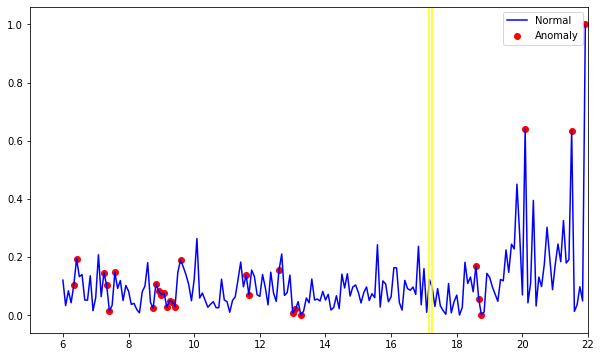

[]
[]
[6.333, 6.417, 7.25, 7.333, 7.417, 7.583, 8.75, 8.833, 8.917, 9.0, 9.083, 9.167, 9.25, 9.333, 9.417, 9.583, 11.583, 11.667, 12.583, 13.0, 13.083, 13.25, 18.583, 18.667, 18.75, 20.083, 21.5, 21.917]
0


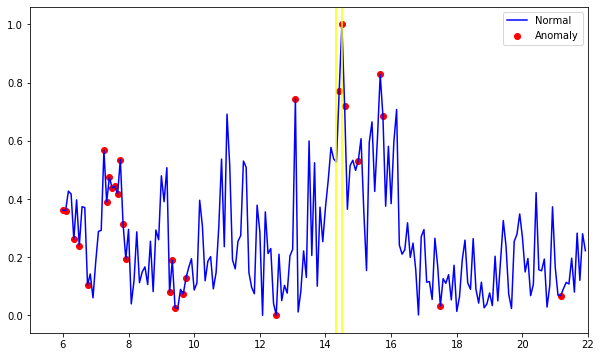

[]
[[14.417, 14.5, 14.583]]
[6.0, 6.083, 6.333, 6.5, 6.75, 7.25, 7.333, 7.417, 7.5, 7.583, 7.667, 7.75, 7.833, 7.917, 9.25, 9.333, 9.417, 9.667, 9.75, 12.5, 13.083, 14.417, 14.5, 14.583, 15.0, 15.667, 15.75, 17.5, 21.167]
0.1


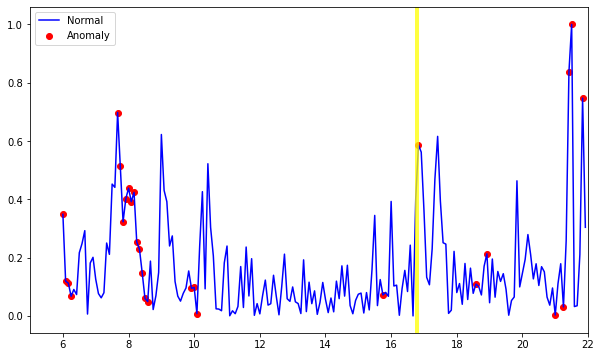

[]
[[16.833]]
[6.0, 6.083, 6.167, 6.25, 7.667, 7.75, 7.833, 7.917, 8.0, 8.083, 8.167, 8.25, 8.333, 8.417, 8.5, 8.583, 9.917, 10.0, 10.083, 15.75, 16.833, 18.583, 18.917, 21.0, 21.25, 21.417, 21.5, 21.833]
0.04


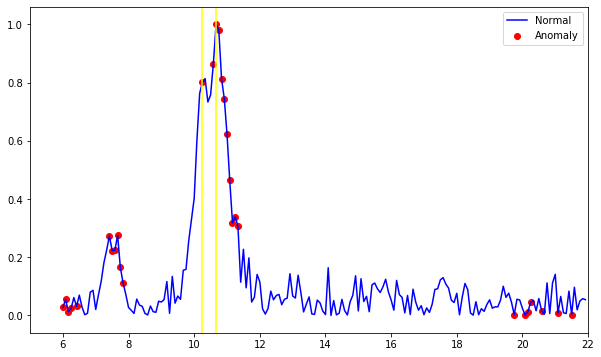

[[10.25]]
[[10.583, 10.667, 10.75, 10.833, 10.917, 11.0, 11.083, 11.167, 11.25, 11.333]]
[6.0, 6.083, 6.167, 6.25, 6.417, 7.417, 7.5, 7.583, 7.667, 7.75, 7.833, 10.25, 10.583, 10.667, 10.75, 10.833, 10.917, 11.0, 11.083, 11.167, 11.25, 11.333, 19.75, 20.083, 20.167, 20.25, 20.583, 21.083, 21.5]
0.38
Counter({'True': 10, 'False': 5})
0
0.38
0.10266666666666667


In [108]:
# Anomal detection in time series (OneClassSVM: clustering)
from sklearn.svm import OneClassSVM

ACC_result = []
SVM_result = []
for i in list(range(0, len(df_line))):
    df = df_line[i][df_line[i]['Time'] >= start_time_sys]
    X = df[['EXIT_DIFF', 'TT_DIFF', 'ACC_DIFF', 'LINE_DIFF']]
    
    time = df[['Time']]
    time = time.reset_index()
    del time['index']
    
    # Normalize the dataset
    min_max_scaler = preprocessing.MinMaxScaler()
    x_scaled = min_max_scaler.fit_transform(X)
    data_1 = pd.DataFrame(x_scaled)
    
    # train oneclassSVM
    outliers_fraction = 0.15
    model = OneClassSVM(nu=outliers_fraction, kernel="rbf", gamma=0.1)
    model.fit(data_1)
    anomaly_col = pd.DataFrame(data=model.predict(data_1))
    df = pd.concat([time, data_1, anomaly_col], axis=1)
    
    df.columns = ['Time', 'EXIT_DIFF', 'TT_DIFF', 'ACC_DIFF', 'LINE_DIFF', 'anomaly']
    
    fig, ax = plt.subplots(figsize=(10,6))
    a = df.loc[df['anomaly'] == -1, ['Time', 'TT_DIFF']] #anomaly

    ax.plot(df['Time'], df['TT_DIFF'], color='blue', label = 'Normal')
    ax.scatter(a['Time'],a['TT_DIFF'], color='red', label = 'Anomaly')
    x1 = inc_log['Time'].tolist()[i]
    x2 = inc_log['End_time'].tolist()[i]
    plt.axvline(x1, color='yellow')
    plt.axvline(x2, color='yellow')
    plt.legend()
    plt.xlim(start_time_sys-1, end_time_sys)
    # plt.savefig('C:/Users/Tenyu/Desktop/Jan 5th, 2020/ABNORMAL/' + 'OneClassSVM_10_min' + '.png')
    plt.show()
    
    
        # The following loop is used to include uncaptured anomaly points
    time_list = list(a['Time'])

    if time_list == []:
        correct_num == 0
    else:
        # The following split list by a certain interval
#         print(time_list)
        l = time_list
        split_list = []
        templist = [l.pop(0)]
        while len(l)>0:
            x = l.pop(0)
            if x - templist[-1] > 0.085:
                split_list.append(templist)
                templist = [x]
            else: 
                templist.append(x)
        split_list.append(templist)
    
 
        matching_1 = [s for s in split_list if x1 in s]
        matching_2 = [s for s in split_list if x2 in s]
        time_list = list(a['Time'])

        
        if (matching_1 == []) and (matching_2 == []):
            correct_num = 0
        elif (matching_1 == []) and (matching_2 != []):
            correct_num = len(matching_2[0])/len(time_list)
        elif (matching_2 == []) and (matching_1 != []):
            correct_num = len(matching_1[0])/len(time_list)
        elif matching_1 == matching_2:
            correct_num = len(matching_1[0])/len(time_list)
        elif (matching_1 != 0 and matching_2 != 0 and matching_1 != matching_2):
            correct_num = (len(matching_1[0])+len(matching_2[0]))/len(time_list)

            
        #  count how many single value is within a range
        def count(list1, l, r): 
            return len(list(x for x in list1 if l <= x <= r)) 
        count_num_sin = count(time_list, x1, x2)
    
        if (correct_num == 0) and (count_num_sin != 0):
            correct_num = count_num_sin/len(time_list)
        else:
            correct_num
            
    print(matching_1)
    print(matching_2)
    print(time_list)
    accuracy = round(correct_num, 2)
    print(accuracy)
    ACC_result.append(accuracy)    
    
    
    # Judge if the seleced time window contains the abnomal value
    judge = a[(a['Time'] >= x1) & (a['Time'] <= x2)]
    if judge.empty:
        result = 'False'
    else:
        result = 'True'
    SVM_result.append(result)

from collections import Counter
counter = Counter(SVM_result)


# Print out all results
print(counter)
print(min(ACC_result))
print(max(ACC_result))
print(sum(ACC_result)/len(ACC_result))

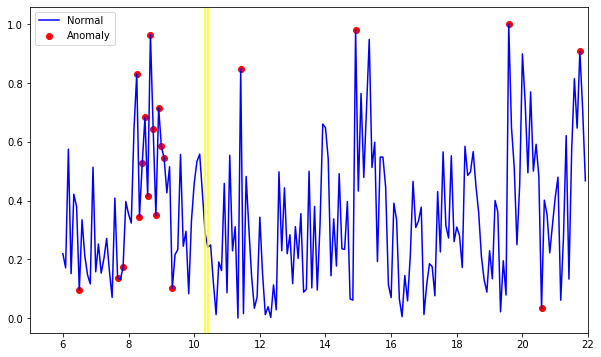

[]
[]
[6.5, 7.667, 7.833, 8.25, 8.333, 8.417, 8.5, 8.583, 8.667, 8.75, 8.833, 8.917, 9.0, 9.083, 9.333, 11.417, 14.917, 19.583, 20.583, 21.75]
0


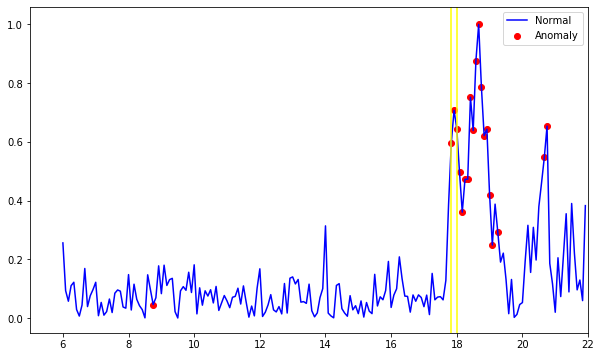

[[17.833, 17.917, 18.0, 18.083, 18.167, 18.25, 18.333, 18.417, 18.5, 18.583, 18.667, 18.75, 18.833, 18.917, 19.0, 19.083]]
[[17.833, 17.917, 18.0, 18.083, 18.167, 18.25, 18.333, 18.417, 18.5, 18.583, 18.667, 18.75, 18.833, 18.917, 19.0, 19.083]]
[8.75, 17.833, 17.917, 18.0, 18.083, 18.167, 18.25, 18.333, 18.417, 18.5, 18.583, 18.667, 18.75, 18.833, 18.917, 19.0, 19.083, 19.25, 20.667, 20.75]
0.8


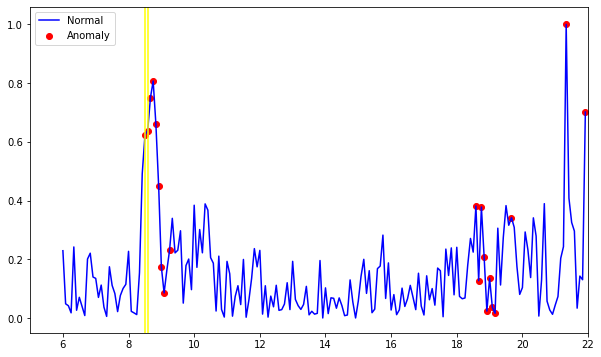

[[8.5, 8.583, 8.667, 8.75, 8.833, 8.917, 9.0, 9.083]]
[[8.5, 8.583, 8.667, 8.75, 8.833, 8.917, 9.0, 9.083]]
[8.5, 8.583, 8.667, 8.75, 8.833, 8.917, 9.0, 9.083, 9.25, 18.583, 18.667, 18.75, 18.833, 18.917, 19.0, 19.083, 19.167, 19.667, 21.333, 21.917]
0.4


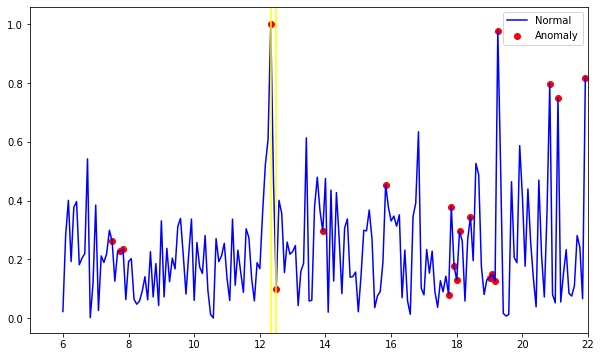

[[12.333]]
[[12.5]]
[7.5, 7.75, 7.833, 12.333, 12.5, 13.917, 15.833, 17.75, 17.833, 17.917, 18.0, 18.083, 18.417, 19.0, 19.083, 19.167, 19.25, 20.833, 21.083, 21.917]
0.1


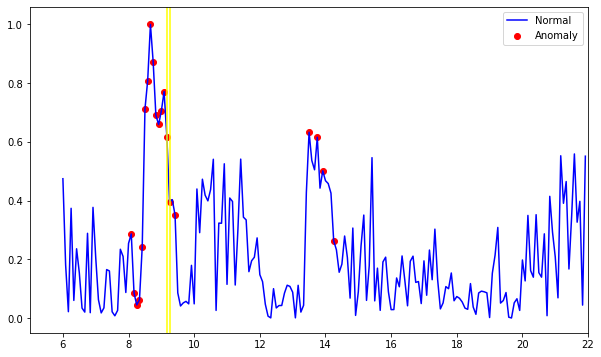

[[8.083, 8.167, 8.25, 8.333, 8.417, 8.5, 8.583, 8.667, 8.75, 8.833, 8.917, 9.0, 9.083, 9.167, 9.25]]
[[8.083, 8.167, 8.25, 8.333, 8.417, 8.5, 8.583, 8.667, 8.75, 8.833, 8.917, 9.0, 9.083, 9.167, 9.25]]
[8.083, 8.167, 8.25, 8.333, 8.417, 8.5, 8.583, 8.667, 8.75, 8.833, 8.917, 9.0, 9.083, 9.167, 9.25, 9.417, 13.5, 13.75, 13.917, 14.25]
0.75


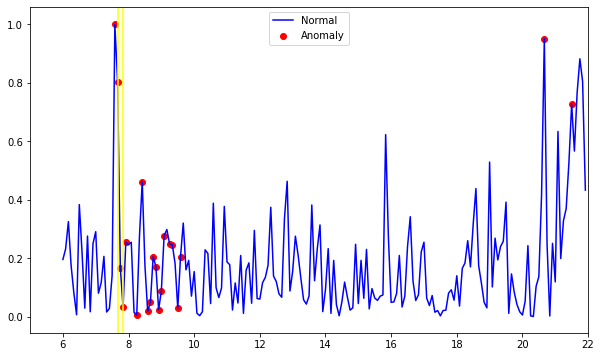

[[7.583, 7.667, 7.75, 7.833, 7.917]]
[[7.583, 7.667, 7.75, 7.833, 7.917]]
[7.583, 7.667, 7.75, 7.833, 7.917, 8.25, 8.417, 8.583, 8.667, 8.75, 8.833, 8.917, 9.0, 9.083, 9.25, 9.333, 9.5, 9.583, 20.667, 21.5]
0.25


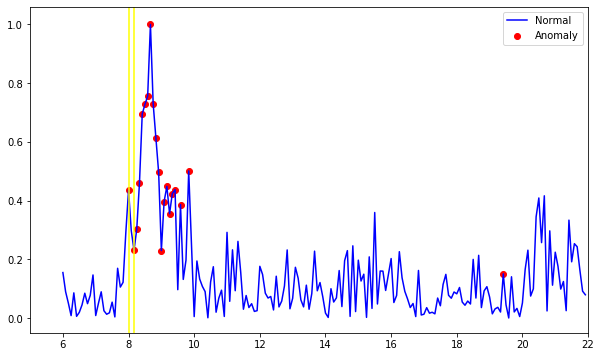

[[8.0]]
[[8.167, 8.25, 8.333, 8.417, 8.5, 8.583, 8.667, 8.75, 8.833, 8.917, 9.0, 9.083, 9.167, 9.25, 9.333, 9.417]]
[8.0, 8.167, 8.25, 8.333, 8.417, 8.5, 8.583, 8.667, 8.75, 8.833, 8.917, 9.0, 9.083, 9.167, 9.25, 9.333, 9.417, 9.583, 9.833, 19.417]
0.85


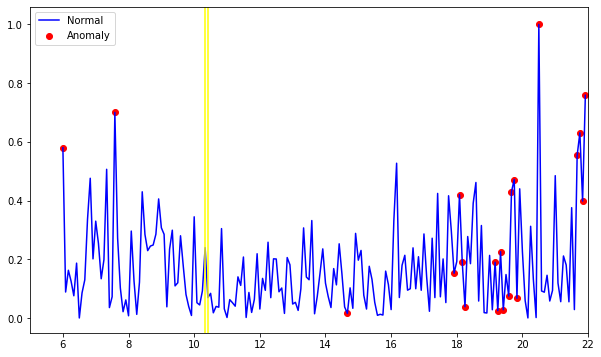

[]
[]
[6.0, 7.583, 14.667, 17.917, 18.083, 18.167, 18.25, 19.167, 19.25, 19.333, 19.417, 19.583, 19.667, 19.75, 19.833, 20.5, 21.667, 21.75, 21.833, 21.917]
0


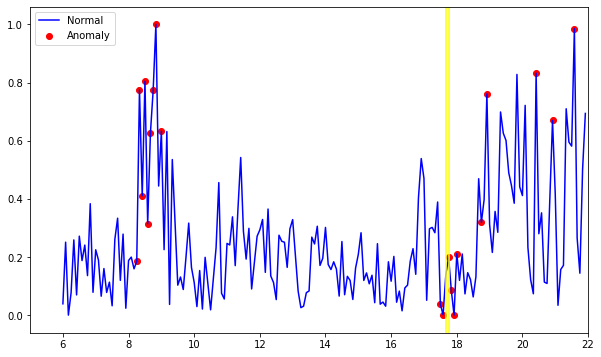

[]
[[17.75, 17.833, 17.917, 18.0]]
[8.25, 8.333, 8.417, 8.5, 8.583, 8.667, 8.75, 8.833, 9.0, 17.5, 17.583, 17.75, 17.833, 17.917, 18.0, 18.75, 18.917, 20.417, 20.917, 21.583]
0.2


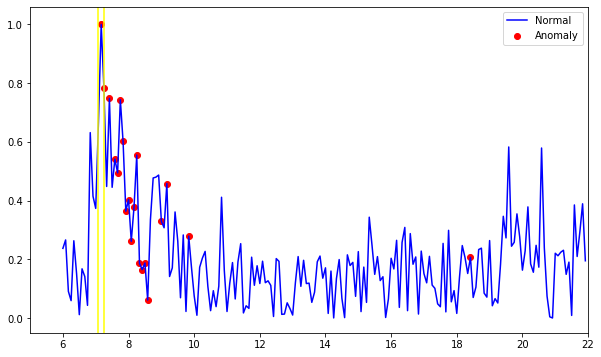

[]
[[7.167, 7.25]]
[7.167, 7.25, 7.417, 7.583, 7.667, 7.75, 7.833, 7.917, 8.0, 8.083, 8.167, 8.25, 8.333, 8.417, 8.5, 8.583, 9.0, 9.167, 9.833, 18.417]
0.1


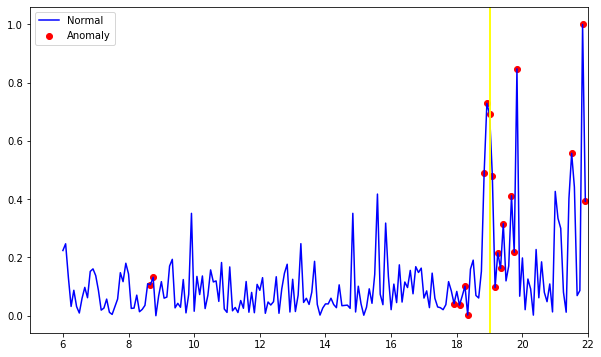

[[18.833, 18.917, 19.0, 19.083, 19.167, 19.25, 19.333, 19.417]]
[[18.833, 18.917, 19.0, 19.083, 19.167, 19.25, 19.333, 19.417]]
[8.667, 8.75, 17.917, 18.083, 18.25, 18.333, 18.833, 18.917, 19.0, 19.083, 19.167, 19.25, 19.333, 19.417, 19.667, 19.75, 19.833, 21.5, 21.833, 21.917]
0.4


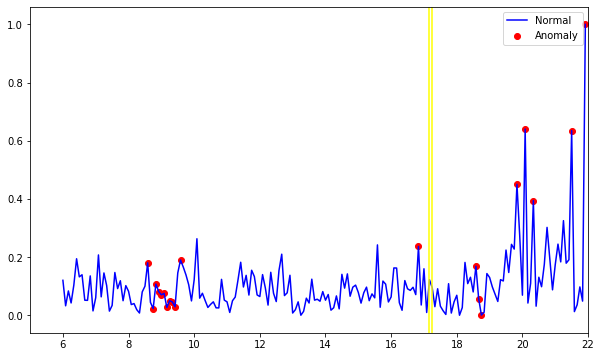

[]
[]
[8.583, 8.75, 8.833, 8.917, 9.0, 9.083, 9.167, 9.25, 9.333, 9.417, 9.583, 16.833, 18.583, 18.667, 18.75, 19.833, 20.083, 20.333, 21.5, 21.917]
0


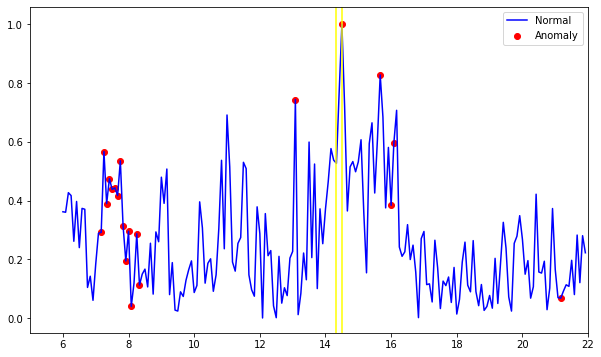

[]
[[14.5]]
[7.167, 7.25, 7.333, 7.417, 7.5, 7.583, 7.667, 7.75, 7.833, 7.917, 8.0, 8.083, 8.25, 8.333, 13.083, 14.5, 15.667, 16.0, 16.083, 21.167]
0.05


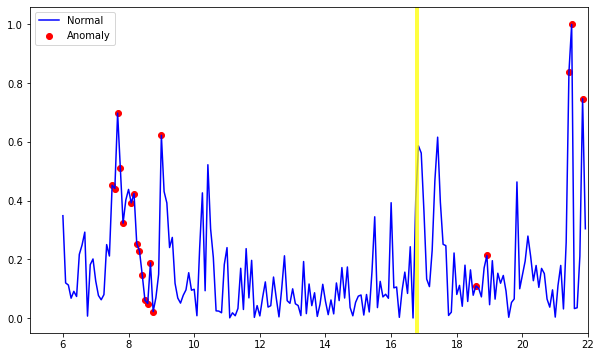

[]
[]
[7.5, 7.583, 7.667, 7.75, 7.833, 8.083, 8.167, 8.25, 8.333, 8.417, 8.5, 8.583, 8.667, 8.75, 9.0, 18.583, 18.917, 21.417, 21.5, 21.833]
0


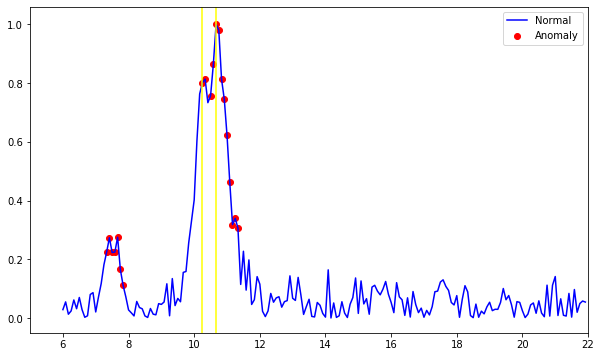

[[10.25, 10.333]]
[[10.5, 10.583, 10.667, 10.75, 10.833, 10.917, 11.0, 11.083, 11.167, 11.25, 11.333]]
[7.333, 7.417, 7.5, 7.583, 7.667, 7.75, 7.833, 10.25, 10.333, 10.5, 10.583, 10.667, 10.75, 10.833, 10.917, 11.0, 11.083, 11.167, 11.25, 11.333]
0.65
Counter({'True': 11, 'False': 4})
0
0.85
0.3033333333333334


In [109]:
# Anomal detection in time series (isolation forests: clustering)
from sklearn.ensemble import IsolationForest

ACC_result = []
ISO_result = []
for i in list(range(0, len(df_line))):
    df = df_line[i][df_line[i]['Time'] >= start_time_sys]
    X = df[['EXIT_DIFF', 'TT_DIFF', 'ACC_DIFF', 'LINE_DIFF']]
    
    time = df[['Time']]
    time = time.reset_index()
    del time['index']
    
    
    # Normalize the dataset
    min_max_scaler = preprocessing.MinMaxScaler()
    x_scaled = min_max_scaler.fit_transform(X)
    data_1 = pd.DataFrame(x_scaled)
    
    
    # train isolation forest
    outliers_fraction = 0.1
    model =  IsolationForest(behaviour='new', contamination=outliers_fraction, random_state=42)
    model.fit(data_1) 
    anomaly_col = pd.DataFrame(data=model.predict(data_1))
    df = pd.concat([time, data_1, anomaly_col], axis=1)
    
    df.columns = ['Time', 'EXIT_DIFF', 'TT_DIFF', 'ACC_DIFF', 'LINE_DIFF', 'anomaly']

    
    # visualization
    fig, ax = plt.subplots(figsize=(10,6))

    a = df.loc[df['anomaly'] == -1, ['Time','TT_DIFF']] #anomaly

    ax.plot(df['Time'], df['TT_DIFF'], color='blue', label = 'Normal')
    ax.scatter(a['Time'],a['TT_DIFF'], color='red', label = 'Anomaly')
    x1 = inc_log['Time'].tolist()[i]
    x2 = inc_log['End_time'].tolist()[i]
    plt.axvline(x1, color='yellow')
    plt.axvline(x2, color='yellow')
    plt.legend()
    plt.xlim(start_time_sys-1, end_time_sys)
    # plt.savefig('C:/Users/Tenyu/Desktop/Jan 5th, 2020/ABNORMAL/' + 'ISOLATION_TREE_10_min' + '.png')
    plt.show()
    
    

        # The following loop is used to include uncaptured anomaly points
    time_list = list(a['Time'])

    if time_list == []:
        correct_num == 0
    else:
        # The following split list by a certain interval
#         print(time_list)
        l = time_list
        split_list = []
        templist = [l.pop(0)]
        while len(l)>0:
            x = l.pop(0)
            if x - templist[-1] > 0.085:
                split_list.append(templist)
                templist = [x]
            else: 
                templist.append(x)
        split_list.append(templist)
    
 
        matching_1 = [s for s in split_list if x1 in s]
        matching_2 = [s for s in split_list if x2 in s]
        time_list = list(a['Time'])
        

        
        if (matching_1 == []) and (matching_2 == []):
            correct_num = 0
        elif (matching_1 == []) and (matching_2 != []):
            correct_num = len(matching_2[0])/len(time_list)
        elif (matching_2 == []) and (matching_1 != []):
            correct_num = len(matching_1[0])/len(time_list)
        elif matching_1 == matching_2:
            correct_num = len(matching_1[0])/len(time_list)
        elif (matching_1 != 0 and matching_2 != 0 and matching_1 != matching_2):
            correct_num = (len(matching_1[0])+len(matching_2[0]))/len(time_list)

            
        #  count how many single value is within a range
        def count(list1, l, r): 
            return len(list(x for x in list1 if l <= x <= r)) 
        count_num_sin = count(time_list, x1, x2)
    
        if (correct_num == 0) and (count_num_sin != 0):
            correct_num = count_num_sin/len(time_list)
        else:
            correct_num
            
    print(matching_1)
    print(matching_2)
    print(time_list)
    accuracy = round(correct_num, 2)
    print(accuracy)
    ACC_result.append(accuracy)    
    
    
    # Judge if the seleced time window contains the abnomal value
    judge = a[(a['Time'] >= x1) & (a['Time'] <= x2)]
    if judge.empty:
        result = 'False'
    else:
        result = 'True'
    ISO_result.append(result)

    
from collections import Counter
counter = Counter(ISO_result)

# Print out all results
print(counter)
print(min(ACC_result))
print(max(ACC_result))
print(sum(ACC_result)/len(ACC_result))

192


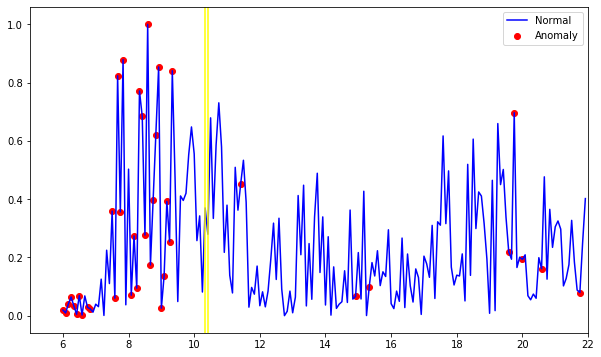

[]
[]
[6.0, 6.083, 6.167, 6.25, 6.333, 6.417, 6.5, 6.583, 6.75, 6.833, 7.5, 7.583, 7.667, 7.75, 7.833, 8.083, 8.167, 8.25, 8.333, 8.417, 8.5, 8.583, 8.667, 8.75, 8.833, 8.917, 9.0, 9.083, 9.167, 9.25, 9.333, 11.417, 14.917, 15.333, 19.583, 19.75, 20.0, 20.583, 21.75]
0
192


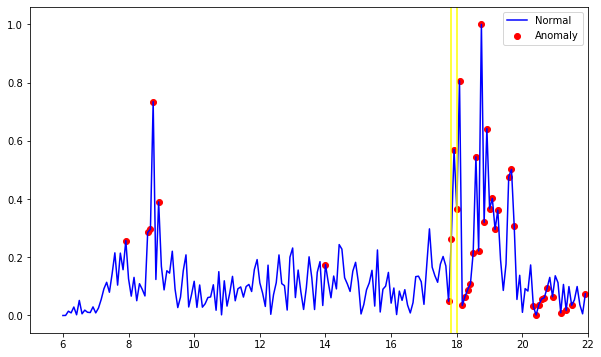

[[17.75, 17.833, 17.917, 18.0, 18.083, 18.167, 18.25, 18.333, 18.417, 18.5, 18.583, 18.667, 18.75, 18.833, 18.917, 19.0, 19.083, 19.167, 19.25]]
[[17.75, 17.833, 17.917, 18.0, 18.083, 18.167, 18.25, 18.333, 18.417, 18.5, 18.583, 18.667, 18.75, 18.833, 18.917, 19.0, 19.083, 19.167, 19.25]]
[7.917, 8.583, 8.667, 8.75, 8.917, 14.0, 17.75, 17.833, 17.917, 18.0, 18.083, 18.167, 18.25, 18.333, 18.417, 18.5, 18.583, 18.667, 18.75, 18.833, 18.917, 19.0, 19.083, 19.167, 19.25, 19.583, 19.667, 19.75, 20.333, 20.417, 20.5, 20.583, 20.667, 20.75, 20.917, 21.167, 21.333, 21.5, 21.917]
0.49
192


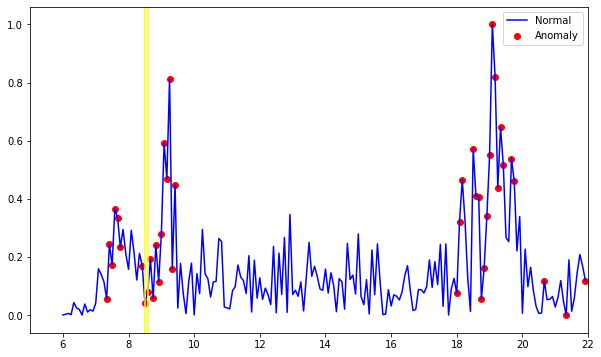

[[8.417, 8.5, 8.583, 8.667, 8.75, 8.833, 8.917, 9.0, 9.083, 9.167, 9.25, 9.333, 9.417]]
[[8.417, 8.5, 8.583, 8.667, 8.75, 8.833, 8.917, 9.0, 9.083, 9.167, 9.25, 9.333, 9.417]]
[7.333, 7.417, 7.5, 7.583, 7.667, 7.75, 8.417, 8.5, 8.583, 8.667, 8.75, 8.833, 8.917, 9.0, 9.083, 9.167, 9.25, 9.333, 9.417, 18.0, 18.083, 18.167, 18.5, 18.583, 18.667, 18.75, 18.833, 18.917, 19.0, 19.083, 19.167, 19.25, 19.333, 19.417, 19.667, 19.75, 20.667, 21.333, 21.917]
0.33
192


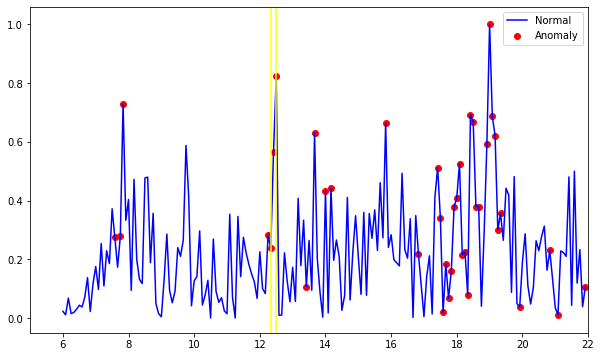

[[12.25, 12.333, 12.417, 12.5]]
[[12.25, 12.333, 12.417, 12.5]]
[7.583, 7.75, 7.833, 12.25, 12.333, 12.417, 12.5, 13.417, 13.667, 14.0, 14.167, 15.833, 16.833, 17.417, 17.5, 17.583, 17.667, 17.75, 17.833, 17.917, 18.0, 18.083, 18.167, 18.25, 18.333, 18.417, 18.5, 18.583, 18.667, 18.917, 19.0, 19.083, 19.167, 19.25, 19.333, 19.917, 20.833, 21.083, 21.917]
0.1
192


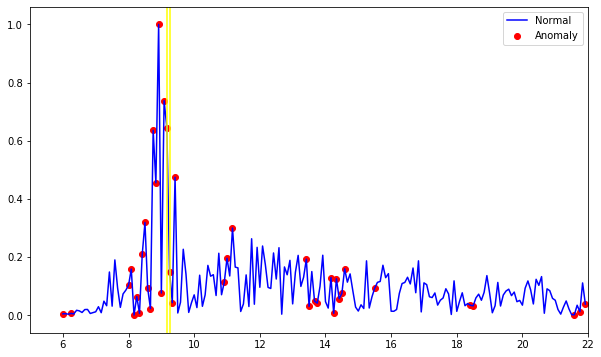

[[8.0, 8.083, 8.167, 8.25, 8.333, 8.417, 8.5, 8.583, 8.667, 8.75, 8.833, 8.917, 9.0, 9.083, 9.167, 9.25, 9.333, 9.417]]
[[8.0, 8.083, 8.167, 8.25, 8.333, 8.417, 8.5, 8.583, 8.667, 8.75, 8.833, 8.917, 9.0, 9.083, 9.167, 9.25, 9.333, 9.417]]
[6.0, 6.25, 8.0, 8.083, 8.167, 8.25, 8.333, 8.417, 8.5, 8.583, 8.667, 8.75, 8.833, 8.917, 9.0, 9.083, 9.167, 9.25, 9.333, 9.417, 10.917, 11.0, 11.167, 13.417, 13.5, 13.667, 13.75, 14.167, 14.25, 14.333, 14.417, 14.5, 14.583, 15.5, 18.417, 18.5, 21.583, 21.75, 21.917]
0.46
192


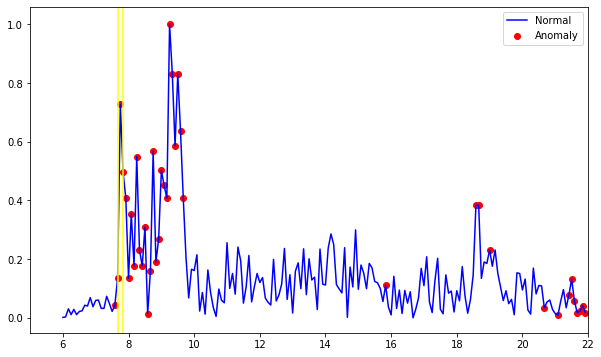

[[7.583, 7.667, 7.75, 7.833, 7.917, 8.0, 8.083, 8.167, 8.25, 8.333, 8.417, 8.5, 8.583, 8.667, 8.75, 8.833, 8.917, 9.0, 9.083, 9.167, 9.25, 9.333, 9.417, 9.5, 9.583, 9.667]]
[[7.583, 7.667, 7.75, 7.833, 7.917, 8.0, 8.083, 8.167, 8.25, 8.333, 8.417, 8.5, 8.583, 8.667, 8.75, 8.833, 8.917, 9.0, 9.083, 9.167, 9.25, 9.333, 9.417, 9.5, 9.583, 9.667]]
[7.583, 7.667, 7.75, 7.833, 7.917, 8.0, 8.083, 8.167, 8.25, 8.333, 8.417, 8.5, 8.583, 8.667, 8.75, 8.833, 8.917, 9.0, 9.083, 9.167, 9.25, 9.333, 9.417, 9.5, 9.583, 9.667, 15.833, 18.583, 18.667, 19.0, 20.667, 21.083, 21.417, 21.5, 21.583, 21.667, 21.75, 21.833, 21.917]
0.67
192


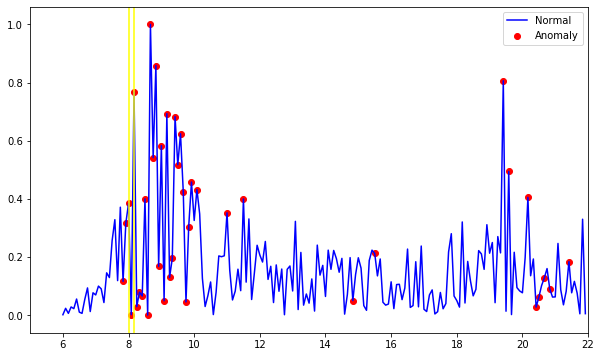

[[7.833, 7.917, 8.0, 8.083, 8.167, 8.25, 8.333, 8.417, 8.5, 8.583, 8.667, 8.75, 8.833, 8.917, 9.0, 9.083, 9.167, 9.25, 9.333, 9.417, 9.5, 9.583, 9.667, 9.75, 9.833, 9.917]]
[[7.833, 7.917, 8.0, 8.083, 8.167, 8.25, 8.333, 8.417, 8.5, 8.583, 8.667, 8.75, 8.833, 8.917, 9.0, 9.083, 9.167, 9.25, 9.333, 9.417, 9.5, 9.583, 9.667, 9.75, 9.833, 9.917]]
[7.833, 7.917, 8.0, 8.083, 8.167, 8.25, 8.333, 8.417, 8.5, 8.583, 8.667, 8.75, 8.833, 8.917, 9.0, 9.083, 9.167, 9.25, 9.333, 9.417, 9.5, 9.583, 9.667, 9.75, 9.833, 9.917, 10.083, 11.0, 11.5, 14.833, 15.5, 19.417, 19.583, 20.167, 20.417, 20.5, 20.667, 20.833, 21.417]
0.67
192


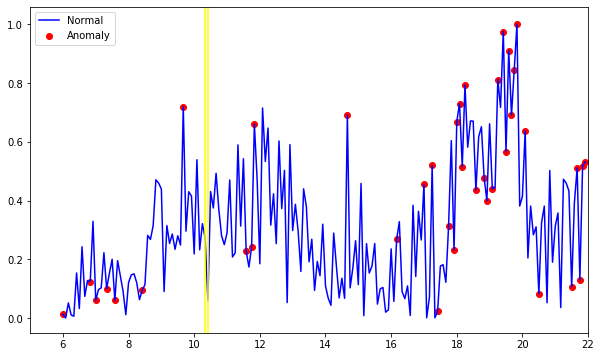

[]
[]
[6.0, 6.833, 7.0, 7.333, 7.583, 8.417, 9.667, 11.583, 11.75, 11.833, 14.667, 16.167, 17.0, 17.25, 17.417, 17.75, 17.917, 18.0, 18.083, 18.167, 18.25, 18.583, 18.833, 18.917, 19.083, 19.25, 19.417, 19.5, 19.583, 19.667, 19.75, 19.833, 20.083, 20.5, 21.5, 21.667, 21.75, 21.833, 21.917]
0
192


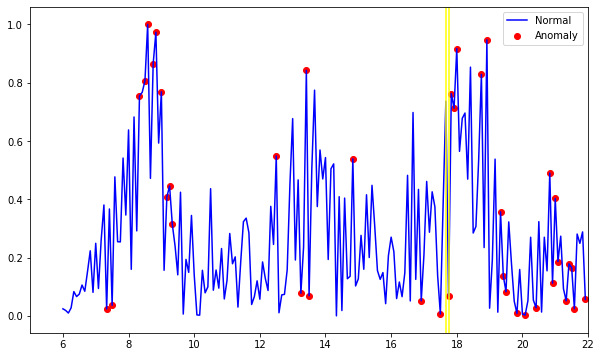

[]
[[17.75, 17.833, 17.917, 18.0]]
[7.333, 7.5, 8.333, 8.5, 8.583, 8.75, 8.833, 9.0, 9.167, 9.25, 9.333, 12.5, 13.25, 13.417, 13.5, 14.833, 16.917, 17.5, 17.75, 17.833, 17.917, 18.0, 18.75, 18.917, 19.333, 19.417, 19.5, 19.833, 20.083, 20.417, 20.833, 20.917, 21.0, 21.083, 21.333, 21.417, 21.5, 21.583, 21.917]
0.1
192


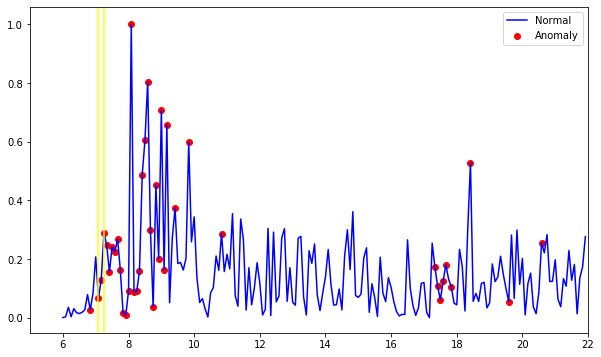

[[7.083, 7.167, 7.25, 7.333, 7.417, 7.5, 7.583, 7.667, 7.75, 7.833, 7.917, 8.0, 8.083, 8.167, 8.25, 8.333, 8.417, 8.5, 8.583, 8.667, 8.75, 8.833, 8.917, 9.0, 9.083, 9.167]]
[[7.083, 7.167, 7.25, 7.333, 7.417, 7.5, 7.583, 7.667, 7.75, 7.833, 7.917, 8.0, 8.083, 8.167, 8.25, 8.333, 8.417, 8.5, 8.583, 8.667, 8.75, 8.833, 8.917, 9.0, 9.083, 9.167]]
[6.833, 7.083, 7.167, 7.25, 7.333, 7.417, 7.5, 7.583, 7.667, 7.75, 7.833, 7.917, 8.0, 8.083, 8.167, 8.25, 8.333, 8.417, 8.5, 8.583, 8.667, 8.75, 8.833, 8.917, 9.0, 9.083, 9.167, 9.417, 9.833, 10.833, 17.333, 17.417, 17.5, 17.583, 17.667, 17.833, 18.417, 19.583, 20.583]
0.67
192


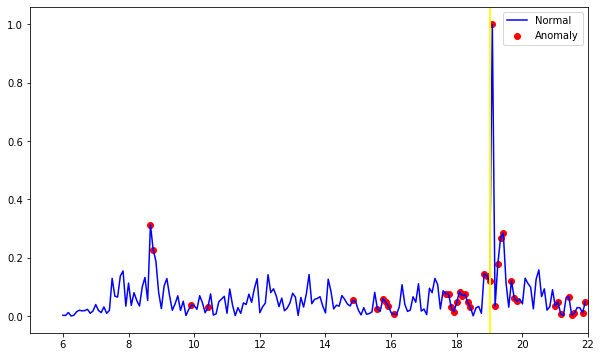

[[18.833, 18.917, 19.0, 19.083, 19.167, 19.25, 19.333, 19.417]]
[[18.833, 18.917, 19.0, 19.083, 19.167, 19.25, 19.333, 19.417]]
[8.667, 8.75, 9.917, 10.417, 14.833, 15.583, 15.75, 15.833, 15.917, 16.083, 17.667, 17.75, 17.833, 17.917, 18.0, 18.083, 18.167, 18.25, 18.333, 18.417, 18.833, 18.917, 19.0, 19.083, 19.167, 19.25, 19.333, 19.417, 19.667, 19.75, 19.833, 21.0, 21.083, 21.167, 21.417, 21.5, 21.583, 21.833, 21.917]
0.21
192


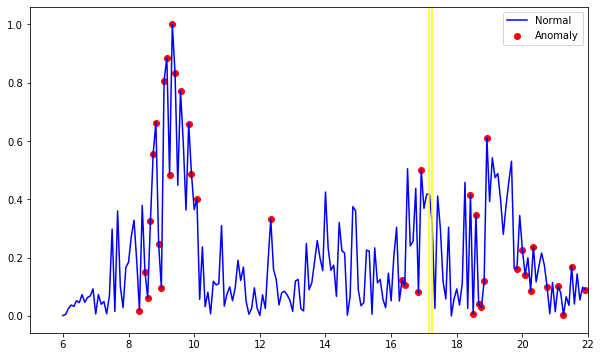

[]
[]
[8.333, 8.5, 8.583, 8.667, 8.75, 8.833, 8.917, 9.0, 9.083, 9.167, 9.25, 9.333, 9.417, 9.583, 9.833, 9.917, 10.083, 12.333, 16.333, 16.417, 16.833, 16.917, 18.417, 18.5, 18.583, 18.667, 18.75, 18.833, 18.917, 19.833, 20.0, 20.083, 20.25, 20.333, 20.75, 21.083, 21.25, 21.5, 21.917]
0
192


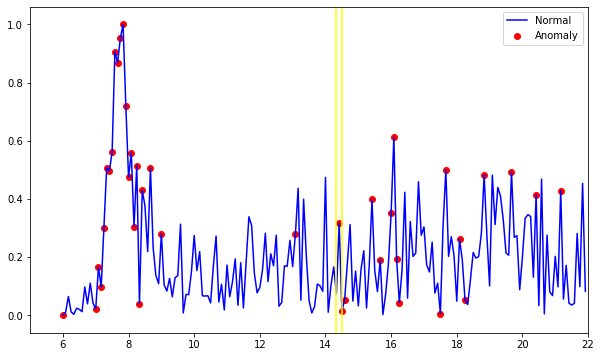

[]
[[14.417, 14.5, 14.583]]
[6.0, 7.0, 7.083, 7.167, 7.25, 7.333, 7.417, 7.5, 7.583, 7.667, 7.75, 7.833, 7.917, 8.0, 8.083, 8.167, 8.25, 8.333, 8.417, 8.667, 9.0, 13.083, 14.417, 14.5, 14.583, 15.417, 15.667, 16.0, 16.083, 16.167, 16.25, 17.5, 17.667, 18.083, 18.25, 18.833, 19.667, 20.417, 21.167]
0.08
192


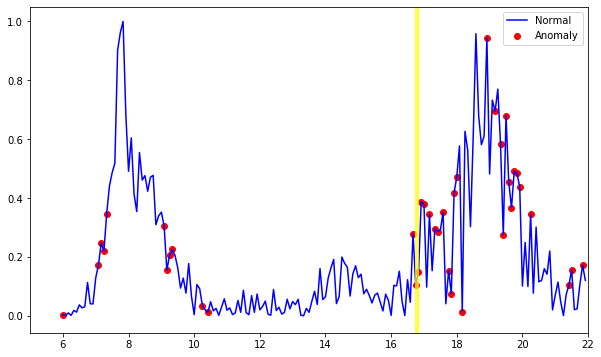

[[16.667, 16.75, 16.833, 16.917, 17.0]]
[[16.667, 16.75, 16.833, 16.917, 17.0]]
[6.0, 7.083, 7.167, 7.25, 7.333, 9.083, 9.167, 9.25, 9.333, 10.25, 10.417, 16.667, 16.75, 16.833, 16.917, 17.0, 17.167, 17.333, 17.417, 17.583, 17.75, 17.833, 17.917, 18.0, 18.167, 18.917, 19.167, 19.333, 19.417, 19.5, 19.583, 19.667, 19.75, 19.833, 19.917, 20.25, 21.417, 21.5, 21.833]
0.13
192


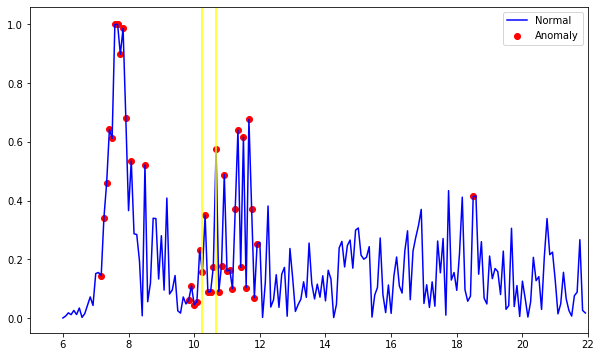

[[9.833, 9.917, 10.0, 10.083, 10.167, 10.25, 10.333, 10.417, 10.5, 10.583, 10.667, 10.75, 10.833, 10.917, 11.0, 11.083, 11.167, 11.25, 11.333, 11.417, 11.5, 11.583, 11.667, 11.75, 11.833, 11.917]]
[[9.833, 9.917, 10.0, 10.083, 10.167, 10.25, 10.333, 10.417, 10.5, 10.583, 10.667, 10.75, 10.833, 10.917, 11.0, 11.083, 11.167, 11.25, 11.333, 11.417, 11.5, 11.583, 11.667, 11.75, 11.833, 11.917]]
[7.167, 7.25, 7.333, 7.417, 7.5, 7.583, 7.667, 7.75, 7.833, 7.917, 8.083, 8.5, 9.833, 9.917, 10.0, 10.083, 10.167, 10.25, 10.333, 10.417, 10.5, 10.583, 10.667, 10.75, 10.833, 10.917, 11.0, 11.083, 11.167, 11.25, 11.333, 11.417, 11.5, 11.583, 11.667, 11.75, 11.833, 11.917, 18.5]
0.67
Counter({'True': 12, 'False': 3})
0
0.67
0.30533333333333335


In [111]:
# Anomal detection in time series: LOF (Local outlier factor): Density-based clustering
from sklearn.neighbors import LocalOutlierFactor

ACC_result = []
LOF_result = []
for i in list(range(0, len(df_line))):
    # decide observation time period
    df1 = df_line[i][(df_line[i]['Time'] >= start_time_sys) & (df_line[i]['Time'] <= end_time_sys)]
    
    X = df1[['TT_DIFF', 'EXIT_DIFF', 'ACC_DIFF', 'LINE_DIFF']]
    time = df1[['Time']]
    time = time.reset_index()
    del time['index']
    
    # Normalize the dataset
    min_max_scaler = preprocessing.MinMaxScaler()
    x_scaled = min_max_scaler.fit_transform(X)
    data = pd.DataFrame(x_scaled)
    
    # apply model
    outliers_fraction = 0.2
    model = LocalOutlierFactor(n_neighbors=35, contamination=outliers_fraction)
    a = model.fit_predict(data)
    anomaly_col = pd.DataFrame({'anomaly': a}) # Returns -1 for anomalies/outliers and 1 for inliers
    df = pd.concat([time, data, anomaly_col], axis=1)
    df.columns = ['Time', 'EXIT_DIFF', 'TT_DIFF', 'ACC_DIFF', 'LINE_DIFF', 'anomaly']
    print(len(df))
    
    # visualization
    fig, ax = plt.subplots(figsize=(10,6))

    a = df.loc[df['anomaly'] == -1, ['Time','TT_DIFF']] #anomaly

    ax.plot(df['Time'], df['TT_DIFF'], color='blue', label = 'Normal')
    ax.scatter(a['Time'],a['TT_DIFF'], color='red', label = 'Anomaly')
    x1 = inc_log['Time'].tolist()[i]
    x2 = inc_log['End_time'].tolist()[i]
    plt.axvline(x1, color='yellow')
    plt.axvline(x2, color='yellow')
    plt.legend()
    plt.xlim(start_time_sys-1, end_time_sys)
    # plt.savefig('C:/Users/Tenyu/Desktop/Jan 5th, 2020/ABNORMAL/' + 'ISOLATION_TREE_10_min' + '.png')
    plt.show()
    
    

        # The following loop is used to include uncaptured anomaly points
    time_list = list(a['Time'])

    if time_list == []:
        correct_num == 0
    else:
        # The following split list by a certain interval
#         print(time_list)
        l = time_list
        split_list = []
        templist = [l.pop(0)]
        while len(l)>0:
            x = l.pop(0)
            if x - templist[-1] > 0.085:
                split_list.append(templist)
                templist = [x]
            else: 
                templist.append(x)
        split_list.append(templist)
    
 
        matching_1 = [s for s in split_list if x1 in s]
        matching_2 = [s for s in split_list if x2 in s]
        time_list = list(a['Time'])
        

        
        if (matching_1 == []) and (matching_2 == []):
            correct_num = 0
        elif (matching_1 == []) and (matching_2 != []):
            correct_num = len(matching_2[0])/len(time_list)
        elif (matching_2 == []) and (matching_1 != []):
            correct_num = len(matching_1[0])/len(time_list)
        elif matching_1 == matching_2:
            correct_num = len(matching_1[0])/len(time_list)
        elif (matching_1 != 0 and matching_2 != 0 and matching_1 != matching_2):
            correct_num = (len(matching_1[0])+len(matching_2[0]))/len(time_list)

            
        #  count how many single value is within a range
        def count(list1, l, r): 
            return len(list(x for x in list1 if l <= x <= r)) 
        count_num_sin = count(time_list, x1, x2)
    
        if (correct_num == 0) and (count_num_sin != 0):
            correct_num = count_num_sin/len(time_list)
        else:
            correct_num
            
    print(matching_1)
    print(matching_2)
    print(time_list)
    accuracy = round(correct_num, 2)
    print(accuracy)
    ACC_result.append(accuracy)    
    
    
    # Judge if the seleced time window contains the abnomal value
    judge = a[(a['Time'] >= x1) & (a['Time'] <= x2)]
    if judge.empty:
        result = 'False'
    else:
        result = 'True'
    LOF_result.append(result)

    
from collections import Counter
counter = Counter(LOF_result)

# Print out all results
print(counter)
print(min(ACC_result))
print(max(ACC_result))
print(sum(ACC_result)/len(ACC_result))

192


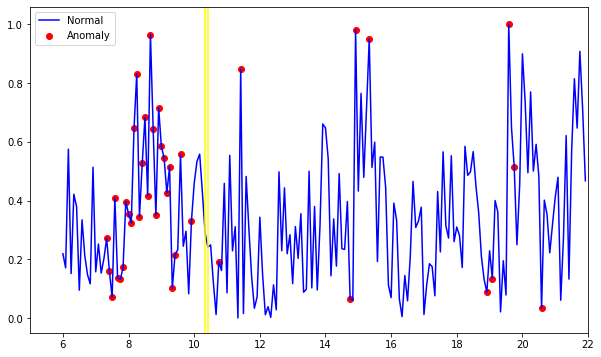

[]
[]
[7.333, 7.417, 7.5, 7.583, 7.667, 7.75, 7.833, 7.917, 8.0, 8.083, 8.167, 8.25, 8.333, 8.417, 8.5, 8.583, 8.667, 8.75, 8.833, 8.917, 9.0, 9.083, 9.167, 9.25, 9.333, 9.417, 9.583, 9.917, 10.75, 11.417, 14.75, 14.917, 15.333, 18.917, 19.083, 19.583, 19.75, 20.583]
0
192


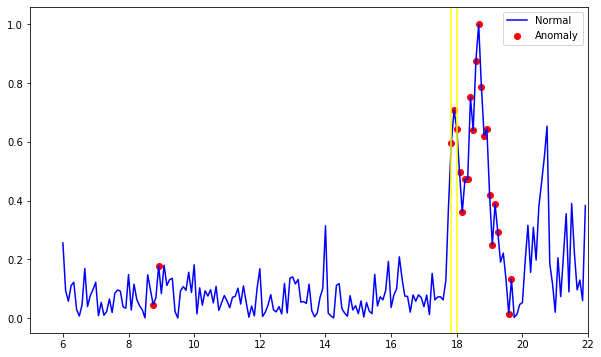

[[17.833, 17.917, 18.0, 18.083, 18.167, 18.25, 18.333, 18.417, 18.5, 18.583, 18.667, 18.75, 18.833, 18.917, 19.0, 19.083, 19.167, 19.25]]
[[17.833, 17.917, 18.0, 18.083, 18.167, 18.25, 18.333, 18.417, 18.5, 18.583, 18.667, 18.75, 18.833, 18.917, 19.0, 19.083, 19.167, 19.25]]
[8.75, 8.917, 17.833, 17.917, 18.0, 18.083, 18.167, 18.25, 18.333, 18.417, 18.5, 18.583, 18.667, 18.75, 18.833, 18.917, 19.0, 19.083, 19.167, 19.25, 19.583, 19.667]
0.82
192


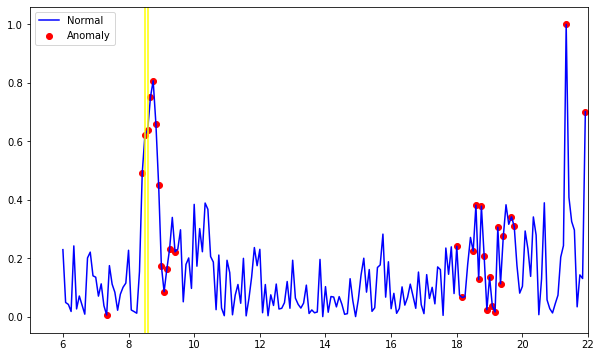

[[8.417, 8.5, 8.583, 8.667, 8.75, 8.833, 8.917, 9.0, 9.083, 9.167, 9.25]]
[[8.417, 8.5, 8.583, 8.667, 8.75, 8.833, 8.917, 9.0, 9.083, 9.167, 9.25]]
[7.333, 8.417, 8.5, 8.583, 8.667, 8.75, 8.833, 8.917, 9.0, 9.083, 9.167, 9.25, 9.417, 18.0, 18.167, 18.5, 18.583, 18.667, 18.75, 18.833, 18.917, 19.0, 19.083, 19.167, 19.25, 19.333, 19.417, 19.667, 19.75, 21.333, 21.917]
0.35
192


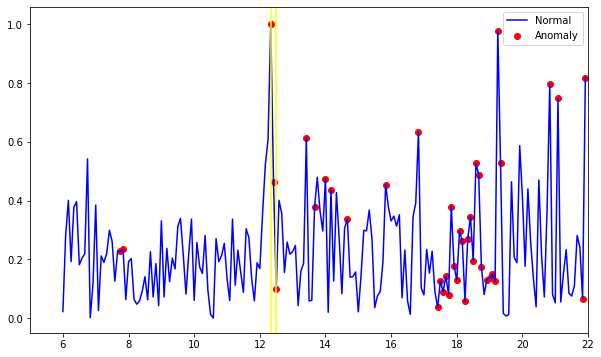

[[12.333, 12.417, 12.5]]
[[12.333, 12.417, 12.5]]
[7.75, 7.833, 12.333, 12.417, 12.5, 13.417, 13.667, 14.0, 14.167, 14.667, 15.833, 16.833, 17.417, 17.5, 17.583, 17.667, 17.75, 17.833, 17.917, 18.0, 18.083, 18.167, 18.25, 18.333, 18.417, 18.5, 18.583, 18.667, 18.75, 18.917, 19.0, 19.083, 19.167, 19.25, 19.333, 20.833, 21.083, 21.833, 21.917]
0.08
192


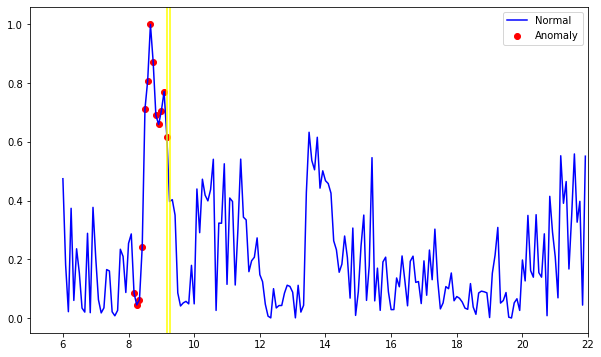

[[8.167, 8.25, 8.333, 8.417, 8.5, 8.583, 8.667, 8.75, 8.833, 8.917, 9.0, 9.083, 9.167]]
[]
[8.167, 8.25, 8.333, 8.417, 8.5, 8.583, 8.667, 8.75, 8.833, 8.917, 9.0, 9.083, 9.167]
1.0
192


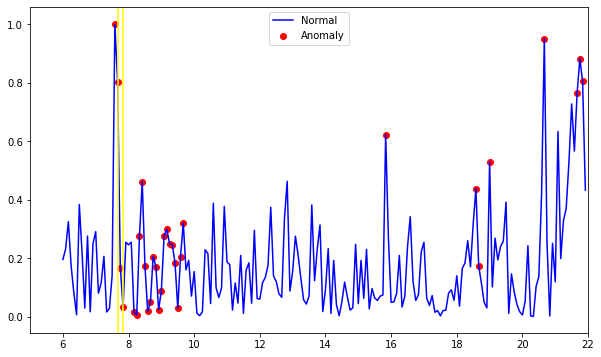

[[7.583, 7.667, 7.75, 7.833]]
[[7.583, 7.667, 7.75, 7.833]]
[7.583, 7.667, 7.75, 7.833, 8.167, 8.25, 8.333, 8.417, 8.5, 8.583, 8.667, 8.75, 8.833, 8.917, 9.0, 9.083, 9.167, 9.25, 9.333, 9.417, 9.5, 9.583, 9.667, 15.833, 18.583, 18.667, 19.0, 20.667, 21.667, 21.75, 21.833]
0.13
192


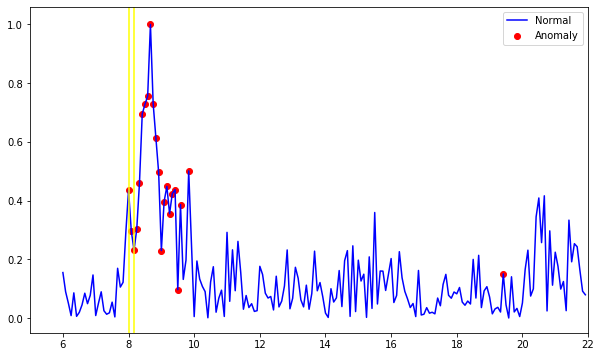

[[8.0, 8.083, 8.167, 8.25, 8.333, 8.417, 8.5, 8.583, 8.667, 8.75, 8.833, 8.917, 9.0, 9.083, 9.167, 9.25, 9.333, 9.417, 9.5, 9.583]]
[[8.0, 8.083, 8.167, 8.25, 8.333, 8.417, 8.5, 8.583, 8.667, 8.75, 8.833, 8.917, 9.0, 9.083, 9.167, 9.25, 9.333, 9.417, 9.5, 9.583]]
[8.0, 8.083, 8.167, 8.25, 8.333, 8.417, 8.5, 8.583, 8.667, 8.75, 8.833, 8.917, 9.0, 9.083, 9.167, 9.25, 9.333, 9.417, 9.5, 9.583, 9.833, 19.417]
0.91
192


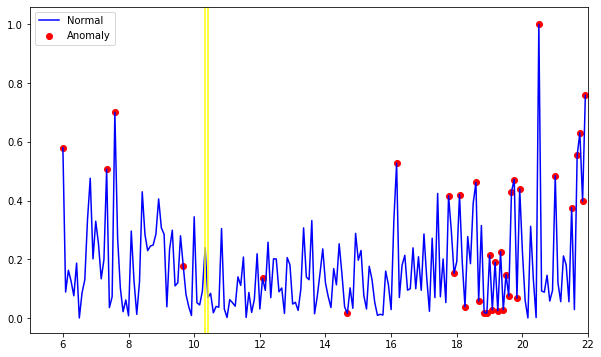

[]
[]
[6.0, 7.333, 7.583, 9.667, 12.083, 14.667, 16.167, 17.75, 17.917, 18.083, 18.25, 18.583, 18.667, 18.833, 18.917, 19.0, 19.083, 19.167, 19.25, 19.333, 19.417, 19.5, 19.583, 19.667, 19.75, 19.833, 19.917, 20.5, 21.0, 21.5, 21.667, 21.75, 21.833, 21.917]
0
192


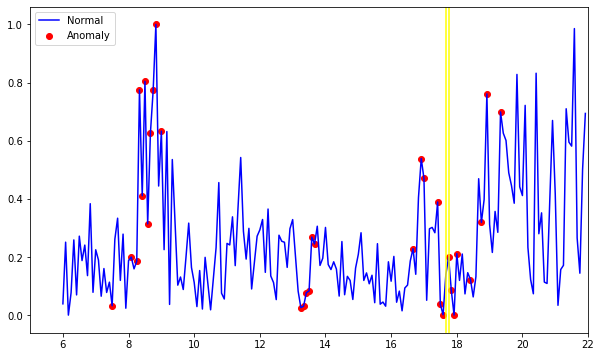

[]
[[17.75, 17.833, 17.917, 18.0]]
[7.5, 8.083, 8.25, 8.333, 8.417, 8.5, 8.583, 8.667, 8.75, 8.833, 9.0, 13.25, 13.333, 13.417, 13.5, 13.583, 13.667, 16.667, 16.917, 17.0, 17.417, 17.5, 17.583, 17.75, 17.833, 17.917, 18.0, 18.417, 18.75, 18.917, 19.333]
0.13
192


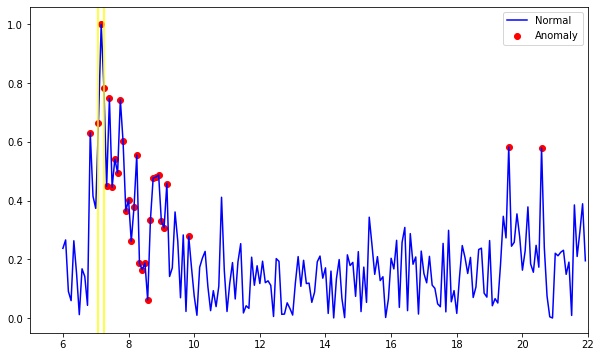

[[7.083, 7.167, 7.25, 7.333, 7.417, 7.5, 7.583, 7.667, 7.75, 7.833, 7.917, 8.0, 8.083, 8.167, 8.25, 8.333, 8.417, 8.5, 8.583, 8.667, 8.75, 8.833, 8.917, 9.0, 9.083, 9.167]]
[[7.083, 7.167, 7.25, 7.333, 7.417, 7.5, 7.583, 7.667, 7.75, 7.833, 7.917, 8.0, 8.083, 8.167, 8.25, 8.333, 8.417, 8.5, 8.583, 8.667, 8.75, 8.833, 8.917, 9.0, 9.083, 9.167]]
[6.833, 7.083, 7.167, 7.25, 7.333, 7.417, 7.5, 7.583, 7.667, 7.75, 7.833, 7.917, 8.0, 8.083, 8.167, 8.25, 8.333, 8.417, 8.5, 8.583, 8.667, 8.75, 8.833, 8.917, 9.0, 9.083, 9.167, 9.833, 19.583, 20.583]
0.87
192


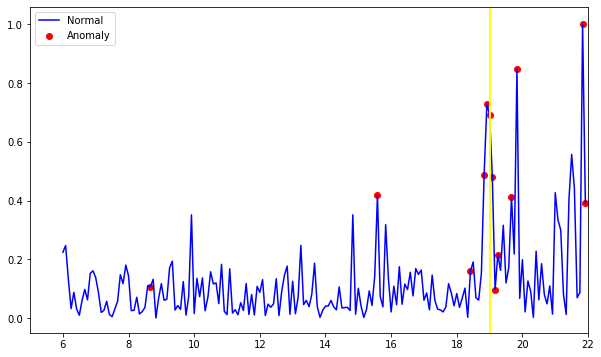

[[18.833, 18.917, 19.0, 19.083, 19.167, 19.25]]
[[18.833, 18.917, 19.0, 19.083, 19.167, 19.25]]
[8.667, 15.583, 18.417, 18.833, 18.917, 19.0, 19.083, 19.167, 19.25, 19.667, 19.833, 21.833, 21.917]
0.46
192


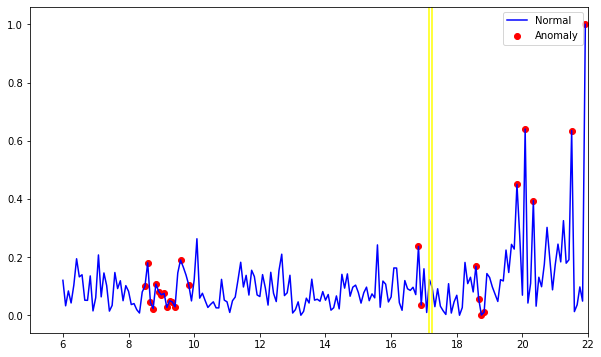

[]
[]
[8.5, 8.583, 8.667, 8.75, 8.833, 8.917, 9.0, 9.083, 9.167, 9.25, 9.333, 9.417, 9.583, 9.833, 16.833, 16.917, 18.583, 18.667, 18.75, 18.833, 19.833, 20.083, 20.333, 21.5, 21.917]
0
192


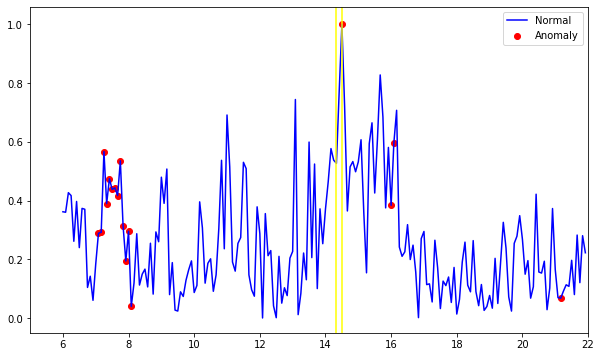

[]
[[14.5]]
[7.083, 7.167, 7.25, 7.333, 7.417, 7.5, 7.583, 7.667, 7.75, 7.833, 7.917, 8.0, 8.083, 14.5, 16.0, 16.083, 21.167]
0.06
192


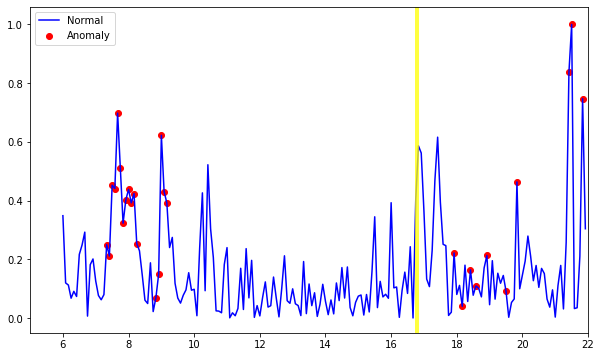

[]
[]
[7.333, 7.417, 7.5, 7.583, 7.667, 7.75, 7.833, 7.917, 8.0, 8.083, 8.167, 8.25, 8.833, 8.917, 9.0, 9.083, 9.167, 17.917, 18.167, 18.417, 18.583, 18.917, 19.5, 19.833, 21.417, 21.5, 21.833]
0
192


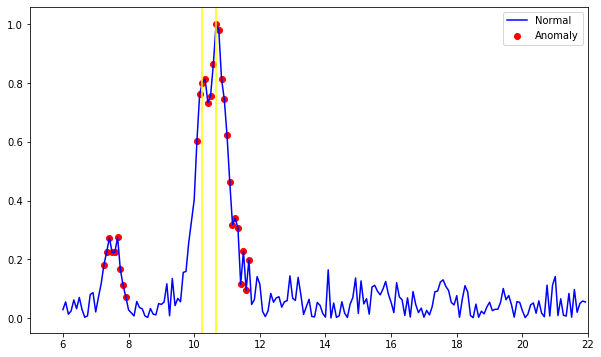

[[10.083, 10.167, 10.25, 10.333, 10.417, 10.5, 10.583, 10.667, 10.75, 10.833, 10.917, 11.0, 11.083, 11.167, 11.25, 11.333, 11.417, 11.5, 11.583, 11.667]]
[[10.083, 10.167, 10.25, 10.333, 10.417, 10.5, 10.583, 10.667, 10.75, 10.833, 10.917, 11.0, 11.083, 11.167, 11.25, 11.333, 11.417, 11.5, 11.583, 11.667]]
[7.25, 7.333, 7.417, 7.5, 7.583, 7.667, 7.75, 7.833, 7.917, 10.083, 10.167, 10.25, 10.333, 10.417, 10.5, 10.583, 10.667, 10.75, 10.833, 10.917, 11.0, 11.083, 11.167, 11.25, 11.333, 11.417, 11.5, 11.583, 11.667]
0.69
Counter({'True': 11, 'False': 4})
0
1.0
0.36666666666666664


In [112]:
# Anomal detection in time series (DBSCAN)
from sklearn.cluster import DBSCAN 
from sklearn.preprocessing import StandardScaler 
from sklearn.preprocessing import normalize 
from sklearn.decomposition import PCA
from sklearn.datasets import load_iris
from sklearn.preprocessing import MinMaxScaler
from sklearn import preprocessing


ACC_result = []
DBSCAN_result = []
for i in list(range(0, len(df_line))):
    df = df_line[i][df_line[i]['Time'] >= start_time_sys]
    X = df[['EXIT_DIFF', 'TT_DIFF', 'ACC_DIFF', 'LINE_DIFF']]
    
    time = df1[['Time']]
    time = time.reset_index()
    del time['index']
    
    # Normalize the dataset
    min_max_scaler = preprocessing.MinMaxScaler()
    x_scaled = min_max_scaler.fit_transform(X)
    data = pd.DataFrame(x_scaled)
    
    # DBSCAN
    outlier_detection = DBSCAN(eps = .2, metric='euclidean', min_samples = 5, n_jobs = -1)
    clusters = outlier_detection.fit_predict(data)

    anomaly_col = pd.DataFrame({'anomaly': clusters}) # Returns -1 for anomalies/outliers and 1 for inliers
    df = pd.concat([time, data, anomaly_col], axis=1)
    df.columns = ['Time', 'EXIT_DIFF', 'TT_DIFF', 'ACC_DIFF', 'LINE_DIFF', 'anomaly']
    print(len(df))
    
    # visualization
    fig, ax = plt.subplots(figsize=(10,6))

    a = df.loc[df['anomaly'] == -1, ['Time','TT_DIFF']] #anomaly

    ax.plot(df['Time'], df['TT_DIFF'], color='blue', label = 'Normal')
    ax.scatter(a['Time'],a['TT_DIFF'], color='red', label = 'Anomaly')
    x1 = inc_log['Time'].tolist()[i]
    x2 = inc_log['End_time'].tolist()[i]
    plt.axvline(x1, color='yellow')
    plt.axvline(x2, color='yellow')
    plt.legend()
    plt.xlim(start_time_sys-1, end_time_sys)
    # plt.savefig('C:/Users/Tenyu/Desktop/Jan 5th, 2020/ABNORMAL/' + 'ISOLATION_TREE_10_min' + '.png')
    plt.show()


        # The following loop is used to include uncaptured anomaly points
    time_list = list(a['Time'])

    if time_list == []:
        correct_num == 0
    else:
        # The following split list by a certain interval
#         print(time_list)
        l = time_list
        split_list = []
        templist = [l.pop(0)]
        while len(l)>0:
            x = l.pop(0)
            if x - templist[-1] > 0.085:
                split_list.append(templist)
                templist = [x]
            else: 
                templist.append(x)
        split_list.append(templist)
    
 
        matching_1 = [s for s in split_list if x1 in s]
        matching_2 = [s for s in split_list if x2 in s]
        time_list = list(a['Time'])

        
        if (matching_1 == []) and (matching_2 == []):
            correct_num = 0
        elif (matching_1 == []) and (matching_2 != []):
            correct_num = len(matching_2[0])/len(time_list)
        elif (matching_2 == []) and (matching_1 != []):
            correct_num = len(matching_1[0])/len(time_list)
        elif matching_1 == matching_2:
            correct_num = len(matching_1[0])/len(time_list)
        elif (matching_1 != 0 and matching_2 != 0 and matching_1 != matching_2):
            correct_num = (len(matching_1[0])+len(matching_2[0]))/len(time_list)

            
        #  count how many single value is within a range
        def count(list1, l, r): 
            return len(list(x for x in list1 if l <= x <= r)) 
        count_num_sin = count(time_list, x1, x2)
    
        if (correct_num == 0) and (count_num_sin != 0):
            correct_num = count_num_sin/len(time_list)
        else:
            correct_num
            
    print(matching_1)
    print(matching_2)
    print(time_list)
    accuracy = round(correct_num, 2)
    print(accuracy)
    ACC_result.append(accuracy)    
    
    
    # Judge if the seleced time window contains the abnomal value
    judge = a[(a['Time'] >= x1) & (a['Time'] <= x2)]
    if judge.empty:
        result = 'False'
    else:
        result = 'True'
    DBSCAN_result.append(result)

    
from collections import Counter
counter = Counter(DBSCAN_result)


# Print out all results
print(counter)
print(min(ACC_result))
print(max(ACC_result))
print(sum(ACC_result)/len(ACC_result))

192


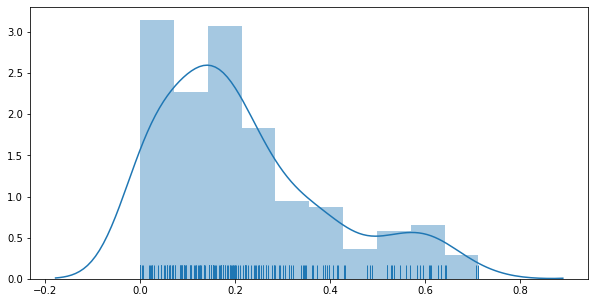

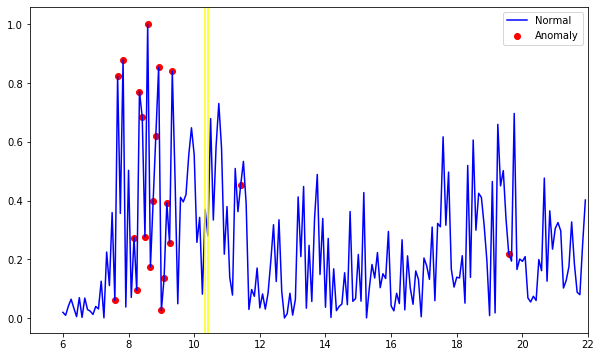

[]
[]
[7.583, 7.667, 7.833, 8.167, 8.25, 8.333, 8.417, 8.5, 8.583, 8.667, 8.75, 8.833, 8.917, 9.0, 9.083, 9.167, 9.25, 9.333, 11.417, 19.583]
0
192


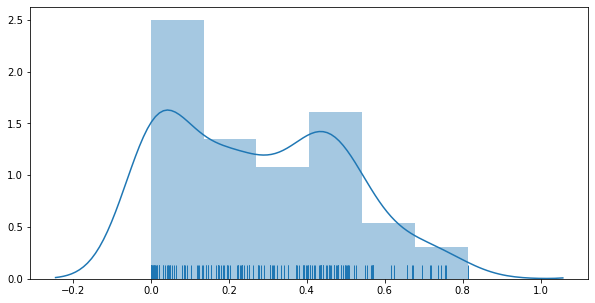

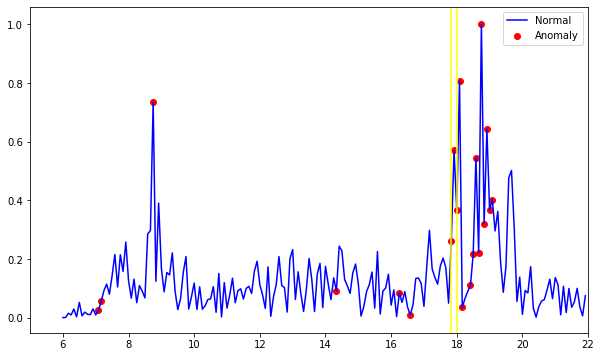

[[17.833, 17.917, 18.0, 18.083, 18.167]]
[[17.833, 17.917, 18.0, 18.083, 18.167]]
[7.083, 7.167, 8.75, 14.333, 16.25, 16.583, 17.833, 17.917, 18.0, 18.083, 18.167, 18.417, 18.5, 18.583, 18.667, 18.75, 18.833, 18.917, 19.0, 19.083]
0.25
192


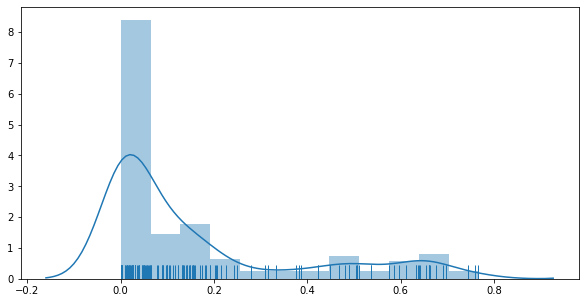

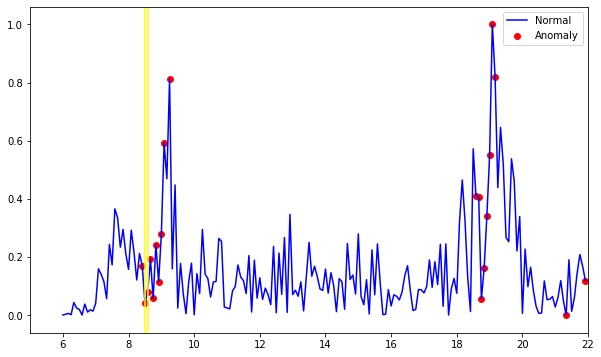

[[8.417, 8.5, 8.583, 8.667, 8.75, 8.833, 8.917, 9.0, 9.083]]
[[8.417, 8.5, 8.583, 8.667, 8.75, 8.833, 8.917, 9.0, 9.083]]
[8.417, 8.5, 8.583, 8.667, 8.75, 8.833, 8.917, 9.0, 9.083, 9.25, 18.583, 18.667, 18.75, 18.833, 18.917, 19.0, 19.083, 19.167, 21.333, 21.917]
0.45
192


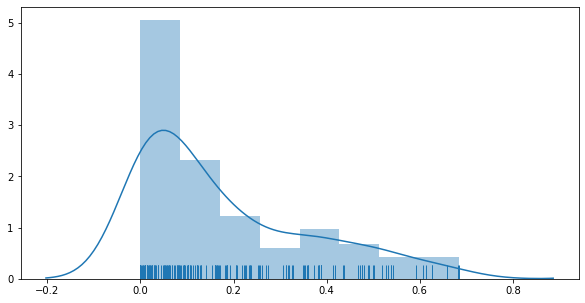

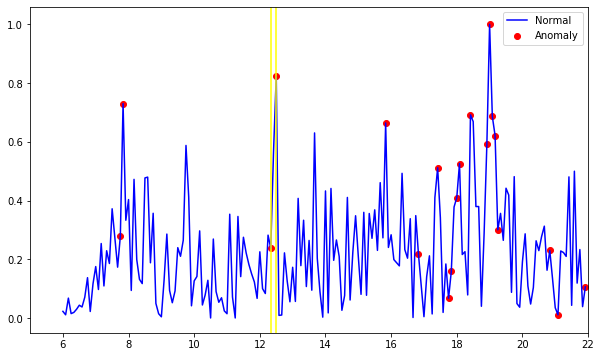

[[12.333]]
[[12.5]]
[7.75, 7.833, 12.333, 12.5, 15.833, 16.833, 17.417, 17.75, 17.833, 18.0, 18.083, 18.417, 18.917, 19.0, 19.083, 19.167, 19.25, 20.833, 21.083, 21.917]
0.1
192


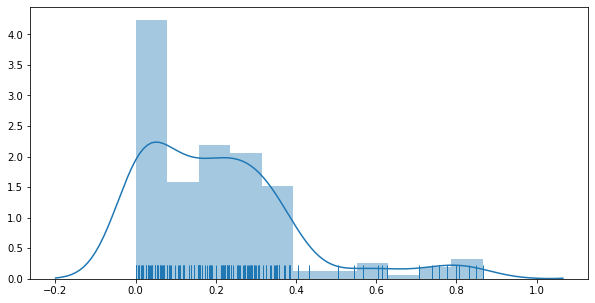

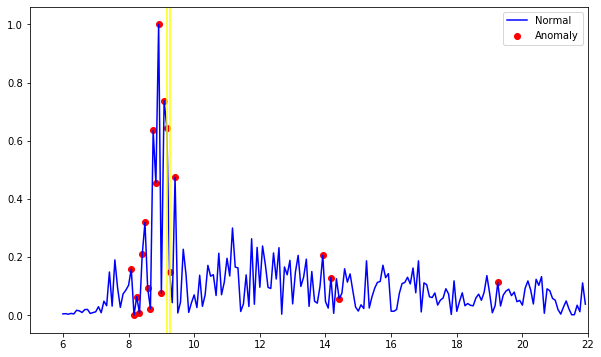

[[8.083, 8.167, 8.25, 8.333, 8.417, 8.5, 8.583, 8.667, 8.75, 8.833, 8.917, 9.0, 9.083, 9.167, 9.25]]
[[8.083, 8.167, 8.25, 8.333, 8.417, 8.5, 8.583, 8.667, 8.75, 8.833, 8.917, 9.0, 9.083, 9.167, 9.25]]
[8.083, 8.167, 8.25, 8.333, 8.417, 8.5, 8.583, 8.667, 8.75, 8.833, 8.917, 9.0, 9.083, 9.167, 9.25, 9.417, 13.917, 14.167, 14.417, 19.25]
0.75
192


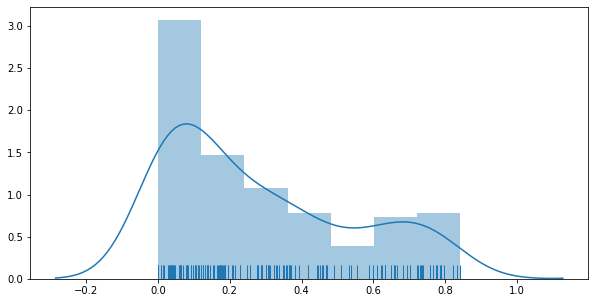

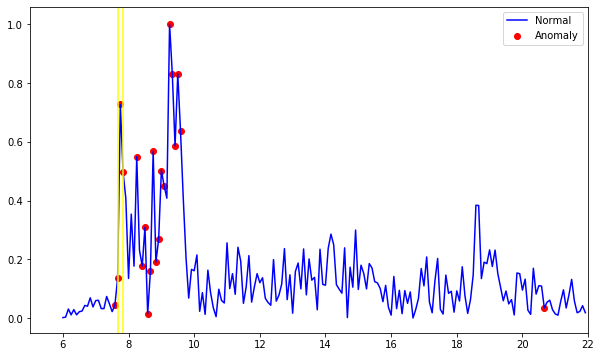

[[7.583, 7.667, 7.75, 7.833]]
[[7.583, 7.667, 7.75, 7.833]]
[7.583, 7.667, 7.75, 7.833, 8.25, 8.417, 8.5, 8.583, 8.667, 8.75, 8.833, 8.917, 9.0, 9.083, 9.25, 9.333, 9.417, 9.5, 9.583, 20.667]
0.2
192


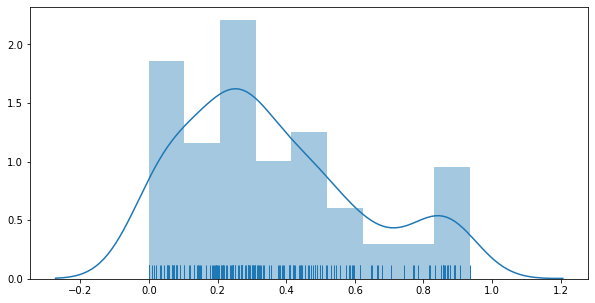

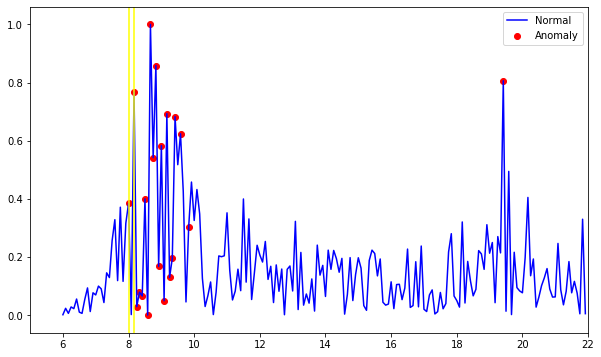

[[8.0]]
[[8.167, 8.25, 8.333, 8.417, 8.5, 8.583, 8.667, 8.75, 8.833, 8.917, 9.0, 9.083, 9.167, 9.25, 9.333, 9.417]]
[8.0, 8.167, 8.25, 8.333, 8.417, 8.5, 8.583, 8.667, 8.75, 8.833, 8.917, 9.0, 9.083, 9.167, 9.25, 9.333, 9.417, 9.583, 9.833, 19.417]
0.85
192


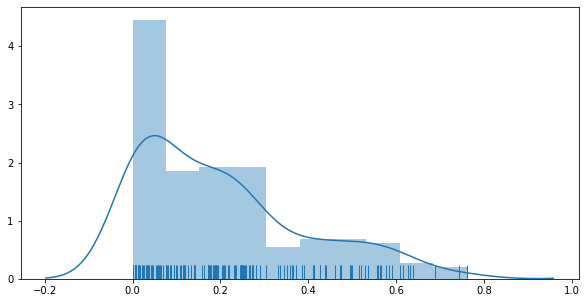

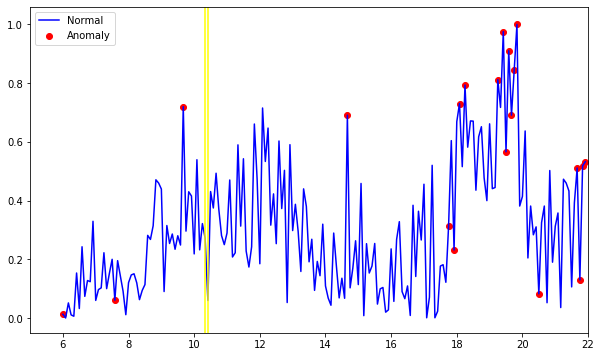

[]
[]
[6.0, 7.583, 9.667, 14.667, 17.75, 17.917, 18.083, 18.25, 19.25, 19.417, 19.5, 19.583, 19.667, 19.75, 19.833, 20.5, 21.667, 21.75, 21.833, 21.917]
0
192


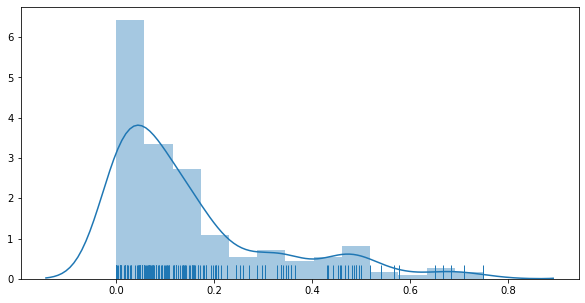

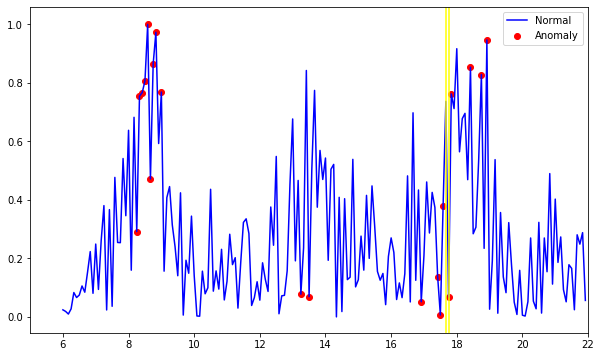

[]
[[17.75, 17.833]]
[8.25, 8.333, 8.417, 8.5, 8.583, 8.667, 8.75, 8.833, 9.0, 13.25, 13.5, 16.917, 17.417, 17.5, 17.583, 17.75, 17.833, 18.417, 18.75, 18.917]
0.1
192


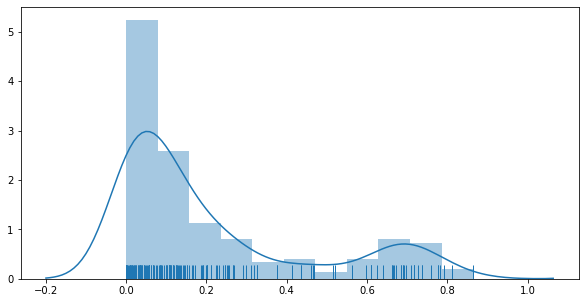

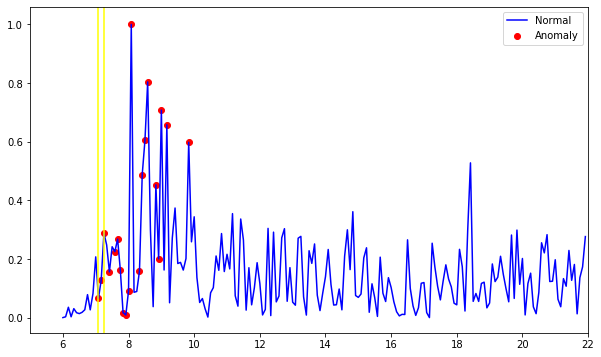

[[7.083, 7.167, 7.25]]
[[7.083, 7.167, 7.25]]
[7.083, 7.167, 7.25, 7.417, 7.583, 7.667, 7.75, 7.833, 7.917, 8.0, 8.083, 8.333, 8.417, 8.5, 8.583, 8.833, 8.917, 9.0, 9.167, 9.833]
0.15
192


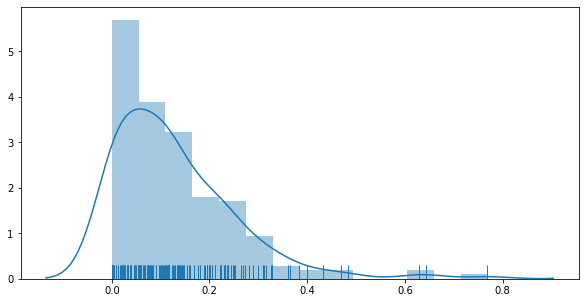

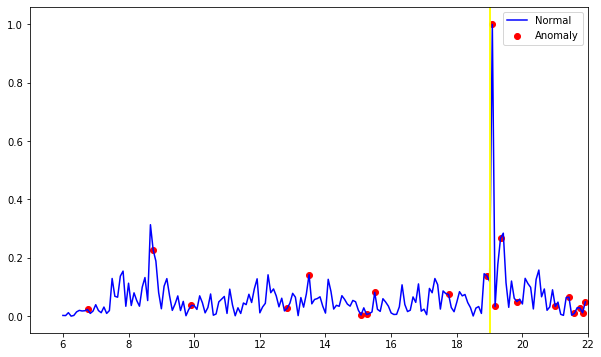

[]
[]
[6.75, 8.75, 9.917, 12.833, 13.5, 15.083, 15.25, 15.5, 17.75, 18.917, 19.083, 19.167, 19.333, 19.833, 21.0, 21.417, 21.583, 21.75, 21.833, 21.917]
0
192


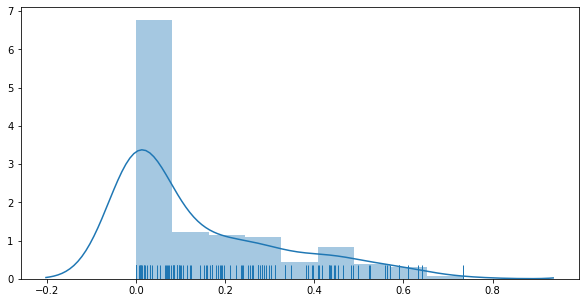

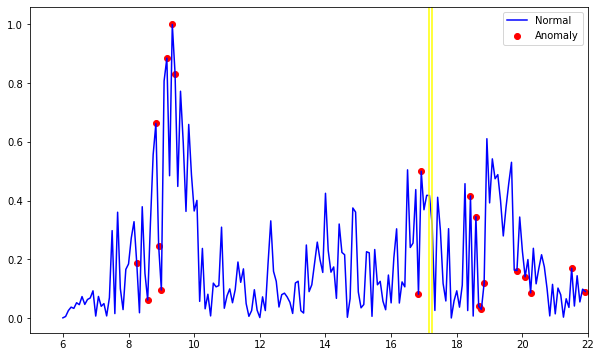

[]
[]
[8.25, 8.583, 8.833, 8.917, 9.0, 9.167, 9.333, 9.417, 16.833, 16.917, 18.417, 18.583, 18.667, 18.75, 18.833, 19.833, 20.083, 20.25, 21.5, 21.917]
0
192


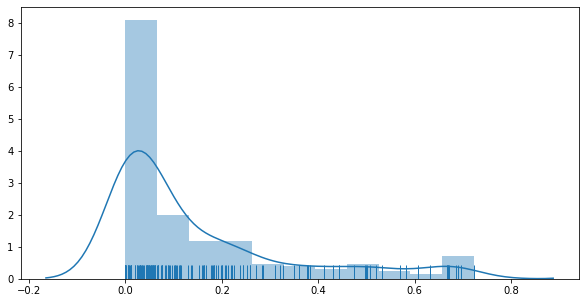

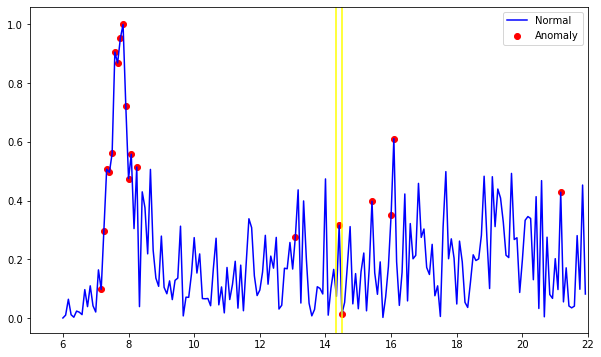

[]
[[14.417, 14.5]]
[7.167, 7.25, 7.333, 7.417, 7.5, 7.583, 7.667, 7.75, 7.833, 7.917, 8.0, 8.083, 8.25, 13.083, 14.417, 14.5, 15.417, 16.0, 16.083, 21.167]
0.1
192


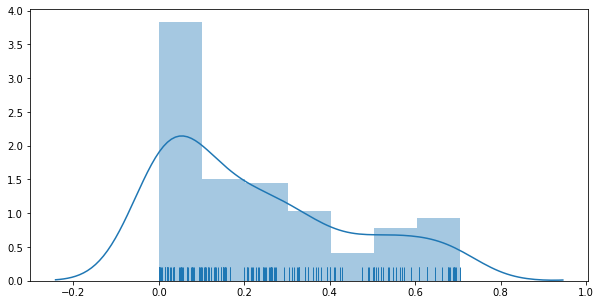

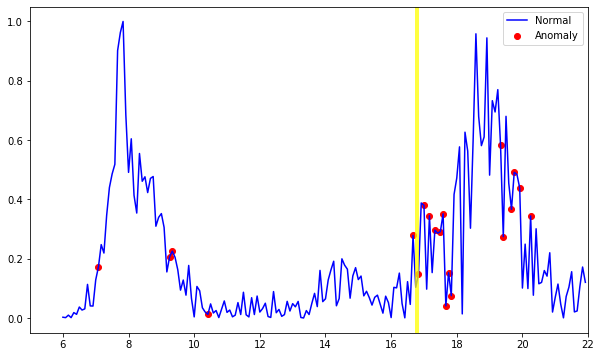

[]
[[16.833]]
[7.083, 9.25, 9.333, 10.417, 16.667, 16.833, 17.0, 17.167, 17.333, 17.5, 17.583, 17.667, 17.75, 17.833, 19.333, 19.417, 19.667, 19.75, 19.917, 20.25]
0.05
192


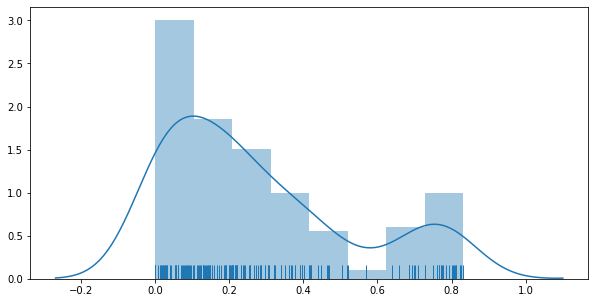

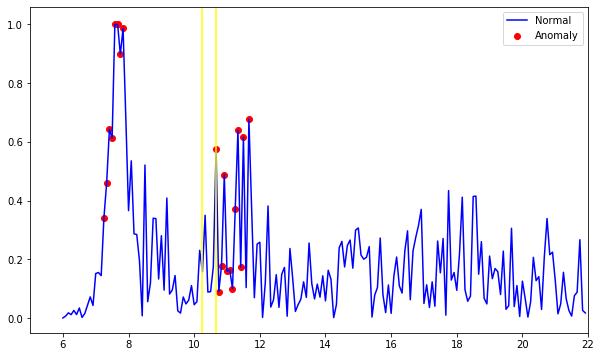

[]
[[10.667, 10.75, 10.833, 10.917, 11.0, 11.083, 11.167, 11.25, 11.333, 11.417, 11.5]]
[7.25, 7.333, 7.417, 7.5, 7.583, 7.667, 7.75, 7.833, 10.667, 10.75, 10.833, 10.917, 11.0, 11.083, 11.167, 11.25, 11.333, 11.417, 11.5, 11.667]
0.55
Counter({'True': 11, 'False': 4})
0
0.85
0.23666666666666666


In [123]:
# Anomal detection in time series (HDBSCAN)
import hdbscan
from sklearn.datasets import make_blobs

ACC_result = []
HDBSCAN_result = []
for i in list(range(0, len(df_line))): 
    df1 = df_line[i][(df_line[i]['Time'] >= start_time_sys) & (df_line[i]['Time'] <= end_time_sys)]
    
    time = df1[['Time']]
    time = time.reset_index()
    del time['index']
    
    X = df1[['TT_DIFF', 'EXIT_DIFF', 'ACC_DIFF', 'LINE_DIFF']]
    
    # Normalize the dataset
    min_max_scaler = preprocessing.MinMaxScaler()
    x_scaled = min_max_scaler.fit_transform(X)
    data = pd.DataFrame(x_scaled)


    clusterer = hdbscan.HDBSCAN(min_cluster_size=5).fit(data)
    sns.distplot(clusterer.outlier_scores_[np.isfinite(clusterer.outlier_scores_)], rug=True)
    threshold = pd.Series(clusterer.outlier_scores_).quantile(0.90)
    outlier_score_list = list(clusterer.outlier_scores_)

    anomaly_col = pd.DataFrame({'anomaly_1': outlier_score_list}) # Returns -1 for anomalies/outliers and 1 for inliers
    df = pd.concat([time, data, anomaly_col], axis=1)
    df.columns = ['Time', 'EXIT_DIFF', 'TT_DIFF', 'ACC_DIFF', 'LINE_DIFF', 'anomaly_1']
    
    def conditions(s):
        if s['anomaly_1'] > threshold:
            return 1
        else:
            return 0 
    
    df['anomaly'] = df.apply(lambda row: conditions(row), axis=1)
    
    print(len(df))
    
    
    # visualization
    fig, ax = plt.subplots(figsize=(10,6))

    a = df.loc[df['anomaly'] == 1, ['Time','TT_DIFF']] #anomaly

    ax.plot(df['Time'], df['TT_DIFF'], color='blue', label = 'Normal')
    ax.scatter(a['Time'],a['TT_DIFF'], color='red', label = 'Anomaly')
    x1 = inc_log['Time'].tolist()[i]
    x2 = inc_log['End_time'].tolist()[i]
    plt.axvline(x1, color='yellow')
    plt.axvline(x2, color='yellow')
    plt.legend()
    plt.xlim(start_time_sys-1, end_time_sys)
    # plt.savefig('C:/Users/Tenyu/Desktop/Jan 5th, 2020/ABNORMAL/' + 'ISOLATION_TREE_10_min' + '.png')
    plt.show()


        # The following loop is used to include uncaptured anomaly points
    time_list = list(a['Time'])

    if time_list == []:
        correct_num == 0
    else:
        # The following split list by a certain interval
#         print(time_list)
        l = time_list
        split_list = []
        templist = [l.pop(0)]
        while len(l)>0:
            x = l.pop(0)
            if x - templist[-1] > 0.085:
                split_list.append(templist)
                templist = [x]
            else: 
                templist.append(x)
        split_list.append(templist)
    
 
        matching_1 = [s for s in split_list if x1 in s]
        matching_2 = [s for s in split_list if x2 in s]
        time_list = list(a['Time'])
    

        
        if (matching_1 == []) and (matching_2 == []):
            correct_num = 0
        elif (matching_1 == []) and (matching_2 != []):
            correct_num = len(matching_2[0])/len(time_list)
        elif (matching_2 == []) and (matching_1 != []):
            correct_num = len(matching_1[0])/len(time_list)
        elif matching_1 == matching_2:
            correct_num = len(matching_1[0])/len(time_list)
        elif (matching_1 != 0 and matching_2 != 0 and matching_1 != matching_2):
            correct_num = (len(matching_1[0])+len(matching_2[0]))/len(time_list)

            
        #  count how many single value is within a range
        def count(list1, l, r): 
            return len(list(x for x in list1 if l <= x <= r)) 
        count_num_sin = count(time_list, x1, x2)
    
        if (correct_num == 0) and (count_num_sin != 0):
            correct_num = count_num_sin/len(time_list)
        else:
            correct_num
            
            
    print(matching_1)
    print(matching_2)
    print(time_list)
    accuracy = round(correct_num, 2)
    print(accuracy)
    ACC_result.append(accuracy)    
    

    # Judge if the seleced time window contains the abnomal value
    judge = a[(a['Time'] >= x1) & (a['Time'] <= x2)]
    if judge.empty:
        result = 'False'
    else:
        result = 'True'
    HDBSCAN_result.append(result)
    

from collections import Counter
counter = Counter(HDBSCAN_result)

# Print out all results
print(counter)
print(min(ACC_result))
print(max(ACC_result))
print(sum(ACC_result)/len(ACC_result))

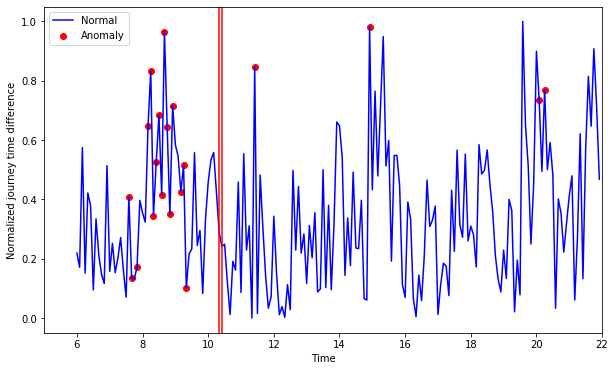

[]
[]
[7.583, 7.667, 7.833, 8.167, 8.25, 8.333, 8.417, 8.5, 8.583, 8.667, 8.75, 8.833, 8.917, 9.167, 9.25, 9.333, 11.417, 14.917, 20.083, 20.25]
0


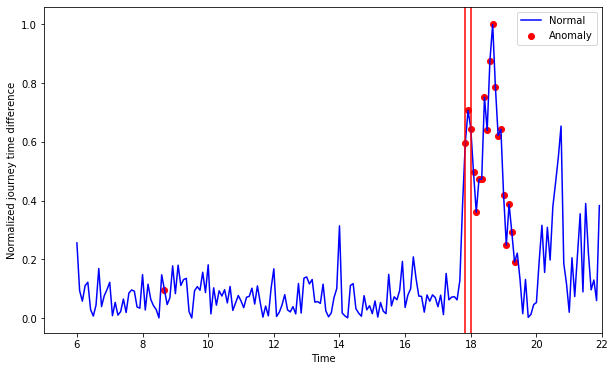

[[17.833, 17.917, 18.0, 18.083, 18.167, 18.25, 18.333, 18.417, 18.5, 18.583, 18.667, 18.75, 18.833, 18.917, 19.0, 19.083, 19.167, 19.25, 19.333]]
[[17.833, 17.917, 18.0, 18.083, 18.167, 18.25, 18.333, 18.417, 18.5, 18.583, 18.667, 18.75, 18.833, 18.917, 19.0, 19.083, 19.167, 19.25, 19.333]]
[8.667, 17.833, 17.917, 18.0, 18.083, 18.167, 18.25, 18.333, 18.417, 18.5, 18.583, 18.667, 18.75, 18.833, 18.917, 19.0, 19.083, 19.167, 19.25, 19.333]
0.95


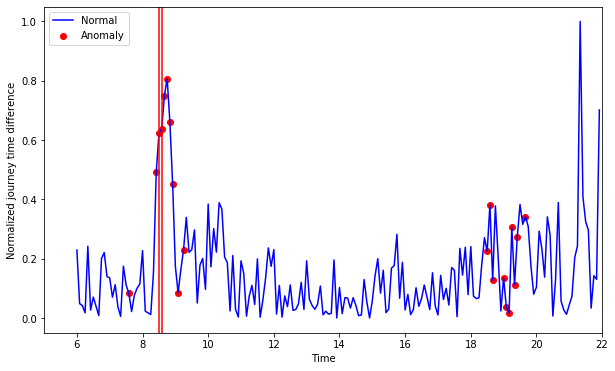

[[8.417, 8.5, 8.583, 8.667, 8.75, 8.833, 8.917]]
[[8.417, 8.5, 8.583, 8.667, 8.75, 8.833, 8.917]]
[7.583, 8.417, 8.5, 8.583, 8.667, 8.75, 8.833, 8.917, 9.083, 9.25, 18.5, 18.583, 18.667, 19.0, 19.083, 19.167, 19.25, 19.333, 19.417, 19.667]
0.35


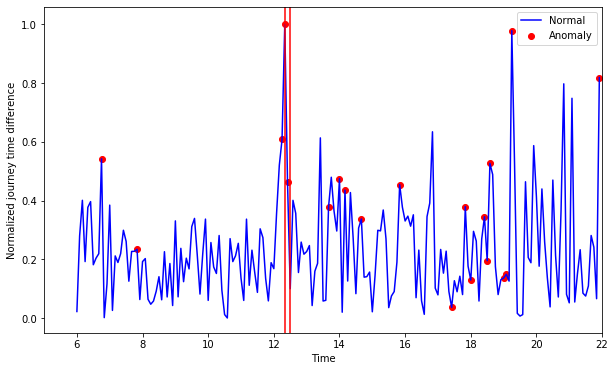

[[12.25, 12.333, 12.417]]
[]
[6.75, 7.833, 12.25, 12.333, 12.417, 13.667, 14.0, 14.167, 14.667, 15.833, 17.417, 17.833, 18.0, 18.417, 18.5, 18.583, 19.0, 19.083, 19.25, 21.917]
0.15


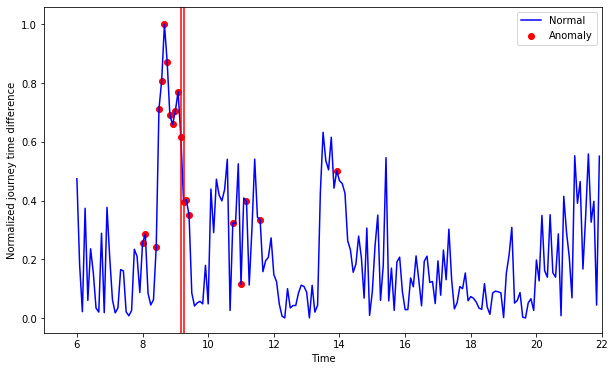

[[8.417, 8.5, 8.583, 8.667, 8.75, 8.833, 8.917, 9.0, 9.083, 9.167, 9.25, 9.333, 9.417]]
[[8.417, 8.5, 8.583, 8.667, 8.75, 8.833, 8.917, 9.0, 9.083, 9.167, 9.25, 9.333, 9.417]]
[8.0, 8.083, 8.417, 8.5, 8.583, 8.667, 8.75, 8.833, 8.917, 9.0, 9.083, 9.167, 9.25, 9.333, 9.417, 10.75, 11.0, 11.167, 11.583, 13.917]
0.65


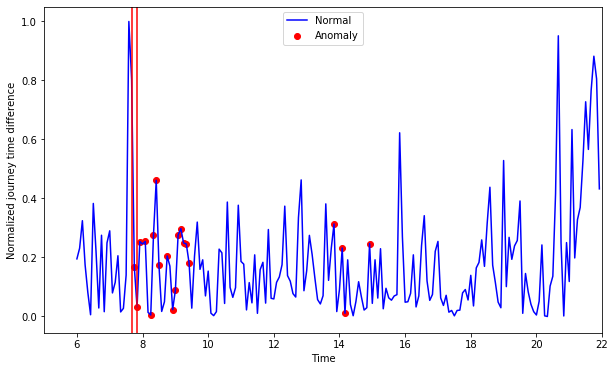

[]
[[7.75, 7.833, 7.917]]
[7.75, 7.833, 7.917, 8.083, 8.25, 8.333, 8.417, 8.5, 8.75, 8.917, 9.0, 9.083, 9.167, 9.25, 9.333, 9.417, 13.833, 14.083, 14.167, 14.917]
0.15


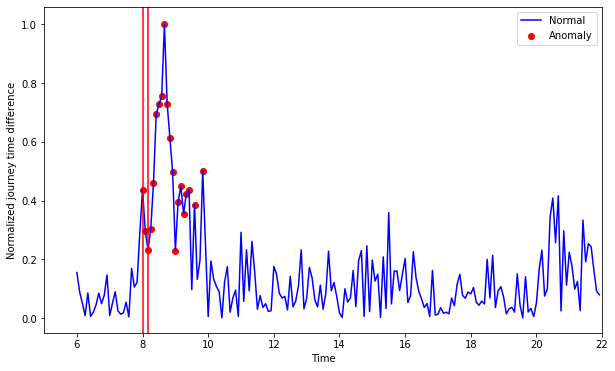

[[8.0, 8.083, 8.167, 8.25, 8.333, 8.417, 8.5, 8.583, 8.667, 8.75, 8.833, 8.917, 9.0, 9.083, 9.167, 9.25, 9.333, 9.417]]
[[8.0, 8.083, 8.167, 8.25, 8.333, 8.417, 8.5, 8.583, 8.667, 8.75, 8.833, 8.917, 9.0, 9.083, 9.167, 9.25, 9.333, 9.417]]
[8.0, 8.083, 8.167, 8.25, 8.333, 8.417, 8.5, 8.583, 8.667, 8.75, 8.833, 8.917, 9.0, 9.083, 9.167, 9.25, 9.333, 9.417, 9.583, 9.833]
0.9


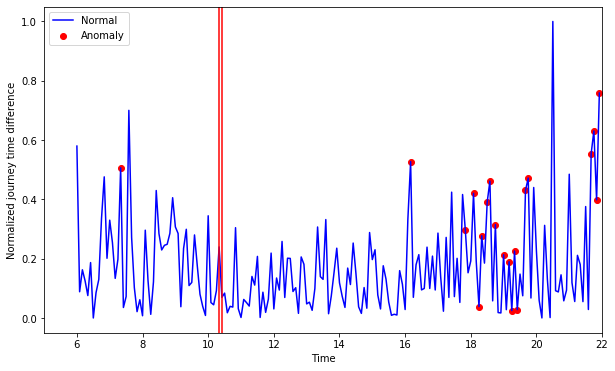

[]
[]
[7.333, 16.167, 17.833, 18.083, 18.25, 18.333, 18.5, 18.583, 18.75, 19.0, 19.167, 19.25, 19.333, 19.417, 19.667, 19.75, 21.667, 21.75, 21.833, 21.917]
0


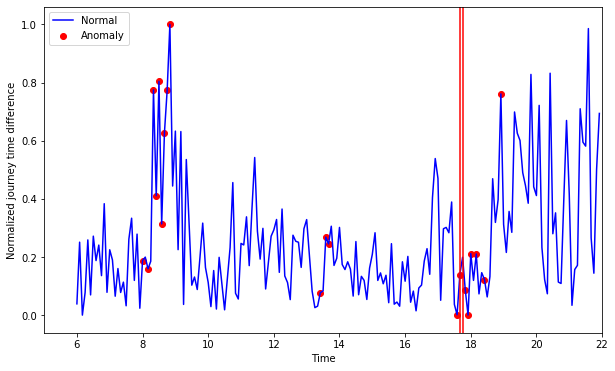

[[17.583, 17.667]]
[]
[8.0, 8.167, 8.333, 8.417, 8.5, 8.583, 8.667, 8.75, 8.833, 13.417, 13.583, 13.667, 17.583, 17.667, 17.833, 17.917, 18.0, 18.167, 18.417, 18.917]
0.1


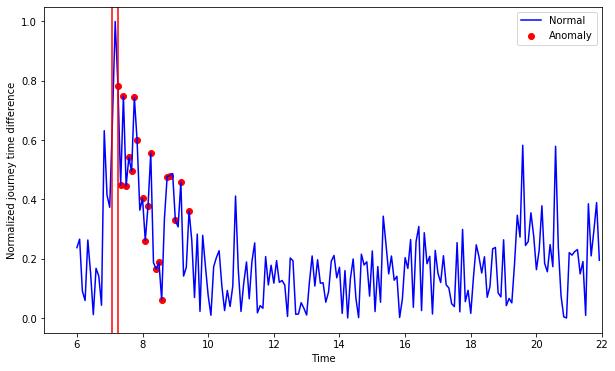

[]
[[7.25, 7.333, 7.417, 7.5, 7.583, 7.667, 7.75, 7.833]]
[7.25, 7.333, 7.417, 7.5, 7.583, 7.667, 7.75, 7.833, 8.0, 8.083, 8.167, 8.25, 8.417, 8.5, 8.583, 8.75, 8.833, 9.0, 9.167, 9.417]
0.4


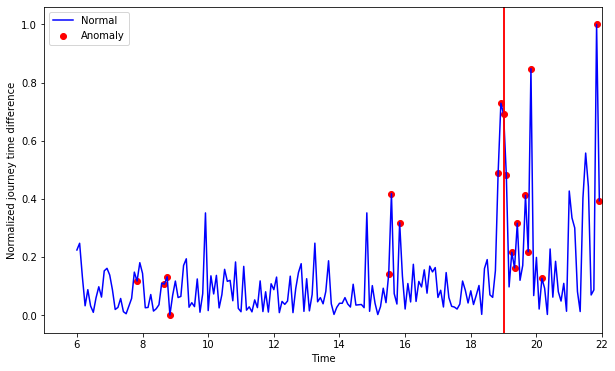

[[18.833, 18.917, 19.0, 19.083]]
[[18.833, 18.917, 19.0, 19.083]]
[7.833, 8.667, 8.75, 8.833, 15.5, 15.583, 15.833, 18.833, 18.917, 19.0, 19.083, 19.25, 19.333, 19.417, 19.667, 19.75, 19.833, 20.167, 21.833, 21.917]
0.2


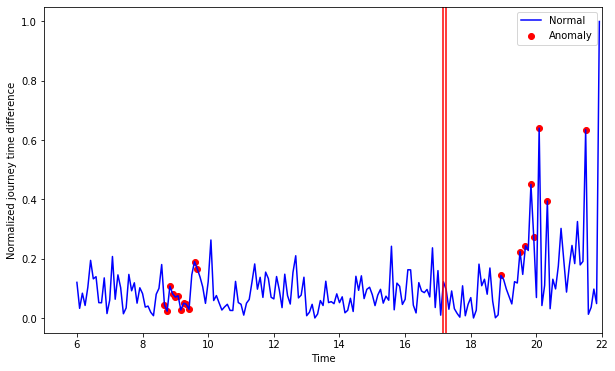

[]
[]
[8.667, 8.75, 8.833, 8.917, 9.0, 9.083, 9.167, 9.25, 9.333, 9.417, 9.583, 9.667, 18.917, 19.5, 19.667, 19.833, 19.917, 20.083, 20.333, 21.5]
0


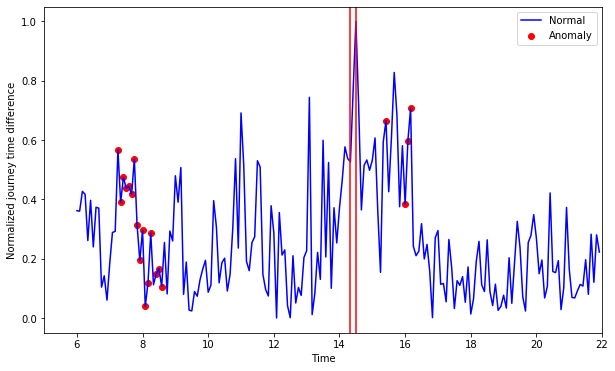

[]
[]
[7.25, 7.333, 7.417, 7.5, 7.583, 7.667, 7.75, 7.833, 7.917, 8.0, 8.083, 8.167, 8.25, 8.417, 8.5, 8.583, 15.417, 16.0, 16.083, 16.167]
0


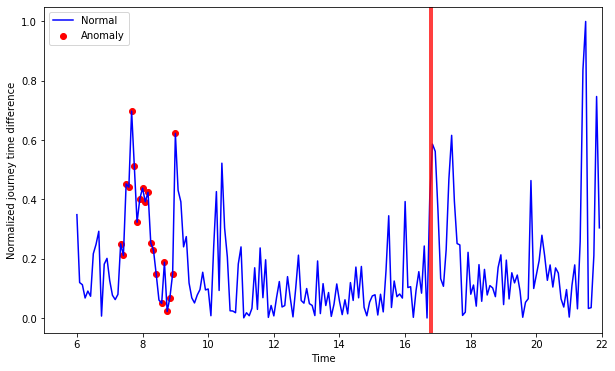

[]
[]
[7.333, 7.417, 7.5, 7.583, 7.667, 7.75, 7.833, 7.917, 8.0, 8.083, 8.167, 8.25, 8.333, 8.417, 8.583, 8.667, 8.75, 8.833, 8.917, 9.0]
0


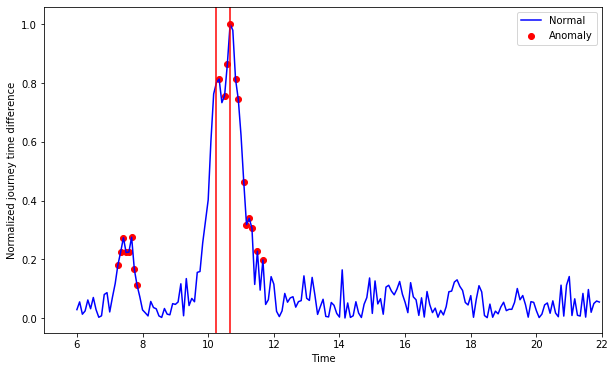

[]
[[10.5, 10.583, 10.667]]
[7.25, 7.333, 7.417, 7.5, 7.583, 7.667, 7.75, 7.833, 10.333, 10.5, 10.583, 10.667, 10.833, 10.917, 11.083, 11.167, 11.25, 11.333, 11.5, 11.667]
0.15
Counter({'True': 10, 'False': 5})
0
0.95
0.26666666666666666


In [10]:
# Anomal detection in time series: HBOS (Histogram-based outlier score)

import math
import numpy as np
from pandas import DataFrame
import datetime
from itertools import repeat

class HBOS:
        
    def __init__(self, log_scale=True, ranked=False, bin_info_array=[], mode_array=[], nominal_array=[]):
        self.log_scale = log_scale
        self.ranked = ranked
        self.bin_info_array = bin_info_array
        self.mode_array = mode_array
        self.nominal_array = nominal_array
        # self.histogram_list = []
        
    def fit(self, data):
        attr_size = len(data.columns)
        total_data_size = len(data)
        
        # init params if needed
        if len(self.bin_info_array) == 0:
            self.bin_info_array = list(repeat(-1, attr_size))
        
        if len(self.mode_array) == 0:
            self.mode_array = list(repeat('dynamic binwidth', attr_size))
            
        if len(self.nominal_array) == 0:
            self.nominal_array = list(repeat(False, attr_size))
        
        if self.ranked:
            self.log_scale = False
            
        normal = 1.0
        
        # calculate standard _bin size if needed
        for i in range(len(self.bin_info_array)):
            if self.bin_info_array[ i ] == -1:
                self.bin_info_array[ i ] = round(math.sqrt(len(data)))
                
        # initialize histogram
        self.histogram_list = []
        for i in range(attr_size):
            self.histogram_list.append([])
            
        # save maximum value for every attribute(needed to normalize _bin width)
        maximum_value_of_rows = data.apply(max).values
        
        # sort data
        sorted_data = data.apply(sorted)
        
        # create histograms
        for attrIndex in range(len(sorted_data.columns)):
            attr = sorted_data.columns[ attrIndex ]
            last = 0
            bin_start = sorted_data[ attr ][ 0 ]
            if self.mode_array[ attrIndex ] == 'dynamic binwidth':
                if self.nominal_array[ attrIndex ] == True:
                    while last < len(sorted_data) - 1:
                        last = self.create_dynamic_histogram(self.histogram_list, sorted_data, last, 1, attrIndex, True)
                else:
                    length = len(sorted_data)
                    binwidth = self.bin_info_array[ attrIndex ]
                    while last < len(sorted_data) - 1:
                        values_per_bin = math.floor(len(sorted_data) / self.bin_info_array[ attrIndex ])
                        last = self.create_dynamic_histogram(self.histogram_list, sorted_data, last, values_per_bin, attrIndex, False)
                        if binwidth > 1:
                            length = length - self.histogram_list[ attrIndex ][ -1 ].quantity
                            binwidth = binwidth - 1
            else:
                count_bins = 0
                binwidth = (sorted_data[ attr ][ len(sorted_data) - 1 ] - sorted_data[ attr ][ 0 ]) / self.bin_info_array[ attrIndex ]
                if (self.nominal_array[ attrIndex ] == True) | (binwidth == 0):
                    binwidth = 1
                while last < len(sorted_data):
                    is_last_bin = count_bins == self.bin_info_array[ attrIndex ] - 1
                    last = self.create_static_histogram(self.histogram_list, sorted_data, last, binwidth, attrIndex, bin_start, is_last_bin)
                    bin_start = bin_start + binwidth
                    count_bins = count_bins + 1
    
        # calculate score using normalized _bin width
        # _bin width is normalized to the number of datapoints
        # save maximum score for every attr(needed to normalize score)
        max_score = []
        
        # loop for all histograms
        for i in range(len(self.histogram_list)):
            max_score.append(0)
            histogram = self.histogram_list[ i ]
            
            # loop for all bins
            for k in range(len(histogram)):
                _bin = histogram[ k ]
                _bin.total_data_size = total_data_size
                _bin.calc_score(maximum_value_of_rows[ i ])
                if max_score[ i ] < _bin.score:
                    max_score[ i ] = _bin.score
                    
        for i in range(len(self.histogram_list)):
            histogram = self.histogram_list[ i ]
            for k in range(len(histogram)):
                _bin = histogram[ k ]
                _bin.normalize_score(normal, max_score[ i ], self.log_scale)
                
        # if ranked
        
    def predict(self, data):
        score_array = []
        for i in range(len(data)):
            each_data = data.values[ i ]
            value = 1
            if self.log_scale | self.ranked:
                value = 0
            for attr in range(len(data.columns)):
                score = self.get_score(self.histogram_list[ attr ], each_data[ attr ])
                if self.log_scale:
                    value = value + score
                elif self.ranked:
                    value = value + score
                else:
                    value = value * score
            score_array.append(value)
        return score_array
    
    def fit_predict(self, data):
        self.fit(data)
        return self.predict(data)
                
    def get_score(self, histogram, value):
        for i in range(len(histogram) - 1):
            _bin = histogram[ i ]
            if (_bin.range_from <= value) & (value < _bin.range_to):
                return _bin.score
            
        _bin = histogram[ -1 ]
        if (_bin.range_from <= value) & (value <= _bin.range_to):
            return _bin.score
        return 0
          
    @staticmethod  
    def check_amount(sortedData, first_occurrence, values_per_bin, attr):
        # check if there are more than values_per_bin values of a given value
        if first_occurrence + values_per_bin < len(sortedData):
            if sortedData[ attr ][ first_occurrence ] == sortedData[ attr ][ first_occurrence + values_per_bin ]:
                return True
            else:
                return False
        else:
            return False
            
    @staticmethod
    def create_dynamic_histogram(histogram_list, sortedData, first_index, values_per_bin, attrIndex, isNominal):
        last_index = 0
        attr = sortedData.columns[ attrIndex ]
        
        # create new _bin
        _bin = HistogramBin(sortedData[ attr ][ first_index ], 0, 0)
            
        # check if an end of the data is near
        if first_index + values_per_bin < len(sortedData):
            last_index = first_index + values_per_bin
        else:
            last_index = len(sortedData)
    
        # the first value always goes to the _bin
        _bin.add_quantitiy(1)
        
        # for every other value
        # check if it is the same as the last value
        # if so
        #   put it into the _bin
        # if not
        #   check if there are more than values_per_bin of that value
        #   if so
        #     open new _bin
        #   if not
        #     continue putting the value into the _bin
        
        cursor = first_index
        for i in range(first_index + 1, last_index):
            if sortedData[ attr ][ i ] == sortedData[ attr ][ cursor ]:
                _bin.add_quantitiy(1)
                cursor = cursor + 1
            else:
                if HBOS.check_amount(sortedData, i, values_per_bin, attr):
                    break
                else:
                    _bin.add_quantitiy(1)
                    cursor = cursor + 1
                    
        # continue to put values in the _bin until a new values arrive
        for i in range(cursor + 1, len(sortedData)):
            if sortedData[ attr ][ i ] == sortedData[ attr ][ cursor ]:
                _bin.quantity = _bin.quantity + 1
                cursor = cursor + 1
            else:
                break
                
        # adjust range of the bins
        if cursor + 1 < len(sortedData):
            _bin.range_to = sortedData[ attr ][ cursor + 1 ]
        else:  # last data
            if isNominal:
                _bin.range_to = sortedData[ attr ][ len(sortedData) - 1 ] + 1
            else:
                _bin.range_to = sortedData[ attr ][ len(sortedData) - 1 ]
                
        # save _bin
        if _bin.range_to - _bin.range_from > 0:
            histogram_list[ attrIndex ].append(_bin)
        elif len(histogram_list[ attrIndex ]) == 0:
            _bin.range_to = _bin.range_to + 1
            histogram_list[ attrIndex ].append(_bin)
        else:
            # if the _bin would have length of zero
            # we merge it with previous _bin
            # this can happen at the end of the histogram
            lastBin = histogram_list[ attrIndex ][ -1 ]
            lastBin.add_quantitiy(_bin.quantity)
            lastBin.range_to = _bin.range_to
        
        return cursor + 1

    @staticmethod
    def create_static_histogram(histogram_list, sorted_data, first_index, binwidth, attrIndex, bin_start, last_bin):
        attr = sorted_data.columns[ attrIndex ]
        _bin = HistogramBin(bin_start, bin_start + binwidth, 0)
        if last_bin == True:
            _bin = HistogramBin(bin_start, sorted_data[ attr ][ len(sorted_data) - 1 ], 0)
        
        last = first_index - 1
        cursor = first_index
        
        while True:
            if cursor >= len(sorted_data):
                break
            if sorted_data[ attr ][ cursor ] > _bin.range_to:
                break
            _bin.quantity = _bin.quantity + 1
            last = cursor
            cursor = cursor + 1
            
        histogram_list[ attrIndex ].append(_bin)
        return last + 1                 

    
class HistogramBin:

    def __init__(self, range_from, range_to, quantity):
        self.range_from = range_from
        self.range_to = range_to
        self.quantity = quantity
        self.score = 0
        self.total_data_size = 0

    def get_height(self):
        width = self.range_to - self.range_from
        height = self.quantity / width
        return height

    def add_quantitiy(self, anz):
        self.quantity = self.quantity + anz

    def calc_score(self, max_score):
        if max_score == 0:
            max_score = 1

        if self.quantity > 0:
            self.score = self.quantity / ((self.range_to - self.range_from) * self.total_data_size / abs(max_score))

    def normalize_score(self, normal, max_score, log_scale):
        self.score = self.score * normal / max_score
        if(self.score == 0):
            return
        self.score = 1 / self.score
        if log_scale:
            self.score = math.log10(self.score)

ACC_result = []
HBOS_result = []
for i in list(range(0, len(df_line))):         
    df1 = df_line[i][(df_line[i]['Time'] >= start_time_sys) & (df_line[i]['Time'] <= end_time_sys)]
    X = df1[['TT_DIFF', 'EXIT_DIFF', 'ACC_DIFF', 'LINE_DIFF']]


    time = df1[['Time']]
    time = time.reset_index()
    del time['index']

    min_max_scaler = preprocessing.MinMaxScaler()
    x_scaled = min_max_scaler.fit_transform(X)
    dataset = pd.DataFrame(x_scaled)
    
    dataset.columns = ['TT_DIFF', 'EXIT_DIFF', 'ACC_DIFF', 'LINE_DIFF']


    hbos = HBOS()
    hbos_result = hbos.fit_predict(dataset)
    d = {'hbos_score': hbos_result}
    hbos_score = pd.DataFrame(d)

    result_HBOS = pd.concat([time, dataset, hbos_score], axis=1)
    threshold = result_HBOS['hbos_score'].quantile(0.90)


    def conditions(s):
        if s['hbos_score'] > threshold:
            return 1
        else:
            return 0 
    
    result_HBOS['anomaly'] = result_HBOS.apply(lambda row: conditions(row), axis=1)
    
    # visualisation of anomaly with cluster view
    fig, ax = plt.subplots(figsize=(10,6))
    a = result_HBOS.loc[result_HBOS['anomaly'] == 1, ['Time', 'TT_DIFF']] #anomaly

    ax.plot(result_HBOS['Time'], result_HBOS['TT_DIFF'], color='blue', label='Normal')
    ax.scatter(a['Time'],a['TT_DIFF'], color='red', label='Anomaly')
    plt.xlabel('Time')
    plt.ylabel('Normalized journey time difference')

    x1 = inc_log['Time'].tolist()[i]
    x2 = inc_log['End_time'].tolist()[i]
    plt.axvline(x1, color='red')
    plt.axvline(x2, color='red')
    plt.legend()
    plt.xlim(start_time_sys-1, end_time_sys)
    # plt.savefig('C:/Users/Tenyu/Desktop/Jan 5th, 2020/ABNORMAL/' + 'LOF_10_min' + '.png')
    plt.show()
    
    
        # The following loop is used to include uncaptured anomaly points
    time_list = list(a['Time'])

    if time_list == []:
        correct_num == 0
    else:
        # The following split list by a certain interval
#         print(time_list)
        l = time_list
        split_list = []
        templist = [l.pop(0)]
        while len(l)>0:
            x = l.pop(0)
            if x - templist[-1] > 0.085:
                split_list.append(templist)
                templist = [x]
            else: 
                templist.append(x)
        split_list.append(templist)
    
 
        matching_1 = [s for s in split_list if x1 in s]
        matching_2 = [s for s in split_list if x2 in s]
        time_list = list(a['Time'])

        
        if (matching_1 == []) and (matching_2 == []):
            correct_num = 0
        elif (matching_1 == []) and (matching_2 != []):
            correct_num = len(matching_2[0])/len(time_list)
        elif (matching_2 == []) and (matching_1 != []):
            correct_num = len(matching_1[0])/len(time_list)
        elif matching_1 == matching_2:
            correct_num = len(matching_1[0])/len(time_list)
        elif (matching_1 != 0 and matching_2 != 0 and matching_1 != matching_2):
            correct_num = (len(matching_1[0])+len(matching_2[0]))/len(time_list)

            
        #  count how many single value is within a range
        def count(list1, l, r): 
            return len(list(x for x in list1 if l <= x <= r)) 
        count_num_sin = count(time_list, x1, x2)
    
        if (correct_num == 0) and (count_num_sin != 0):
            correct_num = count_num_sin/len(time_list)
        else:
            correct_num
            
    print(matching_1)
    print(matching_2)
    print(time_list)
    accuracy = round(correct_num, 2)
    print(accuracy)
    ACC_result.append(accuracy)    
            
        
    # Judge if the seleced time window contains the abnomal value
    judge = a[(a['Time'] >= x1) & (a['Time'] <= x2)]
    if judge.empty:
        result = 'False'
    else:
        result = 'True'
    HBOS_result.append(result)
    

from collections import Counter
counter = Counter(HBOS_result)

# Print out all results
print(counter)
print(min(ACC_result))
print(max(ACC_result))
print(sum(ACC_result)/len(ACC_result))

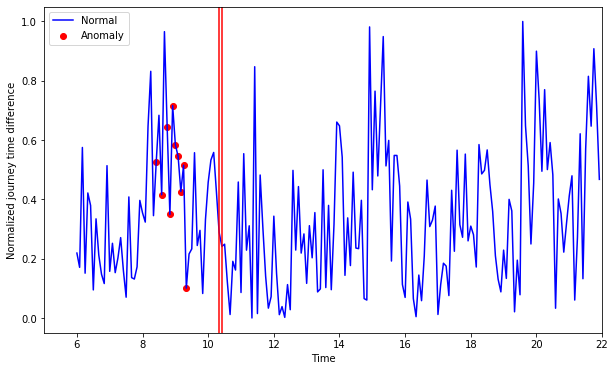

[]
[]
[8.417, 8.583, 8.75, 8.833, 8.917, 9.0, 9.083, 9.167, 9.25, 9.333]
0


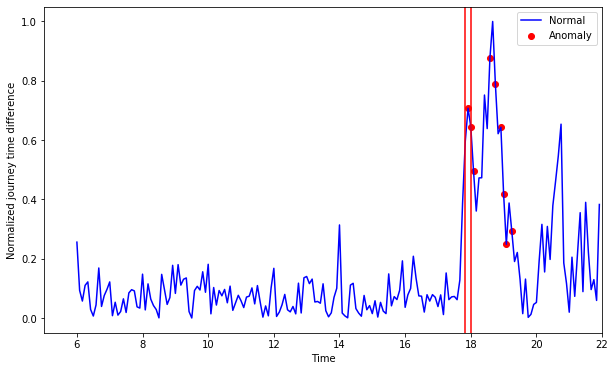

[]
[[17.917, 18.0, 18.083]]
[17.917, 18.0, 18.083, 18.583, 18.75, 18.917, 19.0, 19.083, 19.25]
0.33


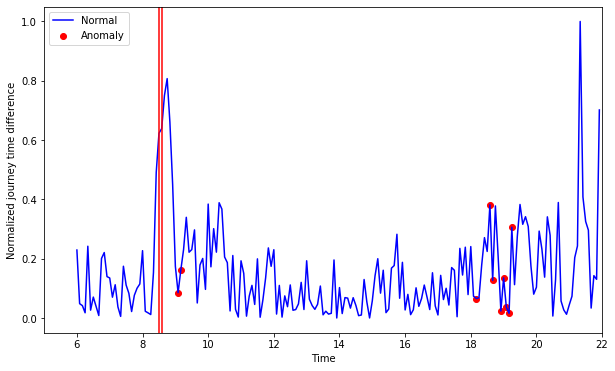

[]
[]
[9.083, 9.167, 18.167, 18.583, 18.667, 18.917, 19.0, 19.083, 19.167, 19.25]
0


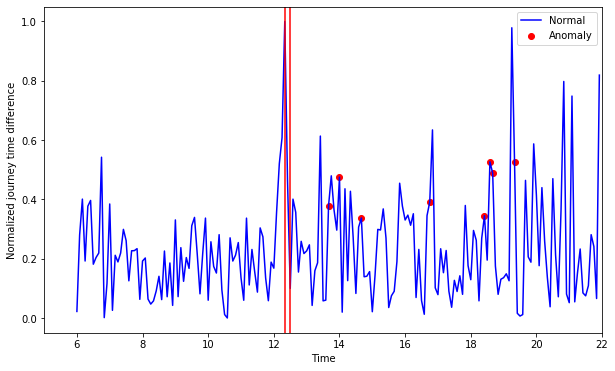

[]
[]
[13.667, 14.0, 14.667, 16.75, 18.417, 18.583, 18.667, 19.333]
0


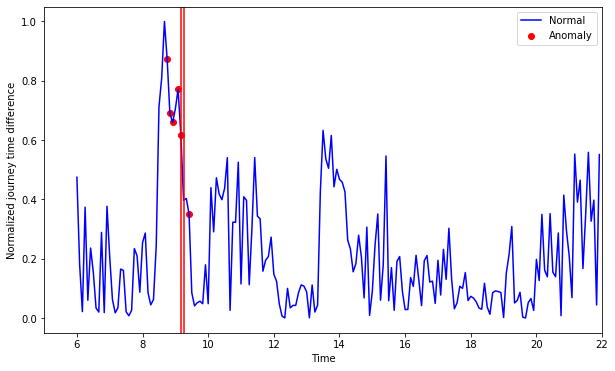

[[9.083, 9.167]]
[]
[8.75, 8.833, 8.917, 9.083, 9.167, 9.417]
0.33


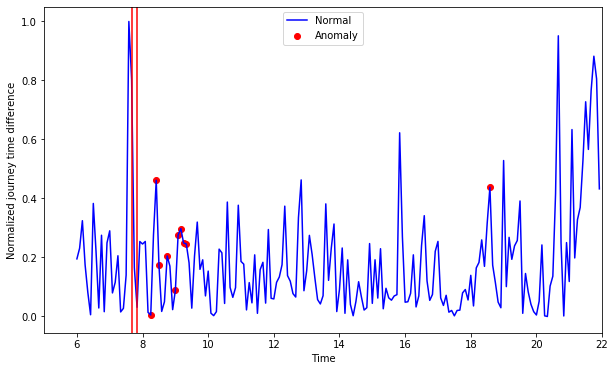

[]
[]
[8.25, 8.417, 8.5, 8.75, 9.0, 9.083, 9.167, 9.25, 9.333, 18.583]
0


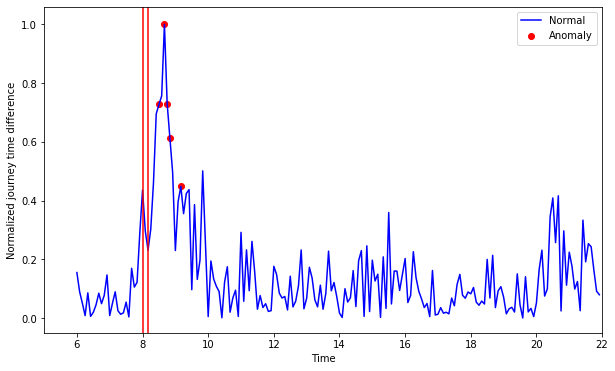

[]
[]
[8.5, 8.667, 8.75, 8.833, 9.167]
0


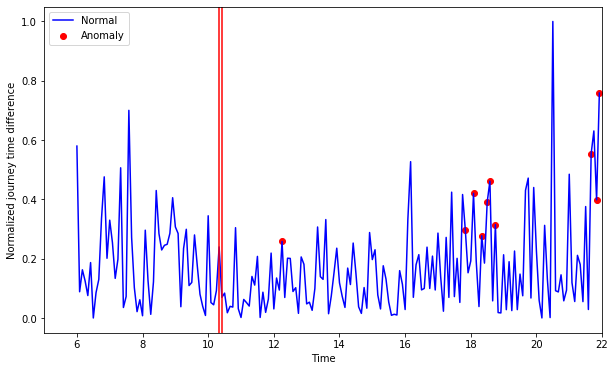

[]
[]
[12.25, 17.833, 18.083, 18.333, 18.5, 18.583, 18.75, 21.667, 21.833, 21.917]
0


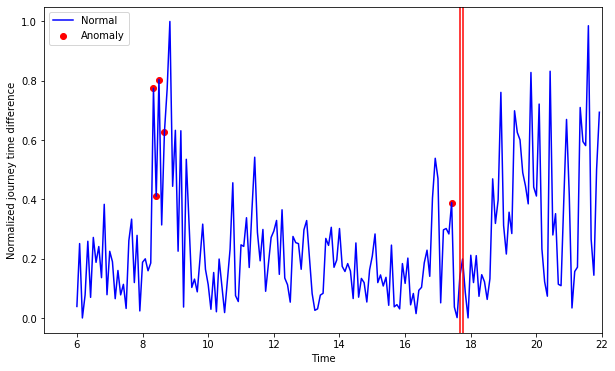

[]
[]
[8.333, 8.417, 8.5, 8.667, 17.417]
0


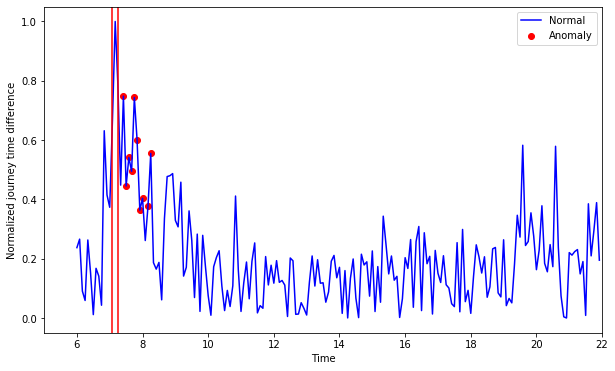

[]
[]
[7.417, 7.5, 7.583, 7.667, 7.75, 7.833, 7.917, 8.0, 8.167, 8.25]
0


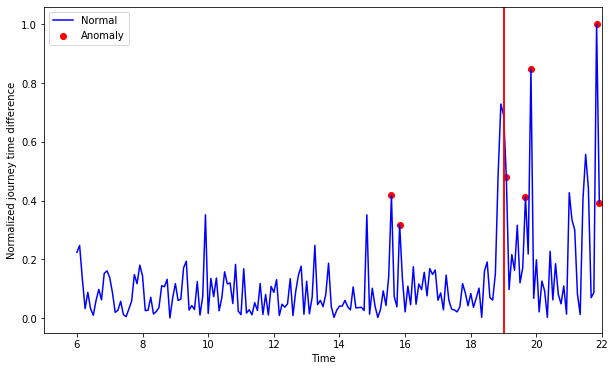

[]
[]
[15.583, 15.833, 19.083, 19.667, 19.833, 21.833, 21.917]
0


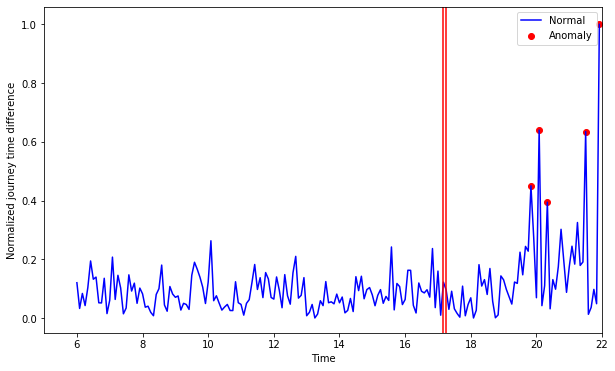

[]
[]
[19.833, 20.083, 20.333, 21.5, 21.917]
0


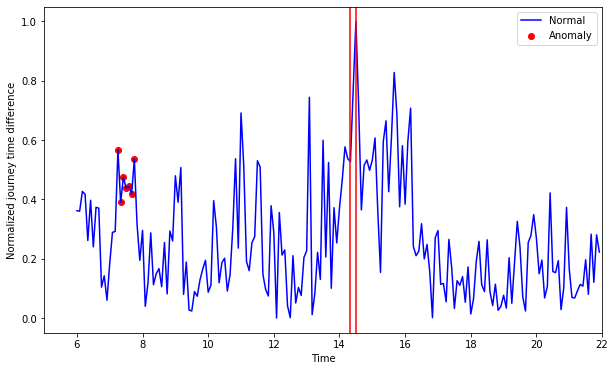

[]
[]
[7.25, 7.333, 7.417, 7.5, 7.583, 7.667, 7.75]
0


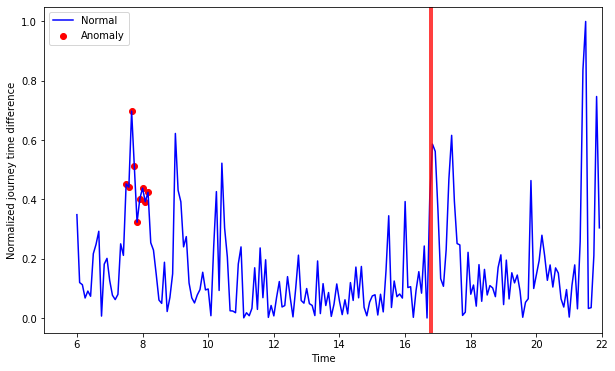

[]
[]
[7.5, 7.583, 7.667, 7.75, 7.833, 7.917, 8.0, 8.083, 8.167]
0


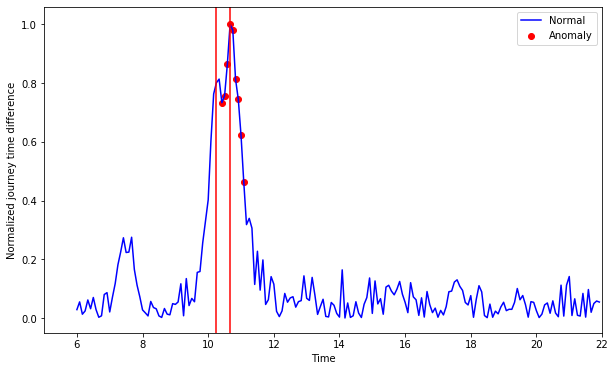

[]
[[10.417, 10.5, 10.583, 10.667, 10.75, 10.833, 10.917, 11.0, 11.083]]
[10.417, 10.5, 10.583, 10.667, 10.75, 10.833, 10.917, 11.0, 11.083]
1.0
Counter({'False': 12, 'True': 3})
0
1.0
0.11066666666666668


In [130]:
# Anomal detection in time series: XBOS (Histogram-based outlier score)
from sklearn.cluster import KMeans
import numpy as np
from pandas import DataFrame
from math import pow
import math

class XBOS:
    
    def __init__(self,n_clusters=15,effectiveness=500,max_iter=2):
        self.n_clusters=n_clusters
        self.effectiveness=effectiveness
        self.max_iter=max_iter
        self.kmeans = {}
        self.cluster_score = {}
        
    def fit(self, data):
        length = len(data)
        for column in data.columns:
            kmeans = KMeans(n_clusters=self.n_clusters,max_iter=self.max_iter)
            self.kmeans[column]=kmeans
            kmeans.fit(data[column].values.reshape(-1,1))
            assign = DataFrame(kmeans.predict(data[column].values.reshape(-1,1)),columns=['cluster'])
            cluster_score=assign.groupby('cluster').apply(len).apply(lambda x:x/length)
            ratio=cluster_score.copy()
        
            sorted_centers = sorted(kmeans.cluster_centers_)
            max_distance = ( sorted_centers[-1] - sorted_centers[0] )[ 0 ]
        
            for i in range(self.n_clusters):
                for k in range(self.n_clusters):
                    if i != k:
                        dist = abs(kmeans.cluster_centers_[i] - kmeans.cluster_centers_[k])/max_distance
                        effect = ratio[k]*(1/pow(self.effectiveness,dist))
                        cluster_score[i] = cluster_score[i]+effect
                        
            self.cluster_score[column] = cluster_score
                    
    def predict(self, data):
        length = len(data)
        score_array = np.zeros(length)
        for column in data.columns:
            kmeans = self.kmeans[ column ]
            cluster_score = self.cluster_score[ column ]
            
            assign = kmeans.predict( data[ column ].values.reshape(-1,1) )
            #print(assign)
            
            for i in range(length):
                score_array[i] = score_array[i] + math.log10( cluster_score[assign[i]] )
            
        return score_array
    
    def fit_predict(self,data):
        self.fit(data)
        return self.predict(data)


ACC_result = []
XBOS_result = []
for i in list(range(0, len(df_line))):         
    df1 = df_line[i][(df_line[i]['Time'] >= start_time_sys) & (df_line[i]['Time'] <= end_time_sys)]
    X = df1[['TT_DIFF', 'EXIT_DIFF', 'ACC_DIFF', 'LINE_DIFF']]


    time_sel = df1[['Time']]
    time_sel = time_sel.reset_index()
    del time_sel['index']

    min_max_scaler = preprocessing.MinMaxScaler()
    x_scaled = min_max_scaler.fit_transform(X)
    dataset = pd.DataFrame(x_scaled)
    dataset.columns = ['TT_DIFF', 'EXIT_DIFF', 'ACC_DIFF', 'LINE_DIFF']
    dataset = dataset.reset_index()
    del dataset['index']

    xbos = XBOS(n_clusters=2, max_iter=1)
    xbos_result = xbos.fit_predict(dataset)

    d = {'xbos_score': xbos_result}
    xbos_score = pd.DataFrame(d)

    result_XBOS = pd.concat([time_sel, dataset, xbos_score], axis=1)
    threshold = result_XBOS['xbos_score'].quantile(0.05)


    def conditions(s):
        if s['xbos_score'] < threshold:
            return 1
        else:
            return 0 
    
    result_XBOS['anomaly'] = result_XBOS.apply(lambda row: conditions(row), axis=1)
    
    # visualisation of anomaly with cluster view
    fig, ax = plt.subplots(figsize=(10,6))
    a = result_XBOS.loc[result_XBOS['anomaly'] == 1, ['Time', 'TT_DIFF']] #anomaly

    ax.plot(result_XBOS['Time'], result_XBOS['TT_DIFF'], color='blue', label='Normal')
    ax.scatter(a['Time'],a['TT_DIFF'], color='red', label='Anomaly')
    plt.xlabel('Time')
    plt.ylabel('Normalized journey time difference')

    x1 = inc_log['Time'].tolist()[i]
    x2 = inc_log['End_time'].tolist()[i]
    plt.axvline(x1, color='red')
    plt.axvline(x2, color='red')
    plt.legend()
    plt.xlim(start_time_sys-1, end_time_sys)
    # plt.savefig('C:/Users/Tenyu/Desktop/Jan 5th, 2020/ABNORMAL/' + 'LOF_10_min' + '.png')
    plt.show()
    
    
        # The following loop is used to include uncaptured anomaly points
    time_list = list(a['Time'])

    if time_list == []:
        correct_num == 0
    else:
        # The following split list by a certain interval
#         print(time_list)
        l = time_list
        split_list = []
        templist = [l.pop(0)]
        while len(l)>0:
            x = l.pop(0)
            if x - templist[-1] > 0.085:
                split_list.append(templist)
                templist = [x]
            else: 
                templist.append(x)
        split_list.append(templist)
    
 
        matching_1 = [s for s in split_list if x1 in s]
        matching_2 = [s for s in split_list if x2 in s]
        time_list = list(a['Time'])

        
        if (matching_1 == []) and (matching_2 == []):
            correct_num = 0
        elif (matching_1 == []) and (matching_2 != []):
            correct_num = len(matching_2[0])/len(time_list)
        elif (matching_2 == []) and (matching_1 != []):
            correct_num = len(matching_1[0])/len(time_list)
        elif matching_1 == matching_2:
            correct_num = len(matching_1[0])/len(time_list)
        elif (matching_1 != 0 and matching_2 != 0 and matching_1 != matching_2):
            correct_num = (len(matching_1[0])+len(matching_2[0]))/len(time_list)

            
        #  count how many single value is within a range
        def count(list1, l, r): 
            return len(list(x for x in list1 if l <= x <= r)) 
        count_num_sin = count(time_list, x1, x2)
    
        if (correct_num == 0) and (count_num_sin != 0):
            correct_num = count_num_sin/len(time_list)
        else:
            correct_num
            
    print(matching_1)
    print(matching_2)
    print(time_list)
    accuracy = round(correct_num, 2)
    print(accuracy)
    ACC_result.append(accuracy)    
            
        
    # Judge if the seleced time window contains the abnomal value
    judge = a[(a['Time'] >= x1) & (a['Time'] <= x2)]
    if judge.empty:
        result = 'False'
    else:
        result = 'True'
    XBOS_result.append(result)
    

from collections import Counter
counter = Counter(XBOS_result)

# Print out all results
print(counter)
print(min(ACC_result))
print(max(ACC_result))
print(sum(ACC_result)/len(ACC_result))

C:\Users\Tenyu\Anaconda3\lib\site-packages\sklearn\neighbors\lof.py:236: FutureWarning: default contamination parameter 0.1 will change in version 0.22 to "auto". This will change the predict method behavior.
  FutureWarning)
C:\Users\Tenyu\Anaconda3\lib\site-packages\sklearn\neighbors\lof.py:236: FutureWarning: default contamination parameter 0.1 will change in version 0.22 to "auto". This will change the predict method behavior.
  FutureWarning)


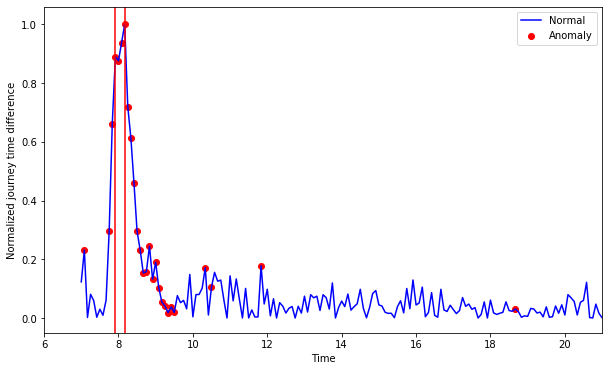

[[7.75, 7.833, 7.917, 8.0, 8.083, 8.167, 8.25, 8.333, 8.417, 8.5, 8.583, 8.667, 8.75, 8.833, 8.917, 9.0, 9.083, 9.167, 9.25, 9.333, 9.417, 9.5]]
[[7.75, 7.833, 7.917, 8.0, 8.083, 8.167, 8.25, 8.333, 8.417, 8.5, 8.583, 8.667, 8.75, 8.833, 8.917, 9.0, 9.083, 9.167, 9.25, 9.333, 9.417, 9.5]]
[7.083, 7.75, 7.833, 7.917, 8.0, 8.083, 8.167, 8.25, 8.333, 8.417, 8.5, 8.583, 8.667, 8.75, 8.833, 8.917, 9.0, 9.083, 9.167, 9.25, 9.333, 9.417, 9.5, 10.333, 10.5, 11.833, 18.667]
0.81


C:\Users\Tenyu\Anaconda3\lib\site-packages\sklearn\neighbors\lof.py:236: FutureWarning: default contamination parameter 0.1 will change in version 0.22 to "auto". This will change the predict method behavior.
  FutureWarning)
C:\Users\Tenyu\Anaconda3\lib\site-packages\sklearn\neighbors\lof.py:236: FutureWarning: default contamination parameter 0.1 will change in version 0.22 to "auto". This will change the predict method behavior.
  FutureWarning)


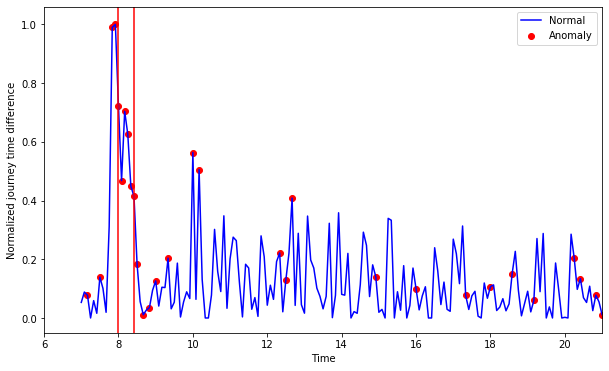

[[7.833, 7.917, 8.0, 8.083, 8.167, 8.25, 8.333, 8.417, 8.5]]
[[7.833, 7.917, 8.0, 8.083, 8.167, 8.25, 8.333, 8.417, 8.5]]
[7.167, 7.5, 7.833, 7.917, 8.0, 8.083, 8.167, 8.25, 8.333, 8.417, 8.5, 8.667, 8.833, 9.0, 9.333, 10.0, 10.167, 12.333, 12.5, 12.667, 14.917, 16.0, 17.333, 18.0, 18.583, 19.167, 20.25, 20.417, 20.833, 21.0]
0.3


C:\Users\Tenyu\Anaconda3\lib\site-packages\sklearn\neighbors\lof.py:236: FutureWarning: default contamination parameter 0.1 will change in version 0.22 to "auto". This will change the predict method behavior.
  FutureWarning)
C:\Users\Tenyu\Anaconda3\lib\site-packages\sklearn\neighbors\lof.py:236: FutureWarning: default contamination parameter 0.1 will change in version 0.22 to "auto". This will change the predict method behavior.
  FutureWarning)


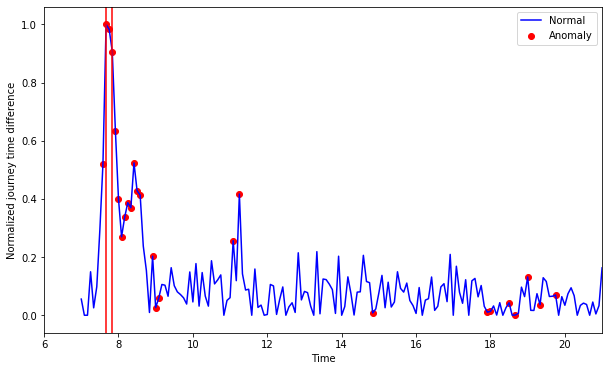

[[7.583, 7.667, 7.75, 7.833, 7.917, 8.0, 8.083, 8.167, 8.25, 8.333, 8.417, 8.5, 8.583]]
[[7.583, 7.667, 7.75, 7.833, 7.917, 8.0, 8.083, 8.167, 8.25, 8.333, 8.417, 8.5, 8.583]]
[7.583, 7.667, 7.75, 7.833, 7.917, 8.0, 8.083, 8.167, 8.25, 8.333, 8.417, 8.5, 8.583, 8.917, 9.0, 9.083, 11.083, 11.25, 14.833, 17.917, 18.0, 18.5, 18.667, 19.0, 19.333, 19.75]
0.5


C:\Users\Tenyu\Anaconda3\lib\site-packages\sklearn\neighbors\lof.py:236: FutureWarning: default contamination parameter 0.1 will change in version 0.22 to "auto". This will change the predict method behavior.
  FutureWarning)
C:\Users\Tenyu\Anaconda3\lib\site-packages\sklearn\neighbors\lof.py:236: FutureWarning: default contamination parameter 0.1 will change in version 0.22 to "auto". This will change the predict method behavior.
  FutureWarning)


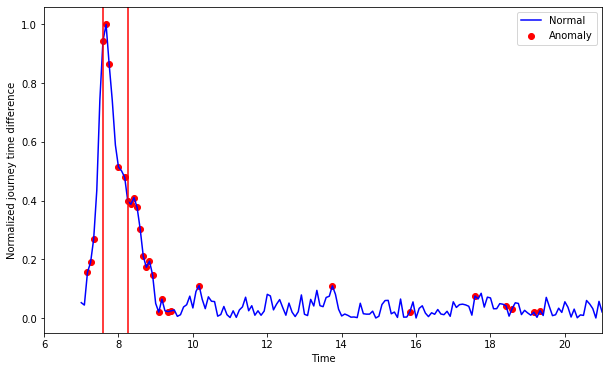

[[7.583, 7.667, 7.75]]
[[8.167, 8.25, 8.333, 8.417, 8.5, 8.583, 8.667, 8.75, 8.833, 8.917]]
[7.167, 7.25, 7.333, 7.583, 7.667, 7.75, 8.0, 8.167, 8.25, 8.333, 8.417, 8.5, 8.583, 8.667, 8.75, 8.833, 8.917, 9.083, 9.167, 9.333, 9.417, 10.167, 13.75, 15.833, 17.583, 18.417, 18.583, 19.167, 19.333]
0.45


C:\Users\Tenyu\Anaconda3\lib\site-packages\sklearn\neighbors\lof.py:236: FutureWarning: default contamination parameter 0.1 will change in version 0.22 to "auto". This will change the predict method behavior.
  FutureWarning)
C:\Users\Tenyu\Anaconda3\lib\site-packages\sklearn\neighbors\lof.py:236: FutureWarning: default contamination parameter 0.1 will change in version 0.22 to "auto". This will change the predict method behavior.
  FutureWarning)


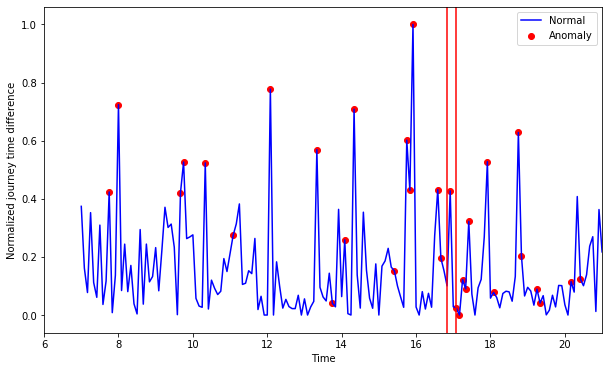

[]
[[17.083]]
[7.75, 8.0, 9.667, 9.75, 10.333, 11.083, 12.083, 13.333, 13.75, 14.083, 14.333, 15.417, 15.75, 15.833, 15.917, 16.583, 16.667, 16.917, 17.083, 17.167, 17.25, 17.333, 17.417, 17.917, 18.083, 18.75, 18.833, 19.25, 19.333, 20.167, 20.417]
0.03
Counter({True: 5})
0.03
0.81
0.418


C:\Users\Tenyu\Anaconda3\lib\site-packages\seaborn\distributions.py:288: UserWarning: Data must have variance to compute a kernel density estimate.
  warnings.warn(msg, UserWarning)


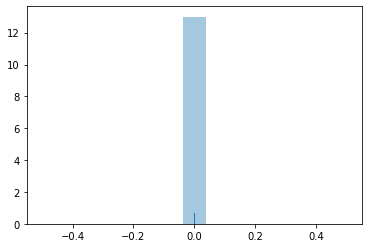

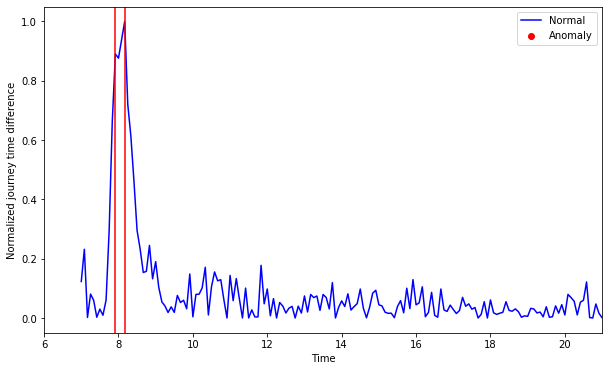

[]
[[17.083]]
[]
0.03


C:\Users\Tenyu\Anaconda3\lib\site-packages\seaborn\distributions.py:288: UserWarning: Data must have variance to compute a kernel density estimate.
  warnings.warn(msg, UserWarning)


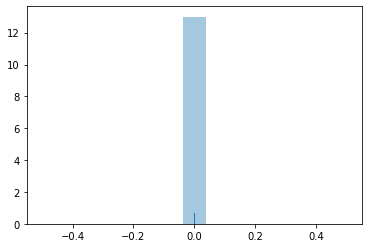

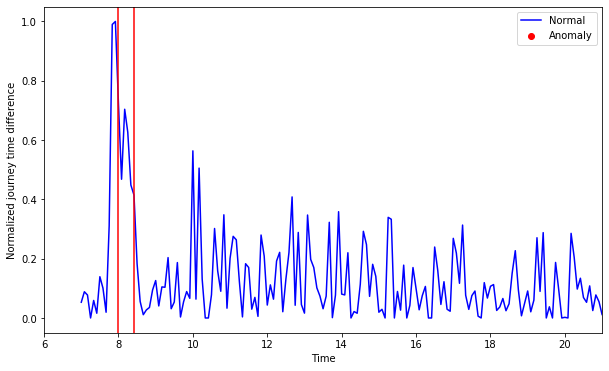

[]
[[17.083]]
[]
0.03


C:\Users\Tenyu\Anaconda3\lib\site-packages\seaborn\distributions.py:288: UserWarning: Data must have variance to compute a kernel density estimate.
  warnings.warn(msg, UserWarning)


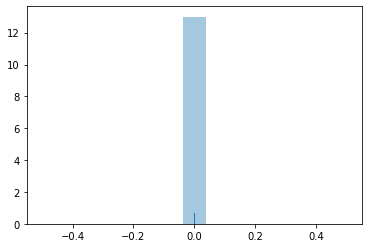

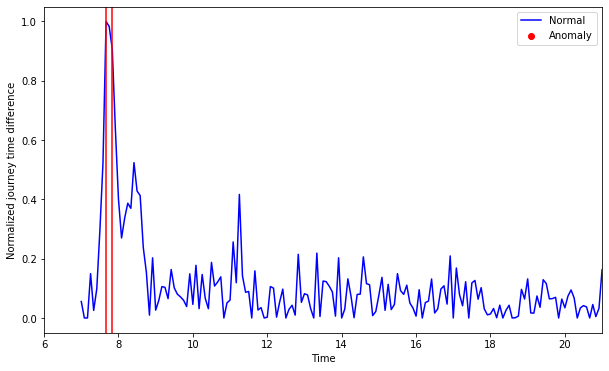

[]
[[17.083]]
[]
0.03


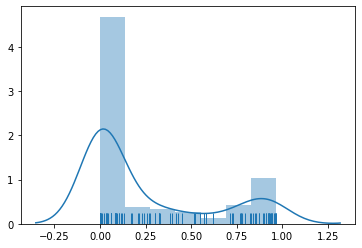

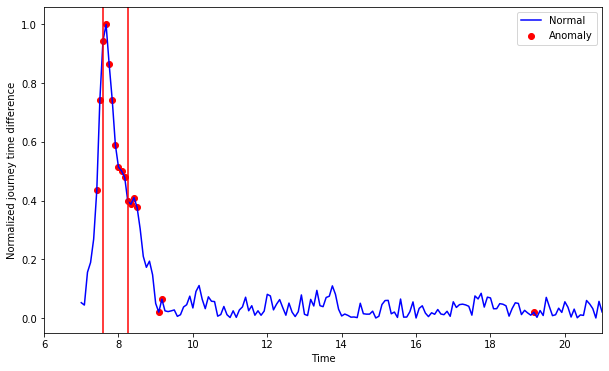

[[7.417, 7.5, 7.583, 7.667, 7.75, 7.833, 7.917, 8.0, 8.083, 8.167, 8.25, 8.333, 8.417, 8.5]]
[[7.417, 7.5, 7.583, 7.667, 7.75, 7.833, 7.917, 8.0, 8.083, 8.167, 8.25, 8.333, 8.417, 8.5]]
[7.417, 7.5, 7.583, 7.667, 7.75, 7.833, 7.917, 8.0, 8.083, 8.167, 8.25, 8.333, 8.417, 8.5, 9.083, 9.167, 19.167]
0.82


C:\Users\Tenyu\Anaconda3\lib\site-packages\seaborn\distributions.py:288: UserWarning: Data must have variance to compute a kernel density estimate.
  warnings.warn(msg, UserWarning)


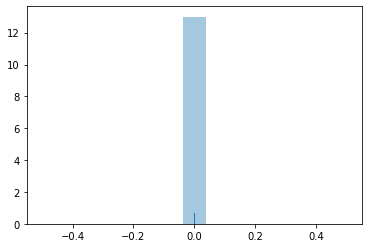

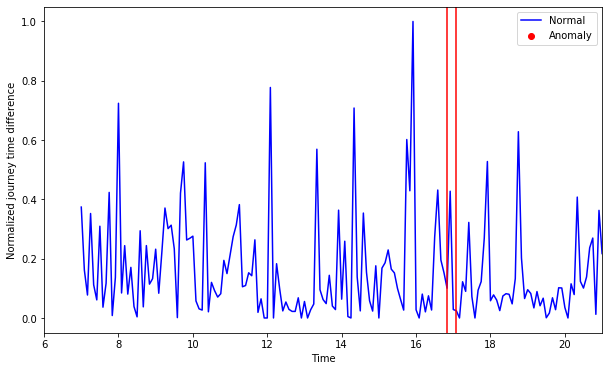

[[7.417, 7.5, 7.583, 7.667, 7.75, 7.833, 7.917, 8.0, 8.083, 8.167, 8.25, 8.333, 8.417, 8.5]]
[[7.417, 7.5, 7.583, 7.667, 7.75, 7.833, 7.917, 8.0, 8.083, 8.167, 8.25, 8.333, 8.417, 8.5]]
[]
0.82
Counter({False: 4, True: 1})
0.03
0.82
0.346


C:\Users\Tenyu\Anaconda3\lib\site-packages\ipykernel_launcher.py:28: FutureWarning: set_value is deprecated and will be removed in a future release. Please use .at[] or .iat[] accessors instead


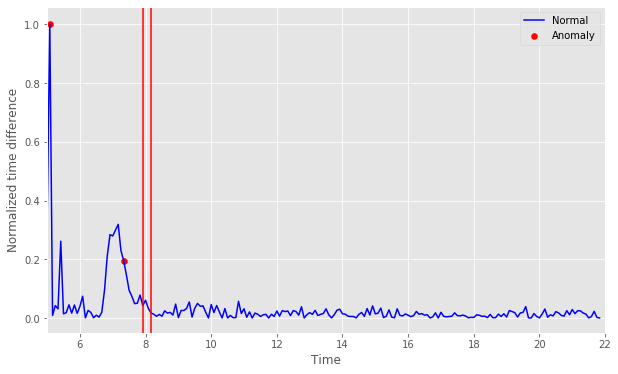

C:\Users\Tenyu\Anaconda3\lib\site-packages\ipykernel_launcher.py:28: FutureWarning: set_value is deprecated and will be removed in a future release. Please use .at[] or .iat[] accessors instead


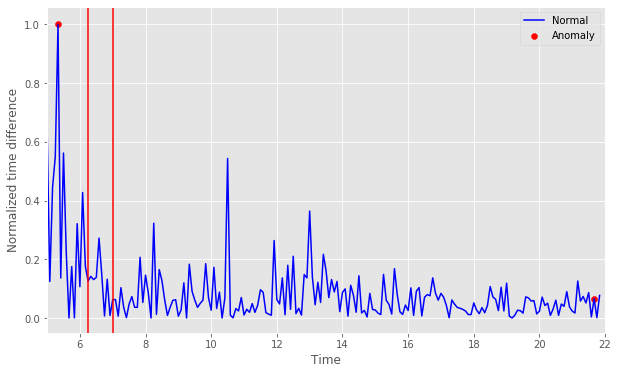

C:\Users\Tenyu\Anaconda3\lib\site-packages\ipykernel_launcher.py:28: FutureWarning: set_value is deprecated and will be removed in a future release. Please use .at[] or .iat[] accessors instead


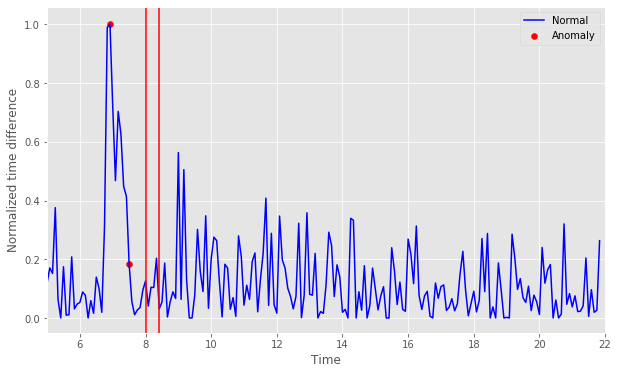

C:\Users\Tenyu\Anaconda3\lib\site-packages\ipykernel_launcher.py:28: FutureWarning: set_value is deprecated and will be removed in a future release. Please use .at[] or .iat[] accessors instead


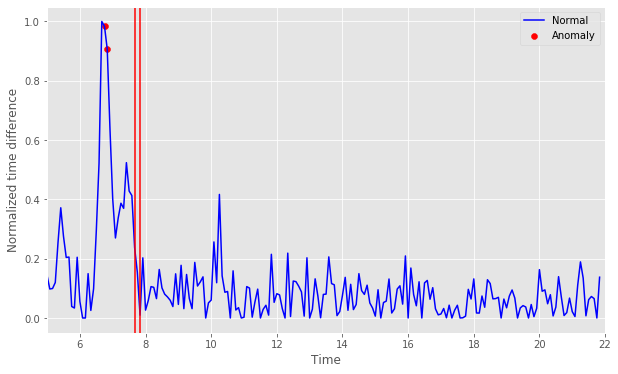

C:\Users\Tenyu\Anaconda3\lib\site-packages\ipykernel_launcher.py:28: FutureWarning: set_value is deprecated and will be removed in a future release. Please use .at[] or .iat[] accessors instead


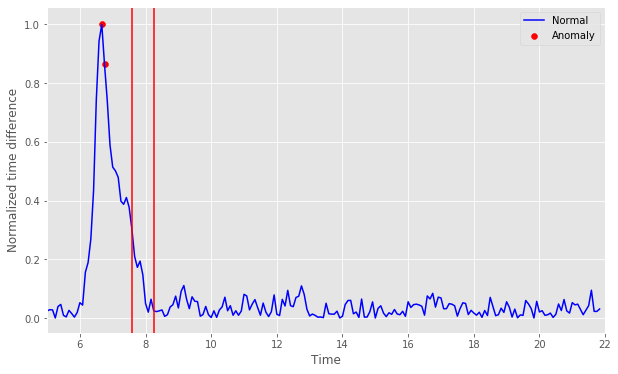

C:\Users\Tenyu\Anaconda3\lib\site-packages\ipykernel_launcher.py:28: FutureWarning: set_value is deprecated and will be removed in a future release. Please use .at[] or .iat[] accessors instead


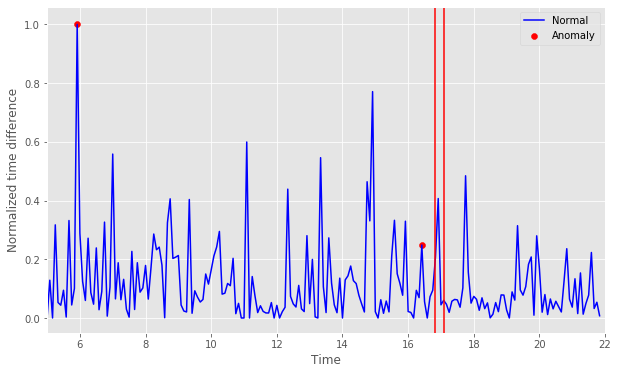

C:\Users\Tenyu\Anaconda3\lib\site-packages\ipykernel_launcher.py:28: FutureWarning: set_value is deprecated and will be removed in a future release. Please use .at[] or .iat[] accessors instead


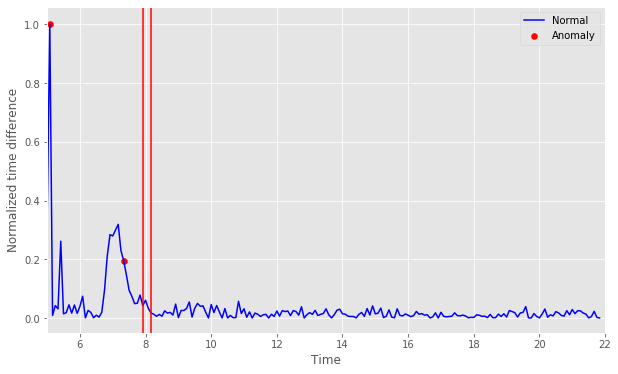

C:\Users\Tenyu\Anaconda3\lib\site-packages\ipykernel_launcher.py:28: FutureWarning: set_value is deprecated and will be removed in a future release. Please use .at[] or .iat[] accessors instead


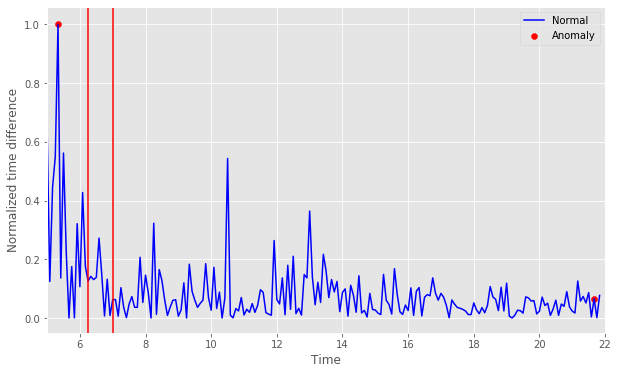

C:\Users\Tenyu\Anaconda3\lib\site-packages\ipykernel_launcher.py:28: FutureWarning: set_value is deprecated and will be removed in a future release. Please use .at[] or .iat[] accessors instead


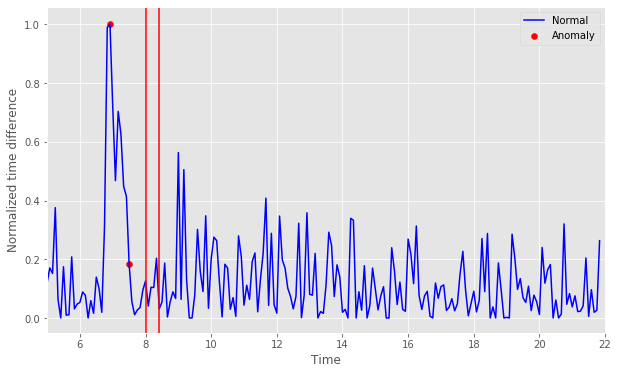

C:\Users\Tenyu\Anaconda3\lib\site-packages\ipykernel_launcher.py:28: FutureWarning: set_value is deprecated and will be removed in a future release. Please use .at[] or .iat[] accessors instead


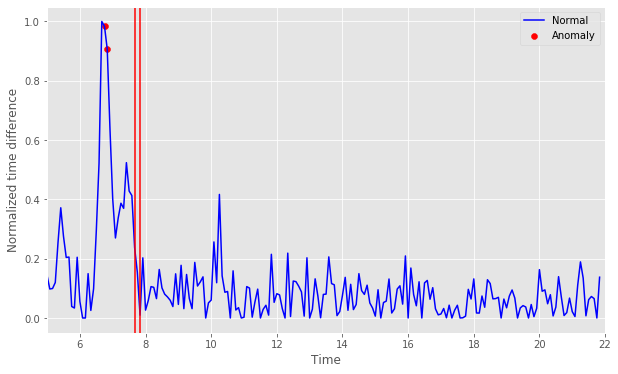

C:\Users\Tenyu\Anaconda3\lib\site-packages\ipykernel_launcher.py:28: FutureWarning: set_value is deprecated and will be removed in a future release. Please use .at[] or .iat[] accessors instead


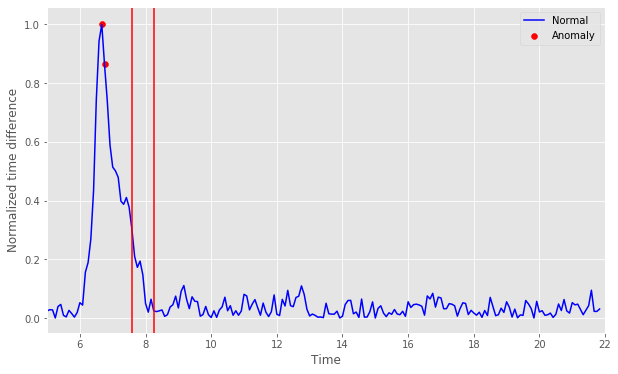

C:\Users\Tenyu\Anaconda3\lib\site-packages\ipykernel_launcher.py:28: FutureWarning: set_value is deprecated and will be removed in a future release. Please use .at[] or .iat[] accessors instead


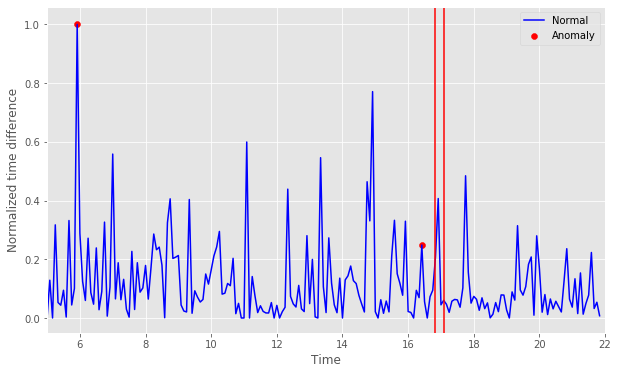

C:\Users\Tenyu\Anaconda3\lib\site-packages\ipykernel_launcher.py:28: FutureWarning: set_value is deprecated and will be removed in a future release. Please use .at[] or .iat[] accessors instead


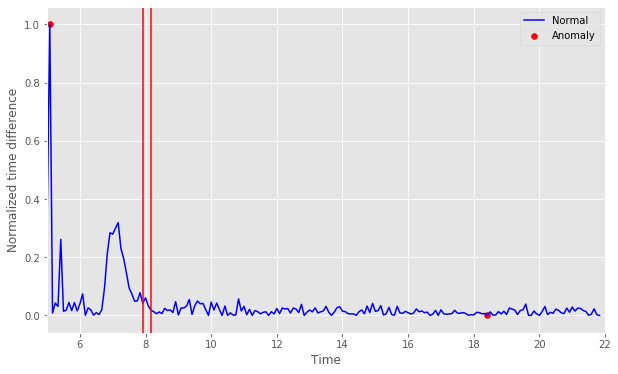

C:\Users\Tenyu\Anaconda3\lib\site-packages\ipykernel_launcher.py:28: FutureWarning: set_value is deprecated and will be removed in a future release. Please use .at[] or .iat[] accessors instead


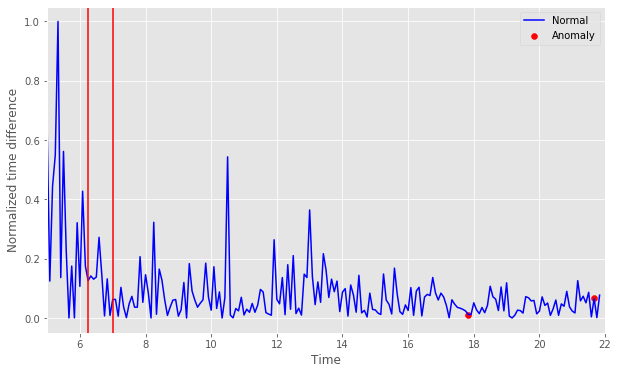

C:\Users\Tenyu\Anaconda3\lib\site-packages\ipykernel_launcher.py:28: FutureWarning: set_value is deprecated and will be removed in a future release. Please use .at[] or .iat[] accessors instead


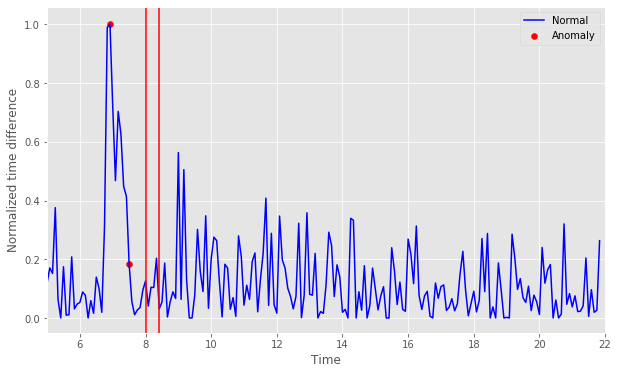

C:\Users\Tenyu\Anaconda3\lib\site-packages\ipykernel_launcher.py:28: FutureWarning: set_value is deprecated and will be removed in a future release. Please use .at[] or .iat[] accessors instead


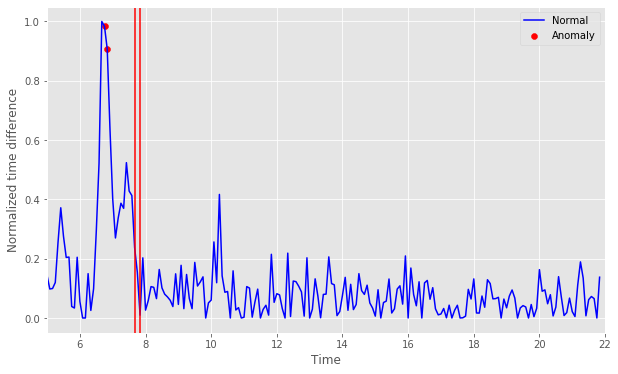

C:\Users\Tenyu\Anaconda3\lib\site-packages\ipykernel_launcher.py:28: FutureWarning: set_value is deprecated and will be removed in a future release. Please use .at[] or .iat[] accessors instead


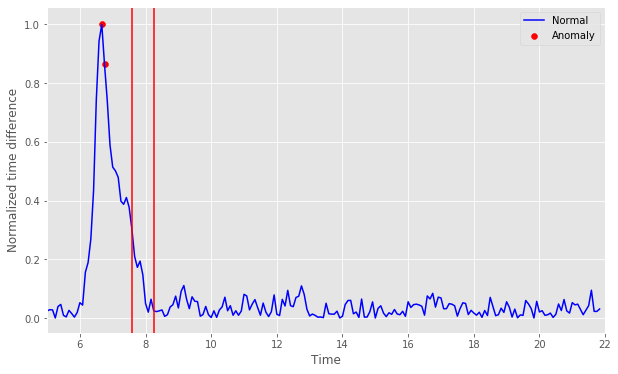

C:\Users\Tenyu\Anaconda3\lib\site-packages\ipykernel_launcher.py:28: FutureWarning: set_value is deprecated and will be removed in a future release. Please use .at[] or .iat[] accessors instead


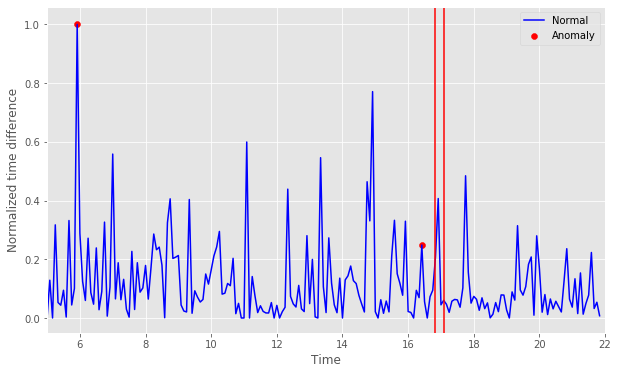

C:\Users\Tenyu\Anaconda3\lib\site-packages\ipykernel_launcher.py:28: FutureWarning: set_value is deprecated and will be removed in a future release. Please use .at[] or .iat[] accessors instead


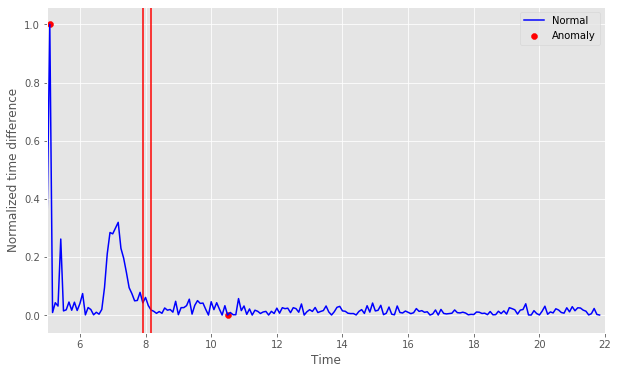

C:\Users\Tenyu\Anaconda3\lib\site-packages\ipykernel_launcher.py:28: FutureWarning: set_value is deprecated and will be removed in a future release. Please use .at[] or .iat[] accessors instead


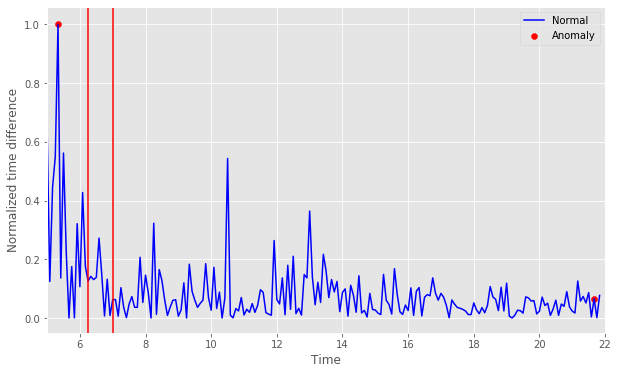

C:\Users\Tenyu\Anaconda3\lib\site-packages\ipykernel_launcher.py:28: FutureWarning: set_value is deprecated and will be removed in a future release. Please use .at[] or .iat[] accessors instead


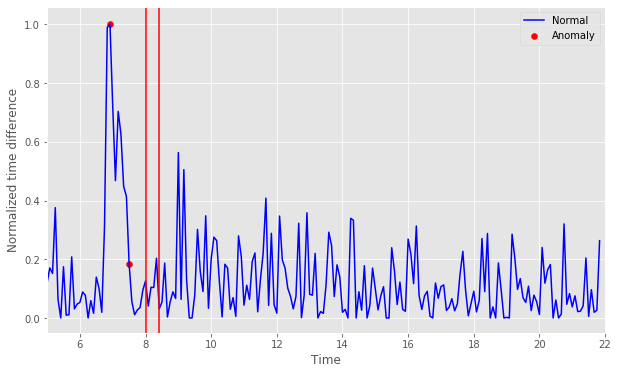

C:\Users\Tenyu\Anaconda3\lib\site-packages\ipykernel_launcher.py:28: FutureWarning: set_value is deprecated and will be removed in a future release. Please use .at[] or .iat[] accessors instead


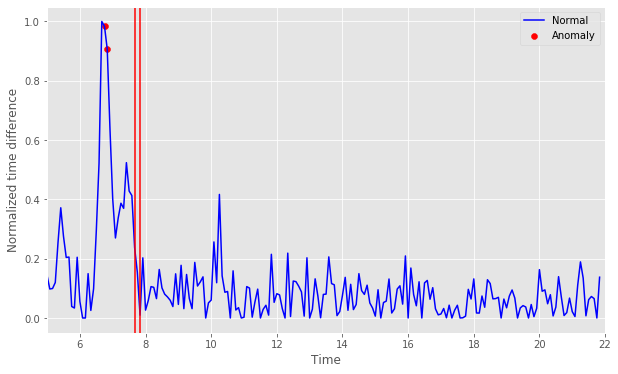

C:\Users\Tenyu\Anaconda3\lib\site-packages\ipykernel_launcher.py:28: FutureWarning: set_value is deprecated and will be removed in a future release. Please use .at[] or .iat[] accessors instead


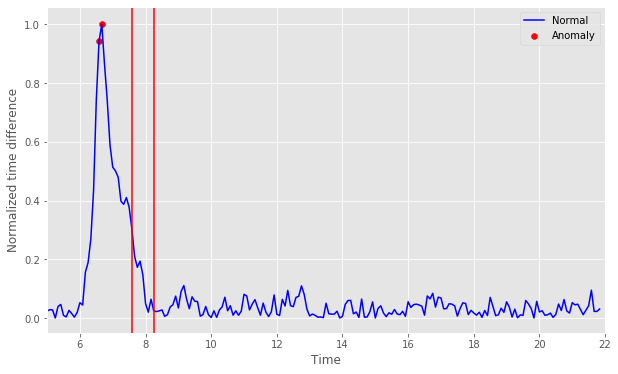

C:\Users\Tenyu\Anaconda3\lib\site-packages\ipykernel_launcher.py:28: FutureWarning: set_value is deprecated and will be removed in a future release. Please use .at[] or .iat[] accessors instead


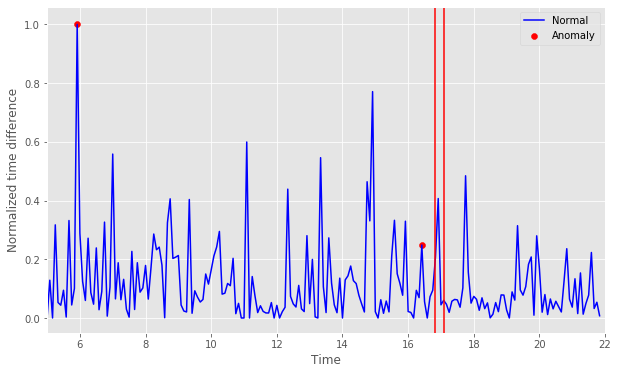

C:\Users\Tenyu\Anaconda3\lib\site-packages\ipykernel_launcher.py:28: FutureWarning: set_value is deprecated and will be removed in a future release. Please use .at[] or .iat[] accessors instead


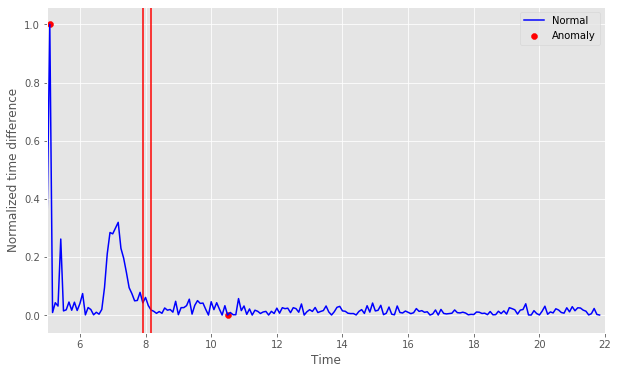

C:\Users\Tenyu\Anaconda3\lib\site-packages\ipykernel_launcher.py:28: FutureWarning: set_value is deprecated and will be removed in a future release. Please use .at[] or .iat[] accessors instead


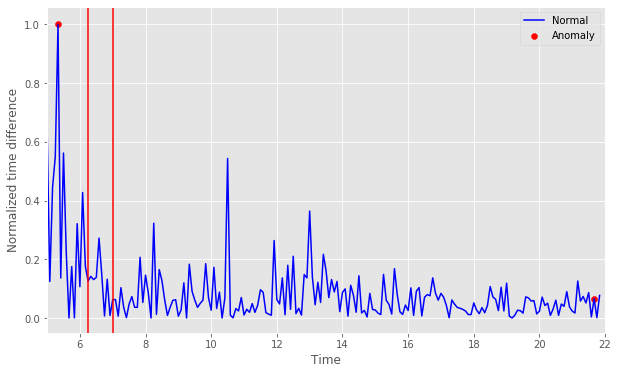

C:\Users\Tenyu\Anaconda3\lib\site-packages\ipykernel_launcher.py:28: FutureWarning: set_value is deprecated and will be removed in a future release. Please use .at[] or .iat[] accessors instead


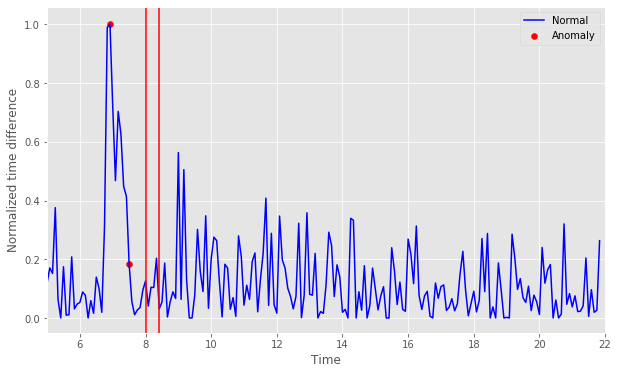

C:\Users\Tenyu\Anaconda3\lib\site-packages\ipykernel_launcher.py:28: FutureWarning: set_value is deprecated and will be removed in a future release. Please use .at[] or .iat[] accessors instead


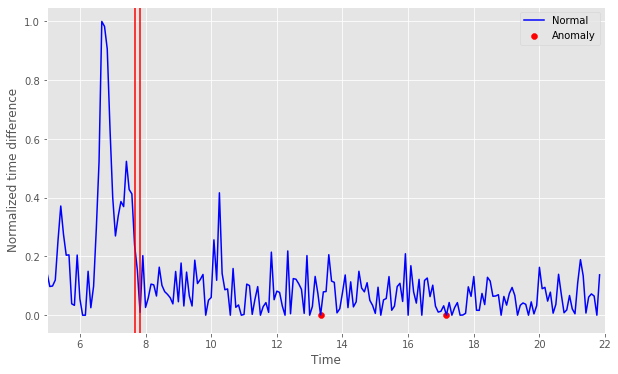

C:\Users\Tenyu\Anaconda3\lib\site-packages\ipykernel_launcher.py:28: FutureWarning: set_value is deprecated and will be removed in a future release. Please use .at[] or .iat[] accessors instead


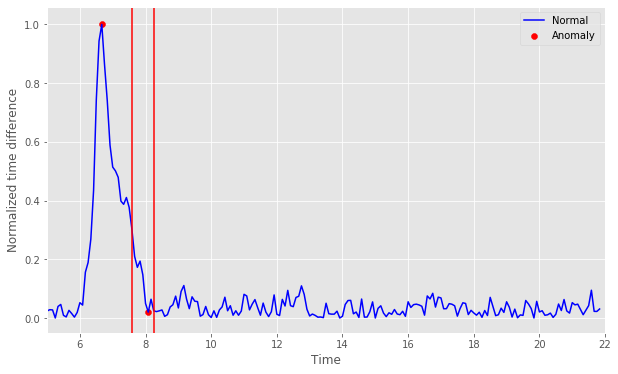

C:\Users\Tenyu\Anaconda3\lib\site-packages\ipykernel_launcher.py:28: FutureWarning: set_value is deprecated and will be removed in a future release. Please use .at[] or .iat[] accessors instead


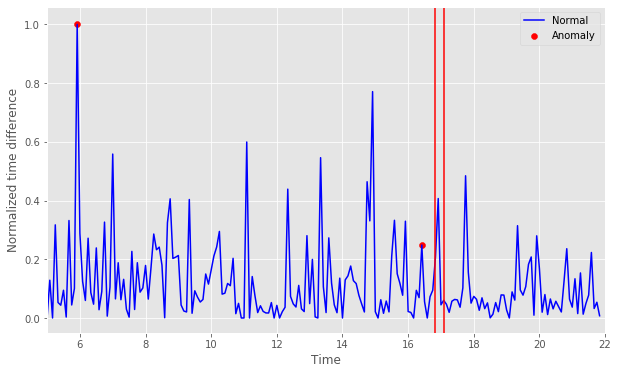

C:\Users\Tenyu\Anaconda3\lib\site-packages\ipykernel_launcher.py:28: FutureWarning: set_value is deprecated and will be removed in a future release. Please use .at[] or .iat[] accessors instead


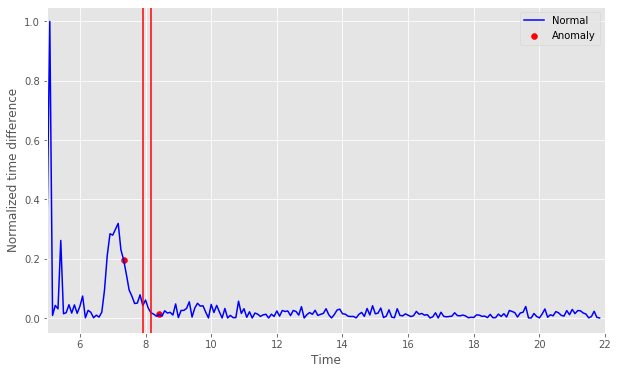

C:\Users\Tenyu\Anaconda3\lib\site-packages\ipykernel_launcher.py:28: FutureWarning: set_value is deprecated and will be removed in a future release. Please use .at[] or .iat[] accessors instead


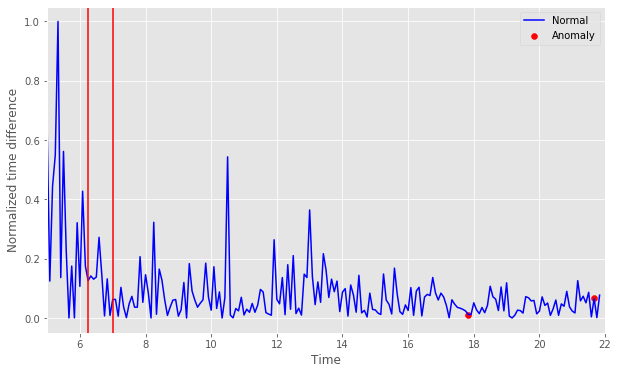

C:\Users\Tenyu\Anaconda3\lib\site-packages\ipykernel_launcher.py:28: FutureWarning: set_value is deprecated and will be removed in a future release. Please use .at[] or .iat[] accessors instead


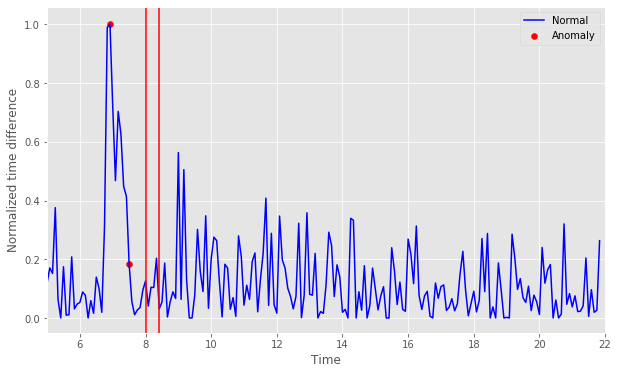

C:\Users\Tenyu\Anaconda3\lib\site-packages\ipykernel_launcher.py:28: FutureWarning: set_value is deprecated and will be removed in a future release. Please use .at[] or .iat[] accessors instead


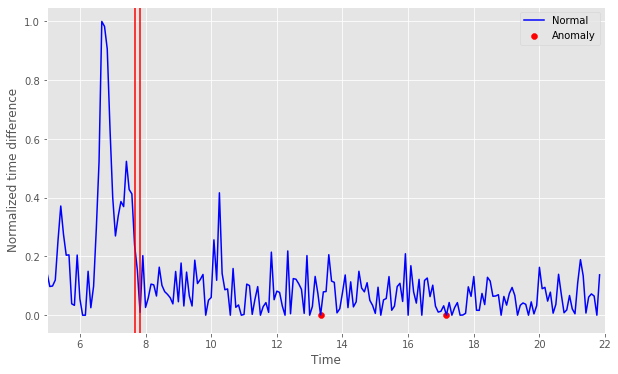

C:\Users\Tenyu\Anaconda3\lib\site-packages\ipykernel_launcher.py:28: FutureWarning: set_value is deprecated and will be removed in a future release. Please use .at[] or .iat[] accessors instead


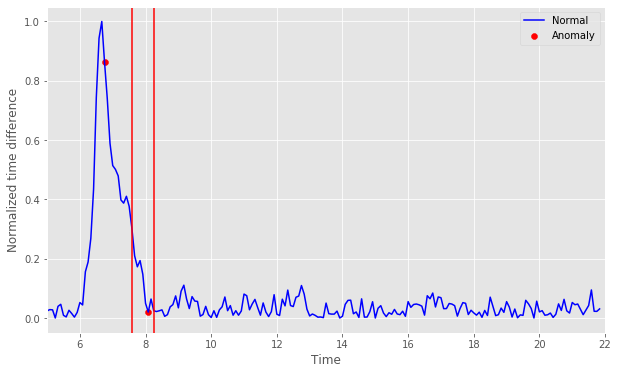

C:\Users\Tenyu\Anaconda3\lib\site-packages\ipykernel_launcher.py:28: FutureWarning: set_value is deprecated and will be removed in a future release. Please use .at[] or .iat[] accessors instead


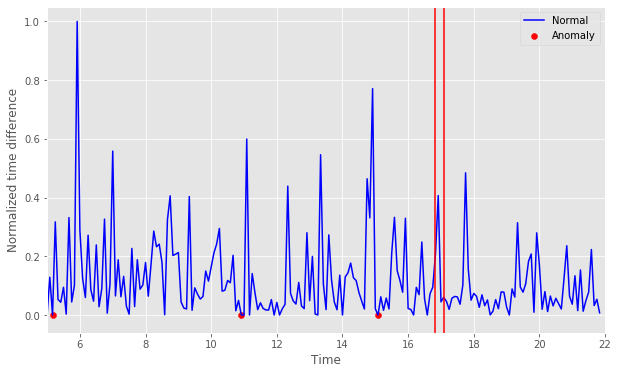

C:\Users\Tenyu\Anaconda3\lib\site-packages\ipykernel_launcher.py:28: FutureWarning: set_value is deprecated and will be removed in a future release. Please use .at[] or .iat[] accessors instead


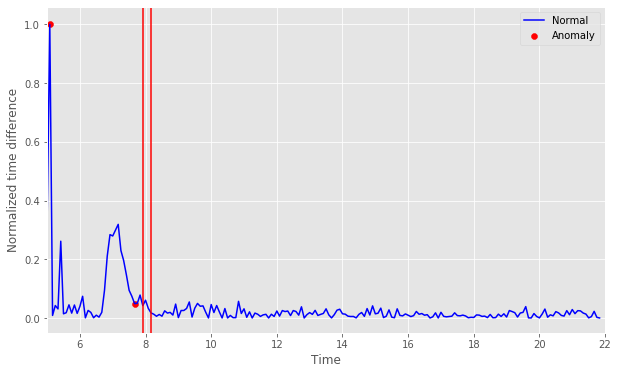

C:\Users\Tenyu\Anaconda3\lib\site-packages\ipykernel_launcher.py:28: FutureWarning: set_value is deprecated and will be removed in a future release. Please use .at[] or .iat[] accessors instead


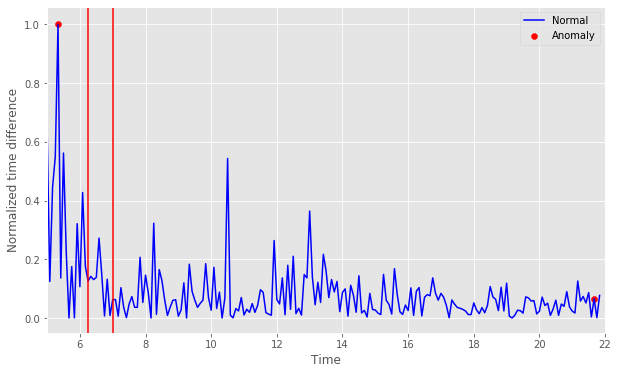

C:\Users\Tenyu\Anaconda3\lib\site-packages\ipykernel_launcher.py:28: FutureWarning: set_value is deprecated and will be removed in a future release. Please use .at[] or .iat[] accessors instead


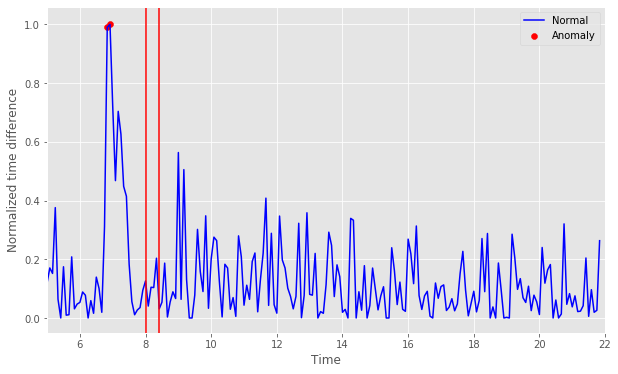

C:\Users\Tenyu\Anaconda3\lib\site-packages\ipykernel_launcher.py:28: FutureWarning: set_value is deprecated and will be removed in a future release. Please use .at[] or .iat[] accessors instead


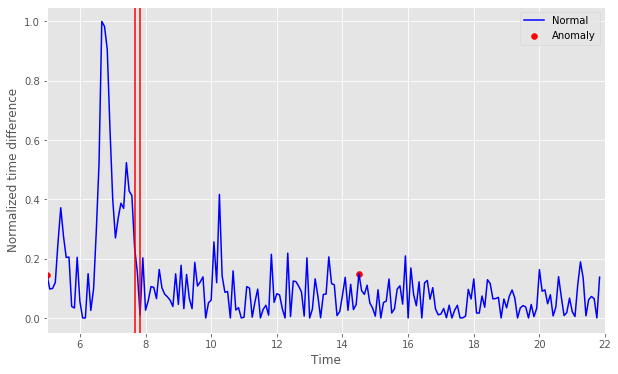

C:\Users\Tenyu\Anaconda3\lib\site-packages\ipykernel_launcher.py:28: FutureWarning: set_value is deprecated and will be removed in a future release. Please use .at[] or .iat[] accessors instead


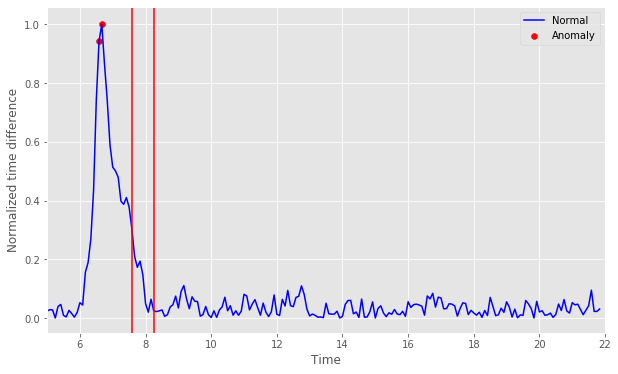

C:\Users\Tenyu\Anaconda3\lib\site-packages\ipykernel_launcher.py:28: FutureWarning: set_value is deprecated and will be removed in a future release. Please use .at[] or .iat[] accessors instead


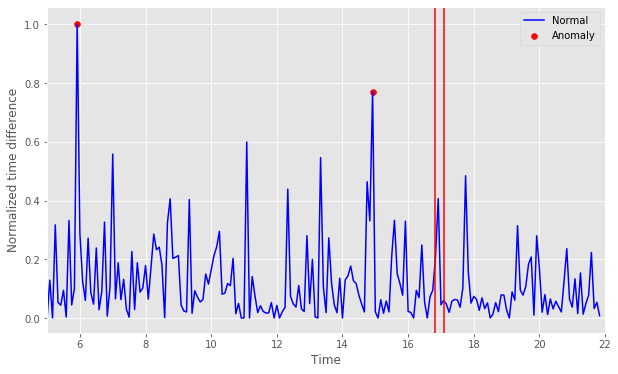

C:\Users\Tenyu\Anaconda3\lib\site-packages\ipykernel_launcher.py:28: FutureWarning: set_value is deprecated and will be removed in a future release. Please use .at[] or .iat[] accessors instead


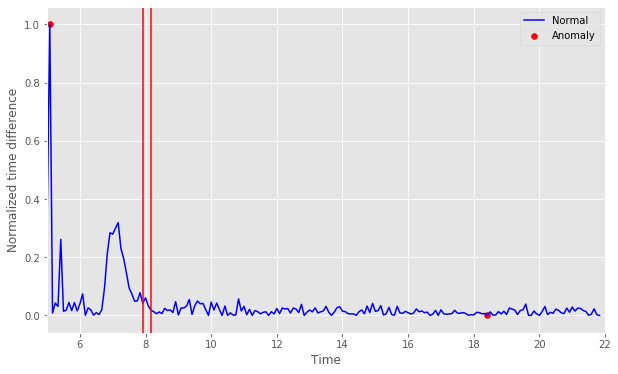

C:\Users\Tenyu\Anaconda3\lib\site-packages\ipykernel_launcher.py:28: FutureWarning: set_value is deprecated and will be removed in a future release. Please use .at[] or .iat[] accessors instead


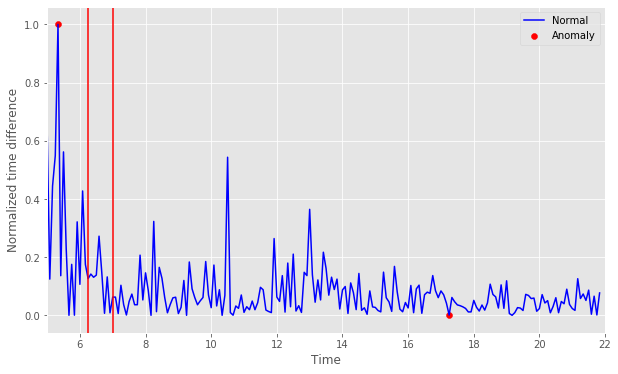

C:\Users\Tenyu\Anaconda3\lib\site-packages\ipykernel_launcher.py:28: FutureWarning: set_value is deprecated and will be removed in a future release. Please use .at[] or .iat[] accessors instead


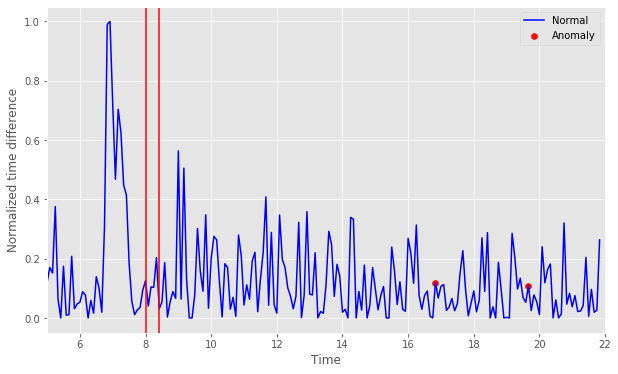

C:\Users\Tenyu\Anaconda3\lib\site-packages\ipykernel_launcher.py:28: FutureWarning: set_value is deprecated and will be removed in a future release. Please use .at[] or .iat[] accessors instead


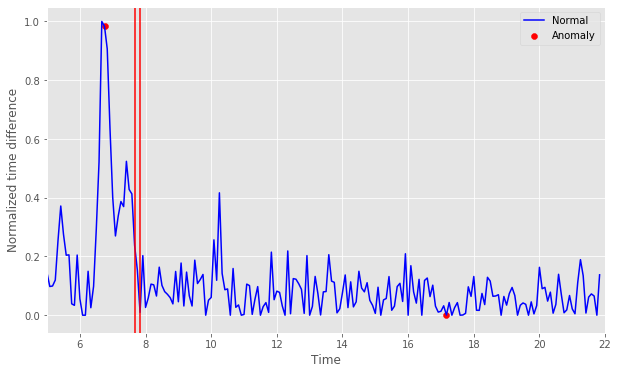

C:\Users\Tenyu\Anaconda3\lib\site-packages\ipykernel_launcher.py:28: FutureWarning: set_value is deprecated and will be removed in a future release. Please use .at[] or .iat[] accessors instead


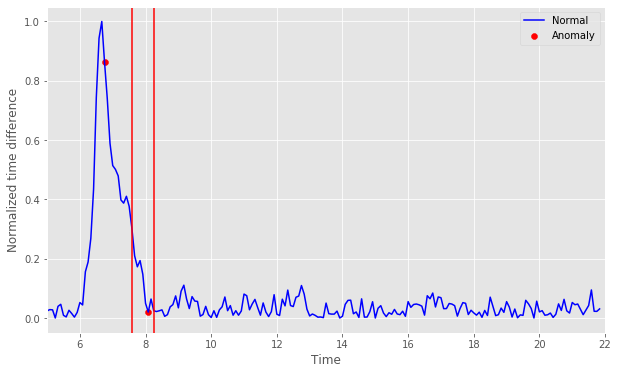

C:\Users\Tenyu\Anaconda3\lib\site-packages\ipykernel_launcher.py:28: FutureWarning: set_value is deprecated and will be removed in a future release. Please use .at[] or .iat[] accessors instead


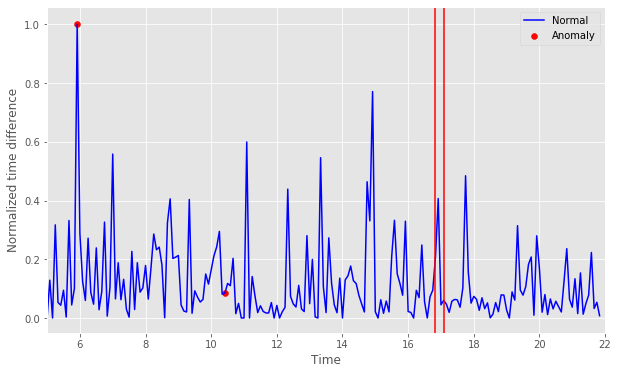

C:\Users\Tenyu\Anaconda3\lib\site-packages\ipykernel_launcher.py:28: FutureWarning: set_value is deprecated and will be removed in a future release. Please use .at[] or .iat[] accessors instead


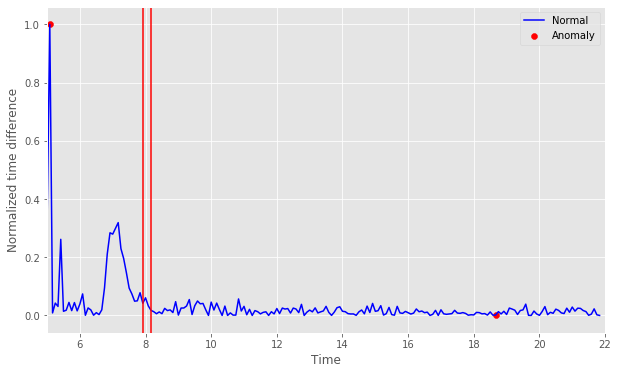

C:\Users\Tenyu\Anaconda3\lib\site-packages\ipykernel_launcher.py:28: FutureWarning: set_value is deprecated and will be removed in a future release. Please use .at[] or .iat[] accessors instead


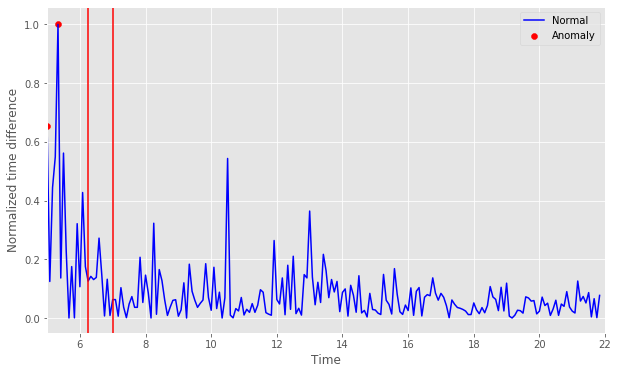

C:\Users\Tenyu\Anaconda3\lib\site-packages\ipykernel_launcher.py:28: FutureWarning: set_value is deprecated and will be removed in a future release. Please use .at[] or .iat[] accessors instead


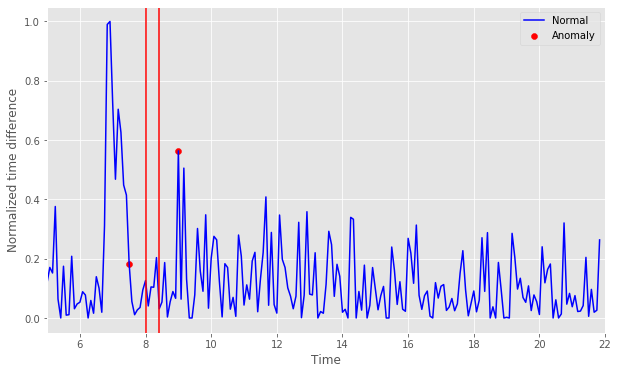

C:\Users\Tenyu\Anaconda3\lib\site-packages\ipykernel_launcher.py:28: FutureWarning: set_value is deprecated and will be removed in a future release. Please use .at[] or .iat[] accessors instead


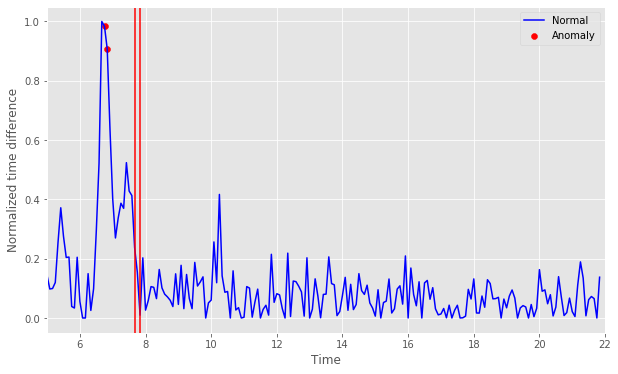

C:\Users\Tenyu\Anaconda3\lib\site-packages\ipykernel_launcher.py:28: FutureWarning: set_value is deprecated and will be removed in a future release. Please use .at[] or .iat[] accessors instead


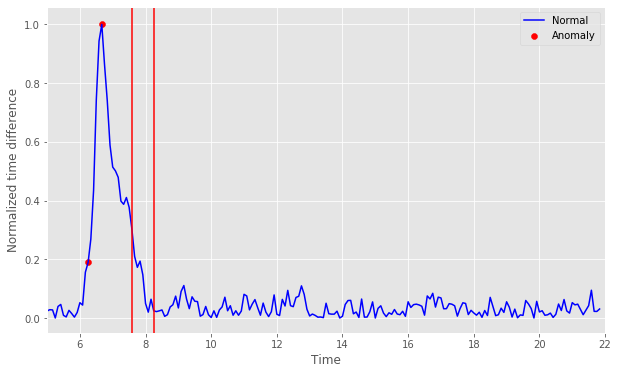

C:\Users\Tenyu\Anaconda3\lib\site-packages\ipykernel_launcher.py:28: FutureWarning: set_value is deprecated and will be removed in a future release. Please use .at[] or .iat[] accessors instead


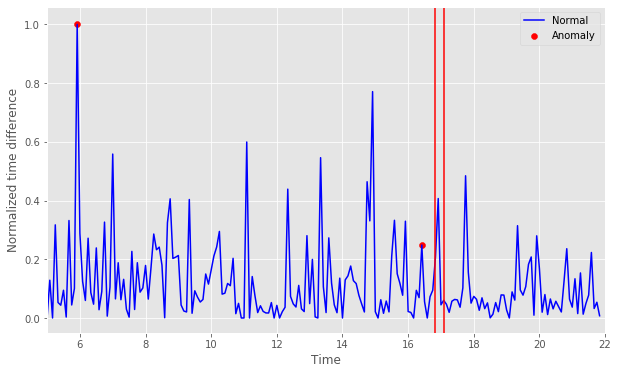

C:\Users\Tenyu\Anaconda3\lib\site-packages\ipykernel_launcher.py:28: FutureWarning: set_value is deprecated and will be removed in a future release. Please use .at[] or .iat[] accessors instead


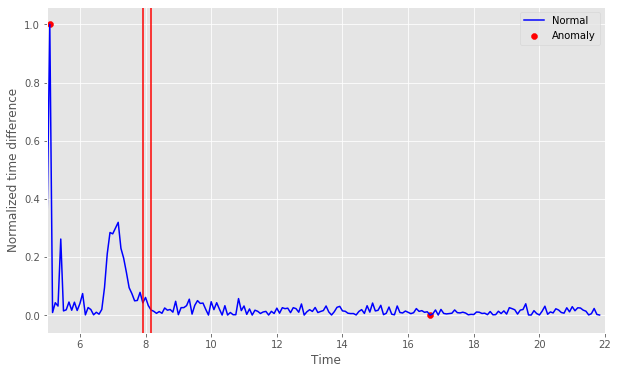

C:\Users\Tenyu\Anaconda3\lib\site-packages\ipykernel_launcher.py:28: FutureWarning: set_value is deprecated and will be removed in a future release. Please use .at[] or .iat[] accessors instead


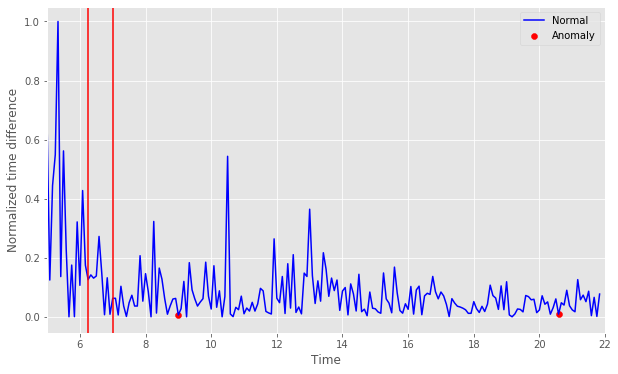

C:\Users\Tenyu\Anaconda3\lib\site-packages\ipykernel_launcher.py:28: FutureWarning: set_value is deprecated and will be removed in a future release. Please use .at[] or .iat[] accessors instead


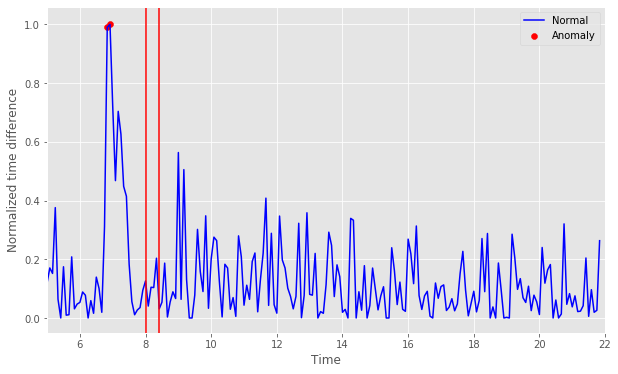

C:\Users\Tenyu\Anaconda3\lib\site-packages\ipykernel_launcher.py:28: FutureWarning: set_value is deprecated and will be removed in a future release. Please use .at[] or .iat[] accessors instead


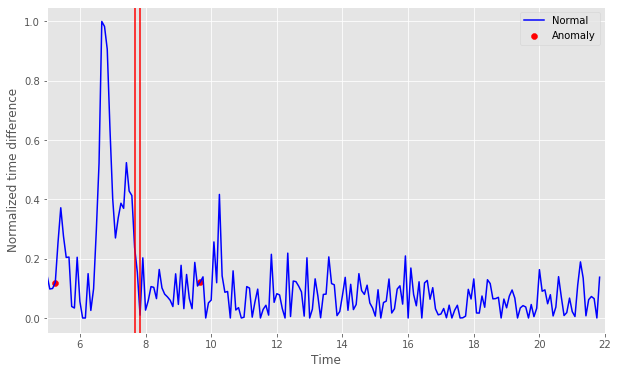

C:\Users\Tenyu\Anaconda3\lib\site-packages\ipykernel_launcher.py:28: FutureWarning: set_value is deprecated and will be removed in a future release. Please use .at[] or .iat[] accessors instead


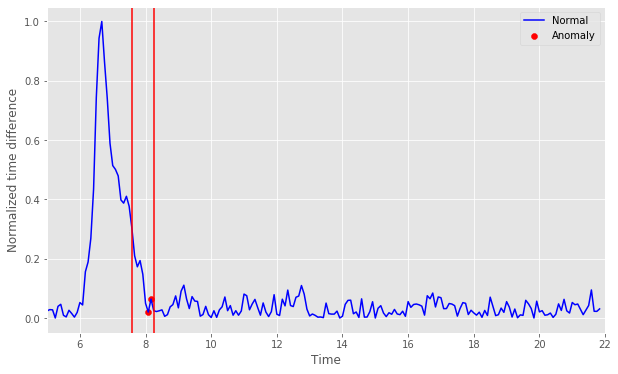

C:\Users\Tenyu\Anaconda3\lib\site-packages\ipykernel_launcher.py:28: FutureWarning: set_value is deprecated and will be removed in a future release. Please use .at[] or .iat[] accessors instead


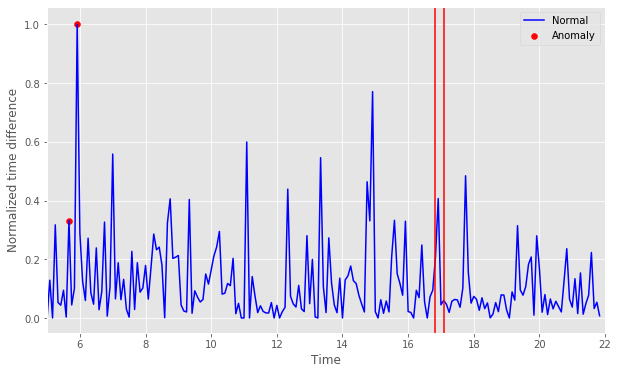

1


In [19]:
# Anomal detection in time series (K-MEANS part 1)

# Variable is flexible to find the higest values
ACC_result = []
find_max = []
for try_num in list(range(0, 10)):
    result_kmeans = []
    for i in list(range(0, len(df_line))):  
        df1 = df_line[i][df_line[i]['Time'] >= start_time_sys]
        X = df1[['TT_DIFF', 'EXIT_DIFF']]
        
        # Normalize the dataset
        X = X.values #returns a numpy array
        min_max_scaler = preprocessing.MinMaxScaler()
        x_scaled = min_max_scaler.fit_transform(X)
        data = pd.DataFrame(x_scaled)
        
        
        n_cluster = range(1, 20)
        kmeans = [KMeans(n_clusters=i).fit(data) for i in n_cluster]


        def getDistanceByPoint(data, model):
            distance = pd.Series()
            for i in range(0,len(data)):
                Xa = np.array(data.iloc[i])
                Xb = model.cluster_centers_[model.labels_[i]-1]
                distance.set_value(i, np.linalg.norm(Xa-Xb))
            return distance

        
        # A data point can be considered unusual if its z-score is above 333 or below -3 or above 3. SO we use 0.01
        outliers_fraction = 0.01

        # get the distance between each point and its nearest centroid. The biggest distances are considered as anomaly
        distance = getDistanceByPoint(data, kmeans[try_num])
        number_of_outliers = int(outliers_fraction*len(distance))
        threshold = distance.nlargest(number_of_outliers).min()
        # anomaly1 contain the anomaly result of the above method Cluster (0:normal, 1:anomaly) 
        data['anomaly1'] = (distance >= threshold).astype(int)
        data = pd.concat([df_line[i]['Time'], data], axis=1)
        data.columns = ['Time', 'TT_DIFF', 'EXIT_DIFF', 'anomaly1']
        
        # visualisation of anomaly with cluster view
        fig, ax = plt.subplots(figsize=(10,6))
        a = data.loc[data['anomaly1'] == 1, ['Time', 'TT_DIFF']] #anomaly
       
        ax.plot(data['Time'], data['TT_DIFF'], color='blue', label='Normal')
        ax.scatter(a['Time'],a['TT_DIFF'], color='red', label='Anomaly')
        plt.xlabel('Time')
        plt.ylabel('Normalized time difference')

        x1 = inc_log['Time'].tolist()[i]
        x2 = inc_log['End_time'].tolist()[i]
        plt.axvline(x1, color='red')
        plt.axvline(x2, color='red')
        plt.legend()
        plt.xlim(start_time_sys-1, end_time_sys)
        # plt.savefig('C:/Users/Tenyu/Desktop/Jan 5th, 2020/ABNORMAL/' + 'KNN_10_min' + '.png')
        plt.show()

        # Judge if the seleced time window contains the abnomal value
        judge = data[(data['Time'] >= x1) & (data['Time'] <= x2)]
        result = (judge['anomaly1'] == 1).any()
        result_kmeans.append(result)


    from collections import Counter
    counter = Counter(result_kmeans)
    correct_num = counter[True]
    find_max.append(correct_num)

current_max_number = 0
for number in find_max:
    if number>current_max_number:
        current_max_number = number

print(current_max_number)

C:\Users\Tenyu\Anaconda3\lib\site-packages\ipykernel_launcher.py:25: FutureWarning: set_value is deprecated and will be removed in a future release. Please use .at[] or .iat[] accessors instead


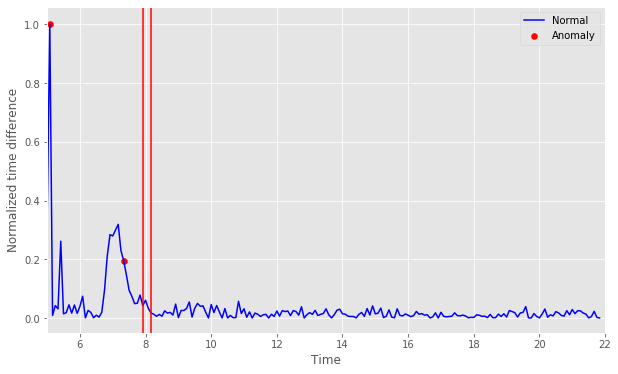

[]
[]
[5.083, 7.333]
0


C:\Users\Tenyu\Anaconda3\lib\site-packages\ipykernel_launcher.py:25: FutureWarning: set_value is deprecated and will be removed in a future release. Please use .at[] or .iat[] accessors instead


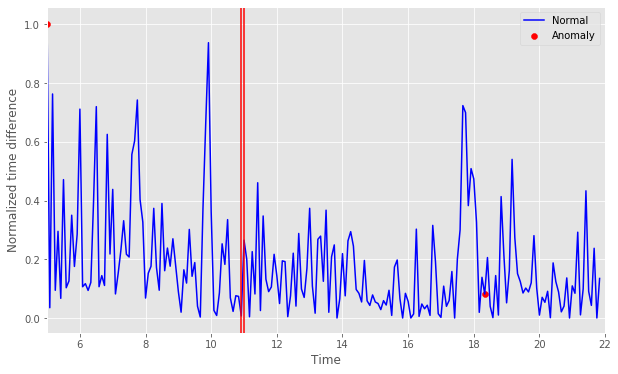

[]
[]
[5.0, 18.333]
0


C:\Users\Tenyu\Anaconda3\lib\site-packages\ipykernel_launcher.py:25: FutureWarning: set_value is deprecated and will be removed in a future release. Please use .at[] or .iat[] accessors instead


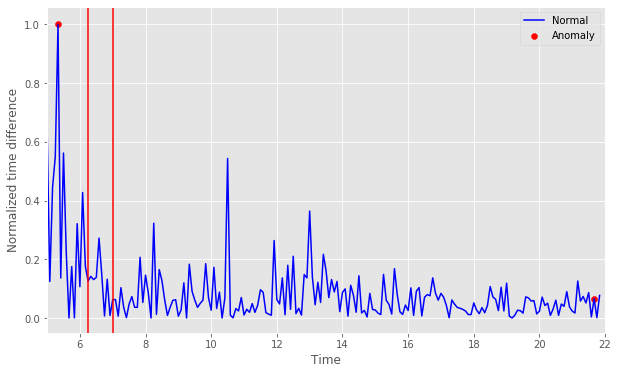

[]
[]
[5.333, 21.667]
0


C:\Users\Tenyu\Anaconda3\lib\site-packages\ipykernel_launcher.py:25: FutureWarning: set_value is deprecated and will be removed in a future release. Please use .at[] or .iat[] accessors instead


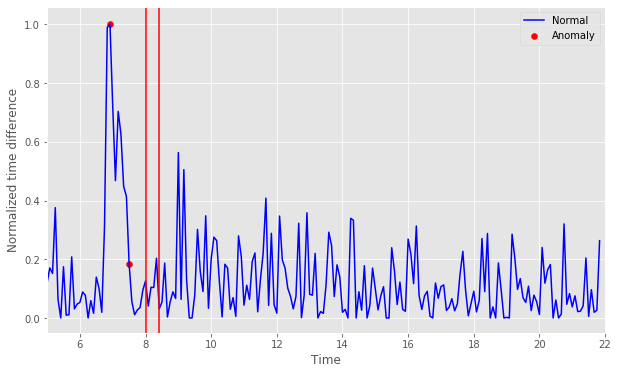

[]
[]
[6.917, 7.5]
0


C:\Users\Tenyu\Anaconda3\lib\site-packages\ipykernel_launcher.py:25: FutureWarning: set_value is deprecated and will be removed in a future release. Please use .at[] or .iat[] accessors instead


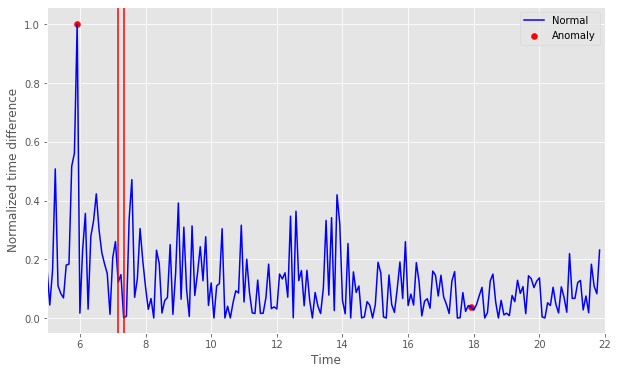

[]
[]
[5.917, 17.917]
0


C:\Users\Tenyu\Anaconda3\lib\site-packages\ipykernel_launcher.py:25: FutureWarning: set_value is deprecated and will be removed in a future release. Please use .at[] or .iat[] accessors instead


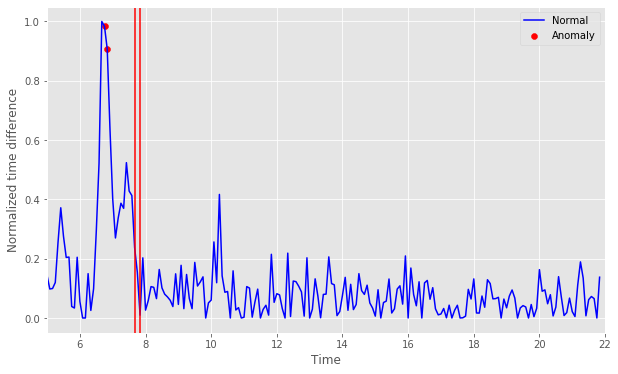

[]
[]
[6.75, 6.833]
0


C:\Users\Tenyu\Anaconda3\lib\site-packages\ipykernel_launcher.py:25: FutureWarning: set_value is deprecated and will be removed in a future release. Please use .at[] or .iat[] accessors instead


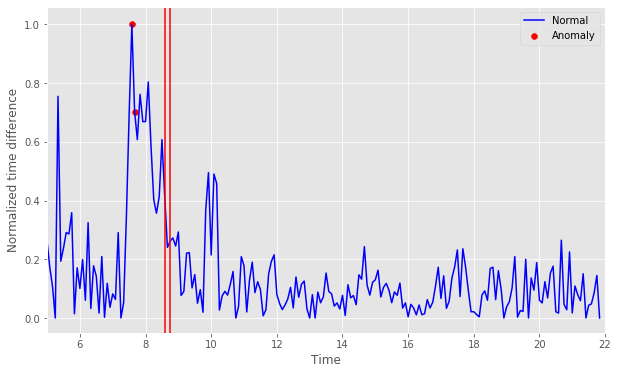

[]
[]
[7.583, 7.667]
0


C:\Users\Tenyu\Anaconda3\lib\site-packages\ipykernel_launcher.py:25: FutureWarning: set_value is deprecated and will be removed in a future release. Please use .at[] or .iat[] accessors instead


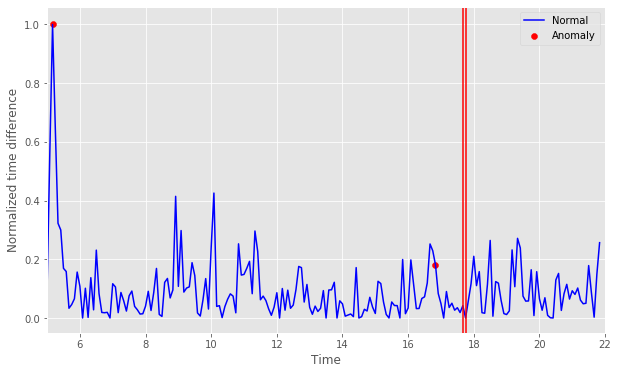

[]
[]
[5.167, 16.833]
0


C:\Users\Tenyu\Anaconda3\lib\site-packages\ipykernel_launcher.py:25: FutureWarning: set_value is deprecated and will be removed in a future release. Please use .at[] or .iat[] accessors instead


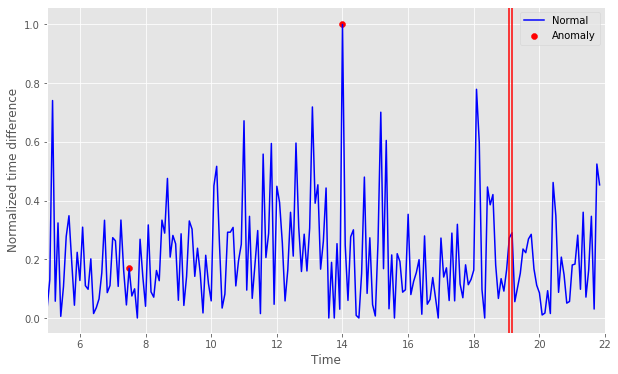

[]
[]
[7.5, 14.0]
0


C:\Users\Tenyu\Anaconda3\lib\site-packages\ipykernel_launcher.py:25: FutureWarning: set_value is deprecated and will be removed in a future release. Please use .at[] or .iat[] accessors instead


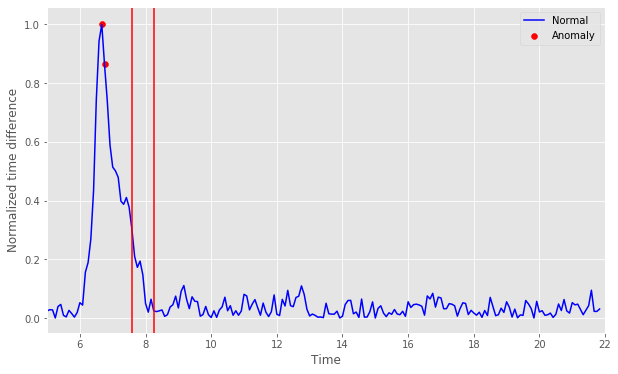

[]
[]
[6.667, 6.75]
0


C:\Users\Tenyu\Anaconda3\lib\site-packages\ipykernel_launcher.py:25: FutureWarning: set_value is deprecated and will be removed in a future release. Please use .at[] or .iat[] accessors instead


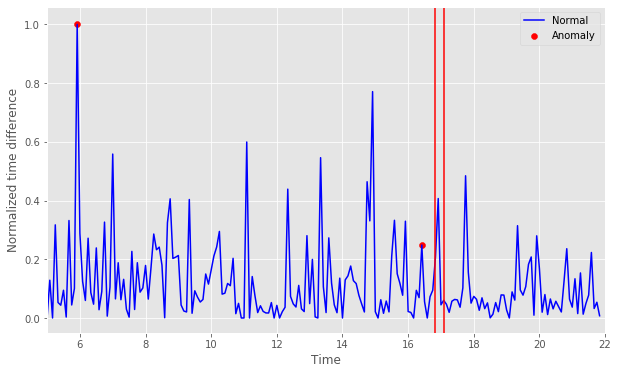

[]
[]
[5.917, 16.417]
0


C:\Users\Tenyu\Anaconda3\lib\site-packages\ipykernel_launcher.py:25: FutureWarning: set_value is deprecated and will be removed in a future release. Please use .at[] or .iat[] accessors instead


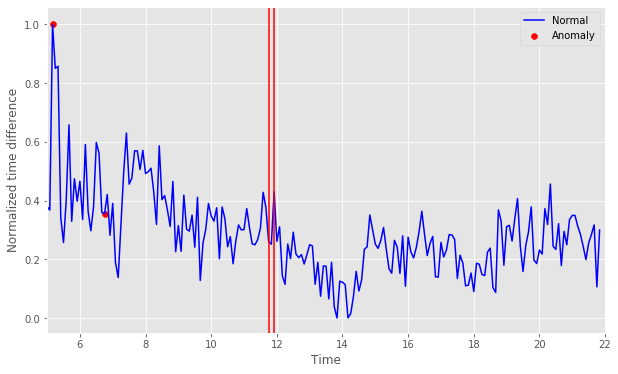

[]
[]
[5.167, 6.75]
0


C:\Users\Tenyu\Anaconda3\lib\site-packages\ipykernel_launcher.py:25: FutureWarning: set_value is deprecated and will be removed in a future release. Please use .at[] or .iat[] accessors instead


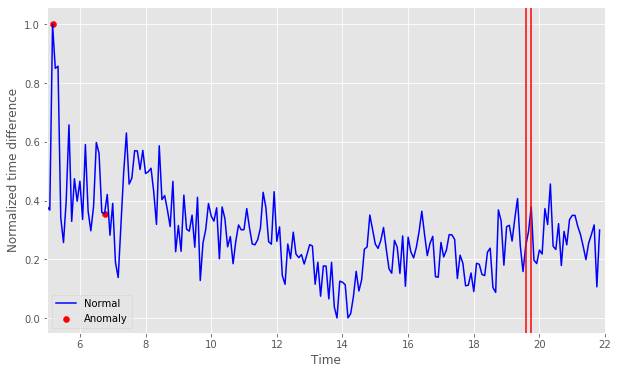

[]
[]
[5.167, 6.75]
0
Counter({False: 13})
0
0
0.0


In [26]:
# Anomal detection in time series (K-MEANS part 2)
# Using the highest current_max_number to generate the accuracy
ACC_result = []
best_kmeans = []
for i in list(range(0, len(df_line))):  
    df1 = df_line[i][df_line[i]['Time'] >= start_time_sys]
    X = df1[['TT_DIFF', 'EXIT_DIFF']]

    # Normalize the dataset
    X = X.values #returns a numpy array
    min_max_scaler = preprocessing.MinMaxScaler()
    x_scaled = min_max_scaler.fit_transform(X)
    data = pd.DataFrame(x_scaled)


    n_cluster = range(1, 20)
    kmeans = [KMeans(n_clusters=i).fit(data) for i in n_cluster]


    def getDistanceByPoint(data, model):
        distance = pd.Series()
        for i in range(0,len(data)):
            Xa = np.array(data.iloc[i])
            Xb = model.cluster_centers_[model.labels_[i]-1]
            distance.set_value(i, np.linalg.norm(Xa-Xb))
        return distance


    # A data point can be considered unusual if its z-score is above 333 or below -3 or above 3. SO we use 0.01
    outliers_fraction = 0.01

    # get the distance between each point and its nearest centroid. The biggest distances are considered as anomaly
    distance = getDistanceByPoint(data, kmeans[1])
    number_of_outliers = int(outliers_fraction*len(distance))
    threshold = distance.nlargest(number_of_outliers).min()
    # anomaly1 contain the anomaly result of the above method Cluster (0:normal, 1:anomaly) 
    data['anomaly1'] = (distance >= threshold).astype(int)
    data = pd.concat([df_line[i]['Time'], data], axis=1)
    data.columns = ['Time', 'TT_DIFF', 'EXIT_DIFF', 'anomaly1']

    # visualisation of anomaly with cluster view
    fig, ax = plt.subplots(figsize=(10,6))
    a = data.loc[data['anomaly1'] == 1, ['Time', 'TT_DIFF']] #anomaly

    ax.plot(data['Time'], data['TT_DIFF'], color='blue', label='Normal')
    ax.scatter(a['Time'],a['TT_DIFF'], color='red', label='Anomaly')
    plt.xlabel('Time')
    plt.ylabel('Normalized time difference')

    x1 = inc_log['Time'].tolist()[i]
    x2 = inc_log['End_time'].tolist()[i]
    plt.axvline(x1, color='red')
    plt.axvline(x2, color='red')
    plt.legend()
    plt.xlim(start_time_sys-1, end_time_sys)
    # plt.savefig('C:/Users/Tenyu/Desktop/Jan 5th, 2020/ABNORMAL/' + 'KNN_10_min' + '.png')
    plt.show()

    # Accuracy for deteted abnomality
    a['Time'] = a['Time'].round(decimals=3)
    time_list = list(a['Time'])
    
    # The following loop is used to include uncaptured anomaly points
    if time_list == []:
        correct_num == 0
    else:
    # The following split list by a certain interval
        def groupSequence(lst): 
            res = [[lst[0]]] 

            for i in range(1, len(lst)): 
                if (lst[i-1]+0.083 == lst[i]) or (lst[i-1]+0.084 == lst[i]): 
                    res[-1].append(lst[i]) 

                else: 
                    res.append([lst[i]]) 
            return res 

        split_list = groupSequence(time_list)
        
    
        matching_1 = [s for s in split_list if x1 in s]
        matching_2 = [s for s in split_list if x2 in s]
        
        
        if (matching_1 == []) and (matching_2 == []):
            correct_num = 0
        elif (matching_1 == []) and (matching_2 != []):
            correct_num = len(matching_2[0])/len(time_list)
        elif (matching_2 == []) and (matching_1 != []):
            correct_num = len(matching_1[0])/len(time_list)
        elif matching_1 == matching_2:
            correct_num = len(matching_1[0])/len(time_list)
        elif (matching_1 != 0 and matching_2 != 0 and matching_1 != matching_2):
            correct_num = (len(matching_1[0])+len(matching_2[0]))/len(time_list)

            
        #  count how many single value is within a range
        def count(list1, l, r): 
            return len(list(x for x in list1 if l <= x <= r)) 
        count_num_sin = count(time_list, x1, x2)
    
        if (correct_num == 0) and (count_num_sin != 0):
            correct_num = count_num_sin/len(time_list)
        else:
            correct_num
            
    print(matching_1)
    print(matching_2)
    print(time_list)
    accuracy = round(correct_num, 2)
    print(accuracy)
    ACC_result.append(accuracy)    


    # Judge if the seleced time window contains the abnomal value
    judge = data[(data['Time'] >= x1) & (data['Time'] <= x2)]
    result = (judge['anomaly1'] == 1).any()
    best_kmeans.append(result)


from collections import Counter
counter1 = Counter(best_kmeans)

# Print out all results
print(counter1)
print(min(ACC_result))
print(max(ACC_result))
print(sum(ACC_result)/len(ACC_result))

[0, 0, 0, 0, 0, 0, 0, 0]

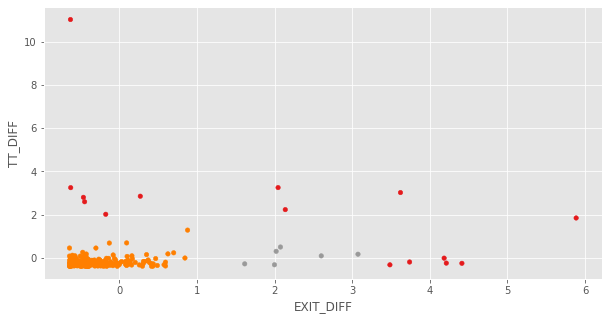

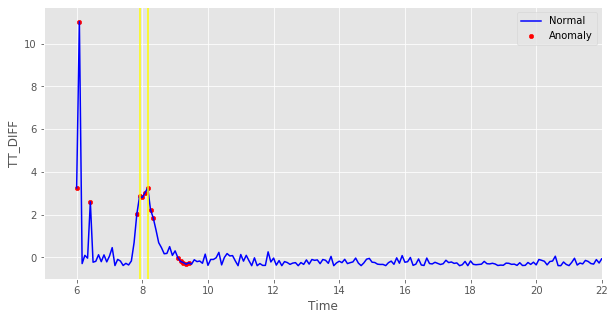

C:\Users\Tenyu\Anaconda3\lib\site-packages\ipykernel_launcher.py:56: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


[[7.833, 7.917, 8.0, 8.083, 8.167, 8.25, 8.333]]
[[7.833, 7.917, 8.0, 8.083, 8.167, 8.25, 8.333]]
[6.0, 6.083, 6.417, 7.833, 7.917, 8.0, 8.083, 8.167, 8.25, 8.333, 9.083, 9.167, 9.25, 9.333, 9.417]
0.47


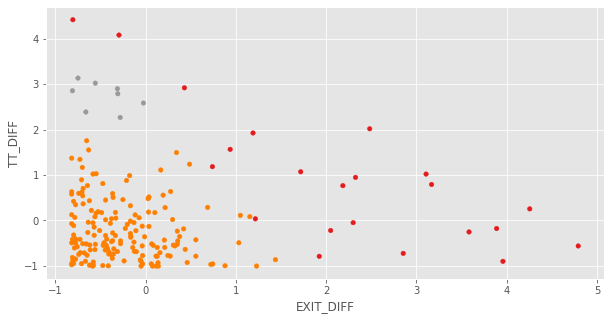

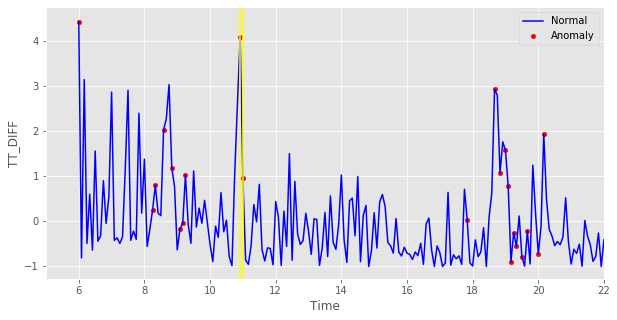

C:\Users\Tenyu\Anaconda3\lib\site-packages\ipykernel_launcher.py:56: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


[[10.917, 11.0]]
[[10.917, 11.0]]
[6.0, 8.25, 8.333, 8.583, 8.833, 9.083, 9.167, 9.25, 10.917, 11.0, 17.833, 18.667, 18.833, 19.0, 19.083, 19.167, 19.25, 19.333, 19.5, 19.667, 20.0, 20.167]
0.09


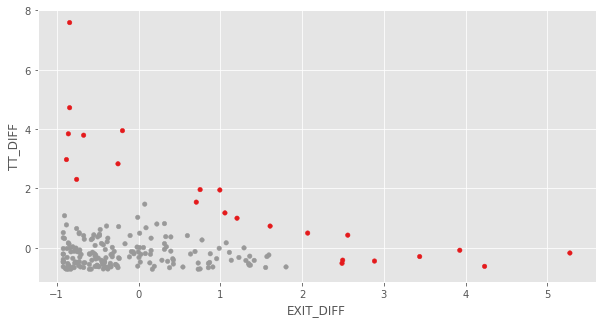

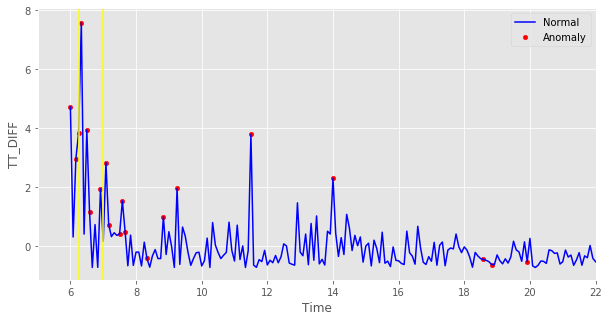

C:\Users\Tenyu\Anaconda3\lib\site-packages\ipykernel_launcher.py:56: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


[[6.167, 6.25, 6.333]]
[]
[6.0, 6.167, 6.25, 6.333, 6.5, 6.583, 6.917, 7.083, 7.167, 7.5, 7.583, 7.667, 8.333, 8.833, 9.25, 11.5, 14.0, 18.583, 18.833, 19.917, 22.417, 22.667, 22.833]
0.13


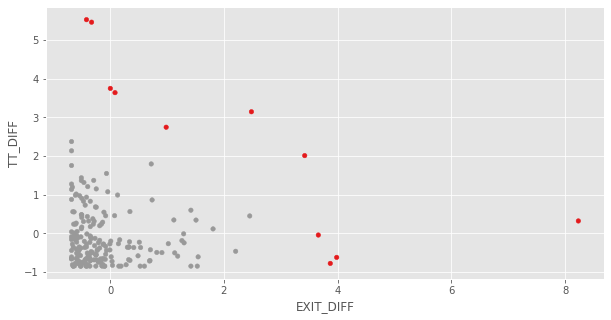

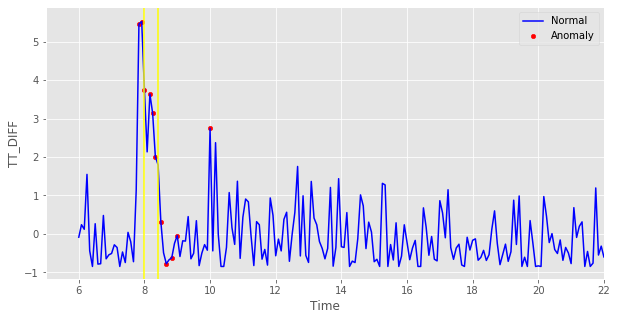

C:\Users\Tenyu\Anaconda3\lib\site-packages\ipykernel_launcher.py:56: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


[[7.833, 7.917, 8.0]]
[]
[7.833, 7.917, 8.0, 8.167, 8.25, 8.333, 8.5, 8.667, 8.833, 9.0, 10.0]
0.27


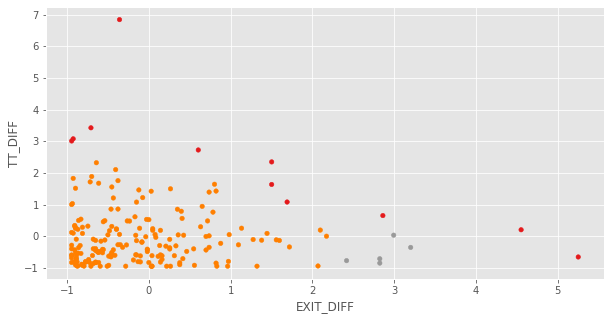

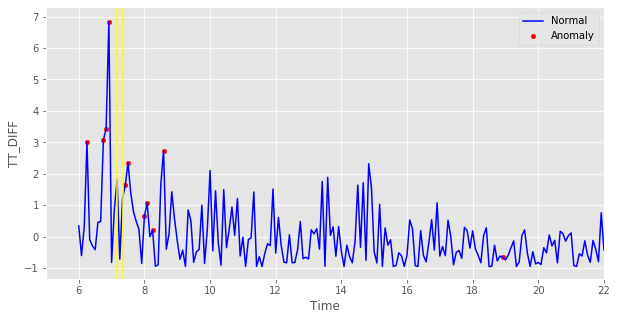

C:\Users\Tenyu\Anaconda3\lib\site-packages\ipykernel_launcher.py:56: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


[]
[]
[6.25, 6.75, 6.833, 6.917, 7.417, 7.5, 8.0, 8.083, 8.25, 8.583, 18.917]
0


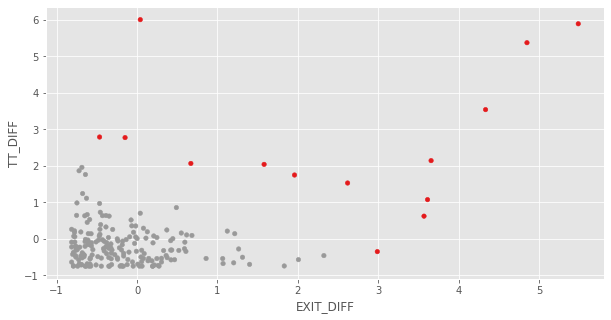

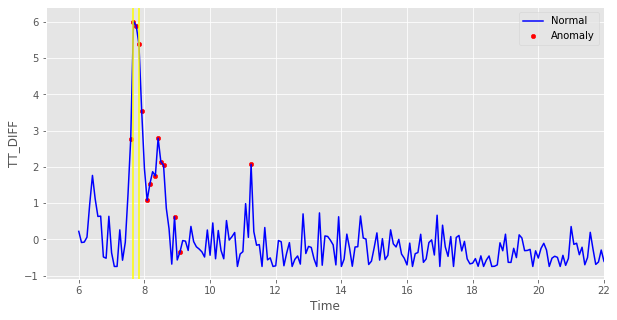

C:\Users\Tenyu\Anaconda3\lib\site-packages\ipykernel_launcher.py:56: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


[[7.583, 7.667, 7.75, 7.833, 7.917]]
[[7.583, 7.667, 7.75, 7.833, 7.917]]
[7.583, 7.667, 7.75, 7.833, 7.917, 8.083, 8.167, 8.333, 8.417, 8.5, 8.583, 8.917, 9.083, 11.25]
0.36


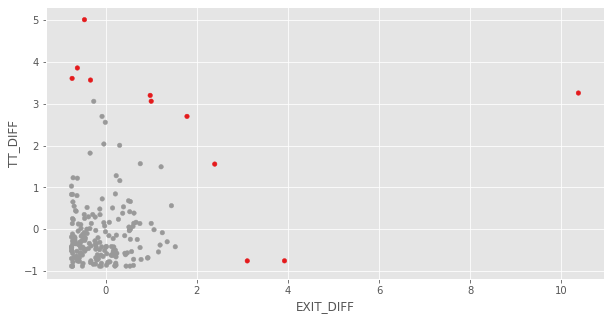

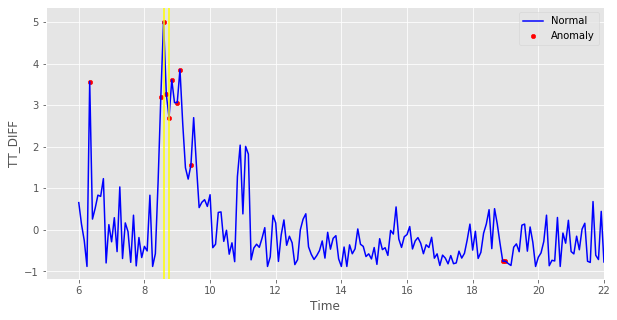

C:\Users\Tenyu\Anaconda3\lib\site-packages\ipykernel_launcher.py:56: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


[[8.5, 8.583, 8.667, 8.75, 8.833]]
[[8.5, 8.583, 8.667, 8.75, 8.833]]
[6.333, 8.5, 8.583, 8.667, 8.75, 8.833, 9.0, 9.083, 9.417, 18.917, 19.0]
0.45


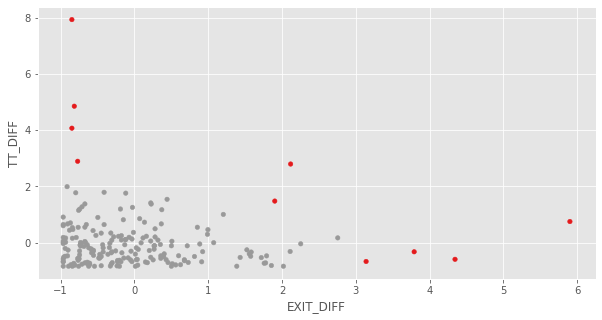

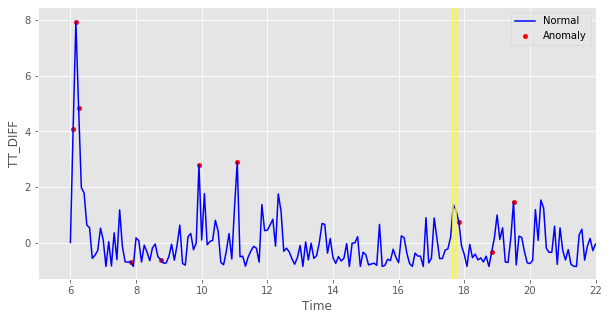

C:\Users\Tenyu\Anaconda3\lib\site-packages\ipykernel_launcher.py:56: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


[]
[]
[6.083, 6.167, 6.25, 7.833, 8.75, 9.917, 11.083, 17.833, 18.833, 19.5]
0


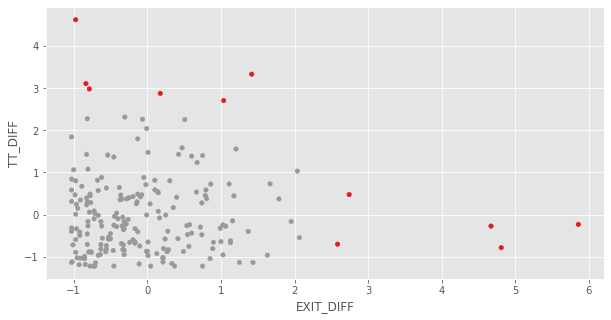

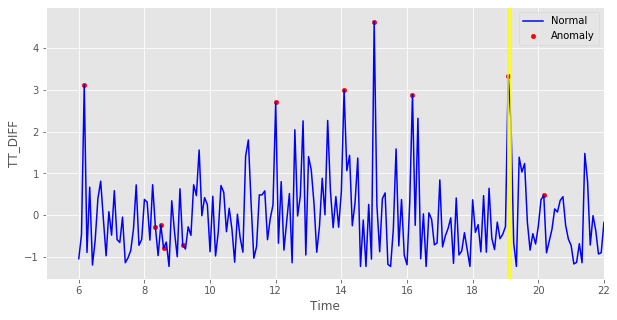

C:\Users\Tenyu\Anaconda3\lib\site-packages\ipykernel_launcher.py:56: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


[[19.083]]
[]
[6.167, 8.333, 8.5, 8.583, 9.167, 12.0, 14.083, 15.0, 16.167, 19.083, 20.167]
0.09


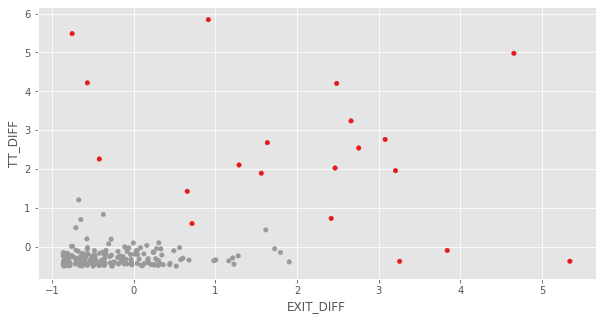

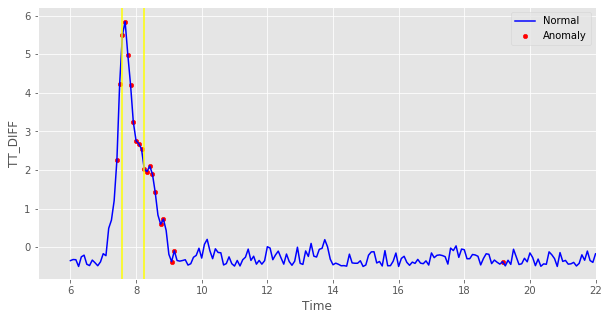

C:\Users\Tenyu\Anaconda3\lib\site-packages\ipykernel_launcher.py:56: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


[[7.417, 7.5, 7.583, 7.667, 7.75, 7.833, 7.917, 8.0, 8.083, 8.167, 8.25, 8.333, 8.417, 8.5, 8.583]]
[[7.417, 7.5, 7.583, 7.667, 7.75, 7.833, 7.917, 8.0, 8.083, 8.167, 8.25, 8.333, 8.417, 8.5, 8.583]]
[7.417, 7.5, 7.583, 7.667, 7.75, 7.833, 7.917, 8.0, 8.083, 8.167, 8.25, 8.333, 8.417, 8.5, 8.583, 8.75, 8.833, 9.083, 9.167, 19.167]
0.75


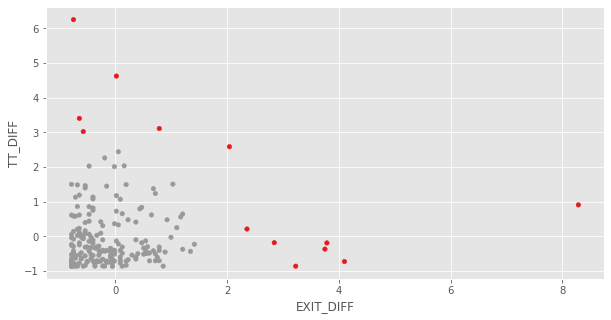

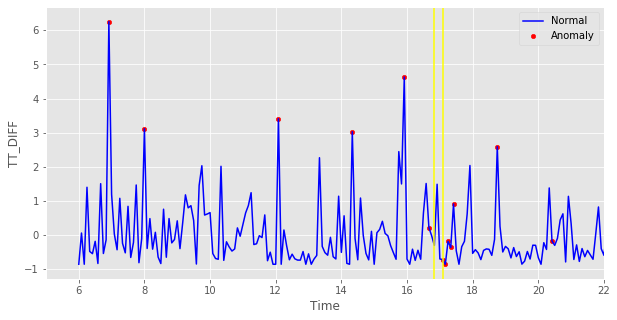

C:\Users\Tenyu\Anaconda3\lib\site-packages\ipykernel_launcher.py:56: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


[]
[[17.083]]
[6.917, 8.0, 12.083, 14.333, 15.917, 16.667, 17.083, 17.167, 17.25, 17.333, 17.417, 18.75, 20.417]
0.08


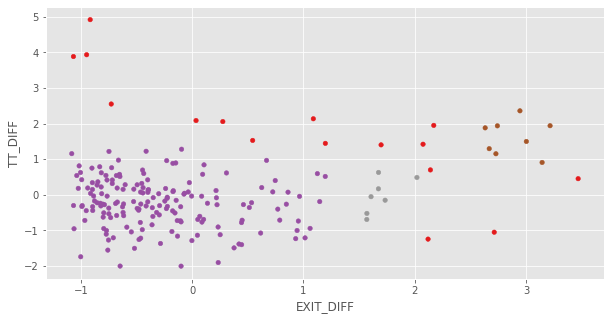

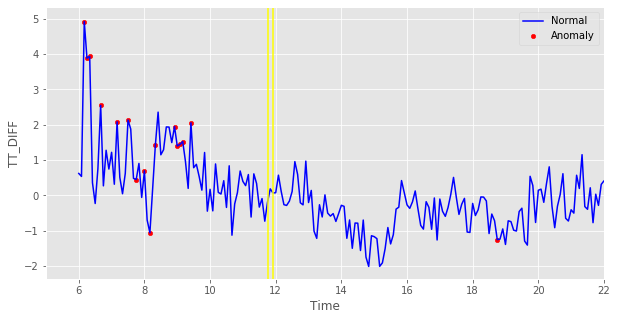

C:\Users\Tenyu\Anaconda3\lib\site-packages\ipykernel_launcher.py:56: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


[]
[]
[6.167, 6.25, 6.333, 6.667, 7.167, 7.5, 7.75, 8.0, 8.167, 8.333, 8.917, 9.0, 9.083, 9.167, 9.417, 18.75]
0


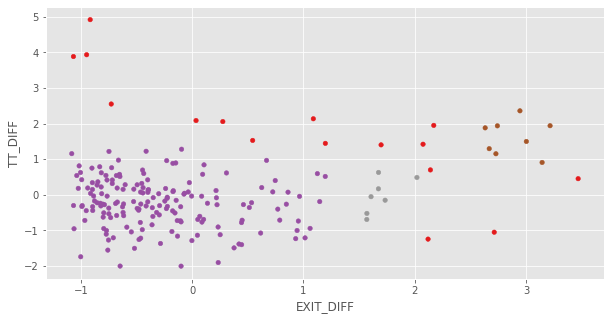

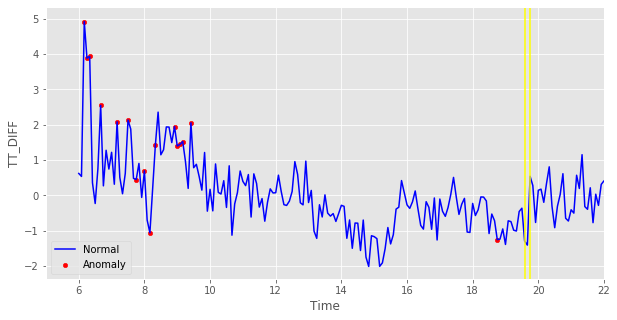

[]
[]
[6.167, 6.25, 6.333, 6.667, 7.167, 7.5, 7.75, 8.0, 8.167, 8.333, 8.917, 9.0, 9.083, 9.167, 9.417, 18.75]
0
Counter({True: 9, False: 4})
0
0.75
0.20692307692307693


C:\Users\Tenyu\Anaconda3\lib\site-packages\ipykernel_launcher.py:56: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


C:\Users\Tenyu\Anaconda3\lib\site-packages\sklearn\ensemble\iforest.py:247: FutureWarning: behaviour="old" is deprecated and will be removed in version 0.22. Please use behaviour="new", which makes the decision_function change to match other anomaly detection algorithm API.
  FutureWarning)
C:\Users\Tenyu\Anaconda3\lib\site-packages\sklearn\ensemble\iforest.py:415: DeprecationWarning: threshold_ attribute is deprecated in 0.20 and will be removed in 0.22.
  " be removed in 0.22.", DeprecationWarning)
C:\Users\Tenyu\Anaconda3\lib\site-packages\ipykernel_launcher.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  app.launch_new_instance()


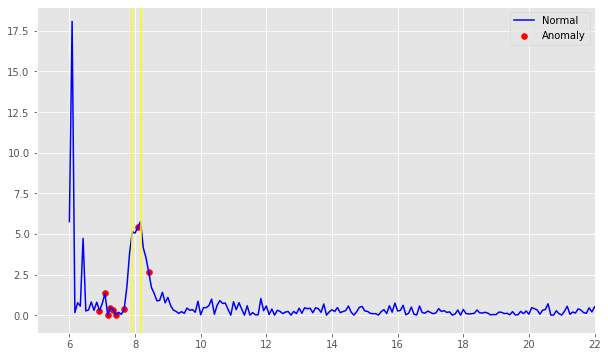

[]
[]
[6.917, 7.083, 7.167, 7.25, 7.333, 7.417, 7.667, 8.083, 8.417]
0.11


C:\Users\Tenyu\Anaconda3\lib\site-packages\sklearn\ensemble\iforest.py:247: FutureWarning: behaviour="old" is deprecated and will be removed in version 0.22. Please use behaviour="new", which makes the decision_function change to match other anomaly detection algorithm API.
  FutureWarning)
C:\Users\Tenyu\Anaconda3\lib\site-packages\sklearn\ensemble\iforest.py:415: DeprecationWarning: threshold_ attribute is deprecated in 0.20 and will be removed in 0.22.
  " be removed in 0.22.", DeprecationWarning)
C:\Users\Tenyu\Anaconda3\lib\site-packages\ipykernel_launcher.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  app.launch_new_instance()


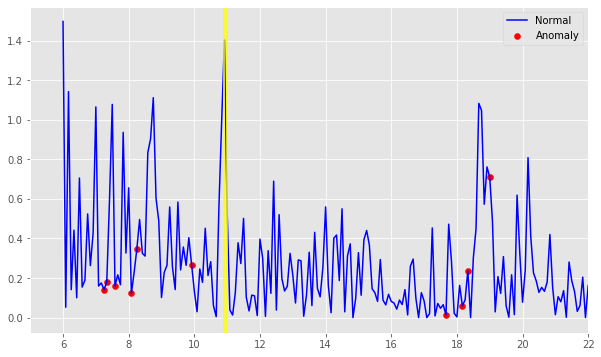

[]
[]
[7.25, 7.333, 7.583, 8.083, 8.25, 9.917, 17.667, 18.167, 18.333, 19.0]
0


C:\Users\Tenyu\Anaconda3\lib\site-packages\sklearn\ensemble\iforest.py:247: FutureWarning: behaviour="old" is deprecated and will be removed in version 0.22. Please use behaviour="new", which makes the decision_function change to match other anomaly detection algorithm API.
  FutureWarning)
C:\Users\Tenyu\Anaconda3\lib\site-packages\sklearn\ensemble\iforest.py:415: DeprecationWarning: threshold_ attribute is deprecated in 0.20 and will be removed in 0.22.
  " be removed in 0.22.", DeprecationWarning)
C:\Users\Tenyu\Anaconda3\lib\site-packages\ipykernel_launcher.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  app.launch_new_instance()


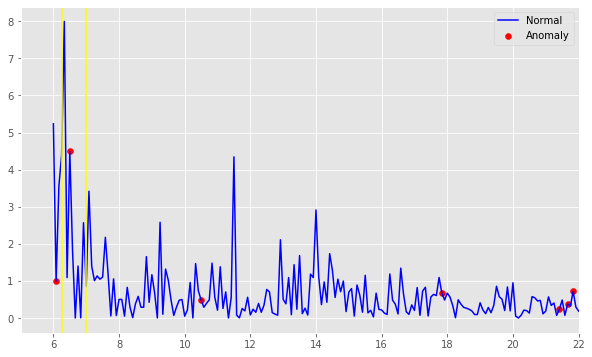

[]
[]
[6.083, 6.5, 10.5, 17.833, 21.417, 21.667, 21.833]
0.14


C:\Users\Tenyu\Anaconda3\lib\site-packages\sklearn\ensemble\iforest.py:247: FutureWarning: behaviour="old" is deprecated and will be removed in version 0.22. Please use behaviour="new", which makes the decision_function change to match other anomaly detection algorithm API.
  FutureWarning)
C:\Users\Tenyu\Anaconda3\lib\site-packages\sklearn\ensemble\iforest.py:415: DeprecationWarning: threshold_ attribute is deprecated in 0.20 and will be removed in 0.22.
  " be removed in 0.22.", DeprecationWarning)
C:\Users\Tenyu\Anaconda3\lib\site-packages\ipykernel_launcher.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  app.launch_new_instance()


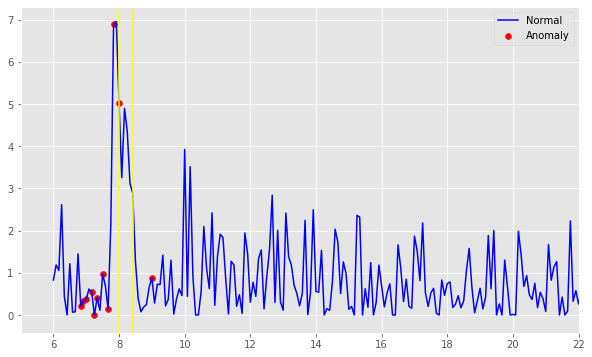

[[8.0]]
[]
[6.833, 6.917, 7.0, 7.167, 7.25, 7.333, 7.5, 7.667, 7.833, 8.0, 9.0]
0.09


C:\Users\Tenyu\Anaconda3\lib\site-packages\sklearn\ensemble\iforest.py:247: FutureWarning: behaviour="old" is deprecated and will be removed in version 0.22. Please use behaviour="new", which makes the decision_function change to match other anomaly detection algorithm API.
  FutureWarning)
C:\Users\Tenyu\Anaconda3\lib\site-packages\sklearn\ensemble\iforest.py:415: DeprecationWarning: threshold_ attribute is deprecated in 0.20 and will be removed in 0.22.
  " be removed in 0.22.", DeprecationWarning)
C:\Users\Tenyu\Anaconda3\lib\site-packages\ipykernel_launcher.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  app.launch_new_instance()


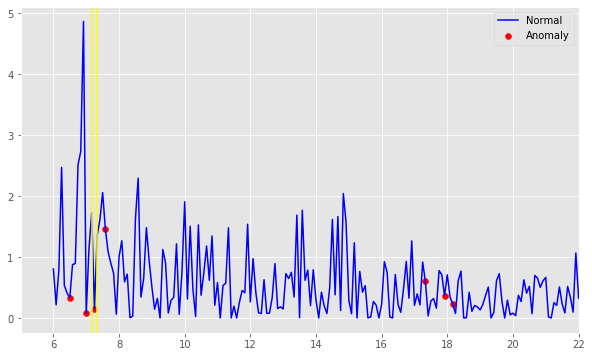

[]
[]
[6.5, 7.0, 7.25, 7.583, 17.333, 17.917, 18.167]
0.14


C:\Users\Tenyu\Anaconda3\lib\site-packages\sklearn\ensemble\iforest.py:247: FutureWarning: behaviour="old" is deprecated and will be removed in version 0.22. Please use behaviour="new", which makes the decision_function change to match other anomaly detection algorithm API.
  FutureWarning)
C:\Users\Tenyu\Anaconda3\lib\site-packages\sklearn\ensemble\iforest.py:415: DeprecationWarning: threshold_ attribute is deprecated in 0.20 and will be removed in 0.22.
  " be removed in 0.22.", DeprecationWarning)
C:\Users\Tenyu\Anaconda3\lib\site-packages\ipykernel_launcher.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  app.launch_new_instance()


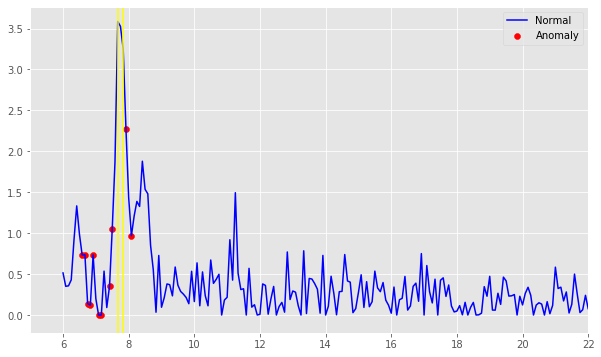

[]
[]
[6.583, 6.667, 6.75, 6.833, 6.917, 7.083, 7.167, 7.417, 7.5, 7.917, 8.083]
0


C:\Users\Tenyu\Anaconda3\lib\site-packages\sklearn\ensemble\iforest.py:247: FutureWarning: behaviour="old" is deprecated and will be removed in version 0.22. Please use behaviour="new", which makes the decision_function change to match other anomaly detection algorithm API.
  FutureWarning)
C:\Users\Tenyu\Anaconda3\lib\site-packages\sklearn\ensemble\iforest.py:415: DeprecationWarning: threshold_ attribute is deprecated in 0.20 and will be removed in 0.22.
  " be removed in 0.22.", DeprecationWarning)
C:\Users\Tenyu\Anaconda3\lib\site-packages\ipykernel_launcher.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  app.launch_new_instance()


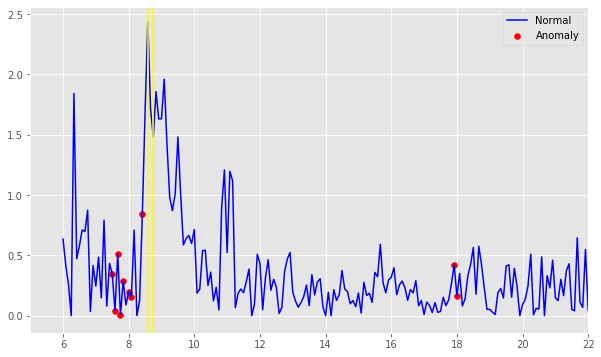

[]
[]
[7.5, 7.583, 7.667, 7.75, 7.833, 8.0, 8.083, 8.417, 17.917, 18.0]
0


C:\Users\Tenyu\Anaconda3\lib\site-packages\sklearn\ensemble\iforest.py:247: FutureWarning: behaviour="old" is deprecated and will be removed in version 0.22. Please use behaviour="new", which makes the decision_function change to match other anomaly detection algorithm API.
  FutureWarning)
C:\Users\Tenyu\Anaconda3\lib\site-packages\sklearn\ensemble\iforest.py:415: DeprecationWarning: threshold_ attribute is deprecated in 0.20 and will be removed in 0.22.
  " be removed in 0.22.", DeprecationWarning)
C:\Users\Tenyu\Anaconda3\lib\site-packages\ipykernel_launcher.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  app.launch_new_instance()


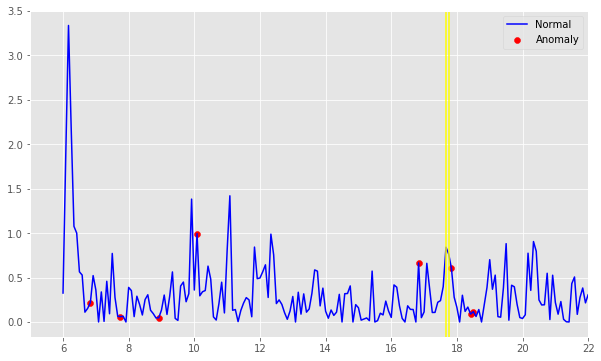

[]
[]
[6.833, 7.75, 8.917, 10.083, 16.833, 17.833, 18.417, 18.5]
0


C:\Users\Tenyu\Anaconda3\lib\site-packages\sklearn\ensemble\iforest.py:247: FutureWarning: behaviour="old" is deprecated and will be removed in version 0.22. Please use behaviour="new", which makes the decision_function change to match other anomaly detection algorithm API.
  FutureWarning)
C:\Users\Tenyu\Anaconda3\lib\site-packages\sklearn\ensemble\iforest.py:415: DeprecationWarning: threshold_ attribute is deprecated in 0.20 and will be removed in 0.22.
  " be removed in 0.22.", DeprecationWarning)
C:\Users\Tenyu\Anaconda3\lib\site-packages\ipykernel_launcher.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  app.launch_new_instance()


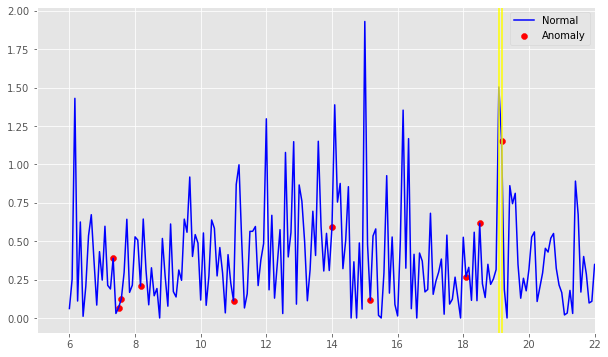

[]
[[19.167]]
[7.333, 7.5, 7.583, 8.167, 11.0, 14.0, 15.167, 18.083, 18.5, 19.167]
0.1


C:\Users\Tenyu\Anaconda3\lib\site-packages\sklearn\ensemble\iforest.py:247: FutureWarning: behaviour="old" is deprecated and will be removed in version 0.22. Please use behaviour="new", which makes the decision_function change to match other anomaly detection algorithm API.
  FutureWarning)
C:\Users\Tenyu\Anaconda3\lib\site-packages\sklearn\ensemble\iforest.py:415: DeprecationWarning: threshold_ attribute is deprecated in 0.20 and will be removed in 0.22.
  " be removed in 0.22.", DeprecationWarning)
C:\Users\Tenyu\Anaconda3\lib\site-packages\ipykernel_launcher.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  app.launch_new_instance()


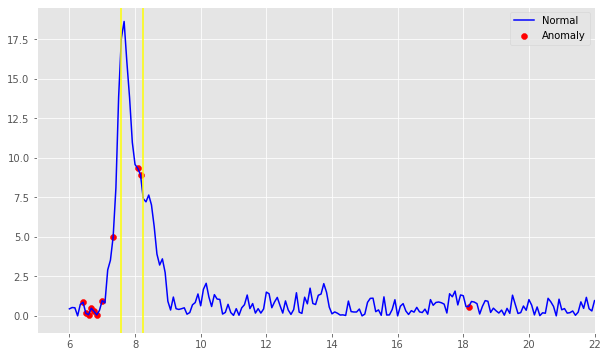

[]
[]
[6.417, 6.5, 6.583, 6.667, 6.75, 6.833, 7.0, 7.333, 8.083, 8.167, 18.167]
0.18


C:\Users\Tenyu\Anaconda3\lib\site-packages\sklearn\ensemble\iforest.py:247: FutureWarning: behaviour="old" is deprecated and will be removed in version 0.22. Please use behaviour="new", which makes the decision_function change to match other anomaly detection algorithm API.
  FutureWarning)
C:\Users\Tenyu\Anaconda3\lib\site-packages\sklearn\ensemble\iforest.py:415: DeprecationWarning: threshold_ attribute is deprecated in 0.20 and will be removed in 0.22.
  " be removed in 0.22.", DeprecationWarning)
C:\Users\Tenyu\Anaconda3\lib\site-packages\ipykernel_launcher.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  app.launch_new_instance()


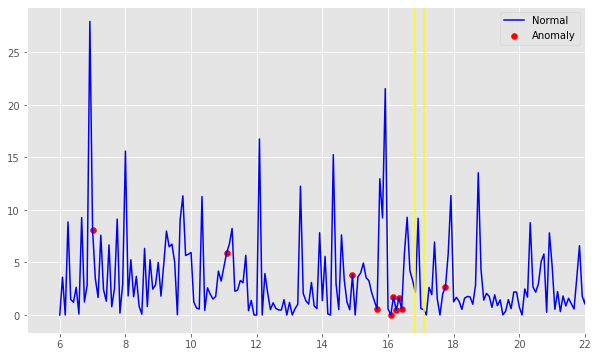

[]
[]
[7.0, 11.083, 14.917, 15.667, 16.083, 16.167, 16.25, 16.333, 16.417, 17.75]
0


C:\Users\Tenyu\Anaconda3\lib\site-packages\sklearn\ensemble\iforest.py:247: FutureWarning: behaviour="old" is deprecated and will be removed in version 0.22. Please use behaviour="new", which makes the decision_function change to match other anomaly detection algorithm API.
  FutureWarning)
C:\Users\Tenyu\Anaconda3\lib\site-packages\sklearn\ensemble\iforest.py:415: DeprecationWarning: threshold_ attribute is deprecated in 0.20 and will be removed in 0.22.
  " be removed in 0.22.", DeprecationWarning)
C:\Users\Tenyu\Anaconda3\lib\site-packages\ipykernel_launcher.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  app.launch_new_instance()


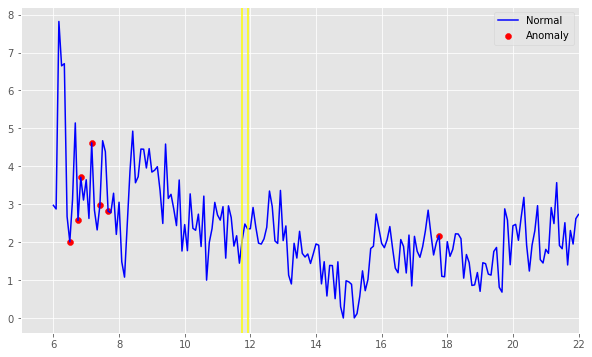

[]
[]
[6.5, 6.75, 6.833, 7.167, 7.417, 7.667, 17.75]
0


C:\Users\Tenyu\Anaconda3\lib\site-packages\sklearn\ensemble\iforest.py:247: FutureWarning: behaviour="old" is deprecated and will be removed in version 0.22. Please use behaviour="new", which makes the decision_function change to match other anomaly detection algorithm API.
  FutureWarning)
C:\Users\Tenyu\Anaconda3\lib\site-packages\sklearn\ensemble\iforest.py:415: DeprecationWarning: threshold_ attribute is deprecated in 0.20 and will be removed in 0.22.
  " be removed in 0.22.", DeprecationWarning)
C:\Users\Tenyu\Anaconda3\lib\site-packages\ipykernel_launcher.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  app.launch_new_instance()


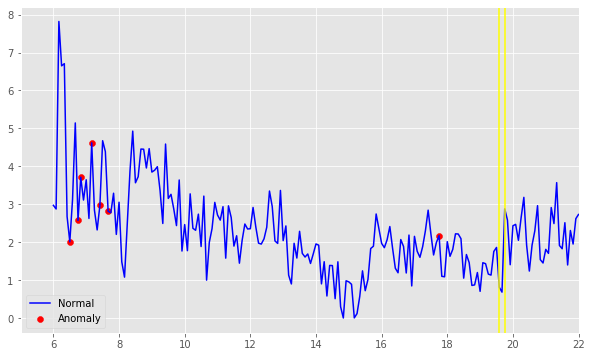

[]
[]
[6.5, 6.75, 6.833, 7.167, 7.417, 7.667, 17.75]
0
Counter({'False': 7, 'True': 6})
0
0.18
0.05846153846153846


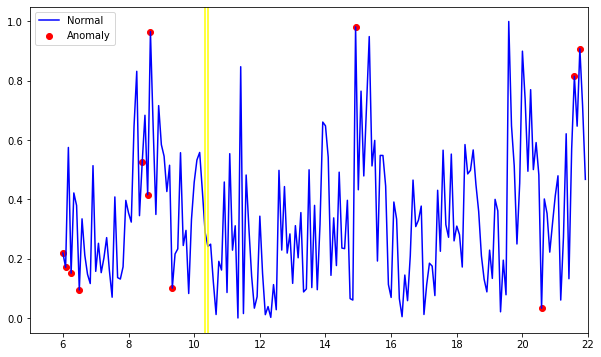

[]
[]
[6.0, 6.083, 6.25, 6.5, 8.417, 8.583, 8.667, 9.333, 14.917, 20.583, 21.583, 21.75]
0


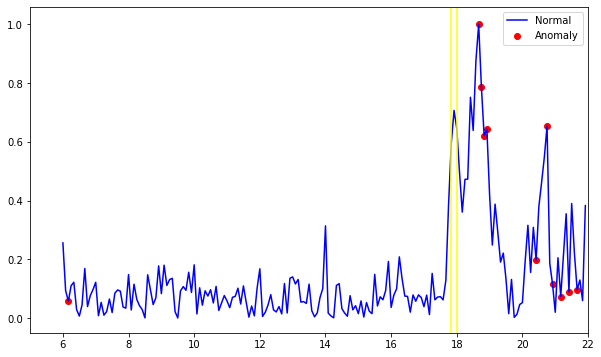

[]
[]
[6.167, 18.667, 18.75, 18.833, 18.917, 20.417, 20.75, 20.917, 21.167, 21.417, 21.667]
0


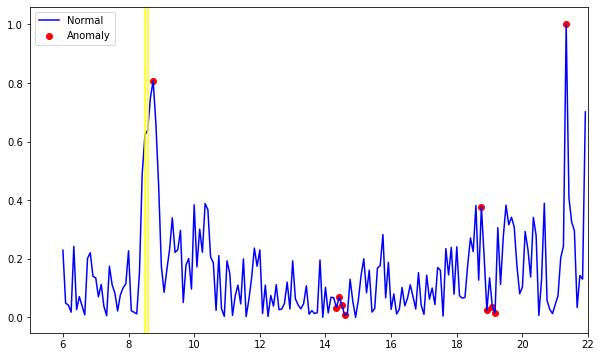

[]
[]
[8.75, 14.333, 14.417, 14.5, 14.583, 18.75, 18.917, 19.083, 19.167, 21.333]
0


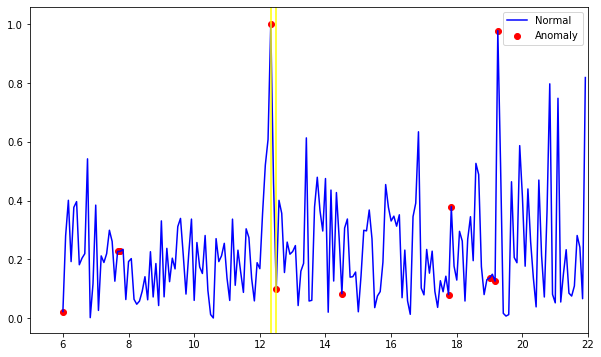

[[12.333]]
[[12.5]]
[6.0, 7.667, 7.75, 12.333, 12.5, 14.5, 17.75, 17.833, 19.0, 19.167, 19.25]
0.18


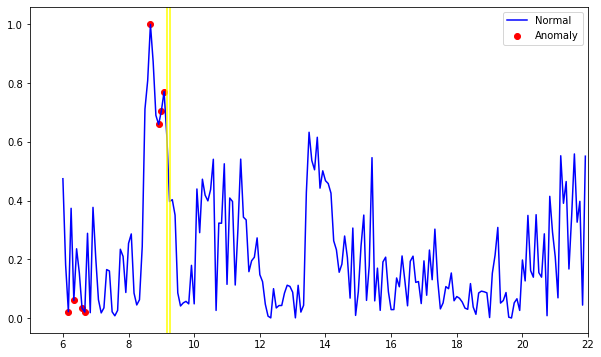

[]
[]
[6.167, 6.333, 6.583, 6.667, 8.667, 8.917, 9.0, 9.083]
0


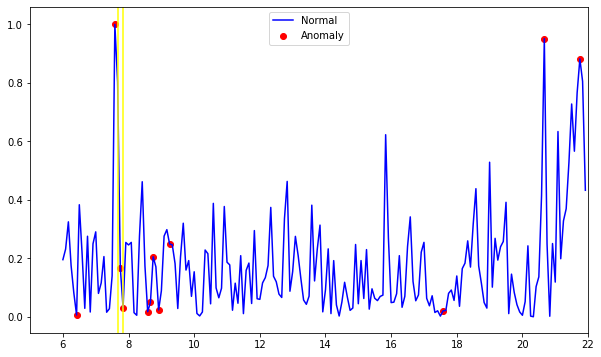

[]
[[7.75, 7.833]]
[6.417, 7.583, 7.75, 7.833, 8.583, 8.667, 8.75, 8.917, 9.25, 17.583, 20.667, 21.75]
0.17


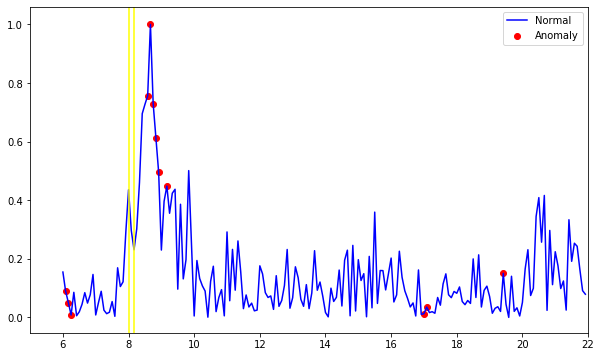

[]
[]
[6.083, 6.167, 6.25, 8.583, 8.667, 8.75, 8.833, 8.917, 9.167, 17.0, 17.083, 19.417]
0


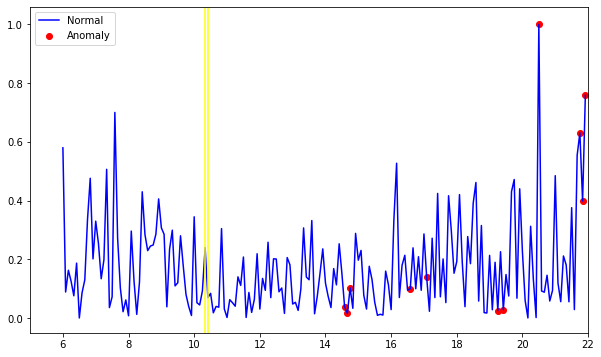

[]
[]
[14.583, 14.667, 14.75, 16.583, 17.083, 19.25, 19.417, 20.5, 21.75, 21.833, 21.917]
0


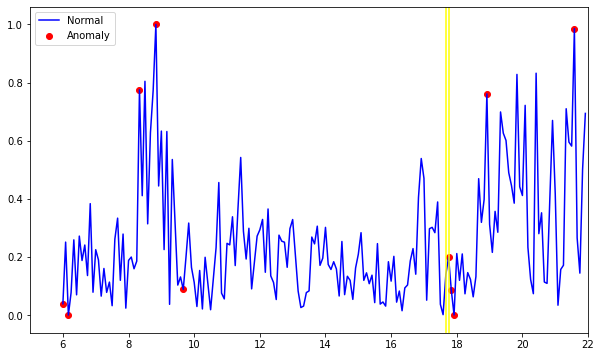

[]
[[17.75, 17.833, 17.917]]
[6.0, 6.167, 8.333, 8.833, 9.667, 17.75, 17.833, 17.917, 18.917, 21.583]
0.3


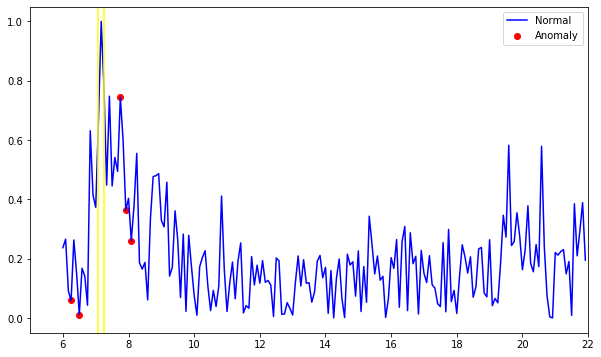

[]
[]
[6.25, 6.5, 7.75, 7.917, 8.083]
0


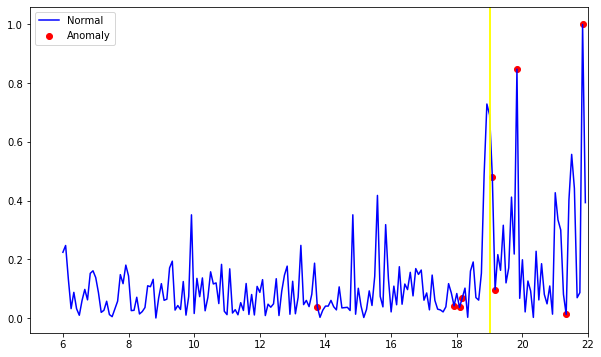

[]
[]
[13.75, 17.917, 18.083, 18.167, 19.083, 19.167, 19.833, 21.333, 21.833]
0


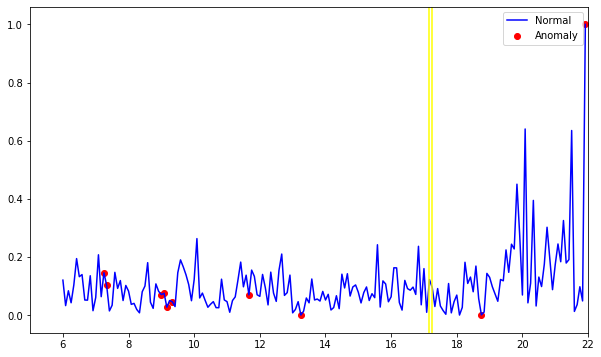

[]
[]
[7.25, 7.333, 9.0, 9.083, 9.167, 9.333, 11.667, 13.25, 18.75, 21.917]
0


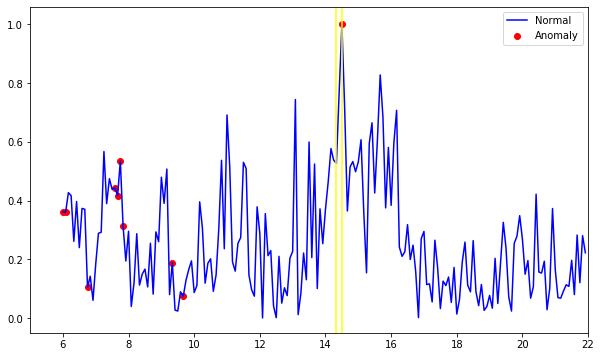

[]
[[14.5]]
[6.0, 6.083, 6.75, 7.583, 7.667, 7.75, 7.833, 9.333, 9.667, 14.5]
0.1


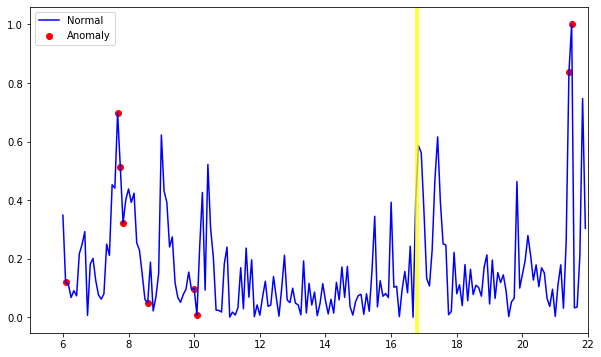

[]
[]
[6.083, 7.667, 7.75, 7.833, 8.583, 10.0, 10.083, 21.417, 21.5]
0


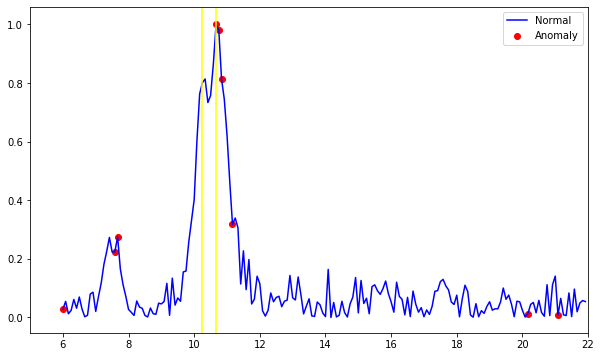

[]
[[10.667, 10.75, 10.833]]
[6.0, 7.583, 7.667, 10.667, 10.75, 10.833, 11.167, 20.167, 21.083]
0.33
Counter({'False': 10, 'True': 5})
0
0.33
0.072


In [30]:
df

,Time,EXIT_DIFF,TT_DIFF,ACC_DIFF,LINE_DIFF,anomaly
0,6.000,0.000000,0.028421,0.016218,0.012220,-1
1,6.083,0.006482,0.054786,0.010432,0.008828,1
2,6.167,0.017434,0.012826,0.017287,0.011565,1
3,6.250,0.011399,0.023911,0.018427,0.017343,1
4,6.333,0.025704,0.061354,0.038677,0.003699,1
...,...,...,...,...,...,...
187,21.583,0.075995,0.096896,0.076792,0.014185,1
188,21.667,0.087841,0.019454,0.082122,0.059543,1
189,21.750,0.266652,0.049357,0.061714,0.006014,1
190,21.833,0.025928,0.057740,0.058348,0.008251,1
